In [1]:
!pip install xgboost hyperopt

Defaulting to user installation because normal site-packages is not writeable


In [2]:
# Importing Libraries  
from functools import reduce
import gc  
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe 
from IPython.display import display, HTML  
import matplotlib.pyplot as plt 
import numpy as np 
import pandas as pd 
import plotly.express as px
import plotly.graph_objects as go 
import plotly.offline as py 
from plotly.subplots import make_subplots 
from sklearn.metrics import accuracy_score 
from sklearn.model_selection import train_test_split  
from sklearn.preprocessing import MinMaxScaler  
import seaborn as sns 
import warnings 
from xgboost import XGBRegressor  

py.init_notebook_mode(connected = True)  
pd.set_option('display.max_columns', None)  
warnings.filterwarnings('ignore')  

HTML("""
<style>
g.pointtext {display: none;}
</style>
""")

In [3]:
# Read All Datasets 
rating_df = pd.read_csv('MarchMadnessData/538 Ratings.csv')
ban_df = pd.read_csv('MarchMadnessData/Barttorvik Away-Neutral.csv')
ba_df = pd.read_csv('MarchMadnessData/Barttorvik Away.csv')
bh_df = pd.read_csv('MarchMadnessData/Barttorvik Home.csv')
bn_df = pd.read_csv('MarchMadnessData/Barttorvik Neutral.csv')
coach_res_df = pd.read_csv('MarchMadnessData/Coach Results.csv')
conf_res_df = pd.read_csv('MarchMadnessData/Conference Results.csv')
cs_df = pd.read_csv('MarchMadnessData/Conference Stats.csv')
csh_df = pd.read_csv('MarchMadnessData/Conference Stats Home.csv')
csa_df = pd.read_csv('MarchMadnessData/Conference Stats Away.csv')
csn_df = pd.read_csv('MarchMadnessData/Conference Stats Neutral.csv')
csan_df = pd.read_csv('MarchMadnessData/Conference Stats Away Neutral.csv')
hcti_df = pd.read_csv('MarchMadnessData/Heat Check Tournament Index.csv')
kb_df = pd.read_csv('MarchMadnessData/KenPom Barttorvik.csv')  
pv_df = pd.read_csv('MarchMadnessData/Preseason Votes.csv')
pp_df = pd.read_csv('MarchMadnessData/Public Picks.csv')
r_df = pd.read_csv('MarchMadnessData/Resumes.csv')
sr_df = pd.read_csv('MarchMadnessData/Seed Results.csv')
ss_df = pd.read_csv('MarchMadnessData/Shooting Splits.csv')
tr_df = pd.read_csv('MarchMadnessData/Team Results.csv')
tl_df = pd.read_csv('MarchMadnessData/Tournament Locations.csv')
tm_df = pd.read_csv('MarchMadnessData/Tournament Matchups.csv')  
ts_df = pd.read_csv('MarchMadnessData/Tournament Simulation.csv') 
uc_df = pd.read_csv('MarchMadnessData/Upset Count.csv')
usi_df = pd.read_csv('MarchMadnessData/Upset Seed Info.csv')

In [4]:
# Global Variables 
curr_year = 2024 
prev_year = curr_year - 1   
tournament_count = 15   

order_seed = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]    
round_str = ['CHAMPION', 'FINALS', 'FINAL 4', 'ELITE 8', 'SWEET 16', 'SECOND ROUND', 'FIRST ROUND', 'FIRST FOUR']  
round_str2 = ['FIRST ROUND', 'SECOND ROUND', 'SWEET 16', 'ELITE 8', 'FINAL 4', 'FINALS', 'CHAMPION']  
rounds_num = [1, 2, 4, 8, 16, 32, 64, 68]
rounds_num2 = [1, 2, 4, 8, 16, 32, 64] 

In [5]:
# Combine Datasets to create one comprehensive dataset for all tournament teams 
############################################################################### 

temp_kb_df = kb_df.copy()

temp_bh_df = bh_df.copy()  
# Add Prefix to indicate type of team stats (H = Home, A = Away, N = Neutral, AN = Away Neutral)
temp_bh_df = temp_bh_df.add_prefix('H ')                               
# Rename H TEAM NO column to TEAM NO because it will be the column used to merge 
temp_bh_df = temp_bh_df.rename(columns = {'H TEAM NO' : 'TEAM NO'}) 

temp_ba_df = ba_df.copy()
temp_ba_df = temp_ba_df.add_prefix('A ')
temp_ba_df = temp_ba_df.rename(columns = {'A TEAM NO' : 'TEAM NO'}) 

temp_bn_df = bn_df.copy()
temp_bn_df = temp_bn_df.add_prefix('N ')
temp_bn_df = temp_bn_df.rename(columns = {'N TEAM NO' : 'TEAM NO'}) 

temp_ban_df = ban_df.copy()
temp_ban_df = temp_ban_df.add_prefix('AN ')
temp_ban_df = temp_ban_df.rename(columns = {'AN TEAM NO' : 'TEAM NO'}) 

temp_hcti_df = hcti_df.copy()
temp_hcti_df = temp_hcti_df.rename(columns = {'YEAR' : 'HCTI YEAR', 'TEAM' : 'HCTI TEAM', 'SEED' : 'HCTI SEED', 'ROUND' : 'HCTI ROUND'}) 

temp_pv_df = pv_df.copy()
temp_pv_df = temp_pv_df.rename(columns = {'YEAR' : 'PV YEAR', 'TEAM' : 'PV TEAM', 'SEED' : 'PV SEED', 'ROUND' : 'PV ROUND'}) 

temp_ss_df = ss_df.copy()
temp_ss_df = temp_ss_df.rename(columns = {'YEAR' : 'SS YEAR', 'TEAM ID' : 'SS TEAM ID', 'TEAM' : 'SS TEAM', 'CONF' : 'SS CONF'}) 

temp_r_df = r_df.copy()
temp_r_df = temp_r_df.rename(columns = {'YEAR' : 'R YEAR', 'SEED' : 'R SEED', 'TEAM' : 'R TEAM', 'ROUND' : 'R ROUND'}) 

dfs = [temp_kb_df, temp_bh_df, temp_ba_df, temp_bn_df, temp_ban_df, temp_hcti_df, temp_pv_df, temp_ss_df, temp_r_df]              

# Merge all columns to make one dataframe consisting of all team stats 
complete_stats = reduce(lambda left, right: pd.merge(left, right, on = ['TEAM NO'], how = 'left'), dfs)  
# Drop redundant columns 
complete_stats.drop(['H YEAR', 'H TEAM ID', 'H TEAM', 'H SEED', 'H ROUND', 'A YEAR', 'A TEAM ID', 'A TEAM', 'A SEED', 'A ROUND', 
                     'N YEAR', 'N TEAM ID', 'N TEAM', 'N SEED', 'N ROUND', 'AN YEAR', 'AN TEAM ID', 'AN TEAM', 'AN SEED', 'AN ROUND',
                     'GAMES', 'W', 'L', 
                     'H GAMES', 'H W', 'H L', 'H TALENT', 'H EXP', 'H AVG HGT', 'H EFF HGT', 'A GAMES', 'A W', 'A L', 'A TALENT', 'A EXP', 'A AVG HGT', 'A EFF HGT', 
                     'N GAMES', 'N W', 'N L', 'N TALENT', 'N EXP', 'N AVG HGT', 'N EFF HGT', 'AN GAMES', 'AN W', 'AN L', 'AN TALENT', 'AN EXP', 'AN AVG HGT', 'AN EFF HGT',
                     'OP OREB%', 'OP DREB%', 'H OP OREB%', 'H OP DREB%', 'A OP OREB%', 'A OP DREB%', 'N OP OREB%', 'N OP DREB%', 'AN OP OREB%', 'AN OP DREB%',
                     'THREES FG%', 'THREES SHARE', 'THREES FG%D', 'THREES D SHARE', 
                     'H TALENT RANK', 'H EXP RANK', 'H AVG HGT RANK', 'H EFF HGT RANK', 'A TALENT RANK', 'A EXP RANK', 'A AVG HGT RANK', 'A EFF HGT RANK', 
                     'N TALENT RANK', 'N EXP RANK', 'N AVG HGT RANK', 'N EFF HGT RANK', 'AN TALENT RANK', 'AN EXP RANK', 'AN AVG HGT RANK', 'AN EFF HGT RANK',
                     'OP OREB% RANK', 'OP DREB% RANK', 
                     'H OP OREB% RANK', 'H OP DREB% RANK', 'A OP OREB% RANK', 'A OP DREB% RANK', 'N OP OREB% RANK', 'N OP DREB% RANK', 'AN OP OREB% RANK', 'AN OP DREB% RANK',
                     'THREES FG% RANK', 'THREES SHARE RANK', 'THREES FG%D RANK', 'THREES D SHARE RANK', 
                     'HCTI YEAR', 'HCTI TEAM', 'HCTI SEED', 'HCTI ROUND', 'PV YEAR', 'PV TEAM', 'PV SEED', 'PV ROUND', 
                     'SS YEAR', 'SS TEAM ID', 'SS TEAM', 'SS CONF',
                     'R YEAR', 'R SEED', 'R TEAM', 'R ROUND', 'WINS', 'RANK?'], 
                     inplace = True, axis = 1)

# Create new stats  
complete_stats['A BADJ EM RANK DIFF'] = complete_stats['BADJ EM RANK'] - complete_stats['A BADJ EM RANK']
complete_stats['AN BADJ EM RANK DIFF'] = complete_stats['BADJ EM RANK'] - complete_stats['AN BADJ EM RANK']
complete_stats['A BADJ O RANK DIFF'] = complete_stats['BADJ O RANK'] - complete_stats['A BADJ O RANK']
complete_stats['AN BADJ O RANK DIFF'] = complete_stats['BADJ O RANK'] - complete_stats['AN BADJ O RANK']
complete_stats['A BADJ D RANK DIFF'] = complete_stats['BADJ D RANK'] - complete_stats['A BADJ D RANK']
complete_stats['AN BADJ D RANK DIFF'] = complete_stats['BADJ D RANK'] - complete_stats['AN BADJ D RANK'] 

# Remove the First Four Round as that is irrelevant to the EDA and Machine Learning Model  
complete_stats = complete_stats.loc[complete_stats['ROUND'].ne(68)]

#  Delete unused variables to mitigate memory error problems  
del temp_kb_df, temp_bh_df, temp_ba_df, temp_bn_df, temp_ban_df, temp_hcti_df, temp_pv_df, temp_ss_df, temp_r_df  
complete_stats.head()  

,YEAR,CONF,CONF ID,QUAD NO,QUAD ID,TEAM NO,TEAM ID,TEAM,SEED,ROUND,K TEMPO,K TEMPO RANK,KADJ T,KADJ T RANK,K OFF,KO RANK,KADJ O,KADJ O RANK,K DEF,KD RANK,KADJ D,KADJ D RANK,KADJ EM,KADJ EM RANK,BADJ EM,BADJ O,BADJ D,BARTHAG,WIN%,EFG%,EFG%D,FTR,FTRD,TOV%,TOV%D,OREB%,DREB%,RAW T,2PT%,2PT%D,3PT%,3PT%D,BLK%,BLKED%,AST%,OP AST%,2PTR,3PTR,2PTRD,3PTRD,BADJ T,AVG HGT,EFF HGT,EXP,TALENT,FT%,OP FT%,PPPO,PPPD,ELITE SOS,WAB,BADJ EM RANK,BADJ O RANK,BADJ D RANK,BARTHAG RANK,EFG% RANK,EFGD% RANK,FTR RANK,FTRD RANK,TOV% RANK,TOV%D RANK,OREB% RANK,DREB% RANK,RAW T RANK,2PT% RANK,2PT%D RANK,3PT% RANK,3PT%D RANK,BLK% RANK,BLKED% RANK,AST% RANK,OP AST% RANK,2PTR RANK,3PTR RANK,2PTRD RANK,3PTRD RANK,BADJT RANK,AVG HGT RANK,EFF HGT RANK,EXP RANK,TALENT RANK,FT% RANK,OP FT% RANK,PPPO RANK,PPPD RANK,ELITE SOS RANK,H BADJ EM,H BADJ O,H BADJ D,H BARTHAG,H WIN%,H EFG%,H EFG%D,H FTR,H FTRD,H TOV%,H TOV%D,H OREB%,H DREB%,H RAW T,H 2PT%,H 2PT%D,H 3PT%,H 3PT%D,H BLK%,H BLKED%,H AST%,H OP AST%,H 2PTR,H 3PTR,H 2PTRD,H 3PTRD,H BADJ T,H FT%,H OP FT%,H PPPO,H PPPD,H ELITE SOS,H WAB,H BADJ EM RANK,H BADJ O RANK,H BADJ D RANK,H BARTHAG RANK,H EFG% RANK,H EFGD% RANK,H FTR RANK,H FTRD RANK,H TOV% RANK,H TOV%D RANK,H OREB% RANK,H DREB% RANK,H RAW T RANK,H 2PT% RANK,H 2PT%D RANK,H 3PT% RANK,H 3PT%D RANK,H BLK% RANK,H BLKED% RANK,H AST% RANK,H OP AST% RANK,H 2PTR RANK,H 3PTR RANK,H 2PTRD RANK,H 3PTRD RANK,H BADJT RANK,H FT% RANK,H OP FT% RANK,H PPPO RANK,H PPPD RANK,H ELITE SOS RANK,A BADJ EM,A BADJ O,A BADJ D,A BARTHAG,A WIN%,A EFG%,A EFG%D,A FTR,A FTRD,A TOV%,A TOV%D,A OREB%,A DREB%,A RAW T,A 2PT%,A 2PT%D,A 3PT%,A 3PT%D,A BLK%,A BLKED%,A AST%,A OP AST%,A 2PTR,A 3PTR,A 2PTRD,A 3PTRD,A BADJ T,A FT%,A OP FT%,A PPPO,A PPPD,A ELITE SOS,A WAB,A BADJ EM RANK,A BADJ O RANK,A BADJ D RANK,A BARTHAG RANK,A EFG% RANK,A EFGD% RANK,A FTR RANK,A FTRD RANK,A TOV% RANK,A TOV%D RANK,A OREB% RANK,A DREB% RANK,A RAW T RANK,A 2PT% RANK,A 2PT%D RANK,A 3PT% RANK,A 3PT%D RANK,A BLK% RANK,A BLKED% RANK,A AST% RANK,A OP AST% RANK,A 2PTR RANK,A 3PTR RANK,A 2PTRD RANK,A 3PTRD RANK,A BADJT RANK,A FT% RANK,A OP FT% RANK,A PPPO RANK,A PPPD RANK,A ELITE SOS RANK,N BADJ EM,N BADJ O,N BADJ D,N BARTHAG,N WIN%,N EFG%,N EFG%D,N FTR,N FTRD,N TOV%,N TOV%D,N OREB%,N DREB%,N RAW T,N 2PT%,N 2PT%D,N 3PT%,N 3PT%D,N BLK%,N BLKED%,N AST%,N OP AST%,N 2PTR,N 3PTR,N 2PTRD,N 3PTRD,N BADJ T,N FT%,N OP FT%,N PPPO,N PPPD,N ELITE SOS,N WAB,N BADJ EM RANK,N BADJ O RANK,N BADJ D RANK,N BARTHAG RANK,N EFG% RANK,N EFGD% RANK,N FTR RANK,N FTRD RANK,N TOV% RANK,N TOV%D RANK,N OREB% RANK,N DREB% RANK,N RAW T RANK,N 2PT% RANK,N 2PT%D RANK,N 3PT% RANK,N 3PT%D RANK,N BLK% RANK,N BLKED% RANK,N AST% RANK,N OP AST% RANK,N 2PTR RANK,N 3PTR RANK,N 2PTRD RANK,N 3PTRD RANK,N BADJT RANK,N FT% RANK,N OP FT% RANK,N PPPO RANK,N PPPD RANK,N ELITE SOS RANK,AN BADJ EM,AN BADJ O,AN BADJ D,AN BARTHAG,AN WIN%,AN EFG%,AN EFG%D,AN FTR,AN FTRD,AN TOV%,AN TOV%D,AN OREB%,AN DREB%,AN RAW T,AN 2PT%,AN 2PT%D,AN 3PT%,AN 3PT%D,AN BLK%,AN BLKED%,AN AST%,AN OP AST%,AN 2PTR,AN 3PTR,AN 2PTRD,AN 3PTRD,AN BADJ T,AN FT%,AN OP FT%,AN PPPO,AN PPPD,AN ELITE SOS,AN WAB,AN BADJ EM RANK,AN BADJ O RANK,AN BADJ D RANK,AN BARTHAG RANK,AN EFG% RANK,AN EFGD% RANK,AN FTR RANK,AN FTRD RANK,AN TOV% RANK,AN TOV%D RANK,AN OREB% RANK,AN DREB% RANK,AN RAW T RANK,AN 2PT% RANK,AN 2PT%D RANK,AN 3PT% RANK,AN 3PT%D RANK,AN BLK% RANK,AN BLKED% RANK,AN AST% RANK,AN OP AST% RANK,AN 2PTR RANK,AN 3PTR RANK,AN 2PTRD RANK,AN 3PTRD RANK,AN BADJT RANK,AN FT% RANK,AN OP FT% RANK,AN PPPO RANK,AN PPPD RANK,AN ELITE SOS RANK,POWER,PATH,DRAW,POOL VALUE,POOL S-RANK,NCAA S-RANK,VAL Z-SCORE,POWER-PATH,AP VOTES,AP RANK,DUNKS FG%,DUNKS SHARE,DUNKS FG%D,DUNKS D SHARE,CLOSE TWOS FG%,CLOSE TWOS SHARE,CLOSE TWOS FG%D,CLOSE TWOS D SHARE,FARTHER TWOS FG%,FARTHER TWOS SHARE,FARTHER TWOS FG%D,FARTHER TWOS D SHARE,DUNKS FG% RANK,DUNKS SHARE RANK,DUNKS FG%D RANK,DUNKS D SHARE RANK,CLOSE TWOS FG% RANK,CLOSE TWOS SHARE RANK,CLOSE TWOS FG%D RANK,CLOSE TWOS D SHARE RANK,FARTHER TWOS FG% RANK,FARTHER TWOS SHARE RANK,F

In [6]:
# Create dataframe of tournament matchups  
#########################################  

temp_complete_stats = complete_stats.drop(['YEAR', 'TEAM', 'SEED', 'ROUND'], axis = 1)
# Create temp dataframe too add sections of it to the tm dataframe 
temp = pd.merge(tm_df, temp_complete_stats, how = 'left', on = ['TEAM NO']) 
tm = pd.DataFrame()

temp['OUTCOME'] = ''
rounds = [64, 32, 16, 8, 4, 2]

# Create Outcome column to indicate winning and losing teams per matchup (0 = Losing Team, 1 = Winning Team)
for rnd in rounds : 
    df = temp.loc[temp['CURRENT ROUND'] == rnd]
    df = df.reset_index(drop = True) 
    df.loc[df['ROUND'] != rnd, 'OUTCOME'] = 1 
    df.loc[df['ROUND'] == rnd, 'OUTCOME'] = 0
    tm = pd.concat([tm, df], ignore_index = True, sort = False)
    
del temp, df 
tm.head()

,YEAR,BY YEAR NO,BY ROUND NO,TEAM NO,TEAM,SEED,ROUND,CURRENT ROUND,SCORE,CONF,CONF ID,QUAD NO,QUAD ID,TEAM ID,K TEMPO,K TEMPO RANK,KADJ T,KADJ T RANK,K OFF,KO RANK,KADJ O,KADJ O RANK,K DEF,KD RANK,KADJ D,KADJ D RANK,KADJ EM,KADJ EM RANK,BADJ EM,BADJ O,BADJ D,BARTHAG,WIN%,EFG%,EFG%D,FTR,FTRD,TOV%,TOV%D,OREB%,DREB%,RAW T,2PT%,2PT%D,3PT%,3PT%D,BLK%,BLKED%,AST%,OP AST%,2PTR,3PTR,2PTRD,3PTRD,BADJ T,AVG HGT,EFF HGT,EXP,TALENT,FT%,OP FT%,PPPO,PPPD,ELITE SOS,WAB,BADJ EM RANK,BADJ O RANK,BADJ D RANK,BARTHAG RANK,EFG% RANK,EFGD% RANK,FTR RANK,FTRD RANK,TOV% RANK,TOV%D RANK,OREB% RANK,DREB% RANK,RAW T RANK,2PT% RANK,2PT%D RANK,3PT% RANK,3PT%D RANK,BLK% RANK,BLKED% RANK,AST% RANK,OP AST% RANK,2PTR RANK,3PTR RANK,2PTRD RANK,3PTRD RANK,BADJT RANK,AVG HGT RANK,EFF HGT RANK,EXP RANK,TALENT RANK,FT% RANK,OP FT% RANK,PPPO RANK,PPPD RANK,ELITE SOS RANK,H BADJ EM,H BADJ O,H BADJ D,H BARTHAG,H WIN%,H EFG%,H EFG%D,H FTR,H FTRD,H TOV%,H TOV%D,H OREB%,H DREB%,H RAW T,H 2PT%,H 2PT%D,H 3PT%,H 3PT%D,H BLK%,H BLKED%,H AST%,H OP AST%,H 2PTR,H 3PTR,H 2PTRD,H 3PTRD,H BADJ T,H FT%,H OP FT%,H PPPO,H PPPD,H ELITE SOS,H WAB,H BADJ EM RANK,H BADJ O RANK,H BADJ D RANK,H BARTHAG RANK,H EFG% RANK,H EFGD% RANK,H FTR RANK,H FTRD RANK,H TOV% RANK,H TOV%D RANK,H OREB% RANK,H DREB% RANK,H RAW T RANK,H 2PT% RANK,H 2PT%D RANK,H 3PT% RANK,H 3PT%D RANK,H BLK% RANK,H BLKED% RANK,H AST% RANK,H OP AST% RANK,H 2PTR RANK,H 3PTR RANK,H 2PTRD RANK,H 3PTRD RANK,H BADJT RANK,H FT% RANK,H OP FT% RANK,H PPPO RANK,H PPPD RANK,H ELITE SOS RANK,A BADJ EM,A BADJ O,A BADJ D,A BARTHAG,A WIN%,A EFG%,A EFG%D,A FTR,A FTRD,A TOV%,A TOV%D,A OREB%,A DREB%,A RAW T,A 2PT%,A 2PT%D,A 3PT%,A 3PT%D,A BLK%,A BLKED%,A AST%,A OP AST%,A 2PTR,A 3PTR,A 2PTRD,A 3PTRD,A BADJ T,A FT%,A OP FT%,A PPPO,A PPPD,A ELITE SOS,A WAB,A BADJ EM RANK,A BADJ O RANK,A BADJ D RANK,A BARTHAG RANK,A EFG% RANK,A EFGD% RANK,A FTR RANK,A FTRD RANK,A TOV% RANK,A TOV%D RANK,A OREB% RANK,A DREB% RANK,A RAW T RANK,A 2PT% RANK,A 2PT%D RANK,A 3PT% RANK,A 3PT%D RANK,A BLK% RANK,A BLKED% RANK,A AST% RANK,A OP AST% RANK,A 2PTR RANK,A 3PTR RANK,A 2PTRD RANK,A 3PTRD RANK,A BADJT RANK,A FT% RANK,A OP FT% RANK,A PPPO RANK,A PPPD RANK,A ELITE SOS RANK,N BADJ EM,N BADJ O,N BADJ D,N BARTHAG,N WIN%,N EFG%,N EFG%D,N FTR,N FTRD,N TOV%,N TOV%D,N OREB%,N DREB%,N RAW T,N 2PT%,N 2PT%D,N 3PT%,N 3PT%D,N BLK%,N BLKED%,N AST%,N OP AST%,N 2PTR,N 3PTR,N 2PTRD,N 3PTRD,N BADJ T,N FT%,N OP FT%,N PPPO,N PPPD,N ELITE SOS,N WAB,N BADJ EM RANK,N BADJ O RANK,N BADJ D RANK,N BARTHAG RANK,N EFG% RANK,N EFGD% RANK,N FTR RANK,N FTRD RANK,N TOV% RANK,N TOV%D RANK,N OREB% RANK,N DREB% RANK,N RAW T RANK,N 2PT% RANK,N 2PT%D RANK,N 3PT% RANK,N 3PT%D RANK,N BLK% RANK,N BLKED% RANK,N AST% RANK,N OP AST% RANK,N 2PTR RANK,N 3PTR RANK,N 2PTRD RANK,N 3PTRD RANK,N BADJT RANK,N FT% RANK,N OP FT% RANK,N PPPO RANK,N PPPD RANK,N ELITE SOS RANK,AN BADJ EM,AN BADJ O,AN BADJ D,AN BARTHAG,AN WIN%,AN EFG%,AN EFG%D,AN FTR,AN FTRD,AN TOV%,AN TOV%D,AN OREB%,AN DREB%,AN RAW T,AN 2PT%,AN 2PT%D,AN 3PT%,AN 3PT%D,AN BLK%,AN BLKED%,AN AST%,AN OP AST%,AN 2PTR,AN 3PTR,AN 2PTRD,AN 3PTRD,AN BADJ T,AN FT%,AN OP FT%,AN PPPO,AN PPPD,AN ELITE SOS,AN WAB,AN BADJ EM RANK,AN BADJ O RANK,AN BADJ D RANK,AN BARTHAG RANK,AN EFG% RANK,AN EFGD% RANK,AN FTR RANK,AN FTRD RANK,AN TOV% RANK,AN TOV%D RANK,AN OREB% RANK,AN DREB% RANK,AN RAW T RANK,AN 2PT% RANK,AN 2PT%D RANK,AN 3PT% RANK,AN 3PT%D RANK,AN BLK% RANK,AN BLKED% RANK,AN AST% RANK,AN OP AST% RANK,AN 2PTR RANK,AN 3PTR RANK,AN 2PTRD RANK,AN 3PTRD RANK,AN BADJT RANK,AN FT% RANK,AN OP FT% RANK,AN PPPO RANK,AN PPPD RANK,AN ELITE SOS RANK,POWER,PATH,DRAW,POOL VALUE,POOL S-RANK,NCAA S-RANK,VAL Z-SCORE,POWER-PATH,AP VOTES,AP RANK,DUNKS FG%,DUNKS SHARE,DUNKS FG%D,DUNKS D SHARE,CLOSE TWOS FG%,CLOSE TWOS SHARE,CLOSE TWOS FG%D,CLOSE TWOS D SHARE,FARTHER TWOS FG%,FARTHER TWOS SHARE,FARTHER TWOS FG%D,FARTHER TWOS D SHARE,DUNKS FG% RANK,DUNKS SHARE RANK,DUNKS FG%D RANK,DUNKS D SHARE RANK,CLOSE TWOS FG% RANK,CLOSE TWOS SHARE RANK,CLOSE TWOS FG%D RANK,CLOSE TWOS D SHARE RANK,FART

In [7]:
# Order the teams in W - L order  
################################  

# Create dataframe of all winning teams 
win = tm.loc[tm['OUTCOME'] == 1] 
win = win.reset_index(drop = True)   

# Create dataframe of all losing teams 
loss = tm.loc[tm['OUTCOME'] == 0] 
loss = loss.reset_index(drop = True)   

# Change indexes of rows to have the winning team as the first row and the losing team as the second row per two rows 
win['INDEX'] = np.arange(0, len(win) * 2, 2)
loss['INDEX'] = np.arange(1, len(win) * 2, 2)

# Set the index column as the row index 
win = win.set_index('INDEX')
loss = loss.set_index('INDEX')

# Combine the win and loss dataframes to create the tournament matchups in order 
ordered_df = pd.concat([win, loss], axis = 0)
ordered_df = ordered_df.rename_axis(None, axis = 0)
ordered_df  = ordered_df.sort_index(ascending = True)
ordered_df2 = ordered_df.copy()

del win, loss 
ordered_df.head()

,YEAR,BY YEAR NO,BY ROUND NO,TEAM NO,TEAM,SEED,ROUND,CURRENT ROUND,SCORE,CONF,CONF ID,QUAD NO,QUAD ID,TEAM ID,K TEMPO,K TEMPO RANK,KADJ T,KADJ T RANK,K OFF,KO RANK,KADJ O,KADJ O RANK,K DEF,KD RANK,KADJ D,KADJ D RANK,KADJ EM,KADJ EM RANK,BADJ EM,BADJ O,BADJ D,BARTHAG,WIN%,EFG%,EFG%D,FTR,FTRD,TOV%,TOV%D,OREB%,DREB%,RAW T,2PT%,2PT%D,3PT%,3PT%D,BLK%,BLKED%,AST%,OP AST%,2PTR,3PTR,2PTRD,3PTRD,BADJ T,AVG HGT,EFF HGT,EXP,TALENT,FT%,OP FT%,PPPO,PPPD,ELITE SOS,WAB,BADJ EM RANK,BADJ O RANK,BADJ D RANK,BARTHAG RANK,EFG% RANK,EFGD% RANK,FTR RANK,FTRD RANK,TOV% RANK,TOV%D RANK,OREB% RANK,DREB% RANK,RAW T RANK,2PT% RANK,2PT%D RANK,3PT% RANK,3PT%D RANK,BLK% RANK,BLKED% RANK,AST% RANK,OP AST% RANK,2PTR RANK,3PTR RANK,2PTRD RANK,3PTRD RANK,BADJT RANK,AVG HGT RANK,EFF HGT RANK,EXP RANK,TALENT RANK,FT% RANK,OP FT% RANK,PPPO RANK,PPPD RANK,ELITE SOS RANK,H BADJ EM,H BADJ O,H BADJ D,H BARTHAG,H WIN%,H EFG%,H EFG%D,H FTR,H FTRD,H TOV%,H TOV%D,H OREB%,H DREB%,H RAW T,H 2PT%,H 2PT%D,H 3PT%,H 3PT%D,H BLK%,H BLKED%,H AST%,H OP AST%,H 2PTR,H 3PTR,H 2PTRD,H 3PTRD,H BADJ T,H FT%,H OP FT%,H PPPO,H PPPD,H ELITE SOS,H WAB,H BADJ EM RANK,H BADJ O RANK,H BADJ D RANK,H BARTHAG RANK,H EFG% RANK,H EFGD% RANK,H FTR RANK,H FTRD RANK,H TOV% RANK,H TOV%D RANK,H OREB% RANK,H DREB% RANK,H RAW T RANK,H 2PT% RANK,H 2PT%D RANK,H 3PT% RANK,H 3PT%D RANK,H BLK% RANK,H BLKED% RANK,H AST% RANK,H OP AST% RANK,H 2PTR RANK,H 3PTR RANK,H 2PTRD RANK,H 3PTRD RANK,H BADJT RANK,H FT% RANK,H OP FT% RANK,H PPPO RANK,H PPPD RANK,H ELITE SOS RANK,A BADJ EM,A BADJ O,A BADJ D,A BARTHAG,A WIN%,A EFG%,A EFG%D,A FTR,A FTRD,A TOV%,A TOV%D,A OREB%,A DREB%,A RAW T,A 2PT%,A 2PT%D,A 3PT%,A 3PT%D,A BLK%,A BLKED%,A AST%,A OP AST%,A 2PTR,A 3PTR,A 2PTRD,A 3PTRD,A BADJ T,A FT%,A OP FT%,A PPPO,A PPPD,A ELITE SOS,A WAB,A BADJ EM RANK,A BADJ O RANK,A BADJ D RANK,A BARTHAG RANK,A EFG% RANK,A EFGD% RANK,A FTR RANK,A FTRD RANK,A TOV% RANK,A TOV%D RANK,A OREB% RANK,A DREB% RANK,A RAW T RANK,A 2PT% RANK,A 2PT%D RANK,A 3PT% RANK,A 3PT%D RANK,A BLK% RANK,A BLKED% RANK,A AST% RANK,A OP AST% RANK,A 2PTR RANK,A 3PTR RANK,A 2PTRD RANK,A 3PTRD RANK,A BADJT RANK,A FT% RANK,A OP FT% RANK,A PPPO RANK,A PPPD RANK,A ELITE SOS RANK,N BADJ EM,N BADJ O,N BADJ D,N BARTHAG,N WIN%,N EFG%,N EFG%D,N FTR,N FTRD,N TOV%,N TOV%D,N OREB%,N DREB%,N RAW T,N 2PT%,N 2PT%D,N 3PT%,N 3PT%D,N BLK%,N BLKED%,N AST%,N OP AST%,N 2PTR,N 3PTR,N 2PTRD,N 3PTRD,N BADJ T,N FT%,N OP FT%,N PPPO,N PPPD,N ELITE SOS,N WAB,N BADJ EM RANK,N BADJ O RANK,N BADJ D RANK,N BARTHAG RANK,N EFG% RANK,N EFGD% RANK,N FTR RANK,N FTRD RANK,N TOV% RANK,N TOV%D RANK,N OREB% RANK,N DREB% RANK,N RAW T RANK,N 2PT% RANK,N 2PT%D RANK,N 3PT% RANK,N 3PT%D RANK,N BLK% RANK,N BLKED% RANK,N AST% RANK,N OP AST% RANK,N 2PTR RANK,N 3PTR RANK,N 2PTRD RANK,N 3PTRD RANK,N BADJT RANK,N FT% RANK,N OP FT% RANK,N PPPO RANK,N PPPD RANK,N ELITE SOS RANK,AN BADJ EM,AN BADJ O,AN BADJ D,AN BARTHAG,AN WIN%,AN EFG%,AN EFG%D,AN FTR,AN FTRD,AN TOV%,AN TOV%D,AN OREB%,AN DREB%,AN RAW T,AN 2PT%,AN 2PT%D,AN 3PT%,AN 3PT%D,AN BLK%,AN BLKED%,AN AST%,AN OP AST%,AN 2PTR,AN 3PTR,AN 2PTRD,AN 3PTRD,AN BADJ T,AN FT%,AN OP FT%,AN PPPO,AN PPPD,AN ELITE SOS,AN WAB,AN BADJ EM RANK,AN BADJ O RANK,AN BADJ D RANK,AN BARTHAG RANK,AN EFG% RANK,AN EFGD% RANK,AN FTR RANK,AN FTRD RANK,AN TOV% RANK,AN TOV%D RANK,AN OREB% RANK,AN DREB% RANK,AN RAW T RANK,AN 2PT% RANK,AN 2PT%D RANK,AN 3PT% RANK,AN 3PT%D RANK,AN BLK% RANK,AN BLKED% RANK,AN AST% RANK,AN OP AST% RANK,AN 2PTR RANK,AN 3PTR RANK,AN 2PTRD RANK,AN 3PTRD RANK,AN BADJT RANK,AN FT% RANK,AN OP FT% RANK,AN PPPO RANK,AN PPPD RANK,AN ELITE SOS RANK,POWER,PATH,DRAW,POOL VALUE,POOL S-RANK,NCAA S-RANK,VAL Z-SCORE,POWER-PATH,AP VOTES,AP RANK,DUNKS FG%,DUNKS SHARE,DUNKS FG%D,DUNKS D SHARE,CLOSE TWOS FG%,CLOSE TWOS SHARE,CLOSE TWOS FG%D,CLOSE TWOS D SHARE,FARTHER TWOS FG%,FARTHER TWOS SHARE,FARTHER TWOS FG%D,FARTHER TWOS D SHARE,DUNKS FG% RANK,DUNKS SHARE RANK,DUNKS FG%D RANK,DUNKS D SHARE RANK,CLOSE TWOS FG% RANK,CLOSE TWOS SHARE RANK,CLOSE TWOS FG%D RANK,CLOSE TWOS D SHARE RANK,FART

In [8]:
# Put the winning and losing teams in one row  
#############################################

odds = ordered_df.copy()
# Get all rows of odd index 
odds_df = odds.iloc[1::2]
# Change the columns to have the prefix "L" which indicates the losing teams 
odds_df = odds_df.add_prefix('L ')
odds_df = odds_df.reset_index(drop = True)

evens = ordered_df.copy()
# Get all rows of evens index  
evens_df = evens.iloc[::2]
# Change the columns to have the prefix "W" which indicates the winning teams  
evens_df = evens_df.add_prefix('W ')
evens_df = evens_df.reset_index(drop = True)

# Combine the odds and evens dataframes to create the combined tournament matchups  
tm2 = pd.concat([evens_df, odds_df], axis = 1) 
tm2 = tm2.sort_index(ascending = True)
del odds_df, evens_df 
tm2.head()

,W YEAR,W BY YEAR NO,W BY ROUND NO,W TEAM NO,W TEAM,W SEED,W ROUND,W CURRENT ROUND,W SCORE,W CONF,W CONF ID,W QUAD NO,W QUAD ID,W TEAM ID,W K TEMPO,W K TEMPO RANK,W KADJ T,W KADJ T RANK,W K OFF,W KO RANK,W KADJ O,W KADJ O RANK,W K DEF,W KD RANK,W KADJ D,W KADJ D RANK,W KADJ EM,W KADJ EM RANK,W BADJ EM,W BADJ O,W BADJ D,W BARTHAG,W WIN%,W EFG%,W EFG%D,W FTR,W FTRD,W TOV%,W TOV%D,W OREB%,W DREB%,W RAW T,W 2PT%,W 2PT%D,W 3PT%,W 3PT%D,W BLK%,W BLKED%,W AST%,W OP AST%,W 2PTR,W 3PTR,W 2PTRD,W 3PTRD,W BADJ T,W AVG HGT,W EFF HGT,W EXP,W TALENT,W FT%,W OP FT%,W PPPO,W PPPD,W ELITE SOS,W WAB,W BADJ EM RANK,W BADJ O RANK,W BADJ D RANK,W BARTHAG RANK,W EFG% RANK,W EFGD% RANK,W FTR RANK,W FTRD RANK,W TOV% RANK,W TOV%D RANK,W OREB% RANK,W DREB% RANK,W RAW T RANK,W 2PT% RANK,W 2PT%D RANK,W 3PT% RANK,W 3PT%D RANK,W BLK% RANK,W BLKED% RANK,W AST% RANK,W OP AST% RANK,W 2PTR RANK,W 3PTR RANK,W 2PTRD RANK,W 3PTRD RANK,W BADJT RANK,W AVG HGT RANK,W EFF HGT RANK,W EXP RANK,W TALENT RANK,W FT% RANK,W OP FT% RANK,W PPPO RANK,W PPPD RANK,W ELITE SOS RANK,W H BADJ EM,W H BADJ O,W H BADJ D,W H BARTHAG,W H WIN%,W H EFG%,W H EFG%D,W H FTR,W H FTRD,W H TOV%,W H TOV%D,W H OREB%,W H DREB%,W H RAW T,W H 2PT%,W H 2PT%D,W H 3PT%,W H 3PT%D,W H BLK%,W H BLKED%,W H AST%,W H OP AST%,W H 2PTR,W H 3PTR,W H 2PTRD,W H 3PTRD,W H BADJ T,W H FT%,W H OP FT%,W H PPPO,W H PPPD,W H ELITE SOS,W H WAB,W H BADJ EM RANK,W H BADJ O RANK,W H BADJ D RANK,W H BARTHAG RANK,W H EFG% RANK,W H EFGD% RANK,W H FTR RANK,W H FTRD RANK,W H TOV% RANK,W H TOV%D RANK,W H OREB% RANK,W H DREB% RANK,W H RAW T RANK,W H 2PT% RANK,W H 2PT%D RANK,W H 3PT% RANK,W H 3PT%D RANK,W H BLK% RANK,W H BLKED% RANK,W H AST% RANK,W H OP AST% RANK,W H 2PTR RANK,W H 3PTR RANK,W H 2PTRD RANK,W H 3PTRD RANK,W H BADJT RANK,W H FT% RANK,W H OP FT% RANK,W H PPPO RANK,W H PPPD RANK,W H ELITE SOS RANK,W A BADJ EM,W A BADJ O,W A BADJ D,W A BARTHAG,W A WIN%,W A EFG%,W A EFG%D,W A FTR,W A FTRD,W A TOV%,W A TOV%D,W A OREB%,W A DREB%,W A RAW T,W A 2PT%,W A 2PT%D,W A 3PT%,W A 3PT%D,W A BLK%,W A BLKED%,W A AST%,W A OP AST%,W A 2PTR,W A 3PTR,W A 2PTRD,W A 3PTRD,W A BADJ T,W A FT%,W A OP FT%,W A PPPO,W A PPPD,W A ELITE SOS,W A WAB,W A BADJ EM RANK,W A BADJ O RANK,W A BADJ D RANK,W A BARTHAG RANK,W A EFG% RANK,W A EFGD% RANK,W A FTR RANK,W A FTRD RANK,W A TOV% RANK,W A TOV%D RANK,W A OREB% RANK,W A DREB% RANK,W A RAW T RANK,W A 2PT% RANK,W A 2PT%D RANK,W A 3PT% RANK,W A 3PT%D RANK,W A BLK% RANK,W A BLKED% RANK,W A AST% RANK,W A OP AST% RANK,W A 2PTR RANK,W A 3PTR RANK,W A 2PTRD RANK,W A 3PTRD RANK,W A BADJT RANK,W A FT% RANK,W A OP FT% RANK,W A PPPO RANK,W A PPPD RANK,W A ELITE SOS RANK,W N BADJ EM,W N BADJ O,W N BADJ D,W N BARTHAG,W N WIN%,W N EFG%,W N EFG%D,W N FTR,W N FTRD,W N TOV%,W N TOV%D,W N OREB%,W N DREB%,W N RAW T,W N 2PT%,W N 2PT%D,W N 3PT%,W N 3PT%D,W N BLK%,W N BLKED%,W N AST%,W N OP AST%,W N 2PTR,W N 3PTR,W N 2PTRD,W N 3PTRD,W N BADJ T,W N FT%,W N OP FT%,W N PPPO,W N PPPD,W N ELITE SOS,W N WAB,W N BADJ EM RANK,W N BADJ O RANK,W N BADJ D RANK,W N BARTHAG RANK,W N EFG% RANK,W N EFGD% RANK,W N FTR RANK,W N FTRD RANK,W N TOV% RANK,W N TOV%D RANK,W N OREB% RANK,W N DREB% RANK,W N RAW T RANK,W N 2PT% RANK,W N 2PT%D RANK,W N 3PT% RANK,W N 3PT%D RANK,W N BLK% RANK,W N BLKED% RANK,W N AST% RANK,W N OP AST% RANK,W N 2PTR RANK,W N 3PTR RANK,W N 2PTRD RANK,W N 3PTRD RANK,W N BADJT RANK,W N FT% RANK,W N OP FT% RANK,W N PPPO RANK,W N PPPD RANK,W N ELITE SOS RANK,W AN BADJ EM,W AN BADJ O,W AN BADJ D,W AN BARTHAG,W AN WIN%,W AN EFG%,W AN EFG%D,W AN FTR,W AN FTRD,W AN TOV%,W AN TOV%D,W AN OREB%,W AN DREB%,W AN RAW T,W AN 2PT%,W AN 2PT%D,W AN 3PT%,W AN 3PT%D,W AN BLK%,W AN BLKED%,W AN AST%,W AN OP AST%,W AN 2PTR,W AN 3PTR,W AN 2PTRD,W AN 3PTRD,W AN BADJ T,W AN FT%,W AN OP FT%,W AN PPPO,W AN PPPD,W AN ELITE SOS,W AN WAB,W AN BADJ EM RANK,W AN BADJ O RANK,W AN BADJ D RANK,W AN BARTHAG RANK,W AN EFG% RANK,W AN EFGD% RANK,W AN FTR RANK,W AN FTRD RANK,W AN TOV% RANK,W AN TOV%D RANK,W AN OREB% RANK,W AN DREB% RANK,W AN RAW T RANK,W AN 2PT% RA

In [9]:
# Scale variables between a value of 0 to 1 for the tournament matchups  
#scaler = MinMaxScaler() 
removed_cols = ['YEAR', 'BY YEAR NO', 'BY ROUND NO', 'TEAM NO', 'TEAM', 'SEED', 'ROUND', 'CURRENT ROUND', 'CONF', 'CONF ID', 'QUAD NO', 'QUAD ID', 'TEAM ID', 'BID TYPE', 'OUTCOME']   
selected_cols = ordered_df.columns[~ordered_df.columns.isin(removed_cols)]
#ordered_df[selected_cols] = scaler.fit_transform(ordered_df[selected_cols])  
ordered_df.head()

,YEAR,BY YEAR NO,BY ROUND NO,TEAM NO,TEAM,SEED,ROUND,CURRENT ROUND,SCORE,CONF,CONF ID,QUAD NO,QUAD ID,TEAM ID,K TEMPO,K TEMPO RANK,KADJ T,KADJ T RANK,K OFF,KO RANK,KADJ O,KADJ O RANK,K DEF,KD RANK,KADJ D,KADJ D RANK,KADJ EM,KADJ EM RANK,BADJ EM,BADJ O,BADJ D,BARTHAG,WIN%,EFG%,EFG%D,FTR,FTRD,TOV%,TOV%D,OREB%,DREB%,RAW T,2PT%,2PT%D,3PT%,3PT%D,BLK%,BLKED%,AST%,OP AST%,2PTR,3PTR,2PTRD,3PTRD,BADJ T,AVG HGT,EFF HGT,EXP,TALENT,FT%,OP FT%,PPPO,PPPD,ELITE SOS,WAB,BADJ EM RANK,BADJ O RANK,BADJ D RANK,BARTHAG RANK,EFG% RANK,EFGD% RANK,FTR RANK,FTRD RANK,TOV% RANK,TOV%D RANK,OREB% RANK,DREB% RANK,RAW T RANK,2PT% RANK,2PT%D RANK,3PT% RANK,3PT%D RANK,BLK% RANK,BLKED% RANK,AST% RANK,OP AST% RANK,2PTR RANK,3PTR RANK,2PTRD RANK,3PTRD RANK,BADJT RANK,AVG HGT RANK,EFF HGT RANK,EXP RANK,TALENT RANK,FT% RANK,OP FT% RANK,PPPO RANK,PPPD RANK,ELITE SOS RANK,H BADJ EM,H BADJ O,H BADJ D,H BARTHAG,H WIN%,H EFG%,H EFG%D,H FTR,H FTRD,H TOV%,H TOV%D,H OREB%,H DREB%,H RAW T,H 2PT%,H 2PT%D,H 3PT%,H 3PT%D,H BLK%,H BLKED%,H AST%,H OP AST%,H 2PTR,H 3PTR,H 2PTRD,H 3PTRD,H BADJ T,H FT%,H OP FT%,H PPPO,H PPPD,H ELITE SOS,H WAB,H BADJ EM RANK,H BADJ O RANK,H BADJ D RANK,H BARTHAG RANK,H EFG% RANK,H EFGD% RANK,H FTR RANK,H FTRD RANK,H TOV% RANK,H TOV%D RANK,H OREB% RANK,H DREB% RANK,H RAW T RANK,H 2PT% RANK,H 2PT%D RANK,H 3PT% RANK,H 3PT%D RANK,H BLK% RANK,H BLKED% RANK,H AST% RANK,H OP AST% RANK,H 2PTR RANK,H 3PTR RANK,H 2PTRD RANK,H 3PTRD RANK,H BADJT RANK,H FT% RANK,H OP FT% RANK,H PPPO RANK,H PPPD RANK,H ELITE SOS RANK,A BADJ EM,A BADJ O,A BADJ D,A BARTHAG,A WIN%,A EFG%,A EFG%D,A FTR,A FTRD,A TOV%,A TOV%D,A OREB%,A DREB%,A RAW T,A 2PT%,A 2PT%D,A 3PT%,A 3PT%D,A BLK%,A BLKED%,A AST%,A OP AST%,A 2PTR,A 3PTR,A 2PTRD,A 3PTRD,A BADJ T,A FT%,A OP FT%,A PPPO,A PPPD,A ELITE SOS,A WAB,A BADJ EM RANK,A BADJ O RANK,A BADJ D RANK,A BARTHAG RANK,A EFG% RANK,A EFGD% RANK,A FTR RANK,A FTRD RANK,A TOV% RANK,A TOV%D RANK,A OREB% RANK,A DREB% RANK,A RAW T RANK,A 2PT% RANK,A 2PT%D RANK,A 3PT% RANK,A 3PT%D RANK,A BLK% RANK,A BLKED% RANK,A AST% RANK,A OP AST% RANK,A 2PTR RANK,A 3PTR RANK,A 2PTRD RANK,A 3PTRD RANK,A BADJT RANK,A FT% RANK,A OP FT% RANK,A PPPO RANK,A PPPD RANK,A ELITE SOS RANK,N BADJ EM,N BADJ O,N BADJ D,N BARTHAG,N WIN%,N EFG%,N EFG%D,N FTR,N FTRD,N TOV%,N TOV%D,N OREB%,N DREB%,N RAW T,N 2PT%,N 2PT%D,N 3PT%,N 3PT%D,N BLK%,N BLKED%,N AST%,N OP AST%,N 2PTR,N 3PTR,N 2PTRD,N 3PTRD,N BADJ T,N FT%,N OP FT%,N PPPO,N PPPD,N ELITE SOS,N WAB,N BADJ EM RANK,N BADJ O RANK,N BADJ D RANK,N BARTHAG RANK,N EFG% RANK,N EFGD% RANK,N FTR RANK,N FTRD RANK,N TOV% RANK,N TOV%D RANK,N OREB% RANK,N DREB% RANK,N RAW T RANK,N 2PT% RANK,N 2PT%D RANK,N 3PT% RANK,N 3PT%D RANK,N BLK% RANK,N BLKED% RANK,N AST% RANK,N OP AST% RANK,N 2PTR RANK,N 3PTR RANK,N 2PTRD RANK,N 3PTRD RANK,N BADJT RANK,N FT% RANK,N OP FT% RANK,N PPPO RANK,N PPPD RANK,N ELITE SOS RANK,AN BADJ EM,AN BADJ O,AN BADJ D,AN BARTHAG,AN WIN%,AN EFG%,AN EFG%D,AN FTR,AN FTRD,AN TOV%,AN TOV%D,AN OREB%,AN DREB%,AN RAW T,AN 2PT%,AN 2PT%D,AN 3PT%,AN 3PT%D,AN BLK%,AN BLKED%,AN AST%,AN OP AST%,AN 2PTR,AN 3PTR,AN 2PTRD,AN 3PTRD,AN BADJ T,AN FT%,AN OP FT%,AN PPPO,AN PPPD,AN ELITE SOS,AN WAB,AN BADJ EM RANK,AN BADJ O RANK,AN BADJ D RANK,AN BARTHAG RANK,AN EFG% RANK,AN EFGD% RANK,AN FTR RANK,AN FTRD RANK,AN TOV% RANK,AN TOV%D RANK,AN OREB% RANK,AN DREB% RANK,AN RAW T RANK,AN 2PT% RANK,AN 2PT%D RANK,AN 3PT% RANK,AN 3PT%D RANK,AN BLK% RANK,AN BLKED% RANK,AN AST% RANK,AN OP AST% RANK,AN 2PTR RANK,AN 3PTR RANK,AN 2PTRD RANK,AN 3PTRD RANK,AN BADJT RANK,AN FT% RANK,AN OP FT% RANK,AN PPPO RANK,AN PPPD RANK,AN ELITE SOS RANK,POWER,PATH,DRAW,POOL VALUE,POOL S-RANK,NCAA S-RANK,VAL Z-SCORE,POWER-PATH,AP VOTES,AP RANK,DUNKS FG%,DUNKS SHARE,DUNKS FG%D,DUNKS D SHARE,CLOSE TWOS FG%,CLOSE TWOS SHARE,CLOSE TWOS FG%D,CLOSE TWOS D SHARE,FARTHER TWOS FG%,FARTHER TWOS SHARE,FARTHER TWOS FG%D,FARTHER TWOS D SHARE,DUNKS FG% RANK,DUNKS SHARE RANK,DUNKS FG%D RANK,DUNKS D SHARE RANK,CLOSE TWOS FG% RANK,CLOSE TWOS SHARE RANK,CLOSE TWOS FG%D RANK,CLOSE TWOS D SHARE RANK,FART

In [10]:
# # Scale variables between a value of 0 to 1 for statistics of all teams  
# complete_stats_scaled = complete_stats.copy()
# selected_cols = complete_stats_scaled.columns[~complete_stats_scaled.columns.isin(removed_cols)] 
# complete_stats_scaled[selected_cols] = scaler.fit_transform(complete_stats_scaled[selected_cols])  
# complete_stats_scaled.head()

In [11]:
# Get difference of variables between winning and losing team 
#############################################################

removed_cols = ['YEAR', 'BY YEAR NO', 'BY ROUND NO', 'TEAM NO', 'TEAM', 'SEED', 'ROUND', 'CURRENT ROUND', 'CONF', 'CONF ID', 'QUAD NO', 
                'QUAD ID', 'TEAM ID', 'BID TYPE', 'OUTCOME'] 
selected_cols = tm.columns[~tm.columns.isin(removed_cols)] 

# Get the difference of every 2 rows 
odds = ordered_df[selected_cols].diff()
# Select all rows of odd index  
odds_df = odds.iloc[1::2]

# Get the difference of every 2 rows and flip the sign 
evens = - ordered_df[selected_cols].diff()
# Shift the values up one row  
evens = evens[selected_cols].shift(- 1)
# Select all rows of even index   
evens_df = evens.iloc[::2]

temp = ordered_df[removed_cols]

# Create dataframe of all matchup differentials 
ordered_diff = pd.concat([temp, evens_df], axis = 1) 
ordered_diff = pd.concat([ordered_diff, odds_df], axis = 0) 
ordered_diff = ordered_diff.groupby(level = 0).sum()
ordered_diff = ordered_diff.sort_index(ascending = True)

del odds_df, evens_df, temp 
ordered_diff.head()

,YEAR,BY YEAR NO,BY ROUND NO,TEAM NO,TEAM,SEED,ROUND,CURRENT ROUND,CONF,CONF ID,QUAD NO,QUAD ID,TEAM ID,BID TYPE,OUTCOME,SCORE,K TEMPO,K TEMPO RANK,KADJ T,KADJ T RANK,K OFF,KO RANK,KADJ O,KADJ O RANK,K DEF,KD RANK,KADJ D,KADJ D RANK,KADJ EM,KADJ EM RANK,BADJ EM,BADJ O,BADJ D,BARTHAG,WIN%,EFG%,EFG%D,FTR,FTRD,TOV%,TOV%D,OREB%,DREB%,RAW T,2PT%,2PT%D,3PT%,3PT%D,BLK%,BLKED%,AST%,OP AST%,2PTR,3PTR,2PTRD,3PTRD,BADJ T,AVG HGT,EFF HGT,EXP,TALENT,FT%,OP FT%,PPPO,PPPD,ELITE SOS,WAB,BADJ EM RANK,BADJ O RANK,BADJ D RANK,BARTHAG RANK,EFG% RANK,EFGD% RANK,FTR RANK,FTRD RANK,TOV% RANK,TOV%D RANK,OREB% RANK,DREB% RANK,RAW T RANK,2PT% RANK,2PT%D RANK,3PT% RANK,3PT%D RANK,BLK% RANK,BLKED% RANK,AST% RANK,OP AST% RANK,2PTR RANK,3PTR RANK,2PTRD RANK,3PTRD RANK,BADJT RANK,AVG HGT RANK,EFF HGT RANK,EXP RANK,TALENT RANK,FT% RANK,OP FT% RANK,PPPO RANK,PPPD RANK,ELITE SOS RANK,H BADJ EM,H BADJ O,H BADJ D,H BARTHAG,H WIN%,H EFG%,H EFG%D,H FTR,H FTRD,H TOV%,H TOV%D,H OREB%,H DREB%,H RAW T,H 2PT%,H 2PT%D,H 3PT%,H 3PT%D,H BLK%,H BLKED%,H AST%,H OP AST%,H 2PTR,H 3PTR,H 2PTRD,H 3PTRD,H BADJ T,H FT%,H OP FT%,H PPPO,H PPPD,H ELITE SOS,H WAB,H BADJ EM RANK,H BADJ O RANK,H BADJ D RANK,H BARTHAG RANK,H EFG% RANK,H EFGD% RANK,H FTR RANK,H FTRD RANK,H TOV% RANK,H TOV%D RANK,H OREB% RANK,H DREB% RANK,H RAW T RANK,H 2PT% RANK,H 2PT%D RANK,H 3PT% RANK,H 3PT%D RANK,H BLK% RANK,H BLKED% RANK,H AST% RANK,H OP AST% RANK,H 2PTR RANK,H 3PTR RANK,H 2PTRD RANK,H 3PTRD RANK,H BADJT RANK,H FT% RANK,H OP FT% RANK,H PPPO RANK,H PPPD RANK,H ELITE SOS RANK,A BADJ EM,A BADJ O,A BADJ D,A BARTHAG,A WIN%,A EFG%,A EFG%D,A FTR,A FTRD,A TOV%,A TOV%D,A OREB%,A DREB%,A RAW T,A 2PT%,A 2PT%D,A 3PT%,A 3PT%D,A BLK%,A BLKED%,A AST%,A OP AST%,A 2PTR,A 3PTR,A 2PTRD,A 3PTRD,A BADJ T,A FT%,A OP FT%,A PPPO,A PPPD,A ELITE SOS,A WAB,A BADJ EM RANK,A BADJ O RANK,A BADJ D RANK,A BARTHAG RANK,A EFG% RANK,A EFGD% RANK,A FTR RANK,A FTRD RANK,A TOV% RANK,A TOV%D RANK,A OREB% RANK,A DREB% RANK,A RAW T RANK,A 2PT% RANK,A 2PT%D RANK,A 3PT% RANK,A 3PT%D RANK,A BLK% RANK,A BLKED% RANK,A AST% RANK,A OP AST% RANK,A 2PTR RANK,A 3PTR RANK,A 2PTRD RANK,A 3PTRD RANK,A BADJT RANK,A FT% RANK,A OP FT% RANK,A PPPO RANK,A PPPD RANK,A ELITE SOS RANK,N BADJ EM,N BADJ O,N BADJ D,N BARTHAG,N WIN%,N EFG%,N EFG%D,N FTR,N FTRD,N TOV%,N TOV%D,N OREB%,N DREB%,N RAW T,N 2PT%,N 2PT%D,N 3PT%,N 3PT%D,N BLK%,N BLKED%,N AST%,N OP AST%,N 2PTR,N 3PTR,N 2PTRD,N 3PTRD,N BADJ T,N FT%,N OP FT%,N PPPO,N PPPD,N ELITE SOS,N WAB,N BADJ EM RANK,N BADJ O RANK,N BADJ D RANK,N BARTHAG RANK,N EFG% RANK,N EFGD% RANK,N FTR RANK,N FTRD RANK,N TOV% RANK,N TOV%D RANK,N OREB% RANK,N DREB% RANK,N RAW T RANK,N 2PT% RANK,N 2PT%D RANK,N 3PT% RANK,N 3PT%D RANK,N BLK% RANK,N BLKED% RANK,N AST% RANK,N OP AST% RANK,N 2PTR RANK,N 3PTR RANK,N 2PTRD RANK,N 3PTRD RANK,N BADJT RANK,N FT% RANK,N OP FT% RANK,N PPPO RANK,N PPPD RANK,N ELITE SOS RANK,AN BADJ EM,AN BADJ O,AN BADJ D,AN BARTHAG,AN WIN%,AN EFG%,AN EFG%D,AN FTR,AN FTRD,AN TOV%,AN TOV%D,AN OREB%,AN DREB%,AN RAW T,AN 2PT%,AN 2PT%D,AN 3PT%,AN 3PT%D,AN BLK%,AN BLKED%,AN AST%,AN OP AST%,AN 2PTR,AN 3PTR,AN 2PTRD,AN 3PTRD,AN BADJ T,AN FT%,AN OP FT%,AN PPPO,AN PPPD,AN ELITE SOS,AN WAB,AN BADJ EM RANK,AN BADJ O RANK,AN BADJ D RANK,AN BARTHAG RANK,AN EFG% RANK,AN EFGD% RANK,AN FTR RANK,AN FTRD RANK,AN TOV% RANK,AN TOV%D RANK,AN OREB% RANK,AN DREB% RANK,AN RAW T RANK,AN 2PT% RANK,AN 2PT%D RANK,AN 3PT% RANK,AN 3PT%D RANK,AN BLK% RANK,AN BLKED% RANK,AN AST% RANK,AN OP AST% RANK,AN 2PTR RANK,AN 3PTR RANK,AN 2PTRD RANK,AN 3PTRD RANK,AN BADJT RANK,AN FT% RANK,AN OP FT% RANK,AN PPPO RANK,AN PPPD RANK,AN ELITE SOS RANK,POWER,PATH,DRAW,POOL VALUE,POOL S-RANK,NCAA S-RANK,VAL Z-SCORE,POWER-PATH,AP VOTES,AP RANK,DUNKS FG%,DUNKS SHARE,DUNKS FG%D,DUNKS D SHARE,CLOSE TWOS FG%,CLOSE TWOS SHARE,CLOSE TWOS FG%D,CLOSE TWOS D SHARE,FARTHER TWOS FG%,FARTHER TWOS SHARE,FARTHER TWOS FG%D,FARTHER TWOS D SHARE,DUNKS FG% RANK,DUNKS SHARE RANK,DUNKS FG%D RANK,DUNKS D SHARE RANK,CLOSE TWOS FG% RANK,CLOSE TWOS SHARE RANK,CLOSE TWOS FG%D RANK,CLOSE TWOS 

In [12]:
# Put the winning and losing teams in one row   
#############################################

win = ordered_diff.loc[ordered_diff['OUTCOME'] == 1] 
win = win.add_prefix('W ')
win = win.reset_index(drop = True)   

loss = ordered_diff.loc[ordered_diff['OUTCOME'] == 0] 
loss = loss.add_prefix('L ')
loss = loss.reset_index(drop = True)  

diff = pd.concat([win, loss], axis = 1)
del win, loss 
diff.head()  

,W YEAR,W BY YEAR NO,W BY ROUND NO,W TEAM NO,W TEAM,W SEED,W ROUND,W CURRENT ROUND,W CONF,W CONF ID,W QUAD NO,W QUAD ID,W TEAM ID,W BID TYPE,W OUTCOME,W SCORE,W K TEMPO,W K TEMPO RANK,W KADJ T,W KADJ T RANK,W K OFF,W KO RANK,W KADJ O,W KADJ O RANK,W K DEF,W KD RANK,W KADJ D,W KADJ D RANK,W KADJ EM,W KADJ EM RANK,W BADJ EM,W BADJ O,W BADJ D,W BARTHAG,W WIN%,W EFG%,W EFG%D,W FTR,W FTRD,W TOV%,W TOV%D,W OREB%,W DREB%,W RAW T,W 2PT%,W 2PT%D,W 3PT%,W 3PT%D,W BLK%,W BLKED%,W AST%,W OP AST%,W 2PTR,W 3PTR,W 2PTRD,W 3PTRD,W BADJ T,W AVG HGT,W EFF HGT,W EXP,W TALENT,W FT%,W OP FT%,W PPPO,W PPPD,W ELITE SOS,W WAB,W BADJ EM RANK,W BADJ O RANK,W BADJ D RANK,W BARTHAG RANK,W EFG% RANK,W EFGD% RANK,W FTR RANK,W FTRD RANK,W TOV% RANK,W TOV%D RANK,W OREB% RANK,W DREB% RANK,W RAW T RANK,W 2PT% RANK,W 2PT%D RANK,W 3PT% RANK,W 3PT%D RANK,W BLK% RANK,W BLKED% RANK,W AST% RANK,W OP AST% RANK,W 2PTR RANK,W 3PTR RANK,W 2PTRD RANK,W 3PTRD RANK,W BADJT RANK,W AVG HGT RANK,W EFF HGT RANK,W EXP RANK,W TALENT RANK,W FT% RANK,W OP FT% RANK,W PPPO RANK,W PPPD RANK,W ELITE SOS RANK,W H BADJ EM,W H BADJ O,W H BADJ D,W H BARTHAG,W H WIN%,W H EFG%,W H EFG%D,W H FTR,W H FTRD,W H TOV%,W H TOV%D,W H OREB%,W H DREB%,W H RAW T,W H 2PT%,W H 2PT%D,W H 3PT%,W H 3PT%D,W H BLK%,W H BLKED%,W H AST%,W H OP AST%,W H 2PTR,W H 3PTR,W H 2PTRD,W H 3PTRD,W H BADJ T,W H FT%,W H OP FT%,W H PPPO,W H PPPD,W H ELITE SOS,W H WAB,W H BADJ EM RANK,W H BADJ O RANK,W H BADJ D RANK,W H BARTHAG RANK,W H EFG% RANK,W H EFGD% RANK,W H FTR RANK,W H FTRD RANK,W H TOV% RANK,W H TOV%D RANK,W H OREB% RANK,W H DREB% RANK,W H RAW T RANK,W H 2PT% RANK,W H 2PT%D RANK,W H 3PT% RANK,W H 3PT%D RANK,W H BLK% RANK,W H BLKED% RANK,W H AST% RANK,W H OP AST% RANK,W H 2PTR RANK,W H 3PTR RANK,W H 2PTRD RANK,W H 3PTRD RANK,W H BADJT RANK,W H FT% RANK,W H OP FT% RANK,W H PPPO RANK,W H PPPD RANK,W H ELITE SOS RANK,W A BADJ EM,W A BADJ O,W A BADJ D,W A BARTHAG,W A WIN%,W A EFG%,W A EFG%D,W A FTR,W A FTRD,W A TOV%,W A TOV%D,W A OREB%,W A DREB%,W A RAW T,W A 2PT%,W A 2PT%D,W A 3PT%,W A 3PT%D,W A BLK%,W A BLKED%,W A AST%,W A OP AST%,W A 2PTR,W A 3PTR,W A 2PTRD,W A 3PTRD,W A BADJ T,W A FT%,W A OP FT%,W A PPPO,W A PPPD,W A ELITE SOS,W A WAB,W A BADJ EM RANK,W A BADJ O RANK,W A BADJ D RANK,W A BARTHAG RANK,W A EFG% RANK,W A EFGD% RANK,W A FTR RANK,W A FTRD RANK,W A TOV% RANK,W A TOV%D RANK,W A OREB% RANK,W A DREB% RANK,W A RAW T RANK,W A 2PT% RANK,W A 2PT%D RANK,W A 3PT% RANK,W A 3PT%D RANK,W A BLK% RANK,W A BLKED% RANK,W A AST% RANK,W A OP AST% RANK,W A 2PTR RANK,W A 3PTR RANK,W A 2PTRD RANK,W A 3PTRD RANK,W A BADJT RANK,W A FT% RANK,W A OP FT% RANK,W A PPPO RANK,W A PPPD RANK,W A ELITE SOS RANK,W N BADJ EM,W N BADJ O,W N BADJ D,W N BARTHAG,W N WIN%,W N EFG%,W N EFG%D,W N FTR,W N FTRD,W N TOV%,W N TOV%D,W N OREB%,W N DREB%,W N RAW T,W N 2PT%,W N 2PT%D,W N 3PT%,W N 3PT%D,W N BLK%,W N BLKED%,W N AST%,W N OP AST%,W N 2PTR,W N 3PTR,W N 2PTRD,W N 3PTRD,W N BADJ T,W N FT%,W N OP FT%,W N PPPO,W N PPPD,W N ELITE SOS,W N WAB,W N BADJ EM RANK,W N BADJ O RANK,W N BADJ D RANK,W N BARTHAG RANK,W N EFG% RANK,W N EFGD% RANK,W N FTR RANK,W N FTRD RANK,W N TOV% RANK,W N TOV%D RANK,W N OREB% RANK,W N DREB% RANK,W N RAW T RANK,W N 2PT% RANK,W N 2PT%D RANK,W N 3PT% RANK,W N 3PT%D RANK,W N BLK% RANK,W N BLKED% RANK,W N AST% RANK,W N OP AST% RANK,W N 2PTR RANK,W N 3PTR RANK,W N 2PTRD RANK,W N 3PTRD RANK,W N BADJT RANK,W N FT% RANK,W N OP FT% RANK,W N PPPO RANK,W N PPPD RANK,W N ELITE SOS RANK,W AN BADJ EM,W AN BADJ O,W AN BADJ D,W AN BARTHAG,W AN WIN%,W AN EFG%,W AN EFG%D,W AN FTR,W AN FTRD,W AN TOV%,W AN TOV%D,W AN OREB%,W AN DREB%,W AN RAW T,W AN 2PT%,W AN 2PT%D,W AN 3PT%,W AN 3PT%D,W AN BLK%,W AN BLKED%,W AN AST%,W AN OP AST%,W AN 2PTR,W AN 3PTR,W AN 2PTRD,W AN 3PTRD,W AN BADJ T,W AN FT%,W AN OP FT%,W AN PPPO,W AN PPPD,W AN ELITE SOS,W AN WAB,W AN BADJ EM RANK,W AN BADJ O RANK,W AN BADJ D RANK,W AN BARTHAG RANK,W AN EFG% RANK,W AN EFGD% RANK,W AN FTR RANK,W AN FTRD RANK,W AN TOV% RANK,W AN TOV%D RANK,W AN OREB% RANK,W AN DREB% RANK,W AN RA

In [13]:
# Alter format of diff to have Team Vs Opposing Team  
####################################################

# Select all winning team rows  
win1 = ordered_diff.loc[ordered_diff['OUTCOME'] == 1]
win1 = win1.reset_index(drop = True)    

# Select all losing team rows   
loss1 = ordered_diff.loc[ordered_diff['OUTCOME'] == 0]  
# Add "OPP" prefix to the opposing team 
loss1 = loss1.add_prefix('OPP ')
loss1 = loss1.reset_index(drop = True)   

# Repeat the same process as above for the opposite outcomes   
win2 = ordered_diff.loc[ordered_diff['OUTCOME'] == 1]
win2 = win2.add_prefix('OPP ')
win2 = win2.reset_index(drop = True)    

loss2 = ordered_diff.loc[ordered_diff['OUTCOME'] == 0]  
loss2 = loss2.reset_index(drop = True)   

temp1 = pd.concat([win1, loss1], axis = 1)
temp2 = pd.concat([loss2, win2], axis = 1)

# Create secondary matchups dataframe     
complete_diff = pd.concat([temp1, temp2], axis = 0)
complete_diff = complete_diff.sort_index().reset_index(drop = True)

del win1, loss1, win2, loss2, temp1, temp2 
complete_diff.head()

,YEAR,BY YEAR NO,BY ROUND NO,TEAM NO,TEAM,SEED,ROUND,CURRENT ROUND,CONF,CONF ID,QUAD NO,QUAD ID,TEAM ID,BID TYPE,OUTCOME,SCORE,K TEMPO,K TEMPO RANK,KADJ T,KADJ T RANK,K OFF,KO RANK,KADJ O,KADJ O RANK,K DEF,KD RANK,KADJ D,KADJ D RANK,KADJ EM,KADJ EM RANK,BADJ EM,BADJ O,BADJ D,BARTHAG,WIN%,EFG%,EFG%D,FTR,FTRD,TOV%,TOV%D,OREB%,DREB%,RAW T,2PT%,2PT%D,3PT%,3PT%D,BLK%,BLKED%,AST%,OP AST%,2PTR,3PTR,2PTRD,3PTRD,BADJ T,AVG HGT,EFF HGT,EXP,TALENT,FT%,OP FT%,PPPO,PPPD,ELITE SOS,WAB,BADJ EM RANK,BADJ O RANK,BADJ D RANK,BARTHAG RANK,EFG% RANK,EFGD% RANK,FTR RANK,FTRD RANK,TOV% RANK,TOV%D RANK,OREB% RANK,DREB% RANK,RAW T RANK,2PT% RANK,2PT%D RANK,3PT% RANK,3PT%D RANK,BLK% RANK,BLKED% RANK,AST% RANK,OP AST% RANK,2PTR RANK,3PTR RANK,2PTRD RANK,3PTRD RANK,BADJT RANK,AVG HGT RANK,EFF HGT RANK,EXP RANK,TALENT RANK,FT% RANK,OP FT% RANK,PPPO RANK,PPPD RANK,ELITE SOS RANK,H BADJ EM,H BADJ O,H BADJ D,H BARTHAG,H WIN%,H EFG%,H EFG%D,H FTR,H FTRD,H TOV%,H TOV%D,H OREB%,H DREB%,H RAW T,H 2PT%,H 2PT%D,H 3PT%,H 3PT%D,H BLK%,H BLKED%,H AST%,H OP AST%,H 2PTR,H 3PTR,H 2PTRD,H 3PTRD,H BADJ T,H FT%,H OP FT%,H PPPO,H PPPD,H ELITE SOS,H WAB,H BADJ EM RANK,H BADJ O RANK,H BADJ D RANK,H BARTHAG RANK,H EFG% RANK,H EFGD% RANK,H FTR RANK,H FTRD RANK,H TOV% RANK,H TOV%D RANK,H OREB% RANK,H DREB% RANK,H RAW T RANK,H 2PT% RANK,H 2PT%D RANK,H 3PT% RANK,H 3PT%D RANK,H BLK% RANK,H BLKED% RANK,H AST% RANK,H OP AST% RANK,H 2PTR RANK,H 3PTR RANK,H 2PTRD RANK,H 3PTRD RANK,H BADJT RANK,H FT% RANK,H OP FT% RANK,H PPPO RANK,H PPPD RANK,H ELITE SOS RANK,A BADJ EM,A BADJ O,A BADJ D,A BARTHAG,A WIN%,A EFG%,A EFG%D,A FTR,A FTRD,A TOV%,A TOV%D,A OREB%,A DREB%,A RAW T,A 2PT%,A 2PT%D,A 3PT%,A 3PT%D,A BLK%,A BLKED%,A AST%,A OP AST%,A 2PTR,A 3PTR,A 2PTRD,A 3PTRD,A BADJ T,A FT%,A OP FT%,A PPPO,A PPPD,A ELITE SOS,A WAB,A BADJ EM RANK,A BADJ O RANK,A BADJ D RANK,A BARTHAG RANK,A EFG% RANK,A EFGD% RANK,A FTR RANK,A FTRD RANK,A TOV% RANK,A TOV%D RANK,A OREB% RANK,A DREB% RANK,A RAW T RANK,A 2PT% RANK,A 2PT%D RANK,A 3PT% RANK,A 3PT%D RANK,A BLK% RANK,A BLKED% RANK,A AST% RANK,A OP AST% RANK,A 2PTR RANK,A 3PTR RANK,A 2PTRD RANK,A 3PTRD RANK,A BADJT RANK,A FT% RANK,A OP FT% RANK,A PPPO RANK,A PPPD RANK,A ELITE SOS RANK,N BADJ EM,N BADJ O,N BADJ D,N BARTHAG,N WIN%,N EFG%,N EFG%D,N FTR,N FTRD,N TOV%,N TOV%D,N OREB%,N DREB%,N RAW T,N 2PT%,N 2PT%D,N 3PT%,N 3PT%D,N BLK%,N BLKED%,N AST%,N OP AST%,N 2PTR,N 3PTR,N 2PTRD,N 3PTRD,N BADJ T,N FT%,N OP FT%,N PPPO,N PPPD,N ELITE SOS,N WAB,N BADJ EM RANK,N BADJ O RANK,N BADJ D RANK,N BARTHAG RANK,N EFG% RANK,N EFGD% RANK,N FTR RANK,N FTRD RANK,N TOV% RANK,N TOV%D RANK,N OREB% RANK,N DREB% RANK,N RAW T RANK,N 2PT% RANK,N 2PT%D RANK,N 3PT% RANK,N 3PT%D RANK,N BLK% RANK,N BLKED% RANK,N AST% RANK,N OP AST% RANK,N 2PTR RANK,N 3PTR RANK,N 2PTRD RANK,N 3PTRD RANK,N BADJT RANK,N FT% RANK,N OP FT% RANK,N PPPO RANK,N PPPD RANK,N ELITE SOS RANK,AN BADJ EM,AN BADJ O,AN BADJ D,AN BARTHAG,AN WIN%,AN EFG%,AN EFG%D,AN FTR,AN FTRD,AN TOV%,AN TOV%D,AN OREB%,AN DREB%,AN RAW T,AN 2PT%,AN 2PT%D,AN 3PT%,AN 3PT%D,AN BLK%,AN BLKED%,AN AST%,AN OP AST%,AN 2PTR,AN 3PTR,AN 2PTRD,AN 3PTRD,AN BADJ T,AN FT%,AN OP FT%,AN PPPO,AN PPPD,AN ELITE SOS,AN WAB,AN BADJ EM RANK,AN BADJ O RANK,AN BADJ D RANK,AN BARTHAG RANK,AN EFG% RANK,AN EFGD% RANK,AN FTR RANK,AN FTRD RANK,AN TOV% RANK,AN TOV%D RANK,AN OREB% RANK,AN DREB% RANK,AN RAW T RANK,AN 2PT% RANK,AN 2PT%D RANK,AN 3PT% RANK,AN 3PT%D RANK,AN BLK% RANK,AN BLKED% RANK,AN AST% RANK,AN OP AST% RANK,AN 2PTR RANK,AN 3PTR RANK,AN 2PTRD RANK,AN 3PTRD RANK,AN BADJT RANK,AN FT% RANK,AN OP FT% RANK,AN PPPO RANK,AN PPPD RANK,AN ELITE SOS RANK,POWER,PATH,DRAW,POOL VALUE,POOL S-RANK,NCAA S-RANK,VAL Z-SCORE,POWER-PATH,AP VOTES,AP RANK,DUNKS FG%,DUNKS SHARE,DUNKS FG%D,DUNKS D SHARE,CLOSE TWOS FG%,CLOSE TWOS SHARE,CLOSE TWOS FG%D,CLOSE TWOS D SHARE,FARTHER TWOS FG%,FARTHER TWOS SHARE,FARTHER TWOS FG%D,FARTHER TWOS D SHARE,DUNKS FG% RANK,DUNKS SHARE RANK,DUNKS FG%D RANK,DUNKS D SHARE RANK,CLOSE TWOS FG% RANK,CLOSE TWOS SHARE RANK,CLOSE TWOS FG%D RANK,CLOSE TWOS 

In [14]:
# Display multiple subplots in one row  
def mul_subplots(figures, titles, h) : 
    fig = make_subplots(rows = 1, cols = len(figures), subplot_titles = titles)
    
    for i, figure in enumerate(figures) :
        for trace in range(len(figure['data'])) :
            fig.append_trace(figure['data'][trace], row = 1, col = i + 1)
    
    fig.update_layout(height = h, template = 'plotly_dark')  
    return fig  

# Order dataframe by a column  
def order_df(df_input, order_by, order) :
    df_output = pd.DataFrame()

    for var in order :
        df_append = df_input[df_input[order_by] == var].copy()
        df_output = pd.concat([df_output, df_append])

    return df_output

# Change Round values to values between 0 - 7  
def change_rounds_num(df, rounds_num) : 
    for i, r in enumerate(rounds_num) : 
        df.loc[df['ROUND'] == r, 'ROUND'] = i    

# Change Round values to strings  
def change_round_str(df, rounds_num, round_str) : 
    for i, r in enumerate(rounds_num) : 
        df.loc[df['ROUND'] == r, 'ROUND'] = round_str[i]      

In [15]:
# Create dataframe for average wins of each seed  
################################################

wins_df = complete_stats.copy() 
wins_df = wins_df[wins_df['YEAR'].ne(curr_year) & wins_df['ROUND'].ne(68)]  
wins_df['AVG WINS'] = wins_df['ROUND']

wins = [6, 5, 4, 3, 2, 1, 0]

# Convert round numbers to win count  
for i in rounds_num2 : 
    wins_df.loc[wins_df['AVG WINS'] == i, 'AVG WINS'] = wins[rounds_num2.index(i)] 

# Get the average wins per seed 
avg_wins_df = wins_df.groupby('SEED')['AVG WINS'].mean()
avg_wins_df = avg_wins_df.to_frame().reset_index()
avg_wins_df['SEED'] = avg_wins_df['SEED'].astype(str)

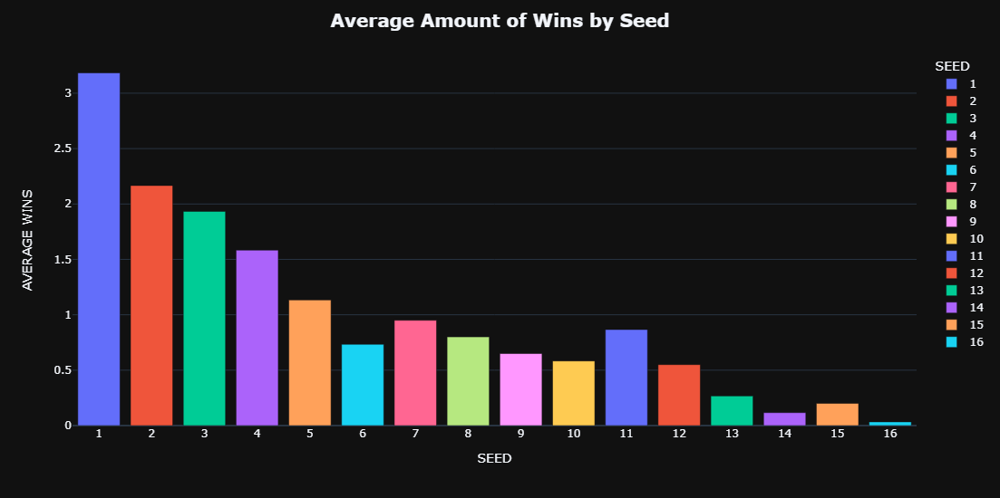

In [16]:
fig = px.bar(avg_wins_df, x = 'SEED', y = 'AVG WINS', color = 'SEED', template = 'plotly_dark')
fig.update_layout(title = '<b> Average Amount of Wins by Seed </b>', title_x = 0.5, title_font = dict(size = 20), 
                  yaxis_title = 'AVERAGE WINS', height = 550)  
fig.show()

In [17]:
# Create dataframe to get WIN % of teams when given specific parameters  
def make_wins_df(df, mode) : 
    wins_df2 = df.copy() 
    wins_df2 = wins_df2[wins_df2['ROUND'].ne(68)] 
    
    # The 2021 tournament was all played in the same time zone which skews the data; removing it normalizes the data  
    if mode == 1 : wins_df2 = wins_df2[wins_df2['YEAR'].ne(2021)] 
    
    # Get the count of wins and losses per seed and round 
    if mode == 0 : wins_df2 = wins_df2.groupby(by = ['SEED', 'CURRENT ROUND', 'OUTCOME']).size().reset_index(name = 'TOTAL W/L')
    # Get the count of wins and losses per seed, round, and time zones crossed value  
    elif mode == 1 : wins_df2 = wins_df2.groupby(by = ['SEED', 'CURRENT ROUND', 'TIME ZONES CROSSED VALUE', 'OUTCOME']).size().reset_index(name = 'TOTAL W/L') 
    
    temp_curr_round = [2, 4, 8, 16, 32, 64, 100]
    temp_tz_val = [- 2, 1, 2]
    wins_perc_arr, temp_round_arr, seed_arr, tz_arr = [], [], [], [] 
    
    # Get the Average Win % of seeds by round  
    if mode == 0 : 
        for seed in order_seed :    
            for rnd in temp_curr_round : 
                temp_df = wins_df2.copy()  
                
                # Round 100 represents the total of all rounds; it is not an actual round  
                if rnd != 100 : 
                    temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & temp_df['CURRENT ROUND'].isin([rnd])] 

                    if 1 in temp_df['OUTCOME'].values : 
                        oc1_df = temp_df.loc[temp_df['OUTCOME'].isin([1])] 
                        # Get the total win % of seeds by round  
                        wins_perc_arr.append(oc1_df['TOTAL W/L'].sum() / temp_df['TOTAL W/L'].sum() * 100) 
                    else : 
                        wins_perc_arr.append(0)
                else : 
                    temp_df = temp_df.loc[temp_df['SEED'].isin([seed])]  
                    oc1_df = temp_df.loc[temp_df['OUTCOME'].isin([1])] 
                    # Get the total win % of seeds   
                    wins_perc_arr.append(oc1_df['TOTAL W/L'].sum() / temp_df['TOTAL W/L'].sum() * 100) 

                temp_round_arr.append(rnd)
                seed_arr.append(seed)
    # Get the Average Win % of seeds by round and time zones crossed value  
    elif mode == 1 : 
        for seed in order_seed :    
            for rnd in temp_curr_round : 
                for val in temp_tz_val : 
                    temp_df = wins_df2.copy()  
                    
                    if rnd != 100 : 
                        # Create a dataframe based on the time zones crossed value conditions 
                        if val == - 2 : temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & temp_df['CURRENT ROUND'].isin([rnd]) & temp_df['TIME ZONES CROSSED VALUE'].le(val)] 
                        elif val == 1 : temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & temp_df['CURRENT ROUND'].isin([rnd]) & (temp_df['TIME ZONES CROSSED VALUE'].ge(- val) & temp_df['TIME ZONES CROSSED VALUE'].le(val))] 
                        elif val == 2 : temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & temp_df['CURRENT ROUND'].isin([rnd]) & temp_df['TIME ZONES CROSSED VALUE'].ge(val)] 

                        if 1 in temp_df['OUTCOME'].values : 
                            oc1_df = temp_df.loc[temp_df['OUTCOME'].isin([1])] 
                            # Get the total win % of seeds by round and time zones crossed value 
                            wins_perc_arr.append(oc1_df['TOTAL W/L'].sum() / temp_df['TOTAL W/L'].sum() * 100) 
                        else : 
                            wins_perc_arr.append(0)
                    else : 
                        if val == - 2 : temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & temp_df['TIME ZONES CROSSED VALUE'].le(val)] 
                        elif val == 1 : temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & (temp_df['TIME ZONES CROSSED VALUE'].ge(- val) & temp_df['TIME ZONES CROSSED VALUE'].le(val))] 
                        elif val == 2 : temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & temp_df['TIME ZONES CROSSED VALUE'].ge(val)]  
                        oc1_df = temp_df.loc[temp_df['OUTCOME'].isin([1])] 
                        # Get the total win % of seeds by time zones crossed value  
                        wins_perc_arr.append(oc1_df['TOTAL W/L'].sum() / temp_df['TOTAL W/L'].sum() * 100) 

                    temp_round_arr.append(rnd)
                    seed_arr.append(seed)
                    tz_arr.append(val)

    temp_round_str = ['FINALS', 'FINAL 4', 'ELITE 8', 'SWEET 16', 'SECOND ROUND', 'FIRST ROUND', 'TOTAL']

    wins_perc_df = pd.DataFrame()
    wins_perc_df['SEED'] = seed_arr 
    wins_perc_df['SEED'] = wins_perc_df['SEED'].astype(str)
    wins_perc_df['ROUND'] = temp_round_arr 
    change_round_str(wins_perc_df, temp_curr_round, temp_round_str)   # Change Round values to strings         
    wins_perc_df['ROUND'] = wins_perc_df['ROUND'].astype(str)
    wins_perc_df['WIN%'] = wins_perc_arr  
    
    # Add time zones crossed value to the dataframe  
    if mode == 1 : 
        wins_perc_df['TIME ZONE VAL'] = tz_arr 
    
    return wins_perc_df  

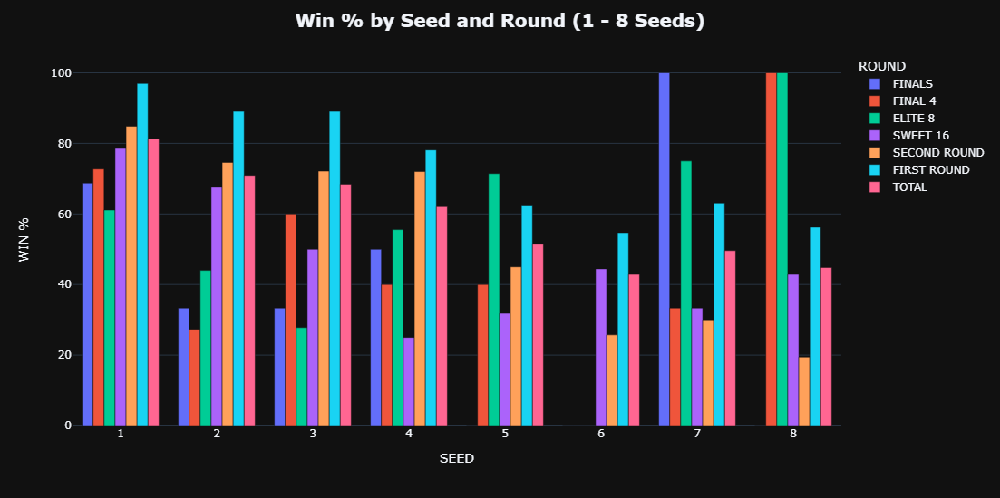

In [18]:
wins_perc_df = make_wins_df(ordered_df, 0)
wins_perc_df1 = wins_perc_df.iloc[:56] 

fig = px.bar(wins_perc_df1, x = 'SEED', y = 'WIN%', color = 'ROUND', barmode = 'group', template = 'plotly_dark')
fig.update_layout(title = '<b> Win % by Seed and Round (1 - 8 Seeds) </b>', title_x = 0.5, title_font = dict(size = 20), 
                  yaxis_title = 'WIN %', height = 550)  
fig.show()

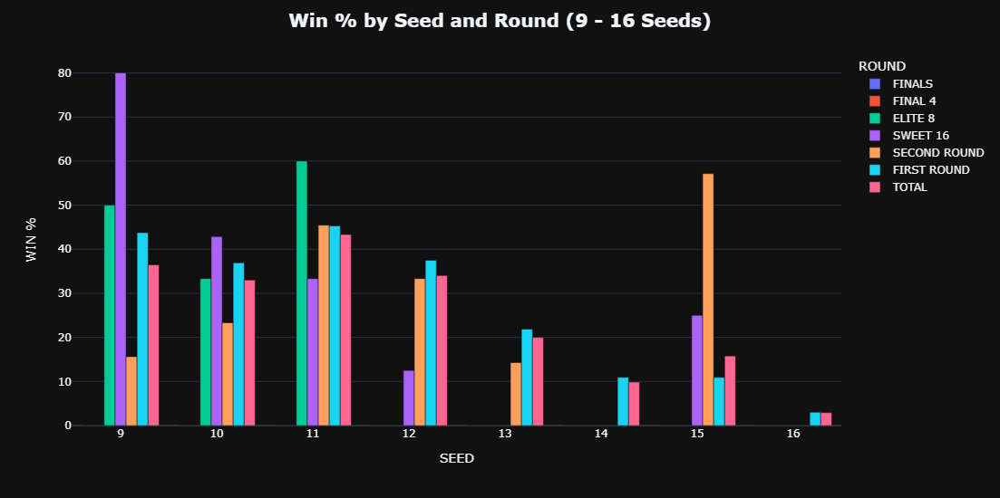

In [19]:
wins_perc_df2 = wins_perc_df.iloc[56:]

fig = px.bar(wins_perc_df2, x = 'SEED', y = 'WIN%', color = 'ROUND', barmode = 'group', template = 'plotly_dark')
fig.update_layout(title = '<b> Win % by Seed and Round (9 - 16 Seeds) </b>', title_x = 0.5, title_font = dict(size = 20), 
                  yaxis_title = 'WIN %', height = 550)  
fig.show()

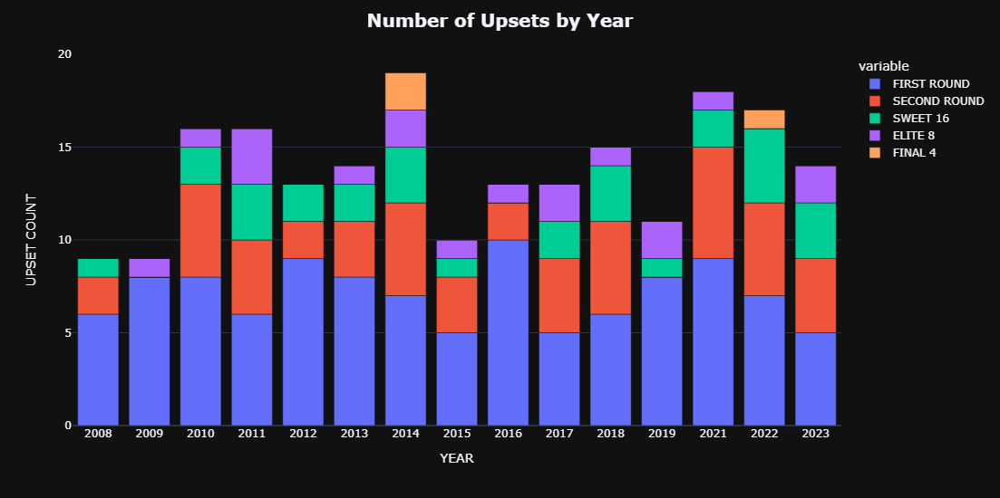

In [20]:
uc = uc_df.copy() 
#uc = uc.loc[uc['YEAR'].le(prev_year)] 
#uc = uc.reset_index(drop = True)
uc['YEAR'] = uc['YEAR'].astype(str)

fig = px.bar(uc, x = 'YEAR', y = ['FIRST ROUND', 'SECOND ROUND', 'SWEET 16', 'ELITE 8', 'FINAL 4'], template = 'plotly_dark')
fig.update_layout(title = '<b> Number of Upsets by Year </b>', title_x = 0.5, title_font = dict(size = 20), 
                  yaxis_title = 'UPSET COUNT', height = 550) 
fig.update_xaxes(autorange = 'reversed')
fig.show()

In [21]:
# Create variables for the Upset Plots  
sns.set(font_scale = 1.5) 
sns.set_style("whitegrid", {'axes.grid' : False})  
plt.style.use("dark_background") 

rounds = [100, 64, 32, 16]
r = 0 
 
upset_titles = ['TOTAL UPSETS', 'FIRST ROUND UPSETS', 'SECOND ROUND UPSETS', 'SWEET 16 UPSETS']
upset_rate_titles = ['TOTAL UPSETS RATE', 'FIRST ROUND UPSETS RATE', 'SECOND ROUND UPSETS RATE', 'SWEET 16 UPSETS RATE']
cond_upset_titles = ['SECOND ROUND UPSETS (CONDENSED)', 'SWEET 16 ROUND UPSETS (CONDENSED)'] 
cond_upset_rate_titles = ['SECOND ROUND UPSETS RATE (CONDENSED)', 'SWEET 16 ROUND UPSETS RATE (CONDENSED)'] 

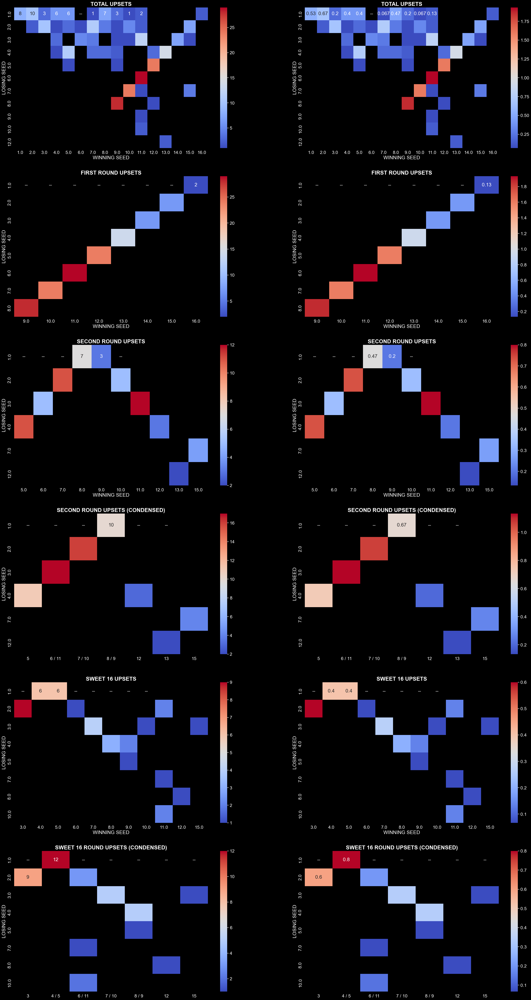

In [22]:
# Display plots detailing the upset count and rate in past tournaments  
######################################################################

fig, axes = plt.subplots(6, 2, figsize = (35, 65))  
   
# Create plots for the upset count and rate of each tournament matchup    
for ti, i in enumerate(rounds) : 
    # Get all matchups that had the winning team have a seed difference of 2 or greater  
    upsets = diff.loc[diff['W SEED'] - diff['L SEED'] >= 2 & diff['W YEAR'].ne(curr_year)] 
    
    # Get upsets by round  
    if i != 100 : upsets = upsets.loc[upsets['W CURRENT ROUND'] == i] 
    upsets = upsets[['W SEED', 'L SEED']] 
    upsets = upsets.rename(columns = {'W SEED' : 'WINNING SEED', 'L SEED' : 'LOSING SEED'}) 
    upsets['UPSET COUNT'] = ''
    # Create dataframe that contains the upset count of each tournament matchup  
    upsets = upsets.groupby(['WINNING SEED', 'LOSING SEED']).agg({'UPSET COUNT' : ['count']})
    upsets = upsets.unstack(level = 0)
    upsets.columns = upsets.columns.droplevel()  
    
    # Create condensed upset count dataframes that represent upset count by all potential seeds in a specific round  
    if i == 32 : 
        cond_upsets = pd.DataFrame()
        cond_upsets['5'] = upsets['count'][5]
        cond_upsets['6 / 11'] = upsets['count'][6].add(upsets['count'][11])
        cond_upsets['7 / 10'] = upsets['count'][7].add(upsets['count'][10])
        cond_upsets['8 / 9'] = upsets['count'][8].add(upsets['count'][9])
        cond_upsets['12'] = upsets['count'][12]
        cond_upsets['13'] = upsets['count'][13]
        cond_upsets['15'] = upsets['count'][15]
    elif i == 16 : 
        cond_upsets = pd.DataFrame()
        upsets = upsets.fillna(0)
        cond_upsets['3'] = upsets['count'][3]
        cond_upsets['4 / 5'] = upsets['count'][4].add(upsets['count'][5])
        cond_upsets['6 / 11'] = upsets['count'][6].add(upsets['count'][11])
        cond_upsets['7 / 10'] = upsets['count'][7].add(upsets['count'][10])
        cond_upsets['8 / 9'] = upsets['count'][8].add(upsets['count'][9])
        cond_upsets['12'] = upsets['count'][12]
        cond_upsets['15'] = upsets['count'][15]
        upsets = upsets.replace(0, np.nan)
        cond_upsets = cond_upsets.replace(0, np.nan)
    
    # Create dataframe that contains the upset rate of each tournament matchup  
    upsets_rate = upsets['count'].div(tournament_count)#.div(4).mul(100) 
    upsets.columns = upsets.columns.droplevel() 
    
    if i == 16 : r = 4 
    
    fig1 = sns.heatmap(upsets, cmap = 'coolwarm', annot = True, ax = axes[r, 0]).set_title(upset_titles[ti], fontdict = {'fontsize': 20,'fontweight': 'bold'})
    fig2 = sns.heatmap(upsets_rate, cmap = 'coolwarm', annot = True, ax = axes[r, 1]).set_title(upset_titles[ti], fontdict = {'fontsize': 20,'fontweight': 'bold'})
    
    if i == 16 or i == 32 :
        # Create dataframe that contains the upset rate of each condensed tournament matchup    
        cond_upsets_rate = cond_upsets.div(tournament_count)#.div(4).mul(100)  
        fig3 = sns.heatmap(cond_upsets, cmap = 'coolwarm', annot = True, ax = axes[r + 1, 0]).set_title(cond_upset_titles[ti - 2], fontdict = {'fontsize': 20,'fontweight': 'bold'})
        fig4 = sns.heatmap(cond_upsets_rate, cmap = 'coolwarm', annot = True, ax = axes[r + 1, 1]).set_title(cond_upset_titles[ti - 2], fontdict = {'fontsize': 20,'fontweight': 'bold'})

    r += 1  

In [23]:
# Create dataframe with the upset count, upset quality average, and upset quality total  
#######################################################################################  

usi = usi_df.copy()
uq = pd.DataFrame()
years = []
uq_avg, uq_total = np.array([]), np.array([])
temp_curr_round = [16, 32, 64, 100] 

# Get the upset quality average and total by each tournament year and round   
for rnd in temp_curr_round : 
    if rnd != 100 : temp_df1 = usi.loc[usi['CURRENT ROUND'].eq(rnd)]
    else : temp_df1 = usi.copy() 
    for year in range(2008, curr_year) : 
        if year == 2020 : continue 
        temp_df2 = temp_df1.loc[temp_df1['YEAR'].eq(year)] 
        if rnd == 100 : years.append(year)
        # Get the upset quality average 
        uq_avg = np.append(uq_avg, temp_df2['SEED DIFF'].mean()) 
        # Get the upset quality total  
        uq_total = np.append(uq_total, temp_df2['SEED DIFF'].sum())

# Split the numpy array into 4 equal pieces representing each round  
uq_avg = np.split(uq_avg, 4)
uq_total = np.split(uq_total, 4)
uq_avg_df = pd.DataFrame(data = uq_avg)  
uq_total_df = pd.DataFrame(data = uq_total) 
uq = pd.concat([uq_avg_df, uq_total_df], axis = 0)
uq = uq.fillna(0) 
uq = uq.T 

uq['YEAR'] = years  
uq['YEAR'] = uq['YEAR'].astype(str)
uq = uq.sort_values(by = ['YEAR'], ascending = False) 
uq = uq.reset_index(drop = True)
uq['UPSET TOTAL COUNT'] = uc['TOTAL']

# Make the YEAR column the first column in the dataframe  
col = uq.pop('YEAR')
uq.insert(0, col.name, col)

# Change column names  
uq.columns = ['YEAR', 'UQ AVG SWEET 16', 'UQ AVG SECOND ROUND', 'UQ AVG FIRST ROUND', 'UQ AVG TOTAL', 
             'UQ TOTAL SWEET 16', 'UQ TOTAL SECOND ROUND', 'UQ TOTAL FIRST ROUND', 'UQ TOTAL TOTAL', 'UPSET TOTAL COUNT']  

del temp_df1, temp_df2, uq_avg_df, uq_total_df 

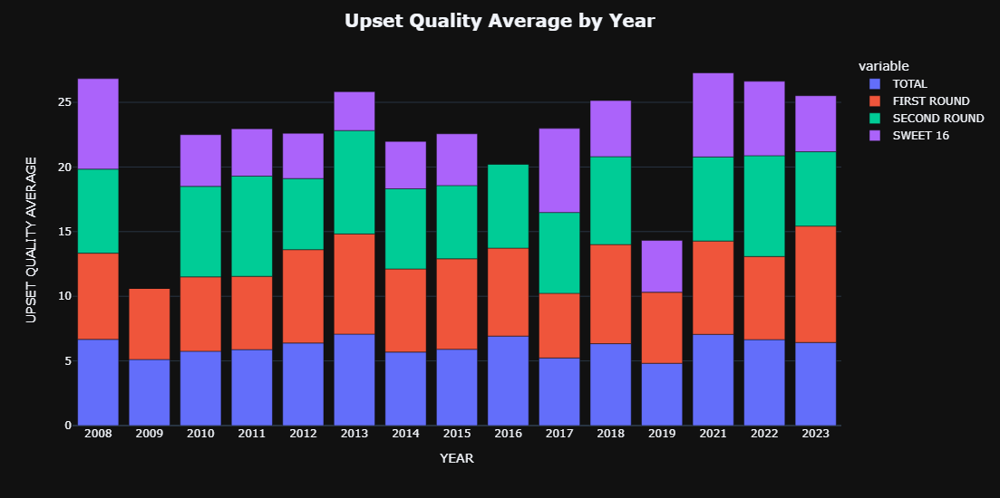

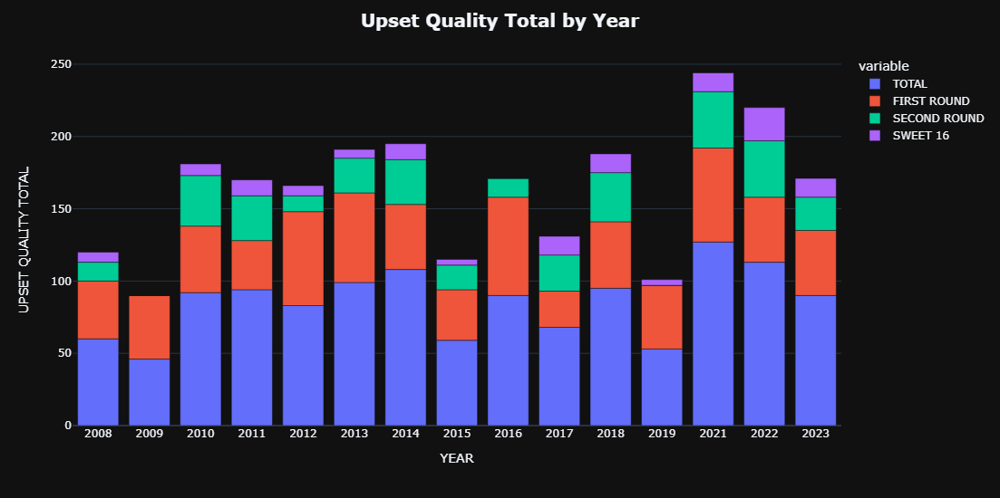

In [24]:
uq_avg = uq.copy()
uq_total = uq.copy()

# Replace the certain prefixes in the columns for the purpose of making the plots more concise  
uq_avg.columns = uq_avg.columns.str.replace(r'UQ AVG ', '', regex = True)
uq_total.columns = uq_total.columns.str.replace(r'UQ TOTAL ', '', regex = True)

fig = px.bar(uq_avg, x = 'YEAR', y = ['TOTAL', 'FIRST ROUND', 'SECOND ROUND', 'SWEET 16'], template = 'plotly_dark')
fig.update_layout(title = '<b> Upset Quality Average by Year </b>', title_x = 0.5, title_font = dict(size = 20), 
                  yaxis_title = 'UPSET QUALITY AVERAGE', height = 550) 
fig.update_xaxes(autorange = 'reversed')
fig.show()

fig = px.bar(uq_total, x = 'YEAR', y = ['TOTAL', 'FIRST ROUND', 'SECOND ROUND', 'SWEET 16'], template = 'plotly_dark')
fig.update_layout(title = '<b> Upset Quality Total by Year </b>', title_x = 0.5, title_font = dict(size = 20), 
                  yaxis_title = 'UPSET QUALITY TOTAL', height = 550) 
fig.update_xaxes(autorange = 'reversed')
fig.show()

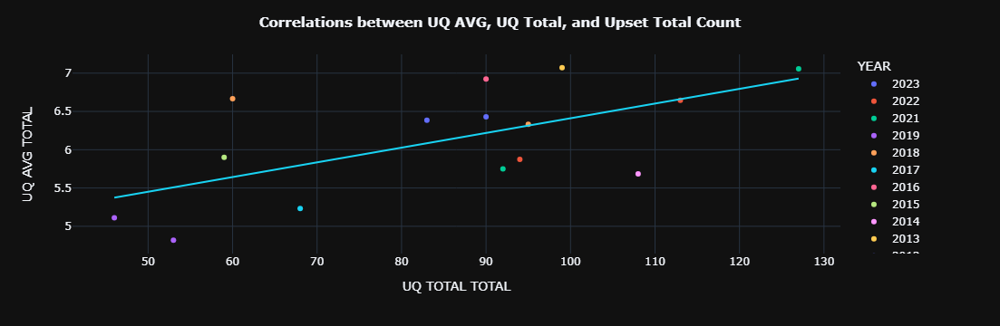

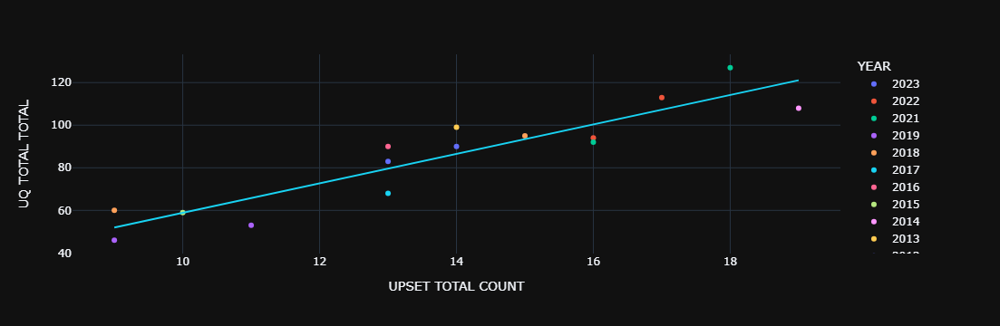

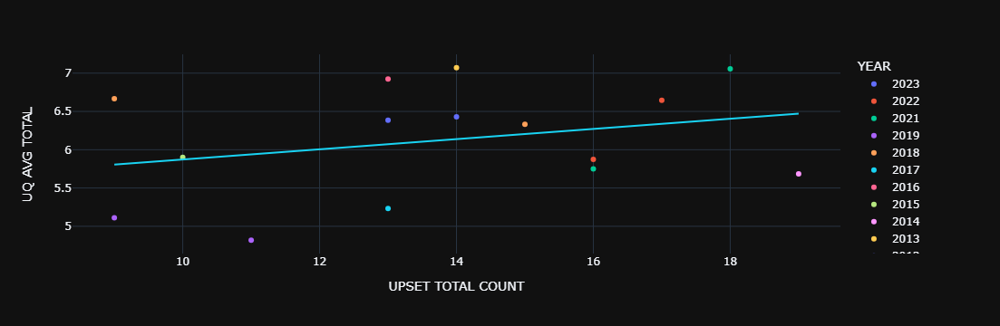

(None, None, None)

In [25]:
fig1 = px.scatter(uq, x = 'UQ TOTAL TOTAL', y = 'UQ AVG TOTAL', trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig2 = px.scatter(uq, x = 'UPSET TOTAL COUNT', y = 'UQ TOTAL TOTAL', trendline = 'ols', trendline_scope = 'overall',color = 'YEAR', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig3 = px.scatter(uq, x = 'UPSET TOTAL COUNT', y = 'UQ AVG TOTAL', trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')

fig1.update_layout(title = '<b> Correlations between UQ AVG, UQ Total, and Upset Total Count </b>', title_x = 0.5, title_font = dict(size = 15)) 

fig1.show(), fig2.show(), fig3.show()

In [26]:
print('Correlation Between UQ TOTAL TOTAL AND UQ AVG TOTAL :', uq['UQ TOTAL TOTAL'].corr(uq['UQ AVG TOTAL'])) 
print('Correlation Between UPSET TOTAL COUNT AND UQ TOTAL TOTAL :', uq['UPSET TOTAL COUNT'].corr(uq['UQ TOTAL TOTAL'])) 
print('Correlation Between UPSET TOTAL COUNT AND UQ AVG TOTAL :', uq['UPSET TOTAL COUNT'].corr(uq['UQ AVG TOTAL'])) 

Correlation Between UQ TOTAL TOTAL AND UQ AVG TOTAL : 0.6305434744689647
Correlation Between UPSET TOTAL COUNT AND UQ TOTAL TOTAL : 0.9210359398205933
Correlation Between UPSET TOTAL COUNT AND UQ AVG TOTAL : 0.2901524278510823


In [27]:
# Create dataframe with the standard deviations of various statistics  
#####################################################################  

stats = ['KADJ EM', 'BADJ EM', 'BARTHAG', 'WAB', 'H BADJ EM', 'H BARTHAG', 'H WAB',
         'A BADJ EM', 'A BARTHAG', 'A WAB', 'N BADJ EM', 'N BARTHAG', 'N WAB', 
         'AN BADJ EM', 'AN BARTHAG', 'AN WAB']
rounds = ['FIRST ROUND', 'SECOND ROUND', 'SWEET 16', 'TOTAL'] 
std_df = pd.DataFrame()

# Get the standard deviations of all of the stats from the stats array for each tournament year  
for year in range(2008, curr_year + 1) :
    if year == 2020 : continue 
    tourney_year = complete_stats.loc[complete_stats['YEAR'].isin([year]) & complete_stats['ROUND'].le(64)]
    year_str = str(year)
    std_df[year_str] = np.std(tourney_year[stats], axis = 0) 

std_df = std_df.T 
std_df = std_df.sort_index(ascending = False)
std_df = std_df.rename_axis('YEAR').reset_index()
std_df = pd.concat([std_df, uc[rounds]], axis = 1)
# Move values down one row    
std_df[['FIRST ROUND', 'SECOND ROUND', 'SWEET 16', 'TOTAL']] = std_df[['FIRST ROUND', 'SECOND ROUND', 'SWEET 16', 'TOTAL']].shift(1)

In [28]:
# Create dataframe with the adjusted standard deviations of various statistics  
##############################################################################      
seeds = [15, 11, 12, 13]
adj_std_df = pd.DataFrame()
i = 17   

# Get the standard deviations of all of the stats from the stats array for each tournament year (filtered by a seed cap)  
for seed in seeds :  
    temp_std_df = pd.DataFrame() 
    for year in range(2008, curr_year + 1) :
        if year == 2020 : continue 
        tourney_year = complete_stats.loc[complete_stats['YEAR'].isin([year]) & complete_stats['ROUND'].le(64) & complete_stats['SEED'].le(seed)] 
        year_str = str(year)
        temp_std_df[year_str] = np.std(tourney_year[stats], axis = 0) 

    temp_std_df = temp_std_df.T 
    temp_std_df = temp_std_df.sort_index(ascending = False)
    temp_std_df = temp_std_df.rename_axis('YEAR').reset_index()
    temp_std_df = pd.concat([temp_std_df, uc[rounds]], axis = 1)
    temp_std_df['ROUND'] = temp_std_df.columns[i] 

    adj_std_df = pd.concat([adj_std_df, temp_std_df], axis = 0)
    i += 1   

# Move values down one row      
adj_std_df[['FIRST ROUND', 'SECOND ROUND', 'SWEET 16', 'TOTAL']] = adj_std_df[['FIRST ROUND', 'SECOND ROUND', 'SWEET 16', 'TOTAL']].shift(1)  
    
del temp_std_df 

In [29]:
# Create dataframe with correlations of the adjusted / unadjusted statistics and tournament rounds  
##################################################################################################    
curr_std_df = std_df.loc[std_df['YEAR'].eq(str(curr_year))]
curr_adj_std_df = adj_std_df.loc[adj_std_df['YEAR'].eq(str(curr_year))]
std_df = std_df.loc[std_df['YEAR'].ne(str(curr_year))]
adj_std_df = adj_std_df.loc[adj_std_df['YEAR'].ne(str(curr_year))]

corr = np.array([])
adj_temp_df = pd.DataFrame()
adj_corr = np.array([])

# Get the correlations between the standard deviations of the stats and the upset count of the rounds  
for i in range(std_df.columns.get_loc('KADJ EM'), std_df.columns.get_loc('AN WAB') + 1) : 
    for j in range(std_df.columns.get_loc('FIRST ROUND'), std_df.columns.get_loc('TOTAL') + 1) : 
        corr = np.append(corr, std_df.iloc[:, i].corr(std_df.iloc[:, j])) 
        adj_temp_df = adj_std_df.loc[adj_std_df['ROUND'] == adj_std_df.columns[j]]
        adj_corr = np.append(adj_corr, adj_temp_df.iloc[:, i].corr(adj_temp_df.iloc[:, j])) 

# Split the numpy array into 16 equal pieces representing each stat    
corr = np.split(corr, 16)
corr_df = pd.DataFrame(data = corr, columns = rounds)  
corr_df.index = stats 

# Split the numpy array into 16 equal pieces representing each stat     
adj_corr = np.split(adj_corr, 16)
adj_corr_df = pd.DataFrame(data = adj_corr, columns = rounds)  
adj_corr_df.index = stats  
# Add the prefix "ADJ" to represent the adjusted correlations  
adj_corr_df = adj_corr_df.add_prefix('ADJ ')  
del adj_temp_df 

In [30]:
complete_corr_df = pd.concat([corr_df, adj_corr_df], axis = 1)
# Display the lowest values in each column as a green highlighted box  
complete_corr_df.style.highlight_min(color = 'green', axis = 0) 

,FIRST ROUND,SECOND ROUND,SWEET 16,TOTAL,ADJ FIRST ROUND,ADJ SECOND ROUND,ADJ SWEET 16,ADJ TOTAL
KADJ EM,-0.256771,-0.089104,-0.439324,-0.319823,-0.280977,-0.554988,-0.519053,-0.543229
BADJ EM,-0.411050,-0.133691,-0.408845,-0.439781,-0.410661,-0.484152,-0.439294,-0.546071
BARTHAG,-0.361871,0.017986,-0.347937,-0.289222,-0.414712,-0.591322,-0.550245,-0.487531
WAB,-0.435711,-0.417217,-0.320008,-0.496544,-0.548113,-0.454997,-0.367858,-0.699249
H BADJ EM,-0.269658,0.190754,-0.202160,-0.088788,-0.346512,-0.504846,-0.347756,-0.430081
H BARTHAG,-0.194366,0.340278,-0.046335,0.124108,-0.286393,-0.471749,-0.205526,-0.092869
H WAB,-0.045699,-0.176906,-0.239691,-0.136928,-0.159706,-0.371974,-0.230031,-0.280426
A BADJ EM,-0.363916,-0.253747,-0.409952,-0.435871,-0.290420,-0.438654,-0.414944,-0.546459
A BARTHAG,-0.272157,-0.094657,-0.413162,-0.280855,-0.215442,-0.429380,-0.477477,-0.530925
A WAB,-0.357386,-0.393661,-0.320100,-0.462674,-0.366262,-0.529349,-0.380704,-0.653448


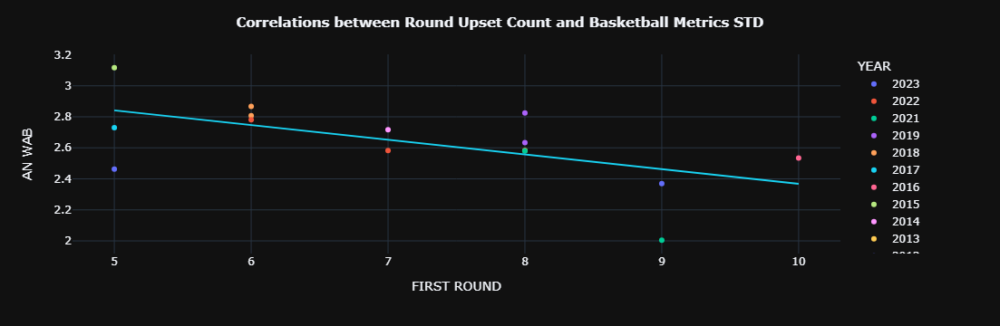

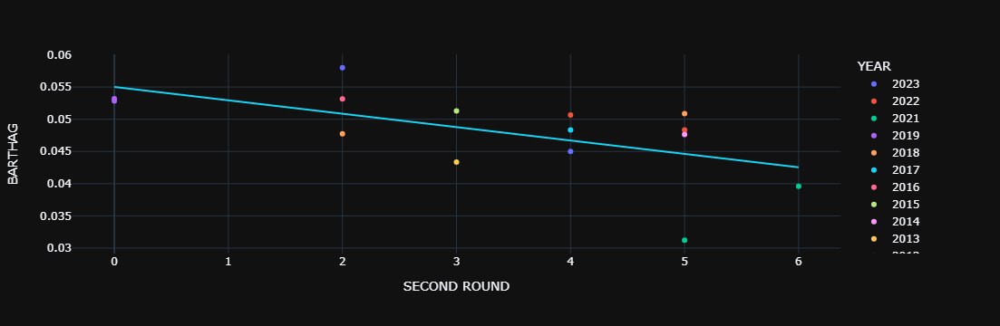

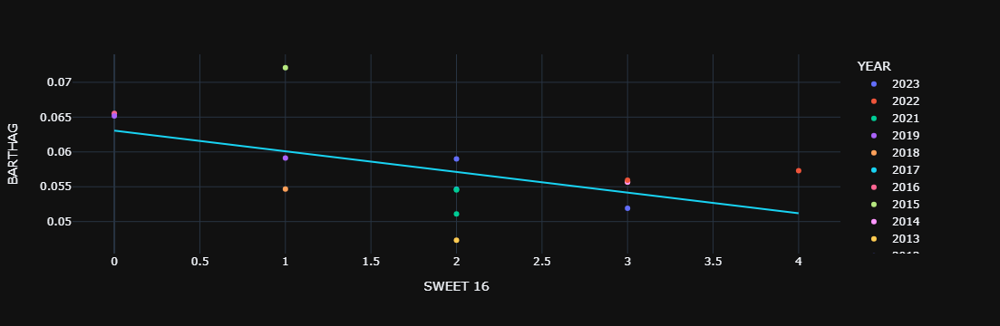

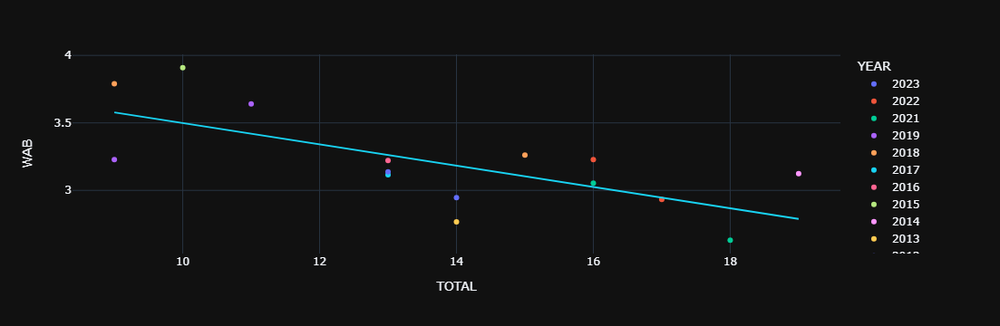

(None, None, None, None)

In [31]:
adj_std_df2 = adj_std_df.loc[adj_std_df['ROUND'] == 'FIRST ROUND']
fig1 = px.scatter(adj_std_df2, x = 'FIRST ROUND', y = 'AN WAB', trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', template = 'plotly_dark')
adj_std_df2 = adj_std_df.loc[adj_std_df['ROUND'] == 'SECOND ROUND']
fig2 = px.scatter(adj_std_df2, x = 'SECOND ROUND', y = 'BARTHAG', trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', template = 'plotly_dark')
adj_std_df2 = adj_std_df.loc[adj_std_df['ROUND'] == 'SWEET 16']
fig3 = px.scatter(adj_std_df2, x = 'SWEET 16', y = 'BARTHAG', trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', template = 'plotly_dark')
adj_std_df2 = adj_std_df.loc[adj_std_df['ROUND'] == 'TOTAL']
fig4 = px.scatter(adj_std_df2, x = 'TOTAL', y = 'WAB', trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', template = 'plotly_dark')

fig1.update_layout(title = '<b> Correlations between Round Upset Count and Basketball Metrics STD </b>', title_x = 0.5, title_font = dict(size = 15)) 

fig1.show(), fig2.show(), fig3.show(), fig4.show()

In [32]:
curr_adj_std_df2 = curr_adj_std_df.loc[curr_adj_std_df['ROUND'].eq('FIRST ROUND')]
curr_adj_std_df3 = curr_adj_std_df.loc[curr_adj_std_df['ROUND'].eq('SECOND ROUND')]
curr_adj_std_df4 = curr_adj_std_df.loc[curr_adj_std_df['ROUND'].eq('SWEET 16')]
curr_adj_std_df5 = curr_adj_std_df.loc[curr_adj_std_df['ROUND'].eq('TOTAL')]

# Get the predicted upset count by round using linear regression   
first_round = (curr_adj_std_df2['AN WAB'].values - 3.31507) / (- 0.0946907)
second_round = (curr_adj_std_df3['BARTHAG'].values - 0.0550178) / (- 0.00208074)
sweet_16 = (curr_adj_std_df4['BARTHAG'].values - 0.0630536) / (- 0.00296723)
total = (curr_adj_std_df5['WAB'].values  - 4.28779) / (- 0.0788942)

print('FIRST ROUND AN WAB :', curr_adj_std_df2['AN WAB'].values)
print('SECOND ROUND BARTHAG :', curr_adj_std_df3['BARTHAG'].values)
print('SWEET 16 BARTHAG :', curr_adj_std_df4['BARTHAG'].values)
print('TOTAL WAB :', curr_adj_std_df5['WAB'].values, '\n')

print('PREDICTED FIRST ROUND UPSET COUNT :', first_round)
print('PREDICTED SECOND ROUND UPSET COUNT :', second_round)
print('PREDICTED SWEET 16 ROUND UPSET COUNT :', sweet_16)
print('PREDICTED TOTAL UPSET COUNT :', total)

FIRST ROUND AN WAB : [2.59949319]
SECOND ROUND BARTHAG : [0.04881089]
SWEET 16 BARTHAG : [0.06286799]
TOTAL WAB : [2.98011771] 

PREDICTED FIRST ROUND UPSET COUNT : [7.55699148]
PREDICTED SECOND ROUND UPSET COUNT : [2.98302847]
PREDICTED SWEET 16 ROUND UPSET COUNT : [0.06255266]
PREDICTED TOTAL UPSET COUNT : [16.57501177]


In [33]:
# Create dataframe with correlations of the adjusted / unadjusted statistics for upset quality average / upset quality total and tournament rounds  
##################################################################################################################################################       

corr = np.array([])
adj_temp_df = pd.DataFrame()
adj_corr = np.array([])
temp_rounds = ['SWEET 16', 'SECOND ROUND', 'FIRST ROUND', 'TOTAL', 'SWEET 16', 'SECOND ROUND', 'FIRST ROUND', 'TOTAL']

# Get the correlations between the adjusted standard deviations of the stats and the upset count of the rounds  
for i in range(std_df.columns.get_loc('KADJ EM'), std_df.columns.get_loc('AN WAB') + 1) : 
    k = 0  
    for j in range(uq.columns.get_loc('UQ AVG SWEET 16'), uq.columns.get_loc('UQ TOTAL TOTAL') + 1) : 
        corr = np.append(corr, std_df.iloc[:, i].corr(uq.iloc[:, j])) 
        adj_temp_df = adj_std_df.loc[adj_std_df['ROUND'] == temp_rounds[k]]
        adj_corr = np.append(adj_corr, adj_temp_df.iloc[:, i].corr(uq.iloc[:, j])) 
        k += 1 

col_names = ['UQ AVG SWEET 16', 'UQ AVG SECOND ROUND', 'UQ AVG FIRST ROUND', 'UQ AVG TOTAL', 
             'UQ TOTAL SWEET 16', 'UQ TOTAL SECOND ROUND', 'UQ TOTAL FIRST ROUND', 'UQ TOTAL TOTAL']          

# Split the numpy array into 16 equal pieces representing each stat   
corr = np.split(corr, 16)
corr_df = pd.DataFrame(data = corr, columns = col_names)  
corr_df.index = stats 

# Split the numpy array into 16 equal pieces representing each stat   
adj_corr = np.split(adj_corr, 16)
adj_corr_df = pd.DataFrame(data = adj_corr, columns = col_names)  
adj_corr_df.index = stats  
# Add the prefix "ADJ" to represent the adjusted correlations    
adj_corr_df = adj_corr_df.add_prefix('ADJ ')  
del adj_temp_df 

In [34]:
complete_corr_df = pd.concat([corr_df, adj_corr_df], axis = 1)
# Display the lowest values in each column as a green highlighted box   
complete_corr_df.style.highlight_min(color = 'green', axis = 0) 

,UQ AVG SWEET 16,UQ AVG SECOND ROUND,UQ AVG FIRST ROUND,UQ AVG TOTAL,UQ TOTAL SWEET 16,UQ TOTAL SECOND ROUND,UQ TOTAL FIRST ROUND,UQ TOTAL TOTAL,ADJ UQ AVG SWEET 16,ADJ UQ AVG SECOND ROUND,ADJ UQ AVG FIRST ROUND,ADJ UQ AVG TOTAL,ADJ UQ TOTAL SWEET 16,ADJ UQ TOTAL SECOND ROUND,ADJ UQ TOTAL FIRST ROUND,ADJ UQ TOTAL TOTAL
KADJ EM,-0.337709,-0.222593,0.253660,-0.088685,-0.338557,-0.224336,0.188840,-0.090044,0.047708,0.382936,0.215635,-0.057802,-0.059060,0.349242,0.217036,0.105911
BADJ EM,-0.256152,-0.089654,0.244266,0.007966,-0.265021,-0.108363,0.169593,-0.010366,0.166868,0.472820,0.174864,-0.007491,0.070170,0.451020,0.204058,0.166952
BARTHAG,-0.305271,-0.213070,0.227584,0.003289,-0.288235,-0.202753,0.174914,-0.103789,0.189073,0.784963,0.093232,0.013525,0.016939,0.607139,0.244811,0.032067
WAB,-0.187859,0.494027,0.521248,0.425252,-0.044923,0.329713,0.216789,0.322185,0.055960,0.456992,0.320196,-0.004810,0.266828,0.548988,0.212334,0.223813
H BADJ EM,-0.306942,-0.283689,0.114656,-0.153460,-0.386826,-0.187802,0.143878,-0.093783,0.126772,0.465480,0.240111,-0.029692,0.144449,0.574338,0.411740,0.206358
H BARTHAG,-0.234717,-0.250490,0.070403,-0.106042,-0.346138,-0.139925,0.107324,-0.073077,0.132883,0.685821,0.207262,0.197612,0.152668,0.740120,0.436341,0.303227
H WAB,-0.251658,0.280667,0.531085,0.324759,-0.201307,0.278293,0.284757,0.330401,-0.013546,0.370487,0.481273,0.200202,-0.025339,0.498701,0.436165,0.297491
A BADJ EM,-0.197849,0.031059,0.271443,0.000828,-0.148969,0.014076,0.138232,0.073005,0.194220,0.275791,0.037163,-0.071955,0.111318,0.117822,-0.054356,0.115119
A BARTHAG,-0.307433,-0.146263,0.254185,-0.066973,-0.270320,-0.134118,0.204416,-0.025565,0.266714,0.212222,-0.175868,-0.299949,0.092365,-0.040782,-0.157095,-0.028172
A WAB,-0.101413,0.312402,0.327476,0.271094,-0.184915,0.059270,0.114722,0.008175,0.337558,0.464176,0.178832,-0.107847,0.368690,0.390638,-0.017241,-0.067043


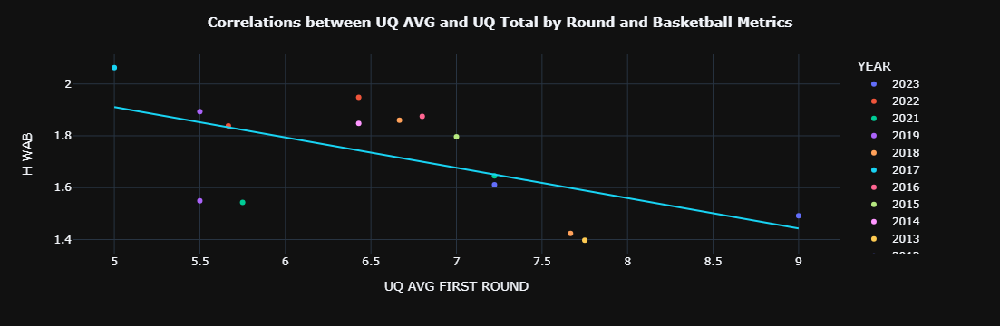

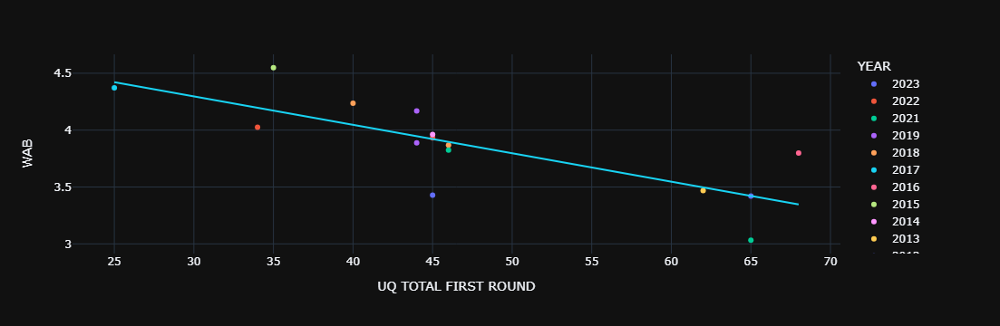

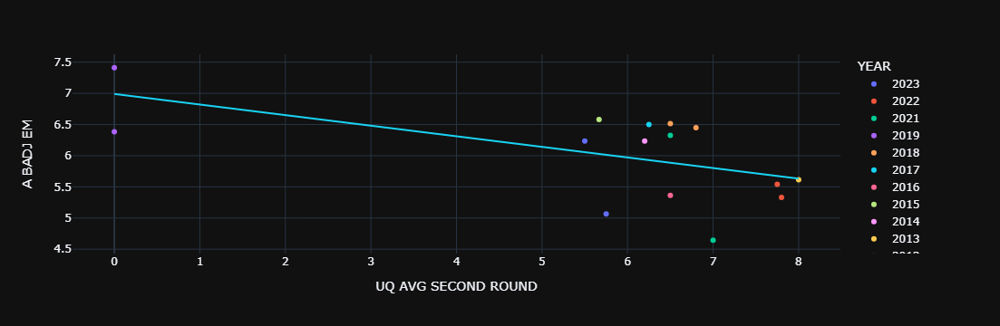

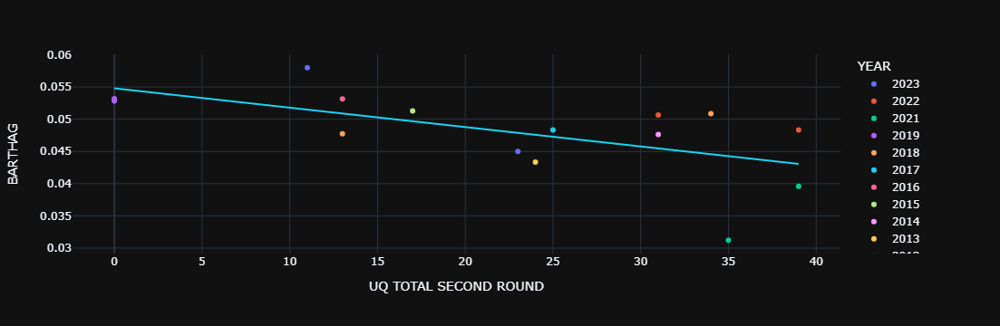

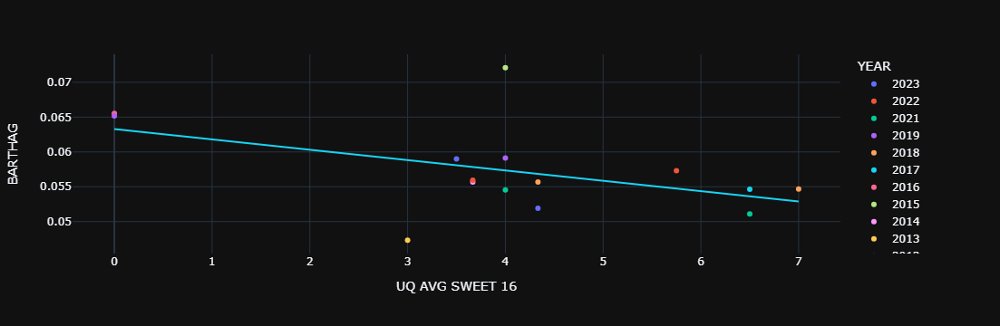

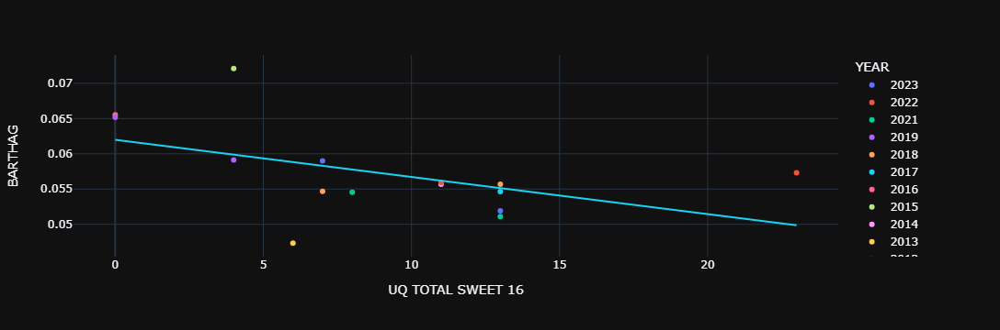

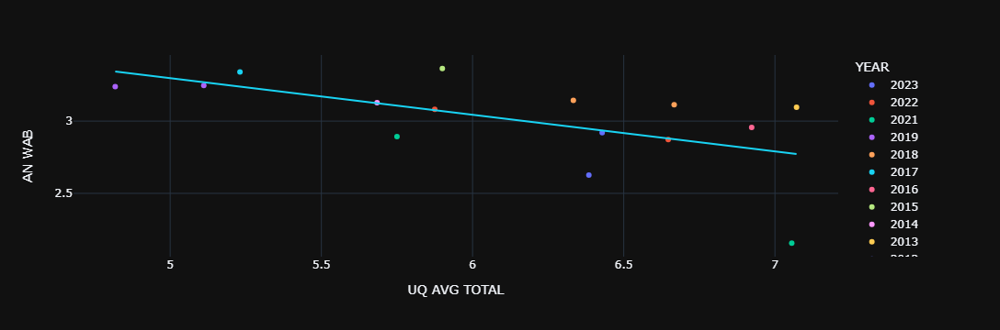

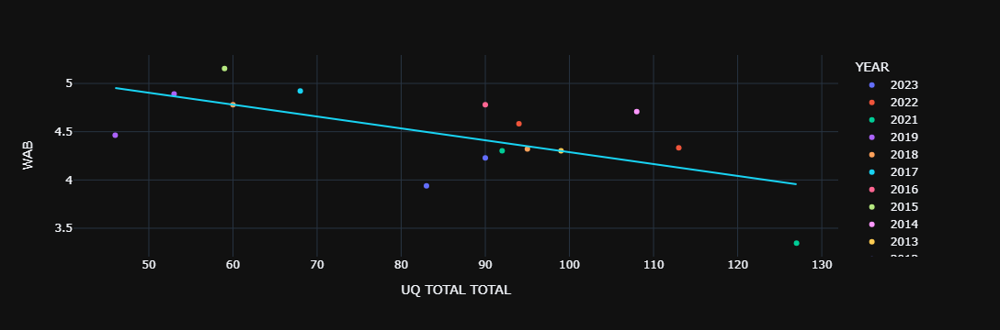

(None, None, None, None, None, None, None, None)

In [35]:
adj_std_df2 = adj_std_df.loc[adj_std_df['ROUND'] == 'FIRST ROUND']
fig1 = px.scatter(adj_std_df2, x = uq['UQ AVG FIRST ROUND'], y = 'H WAB', labels = {'x' : 'UQ AVG FIRST ROUND'},
                  trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', template = 'plotly_dark')  
fig2 = px.scatter(adj_std_df2, x = uq['UQ TOTAL FIRST ROUND'], y = 'WAB', labels = {'x' : 'UQ TOTAL FIRST ROUND'},
                  trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', template = 'plotly_dark')

adj_std_df2 = adj_std_df.loc[adj_std_df['ROUND'] == 'SECOND ROUND']
fig3 = px.scatter(adj_std_df2, x = uq['UQ AVG SECOND ROUND'], y = 'A BADJ EM', labels = {'x' : 'UQ AVG SECOND ROUND'},
                  trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', template = 'plotly_dark')
fig4 = px.scatter(adj_std_df2, x = uq['UQ TOTAL SECOND ROUND'], y = 'BARTHAG', labels = {'x' : 'UQ TOTAL SECOND ROUND'},
                  trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', template = 'plotly_dark')

adj_std_df2 = adj_std_df.loc[adj_std_df['ROUND'] == 'SWEET 16']
fig5 = px.scatter(adj_std_df2, x = uq['UQ AVG SWEET 16'], y = 'BARTHAG', labels = {'x' : 'UQ AVG SWEET 16'}, 
                  trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', template = 'plotly_dark')
fig6 = px.scatter(adj_std_df2, x = uq['UQ TOTAL SWEET 16'], y = 'BARTHAG', labels = {'x' : 'UQ TOTAL SWEET 16'}, 
                  trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', template = 'plotly_dark')

adj_std_df2 = adj_std_df.loc[adj_std_df['ROUND'] == 'TOTAL']
fig7 = px.scatter(std_df, x = uq['UQ AVG TOTAL'], y = 'AN WAB', labels = {'x' : 'UQ AVG TOTAL'}, 
                  trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', template = 'plotly_dark')
fig8 = px.scatter(std_df, x = uq['UQ TOTAL TOTAL'], y = 'WAB', labels = {'x' : 'UQ TOTAL TOTAL'}, 
                  trendline = 'ols', trendline_scope = 'overall', color = 'YEAR', template = 'plotly_dark')

fig1.update_layout(title = '<b> Correlations between UQ AVG and UQ Total by Round and Basketball Metrics </b>', title_x = 0.5, title_font = dict(size = 15)) 

fig1.show(), fig2.show(), fig3.show(), fig4.show(), fig5.show(), fig6.show(), fig7.show(), fig8.show()

In [36]:
first_round = (curr_adj_std_df2['H WAB'].values - 2.49563) / (- 0.116972)
second_round = (curr_adj_std_df3['A BADJ EM'].values - 6.98889) / (- 0.16979)
sweet_16 = (curr_adj_std_df4['BARTHAG'].values - 0.0632919) / (- 0.00148755)
total = (curr_adj_std_df5['AN WAB'].values  - 4.56365) / (- 0.253382)

print('FIRST ROUND H WAB :', curr_adj_std_df2['H WAB'].values)
print('SECOND ROUND A BADJ EM :', curr_adj_std_df3['A BADJ EM'].values)
print('SWEET 16 BARTHAG :', curr_adj_std_df4['BARTHAG'].values)
print('TOTAL AN WAB :', curr_adj_std_df5['AN WAB'].values, '\n') 

# Get the predicted upset quality average by round using linear regression    
print('PREDICTED FIRST ROUND UPSET QUALITY AVERAGE :', first_round)
print('PREDICTED SECOND ROUND UPSET QUALITY AVERAGE :', second_round)
print('PREDICTED SWEET 16 ROUND UPSET QUALITY AVERAGE :', sweet_16)
print('PREDICTED TOTAL UPSET QUALITY AVERAGE :', total, '\n')

first_round = (curr_adj_std_df2['WAB'].values - 5.04542) / (- 0.0249762)
second_round = (curr_adj_std_df3['BARTHAG'].values - 0.0547882) / (- 0.000300279)
sweet_16 = (curr_adj_std_df4['BARTHAG'].values - 0.0619985) / (- 0.000527992)
total = (curr_adj_std_df5['WAB'].values  - 5.51771) / (- 0.0123047)

print('FIRST ROUND WAB :', curr_adj_std_df2['WAB'].values)
print('SECOND ROUND BARTHAG :', curr_adj_std_df3['BARTHAG'].values)
print('SWEET 16 BARTHAG :', curr_adj_std_df4['BARTHAG'].values)
print('TOTAL WAB :', curr_adj_std_df5['WAB'].values, '\n') 

# Get the predicted upset quality total by round using linear regression  
print('PREDICTED FIRST ROUND UPSET QUALITY TOTAL :', first_round)
print('PREDICTED SECOND ROUND UPSET QUALITY TOTAL :', second_round)
print('PREDICTED SWEET 16 ROUND UPSET QUALITY TOTAL :', sweet_16)
print('PREDICTED TOTAL UPSET QUALITY TOTAL :', total)

FIRST ROUND H WAB : [1.97563704]
SECOND ROUND A BADJ EM : [6.11454501]
SWEET 16 BARTHAG : [0.06286799]
TOTAL AN WAB : [2.01632266] 

PREDICTED FIRST ROUND UPSET QUALITY AVERAGE : [4.44544811]
PREDICTED SECOND ROUND UPSET QUALITY AVERAGE : [5.14956705]
PREDICTED SWEET 16 ROUND UPSET QUALITY AVERAGE : [0.28497069]
PREDICTED TOTAL UPSET QUALITY AVERAGE : [10.05330821] 

FIRST ROUND WAB : [4.05980154]
SECOND ROUND BARTHAG : [0.04881089]
SWEET 16 BARTHAG : [0.06286799]
TOTAL WAB : [2.98011771] 

PREDICTED FIRST ROUND UPSET QUALITY TOTAL : [39.46230634]
PREDICTED SECOND ROUND UPSET QUALITY TOTAL : [19.90584312]
PREDICTED SWEET 16 ROUND UPSET QUALITY TOTAL : [-1.64678983]
PREDICTED TOTAL UPSET QUALITY TOTAL : [206.22951342]


In [37]:
# Create dataframe for various statistics and how many teams from conferences made tournament rounds  
####################################################################################################  

conf_count = ordered_df.loc[ordered_df['YEAR'].ne(curr_year)] 
# Get the the count of teams from each conference making each round  
conf_count = conf_count.groupby(by = ['YEAR', 'CONF', 'CONF ID', 'CURRENT ROUND']).size().reset_index(name = 'COUNT') 
conf_count = conf_count.sort_values(by = ['YEAR', 'CONF', 'CURRENT ROUND'], ascending = False)

temp_csh_df = csh_df.copy()  
# Add Prefix to indicate type of conference stats (H = Home, A = Away, N = Neutral, AN = Away Neutral) 
temp_csh_df = temp_csh_df.add_prefix('H ')
# Rename H YEAR and H CONF columns to YEAR and H CONF because it will be the columns used to merge  
temp_csh_df = temp_csh_df.rename(columns = {'H YEAR' : 'YEAR', 'H CONF' : 'CONF'}) 

temp_csa_df = csa_df.copy()  
temp_csa_df = temp_csa_df.add_prefix('A ')
temp_csa_df = temp_csa_df.rename(columns = {'A YEAR' : 'YEAR', 'A CONF' : 'CONF'}) 

temp_csn_df = csn_df.copy()  
temp_csn_df = temp_csn_df.add_prefix('N ')
temp_csn_df = temp_csn_df.rename(columns = {'N YEAR' : 'YEAR', 'N CONF' : 'CONF'}) 

temp_csan_df = csan_df.copy()  
temp_csan_df = temp_csan_df.add_prefix('AN ')
temp_csan_df = temp_csan_df.rename(columns = {'AN YEAR' : 'YEAR', 'AN CONF' : 'CONF'}) 

dfs = [conf_count, cs_df, temp_csh_df, temp_csa_df, temp_csn_df, temp_csan_df]               
# Merge all columns to make one dataframe consisting of all conference stats   
conf_count = reduce(lambda left, right: pd.merge(left, right, on = ['YEAR', 'CONF'], how = 'left'), dfs)
conf_count = conf_count.loc[conf_count['CURRENT ROUND'].le(16)] 

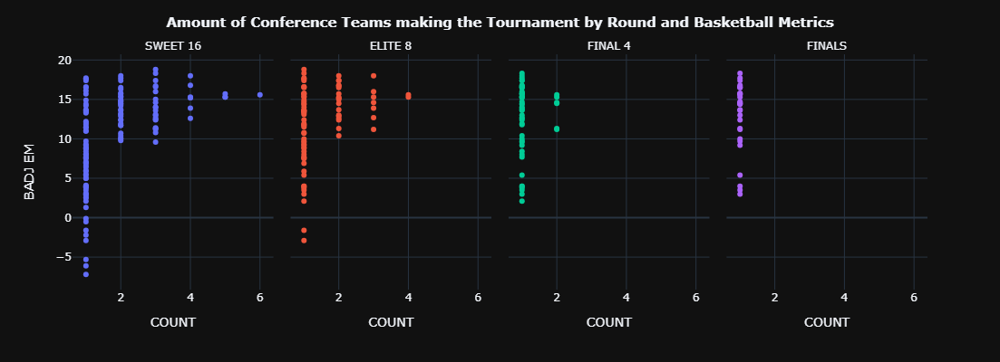

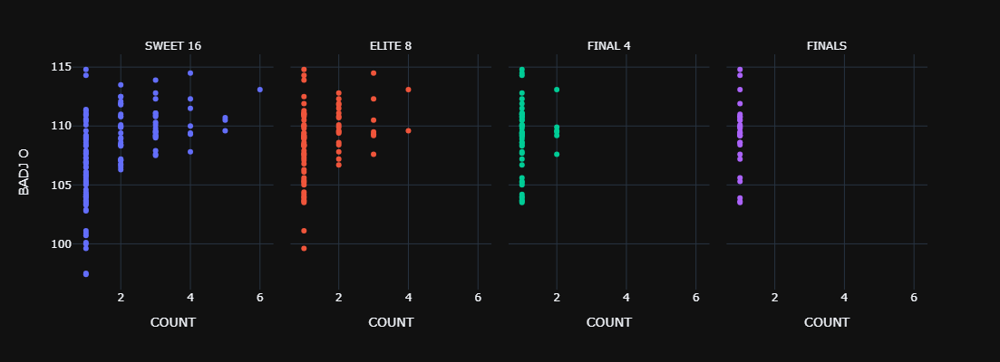

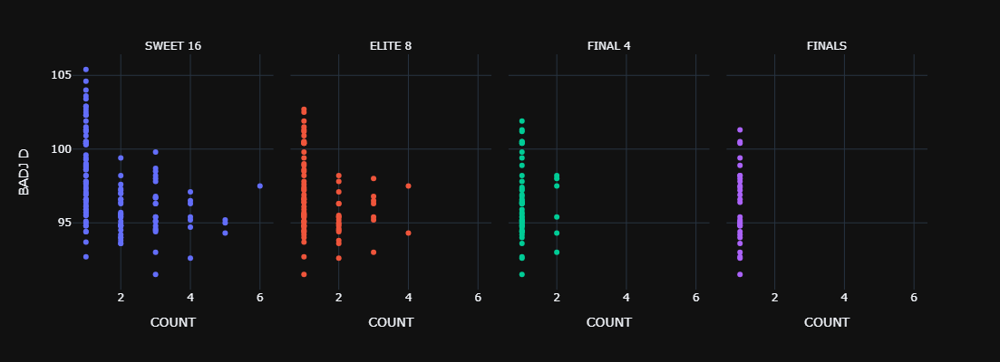

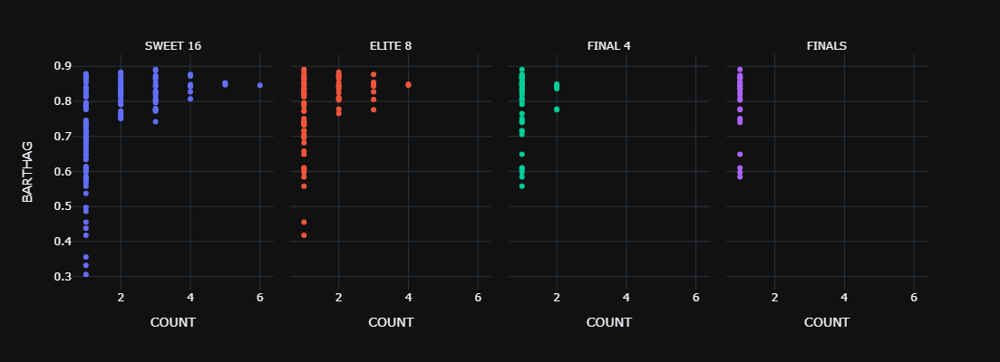

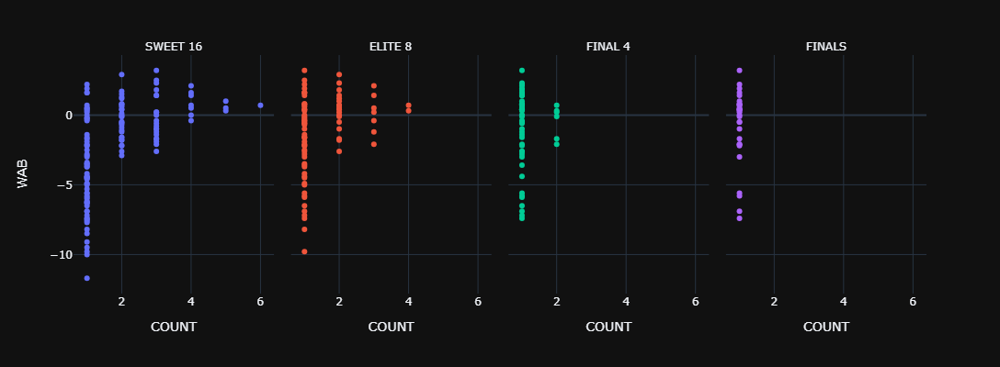

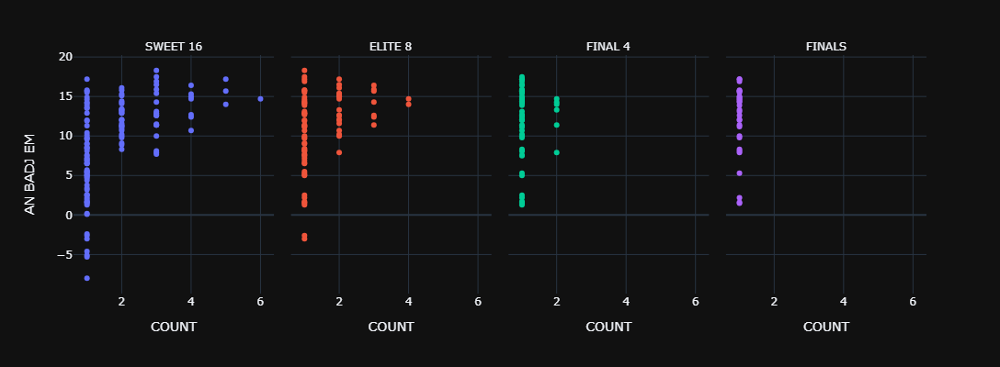

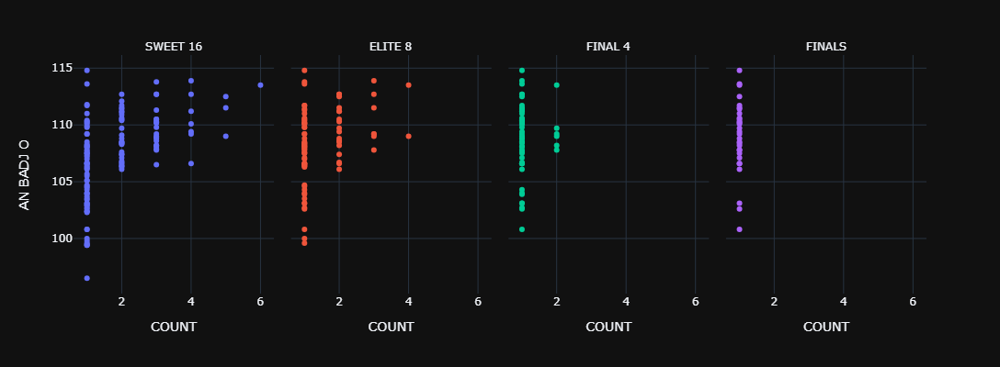

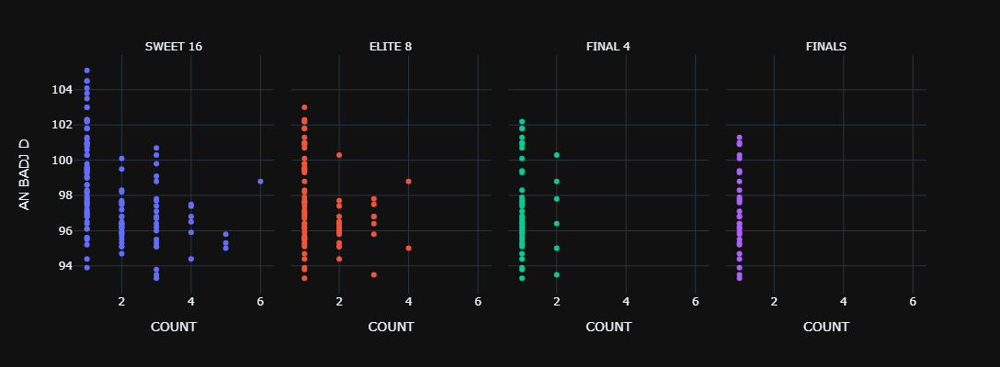

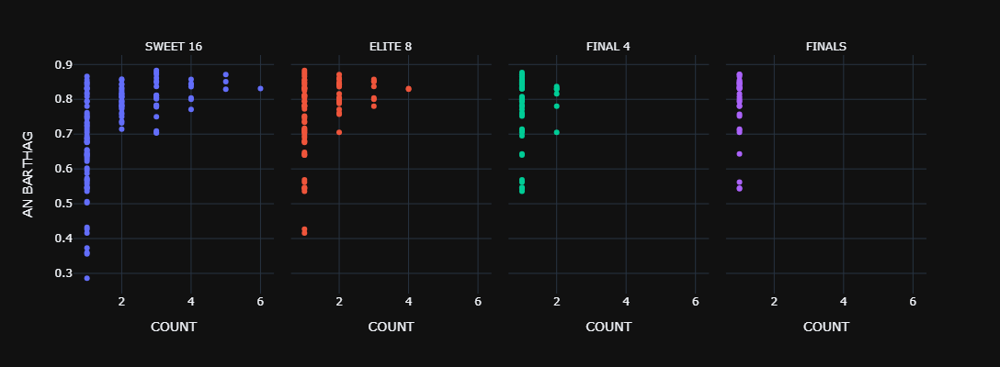

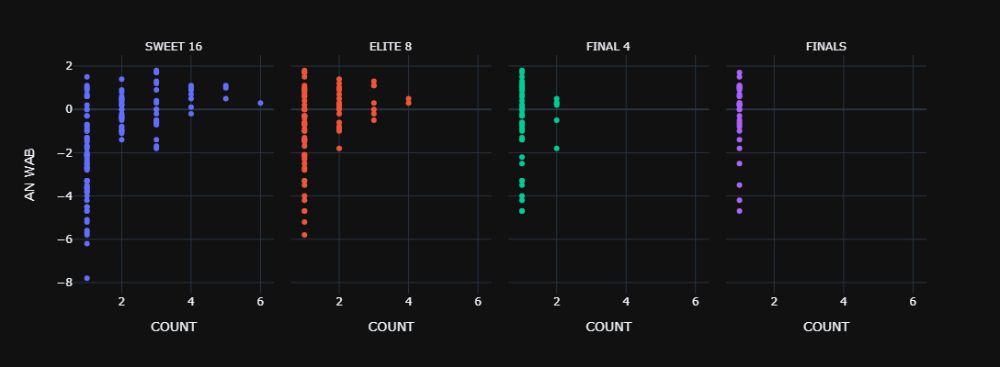

In [38]:
rounds = [16, 8, 4, 2]
titles = ['SWEET 16', 'ELITE 8', 'FINAL 4', 'FINALS']

# Replace Current Round values with string values from the titles array  
for i in rounds : 
    conf_count = conf_count.replace({'CURRENT ROUND': i}, titles[rounds.index(i)])

conf_count = conf_count.reset_index(drop = True) 
selected_cols = conf_count.columns[conf_count.columns.isin(['YEAR', 'CONF', 'CURRENT ROUND', 'COUNT', 'BADJ EM', 'BADJ O', 'BADJ D', 'BARTHAG', 'WAB',
                                                            'AN BADJ EM', 'AN BADJ O', 'AN BADJ D', 'AN BARTHAG', 'AN WAB'])]  
simp_conf_count = conf_count[selected_cols]

for i in range(simp_conf_count.columns.get_loc('BADJ EM'), simp_conf_count.columns.get_loc('AN WAB') + 1) : 
    fig = px.scatter(simp_conf_count, x = 'COUNT', y = simp_conf_count.columns[i], facet_col = 'CURRENT ROUND', hover_data = ['YEAR', 'CONF'], color = 'CURRENT ROUND', template = 'plotly_dark') 
    # Remove the first half of the string from the plot titles (Everything including and before the = sign)
    fig.for_each_annotation(lambda a: a.update(text = a.text.split('=')[- 1]))      
    fig.update_layout(height = 400, showlegend = False)   
    if i == simp_conf_count.columns.get_loc('BADJ EM') : fig.update_layout(title = '<b> Amount of Conference Teams making the Tournament by Round and Basketball Metrics </b>', title_x = 0.5, title_font = dict(size = 15)) 
    fig.show()

In [39]:
# Create dataframe for various statistics and how many teams from conferences made tournament rounds for the Champions  
######################################################################################################################   

champ_conf_count = ordered_df.loc[ordered_df['YEAR'].ne(curr_year) & ordered_df['ROUND'].eq(1) & ordered_df['CURRENT ROUND'].eq(2)] 
# Get the the count of teams from each conference making each round   
champ_conf_count = champ_conf_count.groupby(by = ['YEAR', 'CONF', 'CONF ID', 'CURRENT ROUND']).size().reset_index(name = 'COUNT')  
champ_conf_count = champ_conf_count.sort_values(by = ['YEAR', 'CONF', 'CURRENT ROUND'], ascending = False)

dfs = [champ_conf_count, cs_df, temp_csh_df, temp_csa_df, temp_csn_df, temp_csan_df]         
# Merge all columns to make one dataframe consisting of all conference stats     
champ_conf_count = reduce(lambda left, right: pd.merge(left, right, on = ['YEAR', 'CONF'], how = 'left'), dfs)
simp_champ_conf_count = champ_conf_count[selected_cols] 

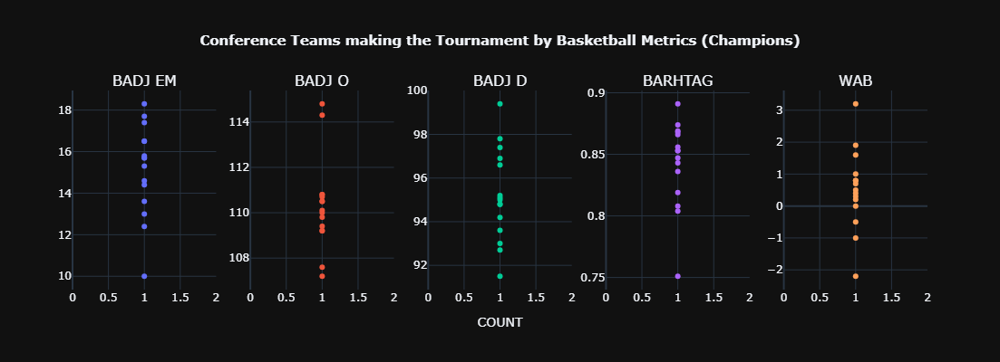

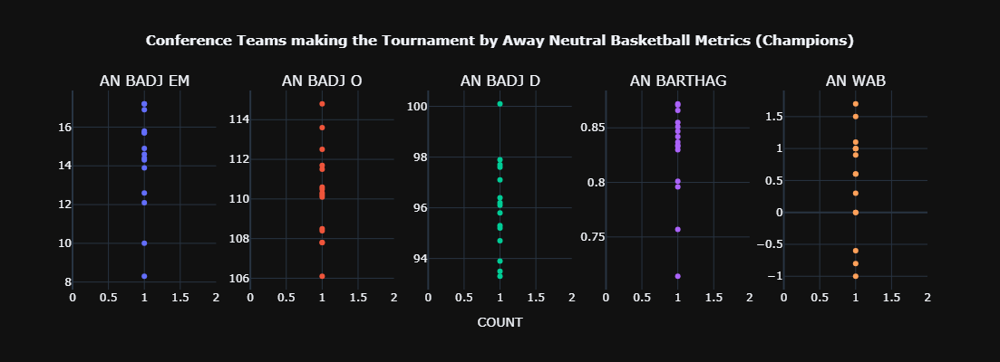

(None, None)

In [40]:
titles = ['BADJ EM', 'BADJ O', 'BADJ D', 'BARHTAG', 'WAB']
figures = []

for i in range(simp_champ_conf_count.columns.get_loc('BADJ EM'), simp_champ_conf_count.columns.get_loc('WAB') + 1) : 
    fig = px.scatter(simp_champ_conf_count, x = 'COUNT', y = simp_champ_conf_count.columns[i], color_discrete_sequence = [i], hover_data = ['YEAR', 'CONF']) 
    figures.append(fig)

fig1 = mul_subplots(figures, titles, 400)
fig1.update_layout(title = '<b> Conference Teams making the Tournament by Basketball Metrics (Champions) </b>', title_x = 0.5, title_font = dict(size = 15)) 
fig1.update_xaxes(title_text = 'COUNT', row = 1, col = 3)

titles = ['AN BADJ EM', 'AN BADJ O', 'AN BADJ D', 'AN BARTHAG', 'AN WAB'] 
figures = [] 

for i in range(simp_champ_conf_count.columns.get_loc('AN BADJ EM'), simp_champ_conf_count.columns.get_loc('AN WAB') + 1) : 
    fig = px.scatter(simp_champ_conf_count, x = 'COUNT', y = simp_champ_conf_count.columns[i], color_discrete_sequence = [i], hover_data = ['YEAR', 'CONF']) 
    figures.append(fig)

fig2 = mul_subplots(figures, titles, 400)
fig2.update_layout(title = '<b> Conference Teams making the Tournament by Away Neutral Basketball Metrics (Champions) </b>', title_x = 0.5, title_font = dict(size = 15)) 
fig2.update_xaxes(title_text = 'COUNT', row = 1, col = 3)

fig1.show(), fig2.show()  

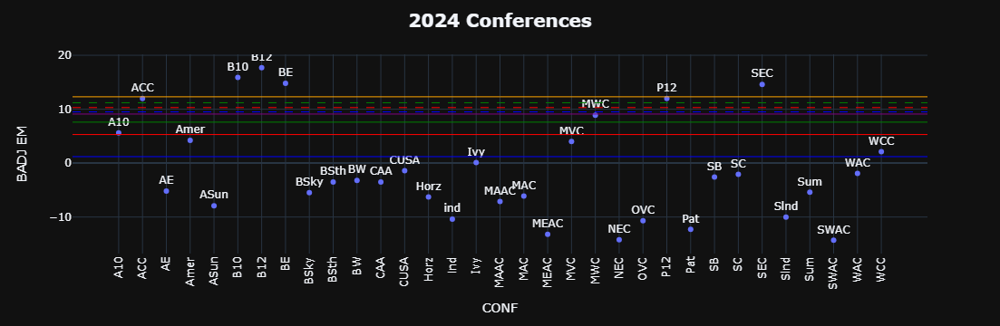

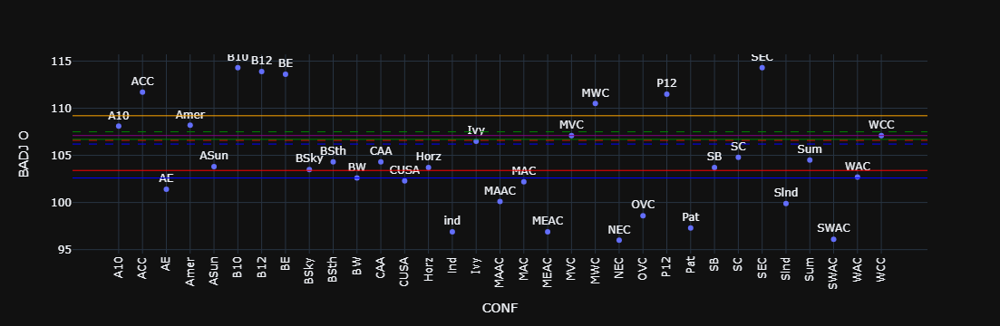

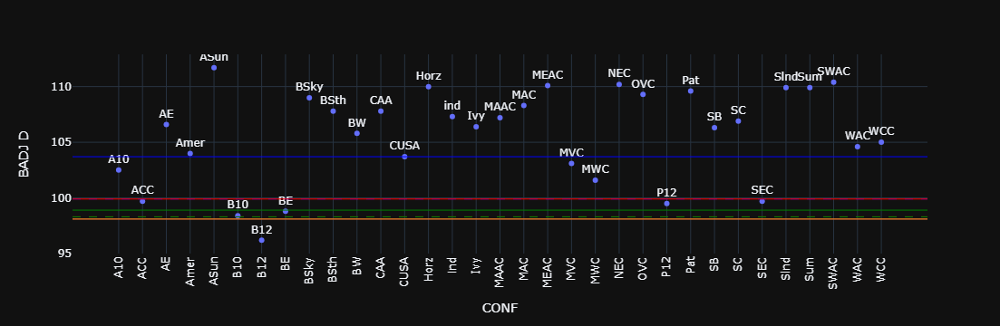

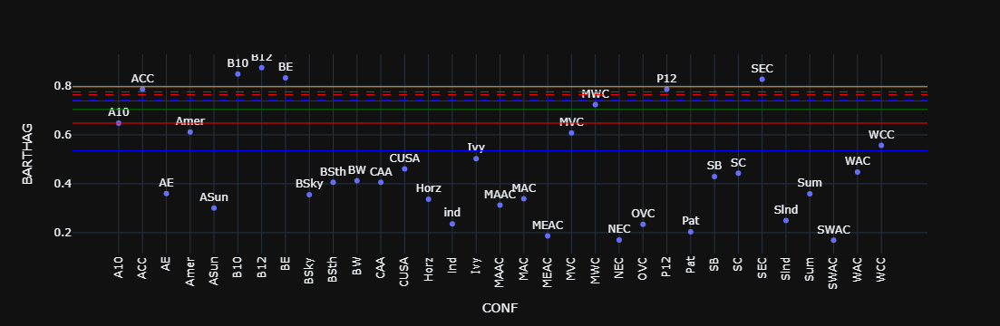

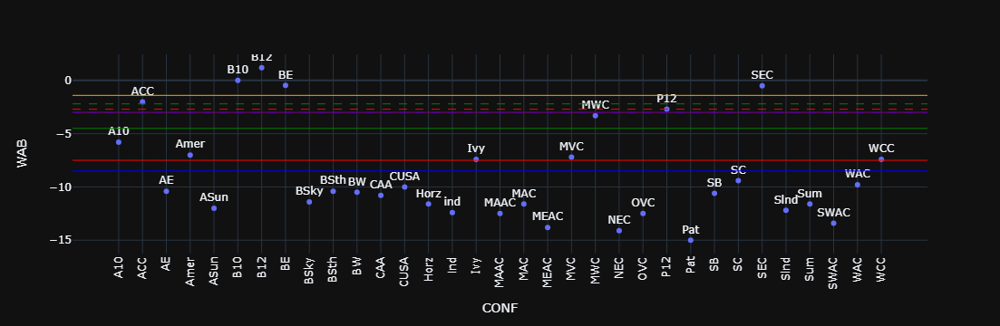

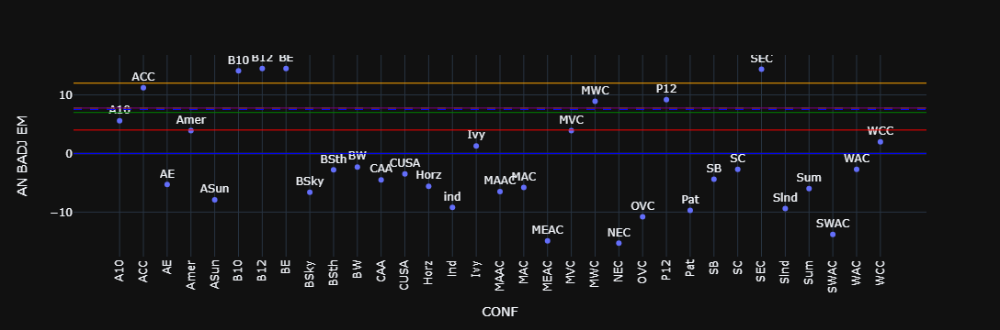

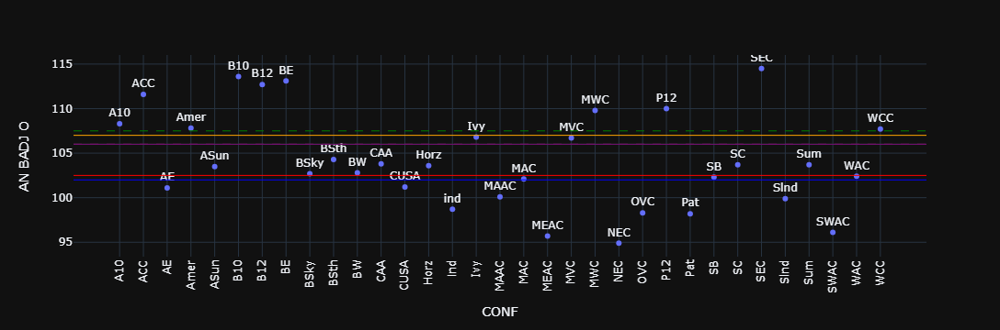

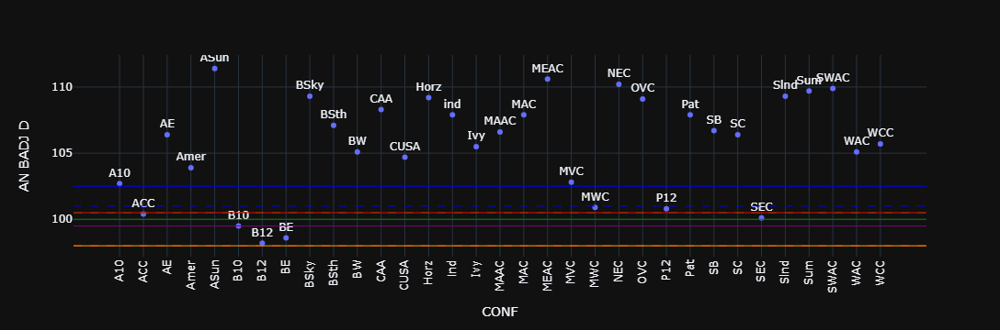

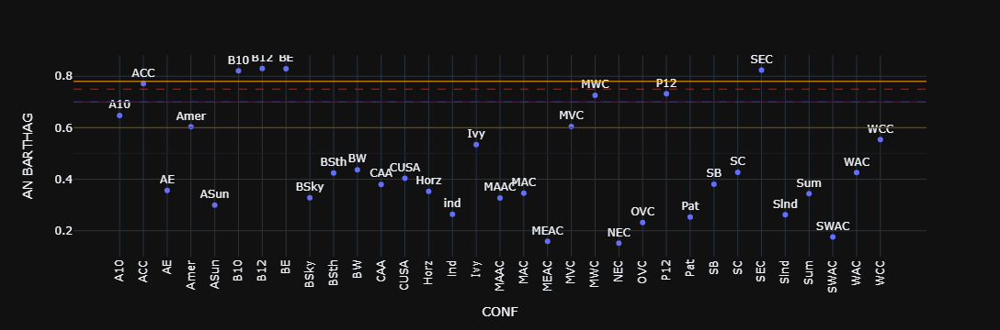

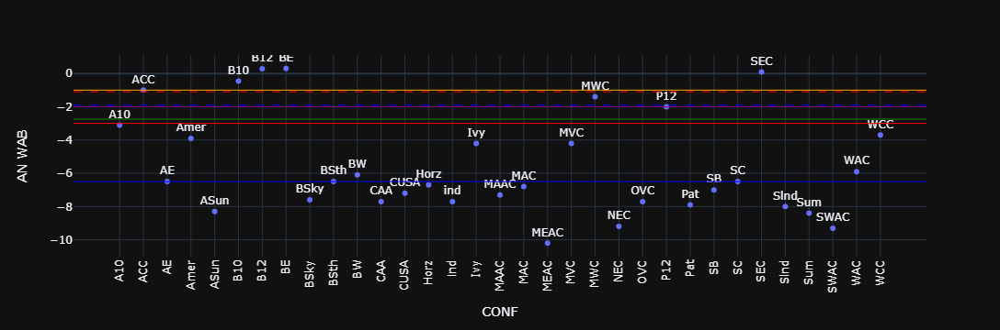

In [41]:
dfs = [cs_df, temp_csh_df, temp_csa_df, temp_csn_df, temp_csan_df]             
# Merge all columns to make one dataframe consisting of all conference stats       
curr_conf = reduce(lambda left, right: pd.merge(left, right, on = ['YEAR', 'CONF'], how = 'left'), dfs)

curr_conf = curr_conf.loc[curr_conf['YEAR'].eq(curr_year)] 
selected_cols = curr_conf.columns[curr_conf.columns.isin(['YEAR', 'CONF', 'BADJ EM', 'BADJ O', 'BADJ D', 'BARTHAG', 'WAB',
                                                          'AN BADJ EM', 'AN BADJ O', 'AN BADJ D', 'AN BARTHAG', 'AN WAB'])]  
curr_conf = curr_conf[selected_cols]

# Y Values where the threshold lines will be displayed    
y_value1 = [[9.5, 10.3, 11.2], [106.2, 106.6, 107.5], [99.9, 98.3, 98.3], [0.742, 0.765, 0.776], [- 3, - 2.7, - 2.2]]  
y_value2 = [[1.2, 5.3, 7.6, 9.1, 12.3], [102.6, 103.4, 106.7, 107.1, 109.2], 
            [103.7, 99.9, 98.9, 98.1, 98.1], [0.535, 0.648, 0.704, 0.739, 0.797], [- 8.5, - 7.5, - 4.5, - 3, - 1.4]] 
y_value3 = [[7.5, 7.75, 7.75], [106, 106, 107.5], [101, 98, 100.5], [ 0.7, 0.75, 0.7], [- 1.9, - 1.1, - 2]]  
y_value4 = [[0, 4, 7, 7.75, 12], [102, 102.5, 106, 106, 107], [102.5, 100.5, 100, 99.5, 98], [0.5, 0.6, 0.6, 0.7, 0.78], 
            [- 6.5, - 3, - 2.75, - 2, - 1]] 

for i in range(curr_conf.columns.get_loc('BADJ EM'), curr_conf.columns.get_loc('AN WAB') + 1) : 
    fig = px.scatter(curr_conf, x = 'CONF', y = curr_conf.columns[i], hover_data = ['YEAR'], text = 'CONF', template = 'plotly_dark') 
    fig.update_traces(textposition = 'top center')  
    if i < curr_conf.columns.get_loc('WAB') + 1 : 
        fig.add_hline(y = y_value1[i - 2][0], line_width = 1, line_dash = 'dash', line_color = 'blue')
        fig.add_hline(y = y_value1[i - 2][1], line_width = 1, line_dash = 'dash', line_color = 'red')
        fig.add_hline(y = y_value1[i - 2][2], line_width = 1, line_dash = 'dash', line_color = 'green')
        fig.add_hline(y = y_value2[i - 2][0], line_width = 1, line_color = 'blue')
        fig.add_hline(y = y_value2[i - 2][1], line_width = 1, line_color = 'red')
        fig.add_hline(y = y_value2[i - 2][2], line_width = 1, line_color = 'green')
        fig.add_hline(y = y_value2[i - 2][3], line_width = 1, line_color = 'purple')
        fig.add_hline(y = y_value2[i - 2][4], line_width = 1, line_color = 'orange')
    else : 
        fig.add_hline(y = y_value3[i - 7][0], line_width = 1, line_dash = 'dash', line_color = 'blue')
        fig.add_hline(y = y_value3[i - 7][1], line_width = 1, line_dash = 'dash', line_color = 'red')
        fig.add_hline(y = y_value3[i - 7][2], line_width = 1, line_dash = 'dash', line_color = 'green')
        fig.add_hline(y = y_value4[i - 7][0], line_width = 1, line_color = 'blue')
        fig.add_hline(y = y_value4[i - 7][1], line_width = 1, line_color = 'red')
        fig.add_hline(y = y_value4[i - 7][2], line_width = 1, line_color = 'green')
        fig.add_hline(y = y_value4[i - 7][3], line_width = 1, line_color = 'purple')
        fig.add_hline(y = y_value4[i - 7][4], line_width = 1, line_color = 'orange')

    if i == curr_conf.columns.get_loc('BADJ EM') : fig.update_layout(title = '<b> ' + str(curr_year) + ' Conferences </b>', title_x = 0.5, title_font = dict(size = 20)) 
    fig.update_xaxes(tickangle = - 90)
    fig.show()
    
del temp_csh_df, temp_csa_df, temp_csn_df, temp_csan_df     

In [42]:
# Combine all the Y Values into one array  
cond_arr = y_value1 + y_value2 + y_value3 + y_value4 
cond_df = pd.DataFrame(cond_arr)
cond_df.columns = ['SWEET 16', 'ELITE 8', 'FINAL 4', 'FINALS', 'CHAMPION']

stats_df = curr_conf.copy() 

stats_df = stats_df.iloc[:, 2 :] 
reg = stats_df.iloc[:, : 5].columns 
an = stats_df.iloc[:, 5 :].columns 

stats = reg  
stats = stats.append(reg)
stats = stats.append(an)
stats = stats.append(an) 

In [43]:
one_df = pd.DataFrame()
two_df = pd.DataFrame()
less_than_arr = [2, 7, 12, 17]
two_arr = [0, 1, 2, 3, 4, 10, 11, 12, 13, 14]

for i in range(5) : 
    temp_df1 = pd.DataFrame()   
    temp_df2 = pd.DataFrame()     
    k = 0 
    
    # Get rows of dataframe that meets the conference strength threshold 
    for j in range(len(cond_df)) : 
        if j in less_than_arr : 
            if j in two_arr : temp_df2 = pd.concat([temp_df2, curr_conf[curr_conf[stats[k]].to_frame().lt(cond_df.iloc[j, i]).any(axis = 1)]], axis = 0)
            else : temp_df1 = pd.concat([temp_df1, curr_conf[curr_conf[stats[k]].to_frame().lt(cond_df.iloc[j, i]).any(axis = 1)]], axis = 0)
        else : 
            if j in two_arr : temp_df2 = pd.concat([temp_df2, curr_conf[curr_conf[stats[k]].to_frame().gt(cond_df.iloc[j, i]).any(axis = 1)]], axis = 0)
            else : temp_df1 = pd.concat([temp_df1, curr_conf[curr_conf[stats[k]].to_frame().gt(cond_df.iloc[j, i]).any(axis = 1)]], axis = 0) 

        k += 1 
    
    temp_df1['ROUND'] = cond_df.columns[i]
    temp_df2['ROUND'] = cond_df.columns[i]
    
    one_df = pd.concat([one_df, temp_df1], axis = 0)
    two_df = pd.concat([two_df, temp_df2], axis = 0) 
    
one_df['TYPE'] = 'ONE'
two_df['TYPE'] = 'TWO'

threshold_count = pd.concat([one_df, two_df], axis = 0)
# Get the number of times that the conference meets the thresholds  
count = threshold_count.groupby(by = ['ROUND', 'TYPE', 'CONF']).size().reset_index(name = 'COUNT')  

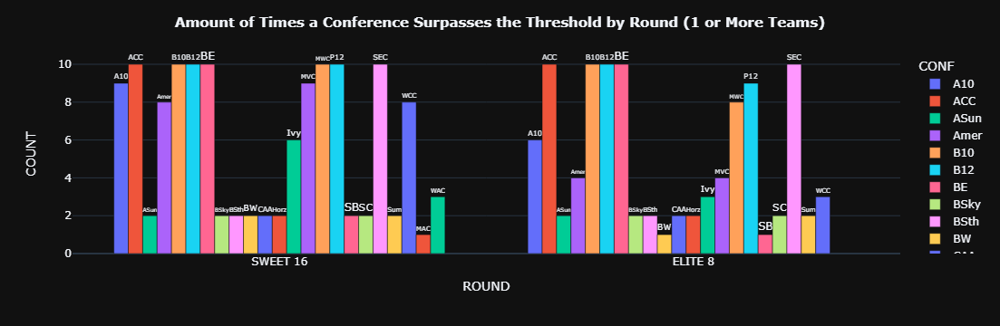

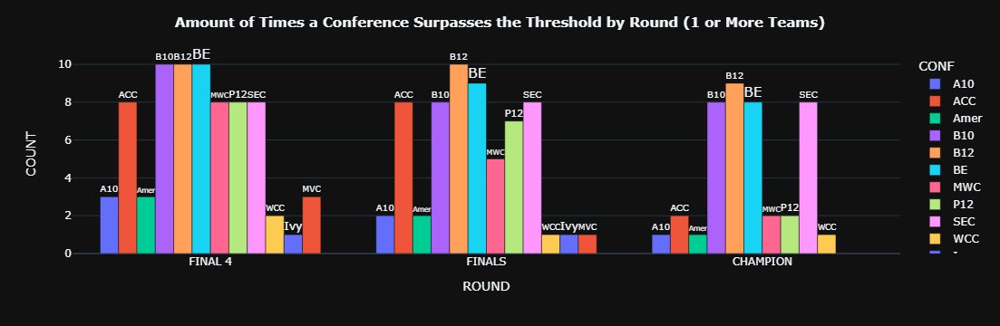

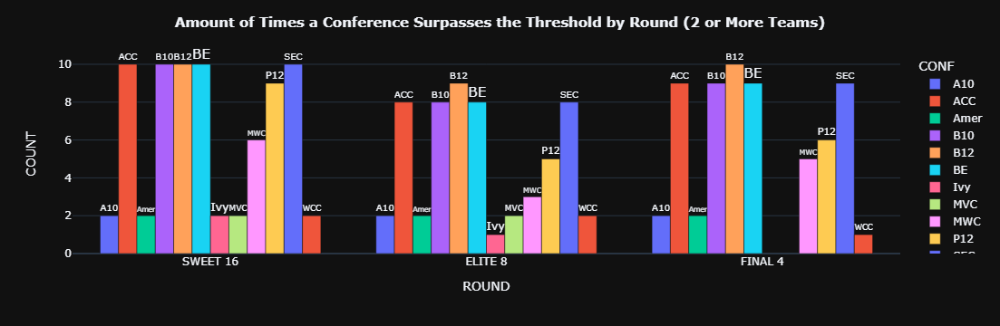

(None, None, None)

In [44]:
one1 = count.loc[count['TYPE'].eq('ONE') & (count['ROUND'].eq('ELITE 8') | count['ROUND'].eq('SWEET 16'))] 
one2 = count.loc[count['TYPE'].eq('ONE') & (count['ROUND'].ne('ELITE 8') & count['ROUND'].ne('SWEET 16'))] 
two = count.loc[count['TYPE'].eq('TWO')] 

fig1 = px.bar(one1, x = 'ROUND', y = 'COUNT', color = 'CONF', barmode = 'group', hover_data = ['TYPE'], text = 'CONF', template = 'plotly_dark')
fig2 = px.bar(one2, x = 'ROUND', y = 'COUNT', color = 'CONF', barmode = 'group', hover_data = ['TYPE'], text = 'CONF', template = 'plotly_dark') 
fig3 = px.bar(two, x = 'ROUND', y = 'COUNT', color = 'CONF', barmode = 'group', hover_data = ['TYPE'], text = 'CONF', template = 'plotly_dark') 

fig1.update_layout(title = '<b> Amount of Times a Conference Surpasses the Threshold by Round (1 or More Teams) </b>', title_x = 0.5, title_font = dict(size = 15)) 
fig2.update_layout(title = '<b> Amount of Times a Conference Surpasses the Threshold by Round (1 or More Teams) </b>', title_x = 0.5, title_font = dict(size = 15))
fig3.update_layout(title = '<b> Amount of Times a Conference Surpasses the Threshold by Round (2 or More Teams) </b>', title_x = 0.5, title_font = dict(size = 15))

fig1.update_xaxes(categoryorder = 'array', categoryarray = ['SWEET 16', 'ELITE 8'])
fig2.update_xaxes(categoryorder = 'array', categoryarray = ['FINAL 4', 'FINALS', 'CHAMPION'])
fig3.update_xaxes(categoryorder = 'array', categoryarray = ['SWEET 16', 'ELITE 8', 'FINAL 4'])  

fig1.update_traces(textfont_size = 50, textangle = 0, textposition = 'outside', cliponaxis = False)
fig2.update_traces(textfont_size = 50, textangle = 0, textposition = 'outside', cliponaxis = False)
fig3.update_traces(textfont_size = 50, textangle = 0, textposition = 'outside', cliponaxis = False)

fig1.show(), fig2.show(), fig3.show()  

In [45]:
# Create dataframe that transforms the complete_stats dataframe into a MinMaxScaler  
###################################################################################   

stats = complete_stats.copy()
stats = stats[['YEAR', 'TEAM', 'SEED', 'BADJ EM', 'WAB']]

scaler = MinMaxScaler() 
selected_cols = ['BADJ EM', 'WAB']

# Scale variables between a value of 0 to 1 for statistics of all teams    
stats[selected_cols] = scaler.fit_transform(stats[selected_cols])  
# Calculate the Seed Strength Value  
stats['STRENGTH'] = stats[selected_cols].sum(axis = 1) / len(selected_cols) * 100   

curr_stats = stats.loc[stats['YEAR'].eq(curr_year)]  
stats = stats.loc[stats['YEAR'].ne(curr_year)] 

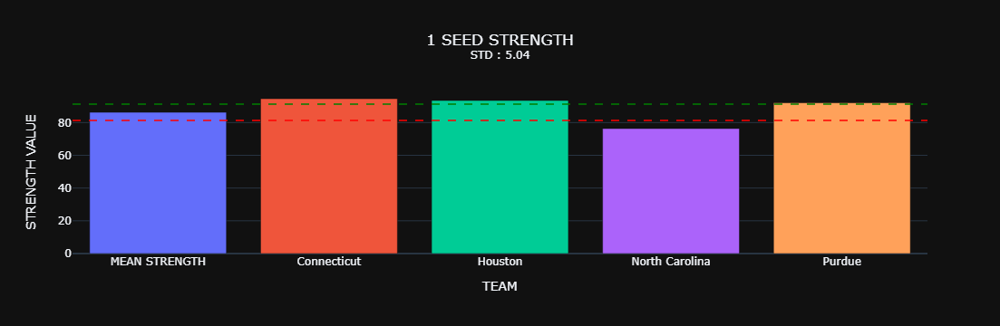

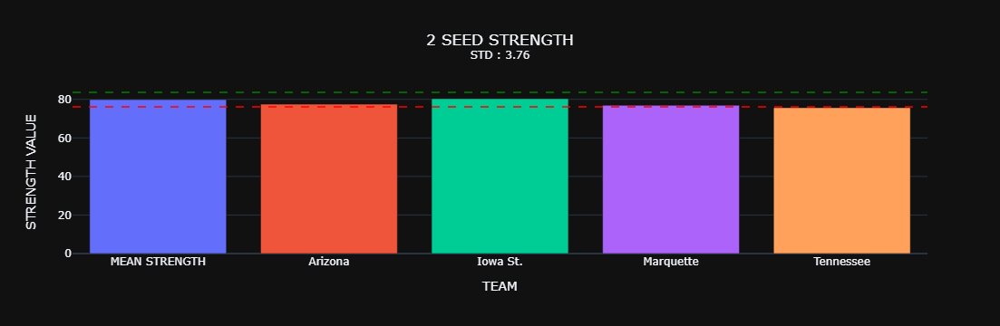

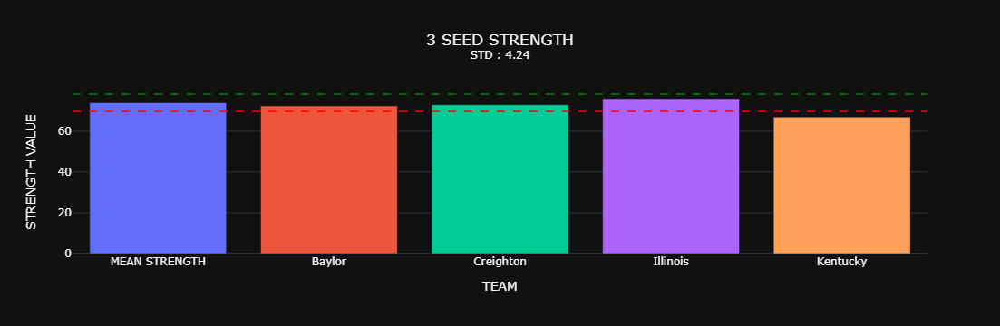

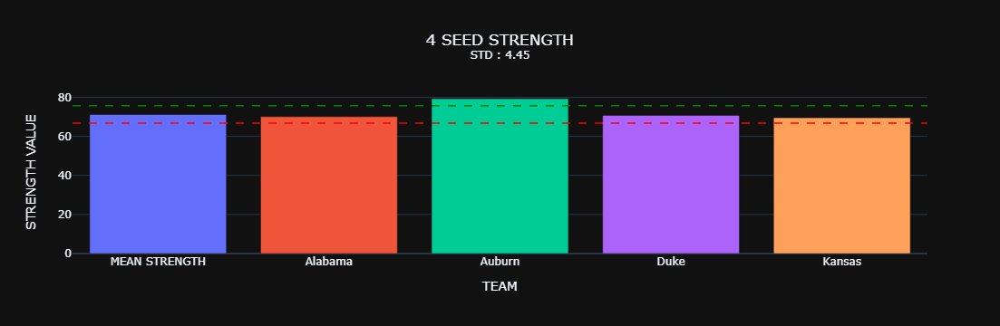

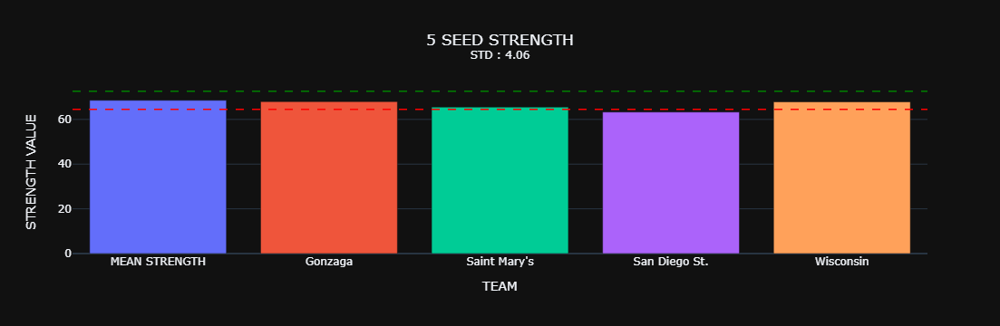

...

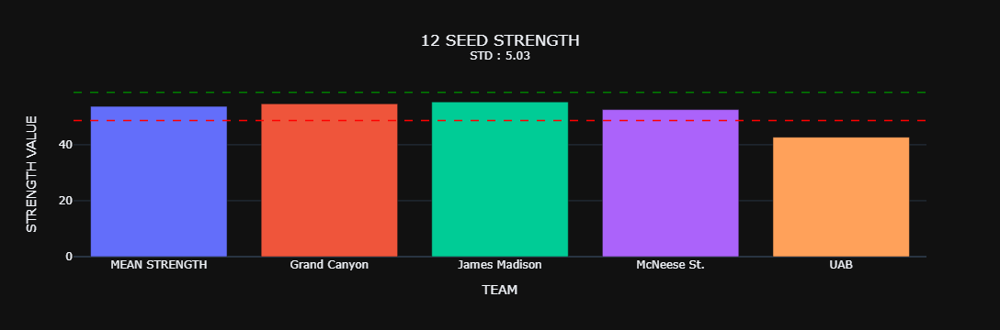

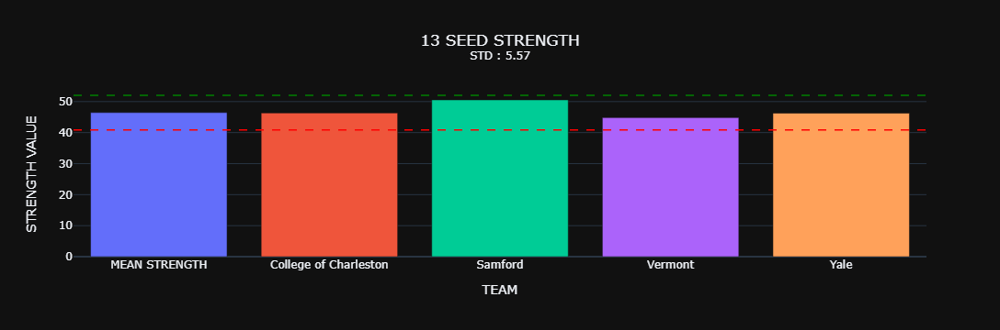

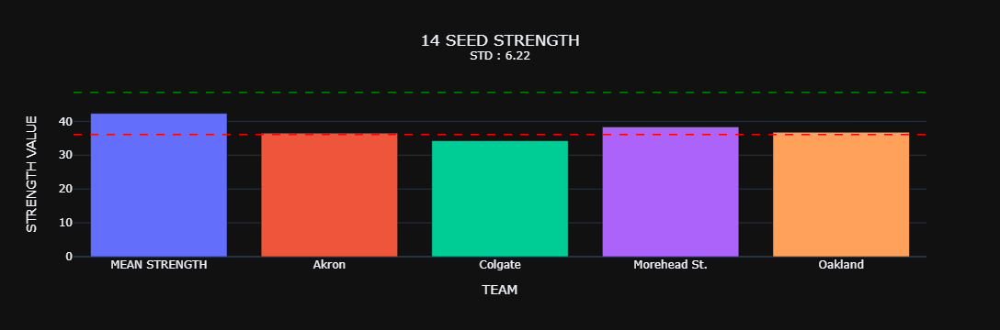

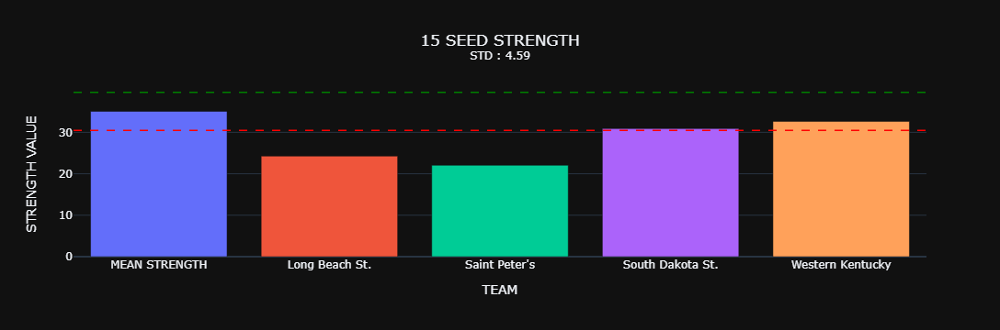

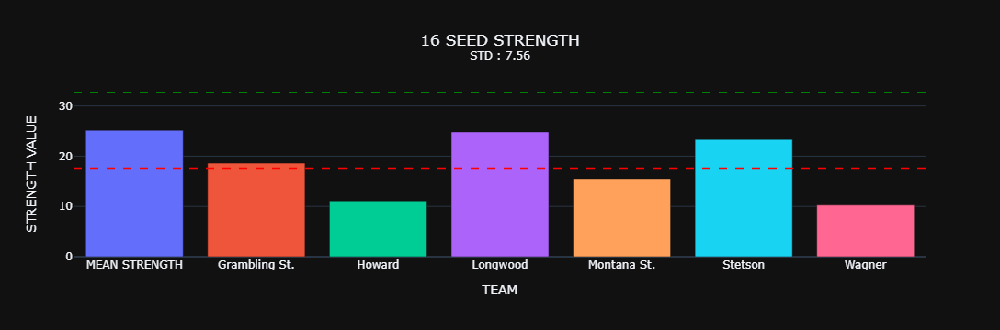

In [46]:
# Create dataframe consisting of each seed's mean seed strength along with the current team's seed strength  
###########################################################################################################  

for seed in range(1, 17) :  
    seed_df = stats.loc[stats['SEED'].isin([seed])] 
    # Get the average seed strength value of each seed 
    mean = seed_df[['STRENGTH']].mean() 
    mean_df = pd.DataFrame()     
    mean_df = pd.concat([mean_df, mean], axis = 1)
    mean_df.columns = [seed]  
    
    # Get the standard deviation of the seed strength value of each seed  
    std_df = seed_df[['STRENGTH']].std()
    
    curr_seed_df = curr_stats.loc[curr_stats['SEED'].isin([seed])]  
    curr_stats_df = curr_seed_df['STRENGTH'].to_frame() 
    curr_stats_df = curr_stats_df.reset_index(drop = True)
    curr_stats_df = curr_stats_df.rename(columns = {'STRENGTH' : seed}) 
    mean_df = pd.concat([mean_df, curr_stats_df], axis = 0) 
    team = np.array(['MEAN STRENGTH']) 
    team = np.append(team, curr_seed_df['TEAM'])
    mean_df['TEAM'] = team 
    
    t = str(seed) + ' SEED STRENGTH' + '<br><sup>' + 'STD : ' + std_df['STRENGTH'].round(2).astype(str) + '</sup>' 
    y1 = mean_df.iloc[0, 0] + std_df['STRENGTH'] 
    y2 = mean_df.iloc[0, 0] - std_df['STRENGTH'] 
    
    fig = px.bar(mean_df, x = 'TEAM', y = seed, color = 'TEAM', title = t, labels = {str(seed) : 'STRENGTH VALUE'}, template = 'plotly_dark')
    fig.add_hline(y = y1, line_width = 1.5, line_dash = 'dash', line_color = 'green') 
    fig.add_hline(y = y2, line_width = 1.5, line_dash = 'dash', line_color = 'red') 
    fig.update_layout(title_x = 0.5, showlegend = False)  
    fig.show()

In [47]:
# Set up the dataframes for the plots found below  
sr = sr_df.copy()
sr = order_df(df_input = sr , order_by = 'SEED', order = order_seed)  
sr['SEED'] = sr['SEED'].astype(str)

tr = tr_df.copy()
conf_res = conf_res_df.copy()
coach_res = coach_res_df.copy()

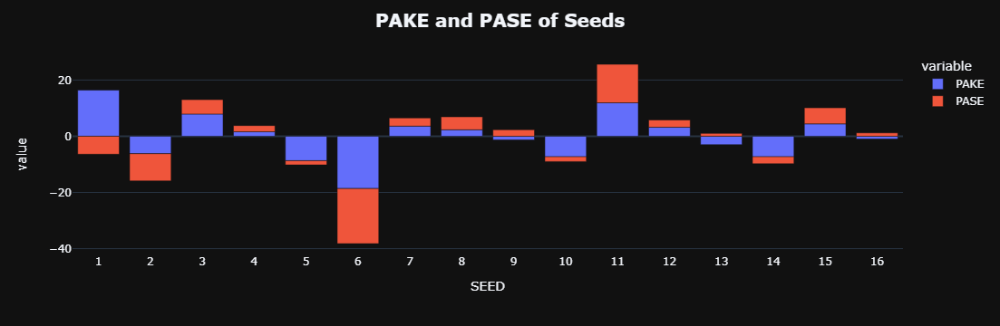

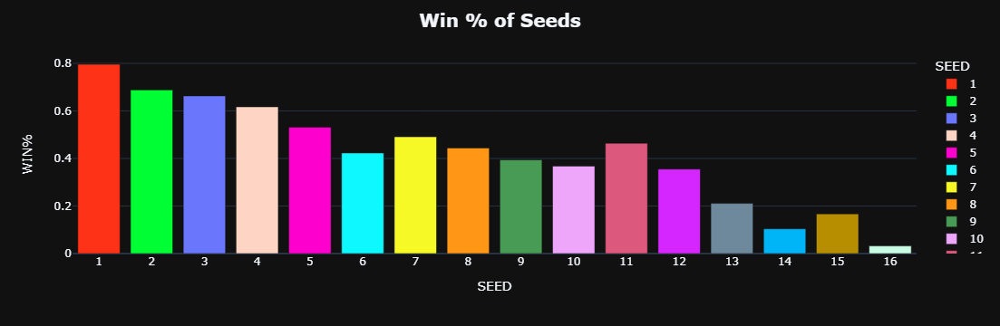

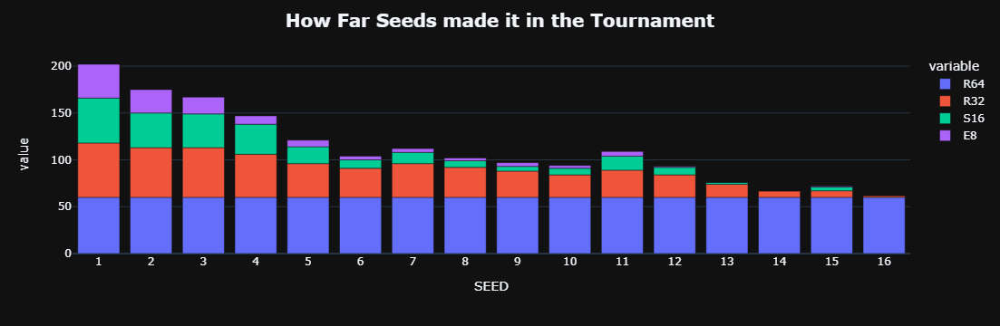

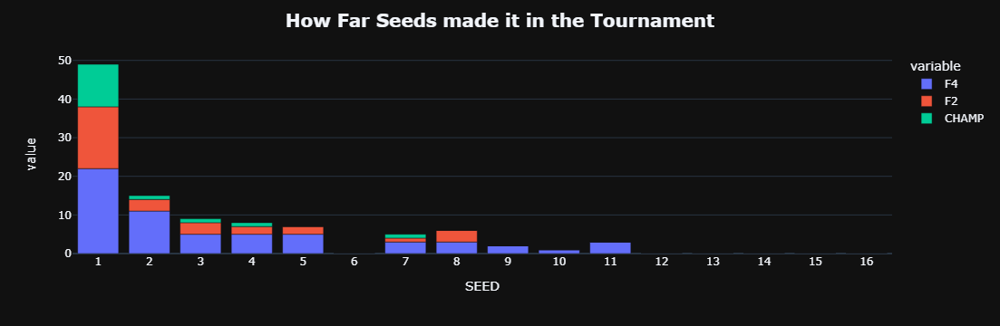

(None, None, None, None)

In [48]:
fig1 = px.bar(sr, x = 'SEED', y = ['PAKE', 'PASE'], template = 'plotly_dark')
fig2 = px.bar(sr, x = 'SEED', y = 'WIN%', color = 'SEED', color_discrete_sequence = px.colors.qualitative.Light24, template = 'plotly_dark')
fig3 = px.bar(sr, x = 'SEED', y = ['R64', 'R32', 'S16', 'E8'], template = 'plotly_dark')
fig4 = px.bar(sr, x = 'SEED', y = ['F4', 'F2', 'CHAMP'], template = 'plotly_dark')

fig1.update_layout(title = '<b> PAKE and PASE of Seeds </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig2.update_layout(title = '<b> Win % of Seeds </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig3.update_layout(title = '<b> How Far Seeds made it in the Tournament </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig4.update_layout(title = '<b> How Far Seeds made it in the Tournament </b>', title_x = 0.5, title_font = dict(size = 20)) 

fig1.show(), fig2.show(), fig3.show(), fig4.show()

In [143]:
fig1 = px.scatter(tr, x = 'TEAM ID', y = 'PAKE', hover_data = 'TEAM', color = 'PAKE', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig2 = px.scatter(tr, x = 'TEAM ID', y = 'PASE', hover_data = 'TEAM', color = 'PASE', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig3 = px.scatter(tr, x = 'TEAM ID', y = 'WIN%', hover_data = 'TEAM', color = 'WIN%', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig4 = px.scatter(tr, x = 'TEAM ID', y = 'R64', hover_data = 'TEAM', color = 'R64', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig5 = px.scatter(tr, x = 'TEAM ID', y = 'R32', hover_data = 'TEAM', color = 'R32', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig6 = px.scatter(tr, x = 'TEAM ID', y = 'S16', hover_data = 'TEAM', color = 'S16', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig7 = px.scatter(tr, x = 'TEAM ID', y = 'E8', hover_data = 'TEAM', color = 'E8', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig8 = px.scatter(tr, x = 'TEAM ID', y = 'F4', hover_data = 'TEAM', color = 'F4', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig9 = px.scatter(tr, x = 'TEAM ID', y = 'F2', hover_data = 'TEAM', color = 'F2', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig10 = px.scatter(tr, x = 'TEAM ID', y = 'CHAMP', hover_data = 'TEAM', color = 'CHAMP', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')

fig1.update_layout(title = '<b> PAKE of Teams </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig2.update_layout(title = '<b> PASE of Teams </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig3.update_layout(title = '<b> Win % of Teams </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig4.update_layout(title = '<b> How many Times a Team made the First Round </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig5.update_layout(title = '<b> How many Times a Team made the Second Round </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig6.update_layout(title = '<b> How many Times a Team made the Sweet 16 </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig7.update_layout(title = '<b> How many Times a Team made the Elite 8 </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig8.update_layout(title = '<b> How many Times a Team made the Final 4 </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig9.update_layout(title = '<b> How many Times a Team made the Finals </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig10.update_layout(title = '<b> How many Times a Team was a Champion </b>', title_x = 0.5, title_font = dict(size = 20)) 

fig1.show(), fig2.show(), fig3.show(), fig4.show(), fig5.show(), fig6.show(), fig7.show(), fig8.show(), fig9.show(), fig10.show()  

ValueError: Value of 'hover_data_0' is not the name of a column in 'data_frame'. Expected one of ['TEAM ID', 'TEAM', 'PAKE', 'PAKE RANK', 'PASE', 'PASE RANK', 'GAMES', 'W', 'L', 'WIN%', 'R64', 'R32', 'S16', 'E8', 'F4', 'F2', 'CHAMP', 'TOP2', 'F4%', 'CHAMP%'] but received: T

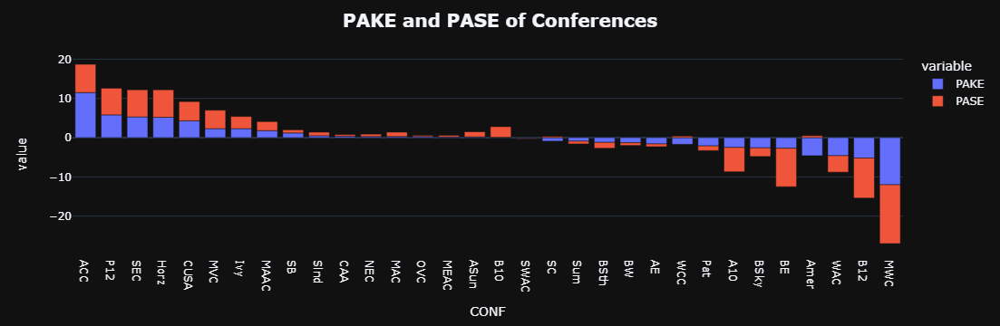

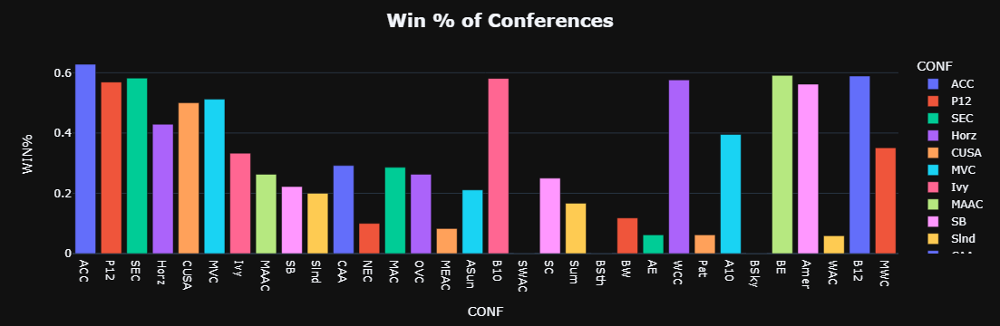

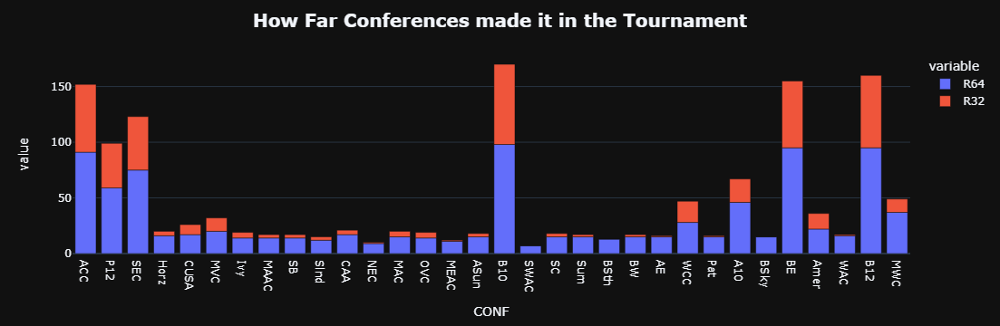

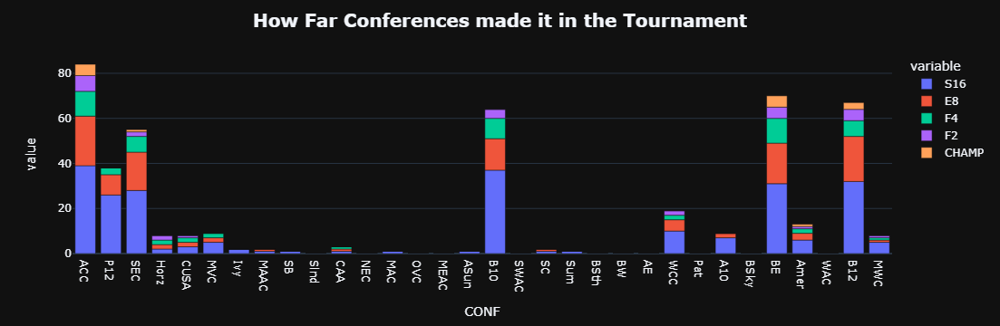

(None, None, None, None)

In [50]:
fig1 = px.bar(conf_res, x = 'CONF', y = ['PAKE', 'PASE'], template = 'plotly_dark')
fig2 = px.bar(conf_res, x = 'CONF', y = 'WIN%', color = 'CONF', template = 'plotly_dark')
fig3 = px.bar(conf_res, x = 'CONF', y = ['R64', 'R32'], template = 'plotly_dark')
fig4 = px.bar(conf_res, x = 'CONF', y = ['S16', 'E8', 'F4', 'F2', 'CHAMP'], template = 'plotly_dark')

fig1.update_layout(title = '<b> PAKE and PASE of Conferences </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig2.update_layout(title = '<b> Win % of Conferences </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig3.update_layout(title = '<b> How Far Conferences made it in the Tournament </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig4.update_layout(title = '<b> How Far Conferences made it in the Tournament </b>', title_x = 0.5, title_font = dict(size = 20)) 

fig1.show(), fig2.show(), fig3.show(), fig4.show()

In [51]:
fig1 = px.scatter(coach_res, x = 'COACH ID', y = 'PAKE', hover_data = 'COACH', color = 'PAKE', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig2 = px.scatter(coach_res, x = 'COACH ID', y = 'PASE', hover_data = 'COACH', color = 'PASE', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig3 = px.scatter(coach_res, x = 'COACH ID', y = 'WIN%', hover_data = 'COACH', color = 'WIN%', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig4 = px.scatter(coach_res, x = 'COACH ID', y = 'R64', hover_data = 'COACH', color = 'R64', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig5 = px.scatter(coach_res, x = 'COACH ID', y = 'R32', hover_data = 'COACH', color = 'R32', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig6 = px.scatter(coach_res, x = 'COACH ID', y = 'S16', hover_data = 'COACH', color = 'S16', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig7 = px.scatter(coach_res, x = 'COACH ID', y = 'E8', hover_data = 'COACH', color = 'E8', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig8 = px.scatter(coach_res, x = 'COACH ID', y = 'F4', hover_data = 'COACH', color = 'F4', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig9 = px.scatter(coach_res, x = 'COACH ID', y = 'F2', hover_data = 'COACH', color = 'F2', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
fig10 = px.scatter(coach_res, x = 'COACH ID', y = 'CHAMP', hover_data = 'COACH', color = 'CHAMP', color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')

fig1.update_layout(title = '<b> PAKE of Coaches </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig2.update_layout(title = '<b> PASE of Coaches </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig3.update_layout(title = '<b> Win % of Coaches </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig4.update_layout(title = '<b> How many Times a Coach made the First Round </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig5.update_layout(title = '<b> How many Times a Coach made the Second Round </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig6.update_layout(title = '<b> How many Times a Coach made the Sweet 16 </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig7.update_layout(title = '<b> How many Times a Coach made the Elite 8 </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig8.update_layout(title = '<b> How many Times a Coach made the Final 4 </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig9.update_layout(title = '<b> How many Times a Coach made the Finals </b>', title_x = 0.5, title_font = dict(size = 20)) 
fig10.update_layout(title = '<b> How many Times a Coach was a Champion </b>', title_x = 0.5, title_font = dict(size = 20)) 

fig1.show(), fig2.show(), fig3.show(), fig4.show(), fig5.show(), fig6.show(), fig7.show(), fig8.show(), fig9.show(), fig10.show()  

ValueError: Value of 'hover_data_0' is not the name of a column in 'data_frame'. Expected one of ['COACH ID', 'COACH', 'PAKE', 'PAKE RANK', 'PASE', 'PASE RANK', 'GAMES', 'W', 'L', 'WIN%', 'R64', 'R32', 'S16', 'E8', 'F4', 'F2', 'CHAMP', 'TOP2', 'F4%', 'CHAMP%'] but received: C

In [52]:
# Create dataframe that depicts the correlations of various statistics and upset count in tournament quadrants 
def make_corr_df(quad_df1, quad_df2, quad_no, mode) : 
    quad_arr = []
    
    for quad in quad_no : 
        # Get all teams that played in a specific quadrant by year   
        upsets = quad_df1.loc[quad_df1['ROUND'].ne(68) & quad_df1['QUAD NO'].eq(quad)]     
        # Get the standard deviation of various stats of each quadrant number      
        quad_arr.append(upsets[['KADJ EM', 'BADJ EM', 'KADJ O', 'BADJ O', 'KADJ D', 'BADJ D', 'BARTHAG', 'WAB']].std())    
    
    quad_arr = np.array([quad_arr])
    quad_arr = np.transpose(quad_arr) 
    
    if mode == 'curr' : 
        quad_df2['YEAR'] = [curr_year] * 4 
        quad_df2['YEAR'] = quad_df2['YEAR'].astype(str)   
    
    quad_df2['KADJ EM STD'] = quad_arr[0]
    quad_df2['BADJ EM STD'] = quad_arr[1]
    quad_df2['KADJ O STD'] = quad_arr[2]
    quad_df2['BADJ O STD'] = quad_arr[3]
    quad_df2['KADJ D STD'] = quad_arr[4]
    quad_df2['BADJ D STD'] = quad_arr[5]
    quad_df2['BARTHAG STD'] = quad_arr[6]
    quad_df2['WAB STD'] = quad_arr[7]
      
    # Get the correlations between the standard deviations of various stats and how many upsets occurred  
    if mode == 'past' :  
        quad_df2['W YEAR'] = quad_df2['W YEAR'].astype(str)   
        corr_df = pd.DataFrame()
        corr_arr = []
        
        for i in range(8) : 
            corr_arr.append(quad_df2['TOTAL UPSETS'].corr(quad_df2.iloc[:, i + 3])) 

        corr_df['CORR'] = corr_arr 
        corr_df = corr_df.T 
        corr_df.columns = quad_df2.columns[3:]
        corr_df = corr_df.T  
        
        # Display the lowest values in each column as a green highlighted box   
        return corr_df.style.highlight_min(color = 'green', axis = 0)  

    # Get the current quadrant numbers  
    elif mode == 'curr' : 
        quad_df2['QUAD NO'] = quad_no 
        quad_df2.set_index(['YEAR', 'QUAD NO'], inplace = True, drop = True)
        # Display the lowest values in each column as a green highlighted box    
        return quad_df2.style.highlight_min(color = 'green', axis = 0) 

In [53]:
# Create dataframe consisting of quadrant statistics  
####################################################      

quad_df = tm2.copy() 
quad_df = quad_df.loc[quad_df['W YEAR'].ne(curr_year)] 
# Get all upset matchups    
quad_df = quad_df.loc[quad_df['W SEED'] - quad_df['L SEED'] >= 2]  
# Get all matchups from the First Round to the Elite 8  
quad_df = quad_df.loc[quad_df['W CURRENT ROUND'].ge(8)] 
# Get the count of upsets for each quadrant number   
quad_df = quad_df.groupby(by = ['W YEAR', 'W QUAD NO']).size().reset_index(name = 'TOTAL UPSETS') 

# Insert rows where the upset count is 0  
quad_df.loc[0.5] = 2008, 2, 0 
quad_df.loc[1.5] = 2008, 4, 0 
quad_df = quad_df.sort_index().reset_index(drop = True) 

quad_no = np.arange(tournament_count * 4)   
curr_quad_no = np.arange(61, 65)   
quad_arr, curr_quad_arr = [], []   
 
cs_quad = complete_stats.copy()   
# Get all teams that are 1 - 13 seeds for the purpose of finding adjusted correlations  
cs_curr_quad = cs_quad.loc[cs_quad['YEAR'].eq(curr_year) & cs_quad['SEED'].le(14)] 
cs_quad = cs_quad.loc[cs_quad['YEAR'].ne(curr_year) & cs_quad['SEED'].le(14)]

curr_quad_df = pd.DataFrame(columns = ['YEAR', 'QUAD NO'])

In [54]:
make_corr_df(cs_quad, quad_df, quad_no, 'past')   

,CORR
KADJ EM STD,-0.193988
BADJ EM STD,-0.310162
KADJ O STD,-0.182167
BADJ O STD,-0.210458
KADJ D STD,0.094048
BADJ D STD,0.051329
BARTHAG STD,-0.273569
WAB STD,-0.145366


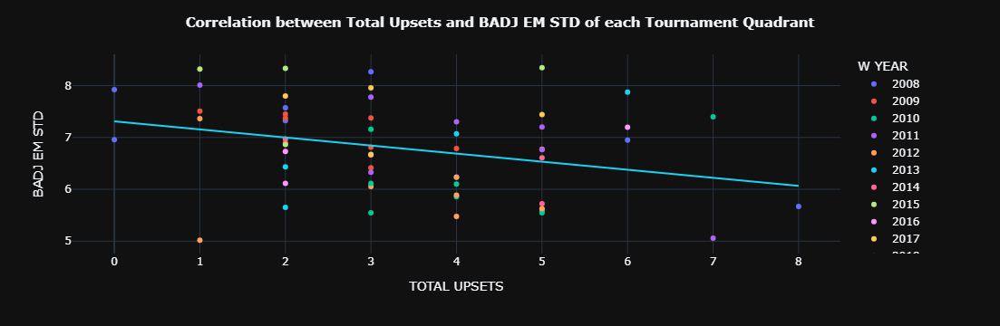

In [55]:
fig = px.scatter(quad_df , x = 'TOTAL UPSETS', y = 'BADJ EM STD', hover_data = ['W QUAD NO'], trendline = 'ols', trendline_scope = 'overall', color = 'W YEAR', template = 'plotly_dark')
fig.update_layout(title = '<b> Correlation between Total Upsets and BADJ EM STD of each Tournament Quadrant </b>', title_x = 0.5, title_font = dict(size = 15))  
fig.show()

In [56]:
make_corr_df(cs_curr_quad, curr_quad_df, curr_quad_no, 'curr')  

In [57]:
quad_61 = (7.072967 - 7.31007) / (- 0.155482) 
quad_62 = (7.529940 - 7.31007) / (- 0.155482) 
quad_63 = (7.056873 - 7.31007) / (- 0.155482) 
quad_64 = (8.601647 - 7.31007) / (- 0.155482) 

print('QUAD 61 PREDICTED UPSET COUNT :', quad_61)
print('QUAD 62 PREDICTED UPSET COUNT :', quad_62)
print('QUAD 63 PREDICTED UPSET COUNT :', quad_63)
print('QUAD 64 PREDICTED UPSET COUNT :', quad_64)

QUAD 61 PREDICTED UPSET COUNT : 1.524954657130725
QUAD 62 PREDICTED UPSET COUNT : -1.414118676116851
QUAD 63 PREDICTED UPSET COUNT : 1.6284650313219486
QUAD 64 PREDICTED UPSET COUNT : -8.30692298786998


In [58]:
# Get the count of the Champions from the quadrant IDs  
quad_df = complete_stats.copy()
quad_df = quad_df.loc[quad_df['YEAR'].ne(curr_year) & quad_df['QUAD ID'].ne(0)]
quad_df = quad_df.groupby(by = ['ROUND', 'QUAD ID']).size().reset_index(name = 'TOTAL TEAMS') 
quad_df = quad_df.loc[quad_df['ROUND'].le(2)]
quad_df 

,ROUND,QUAD ID,TOTAL TEAMS
0,1,1,6
1,1,2,3
2,1,3,3
3,1,4,3
4,2,1,3
5,2,2,3
6,2,3,6
7,2,4,3


In [59]:
print(' 4 | 2' )
print('---|---')
print(' 3 | 1' )

 4 | 2
---|---
 3 | 1


In [60]:
# Create dataframe to get WIN % of teams when given specific parameters  
def make_wins_df(df, mode) : 
    wins_df2 = df.copy() 
    wins_df2 = wins_df2[wins_df2['ROUND'].ne(68)] 
    
    # The 2021 tournament was all played in the same time zone which skews the data; removing it normalizes the data  
    if mode == 1 : wins_df2 = wins_df2[wins_df2['YEAR'].ne(2021)] 
    
    # Get the count of wins and losses per seed and round 
    if mode == 0 : wins_df2 = wins_df2.groupby(by = ['SEED', 'CURRENT ROUND', 'OUTCOME']).size().reset_index(name = 'TOTAL W/L')
    # Get the count of wins and losses per seed, round, and time zones crossed value  
    elif mode == 1 : wins_df2 = wins_df2.groupby(by = ['SEED', 'CURRENT ROUND', 'TIME ZONES CROSSED VALUE', 'OUTCOME']).size().reset_index(name = 'TOTAL W/L') 
    
    temp_curr_round = [2, 4, 8, 16, 32, 64, 100]
    temp_tz_val = [- 2, 1, 2]
    wins_perc_arr, temp_round_arr, seed_arr, tz_arr = [], [], [], [] 
    
    # Get the Average Win % of seeds by round  
    if mode == 0 : 
        for seed in order_seed :    
            for rnd in temp_curr_round : 
                temp_df = wins_df2.copy()  
                
                # Round 100 represents the total of all rounds; it is not an actual round  
                if rnd != 100 : 
                    temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & temp_df['CURRENT ROUND'].isin([rnd])] 

                    if 1 in temp_df['OUTCOME'].values : 
                        oc1_df = temp_df.loc[temp_df['OUTCOME'].isin([1])] 
                        # Get the total win % of seeds by round  
                        wins_perc_arr.append(oc1_df['TOTAL W/L'].sum() / temp_df['TOTAL W/L'].sum() * 100) 
                    else : 
                        wins_perc_arr.append(0)
                else : 
                    temp_df = temp_df.loc[temp_df['SEED'].isin([seed])]  
                    oc1_df = temp_df.loc[temp_df['OUTCOME'].isin([1])] 
                    # Get the total win % of seeds   
                    wins_perc_arr.append(oc1_df['TOTAL W/L'].sum() / temp_df['TOTAL W/L'].sum() * 100) 

                temp_round_arr.append(rnd)
                seed_arr.append(seed)
    # Get the Average Win % of seeds by round and time zones crossed value  
    elif mode == 1 : 
        for seed in order_seed :    
            for rnd in temp_curr_round : 
                for val in temp_tz_val : 
                    temp_df = wins_df2.copy()  
                    
                    if rnd != 100 : 
                        # Create a dataframe based on the time zones crossed value conditions 
                        if val == - 2 : temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & temp_df['CURRENT ROUND'].isin([rnd]) & temp_df['TIME ZONES CROSSED VALUE'].le(val)] 
                        elif val == 1 : temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & temp_df['CURRENT ROUND'].isin([rnd]) & (temp_df['TIME ZONES CROSSED VALUE'].ge(- val) & temp_df['TIME ZONES CROSSED VALUE'].le(val))] 
                        elif val == 2 : temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & temp_df['CURRENT ROUND'].isin([rnd]) & temp_df['TIME ZONES CROSSED VALUE'].ge(val)] 

                        if 1 in temp_df['OUTCOME'].values : 
                            oc1_df = temp_df.loc[temp_df['OUTCOME'].isin([1])] 
                            # Get the total win % of seeds by round and time zones crossed value 
                            wins_perc_arr.append(oc1_df['TOTAL W/L'].sum() / temp_df['TOTAL W/L'].sum() * 100) 
                        else : 
                            wins_perc_arr.append(0)
                    else : 
                        if val == - 2 : temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & temp_df['TIME ZONES CROSSED VALUE'].le(val)] 
                        elif val == 1 : temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & (temp_df['TIME ZONES CROSSED VALUE'].ge(- val) & temp_df['TIME ZONES CROSSED VALUE'].le(val))] 
                        elif val == 2 : temp_df = temp_df.loc[temp_df['SEED'].isin([seed]) & temp_df['TIME ZONES CROSSED VALUE'].ge(val)]  
                        oc1_df = temp_df.loc[temp_df['OUTCOME'].isin([1])] 
                        # Get the total win % of seeds by time zones crossed value  
                        wins_perc_arr.append(oc1_df['TOTAL W/L'].sum() / temp_df['TOTAL W/L'].sum() * 100) 

                    temp_round_arr.append(rnd)
                    seed_arr.append(seed)
                    tz_arr.append(val)

    temp_round_str = ['FINALS', 'FINAL 4', 'ELITE 8', 'SWEET 16', 'SECOND ROUND', 'FIRST ROUND', 'TOTAL']

    wins_perc_df = pd.DataFrame()
    wins_perc_df['SEED'] = seed_arr 
    wins_perc_df['SEED'] = wins_perc_df['SEED'].astype(str)
    wins_perc_df['ROUND'] = temp_round_arr 
    change_round_str(wins_perc_df, temp_curr_round, temp_round_str)   # Change Round values to strings         
    wins_perc_df['ROUND'] = wins_perc_df['ROUND'].astype(str)
    wins_perc_df['WIN%'] = wins_perc_arr  
    
    # Add time zones crossed value to the dataframe  
    if mode == 1 : 
        wins_perc_df['TIME ZONE VAL'] = tz_arr 
    
    return wins_perc_df  

In [61]:
# Create dataframe consisting of the seeds' WIN % by time zone   
##############################################################  

tl = tl_df.copy()
tl = tl.drop(columns = ['YEAR', 'BY ROUND NO', 'TEAM NO', 'TEAM', 'SEED', 'ROUND'])
# Combine the tournament matchups and locations dataframes to get the time zones of each matchup  
tz = pd.merge(tm_df, tl, on = 'BY YEAR NO', how = 'left')

tz = tz.sort_values(by = ['BY YEAR NO'], ascending = False) 
tz = tz.reset_index(drop = True)
temp_df = ordered_df.copy()
temp_df = temp_df.sort_values(by = ['BY YEAR NO'], ascending = False) 
temp_df = temp_df.reset_index(drop = True)
# Copy the OUTCOME column to the time zone dataframe 
tz['OUTCOME'] = temp_df['OUTCOME']
curr_tz = tz.loc[tz['YEAR'].eq(curr_year)]
tz = tz.loc[tz['YEAR'].ne(curr_year)]

# Get the win percent of seeds by round and time zone  
tz_wins = make_wins_df(tz, 1)
tz_wins['TIME ZONE VAL'] = tz_wins['TIME ZONE VAL'].astype(str)
tz_wins = tz_wins.replace({'TIME ZONE VAL' : {'-2' : '2+ Time Zones West', '1' : 'Within 1 Time Zone', '2' : '2+ Time Zones East'}})  

del temp_df 

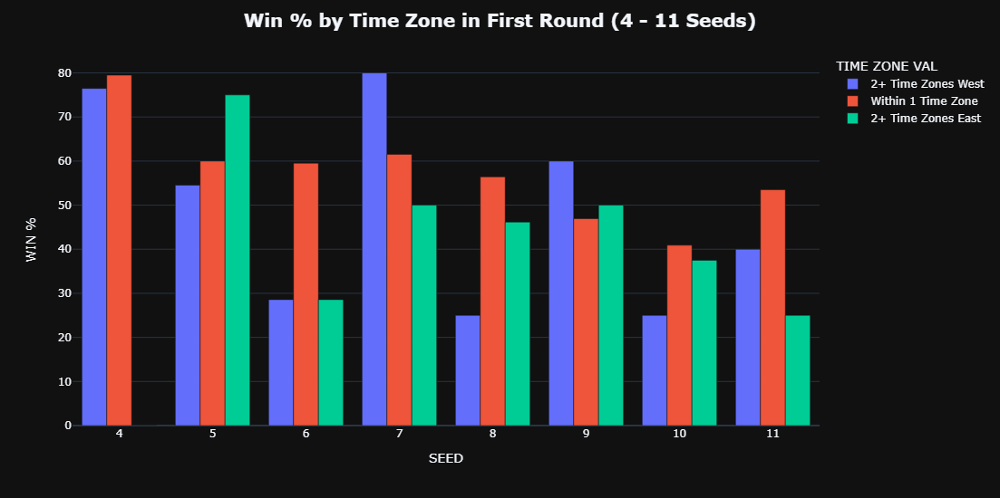

In [62]:
tz_wins_fr = tz_wins.loc[tz_wins['ROUND'].eq('FIRST ROUND')]  
tz_wins_fr1 = tz_wins_fr.iloc[9:33] 

fig = px.bar(tz_wins_fr1, x = 'SEED', y = 'WIN%', color = 'TIME ZONE VAL', barmode = 'group', template = 'plotly_dark')
fig.update_layout(title = '<b> Win % by Time Zone in First Round (4 - 11 Seeds) </b>', title_x = 0.5, title_font = dict(size = 20), 
                  yaxis_title = 'WIN %', height = 550)  
fig.show()

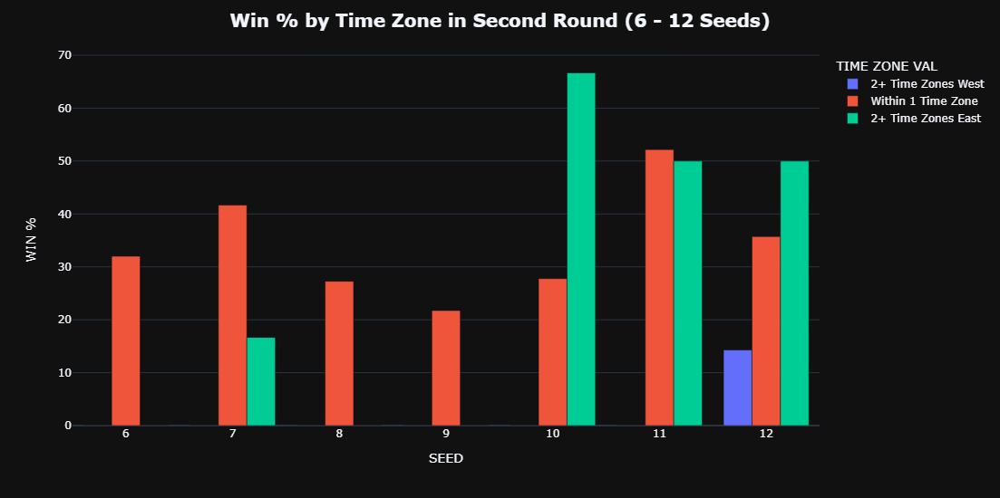

In [63]:
tz_wins_sr = tz_wins.loc[tz_wins['ROUND'].eq('SECOND ROUND')]  
tz_wins_sr1 = tz_wins_sr.iloc[15 : 36] 

fig = px.bar(tz_wins_sr1, x = 'SEED', y = 'WIN%', color = 'TIME ZONE VAL', barmode = 'group', template = 'plotly_dark')
fig.update_layout(title = '<b> Win % by Time Zone in Second Round (6 - 12 Seeds) </b>', title_x = 0.5, title_font = dict(size = 20), 
                  yaxis_title = 'WIN %', height = 550)  
fig.show()

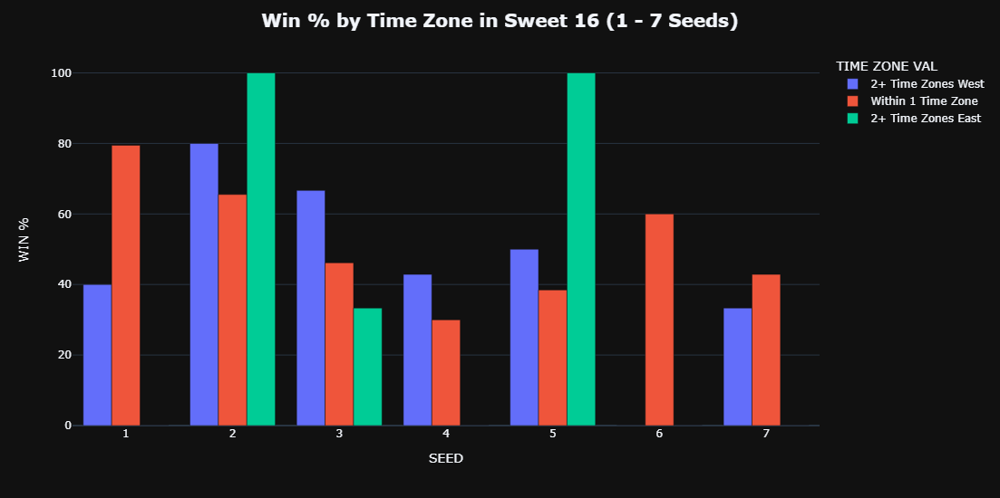

In [64]:
tz_wins_ss = tz_wins.loc[tz_wins['ROUND'].eq('SWEET 16')]  
tz_wins_ss1 = tz_wins_ss.iloc[:21] 

fig = px.bar(tz_wins_ss1, x = 'SEED', y = 'WIN%', color = 'TIME ZONE VAL', barmode = 'group', template = 'plotly_dark')
fig.update_layout(title = '<b> Win % by Time Zone in Sweet 16 (1 - 7 Seeds) </b>', title_x = 0.5, title_font = dict(size = 20), 
                  yaxis_title = 'WIN %', height = 550)  
fig.show()

In [65]:
tv_num = [3, 2, 1, 0, - 1, - 2, - 3]
curr_tz = order_df(df_input = curr_tz, order_by = 'TIME ZONES CROSSED VALUE', order = tv_num) 
curr_tz = curr_tz.replace({'TIME ZONES CROSSED VALUE' : {- 3 : '3 Time Zones West', - 2 : '2 Time Zones West', - 1 : '1 Time Zones West', 0 : 'No Time Zone Change', 
                                                           3 : '3 Time Zones East', 2 : '2 Time Zones East', 1 : '1 Time Zones East'}})
curr_tz = curr_tz[['YEAR', 'TEAM', 'SEED', 'CURRENT ROUND', 'TIME ZONES CROSSED VALUE', 'DISTANCE (KM)', 'DISTANCE (MI)']]
curr_tz_64 = curr_tz.loc[curr_tz['CURRENT ROUND'].eq(64)]
curr_tz_64 = curr_tz_64.drop_duplicates(subset = ['TEAM'])
curr_tz_64.head(68)

,YEAR,TEAM,SEED,CURRENT ROUND,TIME ZONES CROSSED VALUE,DISTANCE (KM),DISTANCE (MI)
51,2024,Oregon,11,64,3 Time Zones East,3528.960946,2192.794670
9,2024,Montana St.,16,64,2 Time Zones East,2125.469200,1320.705331
52,2024,Washington St.,7,64,2 Time Zones East,1798.602908,1117.600033
57,2024,Boise St.,10,64,2 Time Zones East,2516.865045,1563.907434
59,2024,Colorado,10,64,2 Time Zones East,1627.683918,1011.395896
...,...,...,...,...,...,...,...
68,2024,Nebraska,8,64,No Time Zone Change,857.793932,533.008438
69,2024,Texas A&M,9,64,No Time Zone Change,772.475265,479.993876
54,2024,Dayton,7,64,2 Time Zones West,2343.317314,1456.069873
29,2024,Yale,13,64,3 Time Zones West,3549.241292,2205.396293


In [66]:
curr_tz_32 = curr_tz.loc[curr_tz['CURRENT ROUND'].eq(32)]
curr_tz_32 = curr_tz_32.drop_duplicates(subset = ['TEAM'])
curr_tz_32.head(32)

,YEAR,TEAM,SEED,CURRENT ROUND,TIME ZONES CROSSED VALUE,DISTANCE (KM),DISTANCE (MI)
123,2024,Oregon,11,32,3 Time Zones East,3528.960946,2192.794670
85,2024,Utah St.,8,32,2 Time Zones East,2165.724919,1345.719075
89,2024,Washington St.,7,32,2 Time Zones East,1798.602908,1117.600033
99,2024,Boise St.,10,32,2 Time Zones East,2516.865045,1563.907434
101,2024,Colorado,10,32,2 Time Zones East,1627.683918,1011.395896
107,2024,Colorado St.,10,32,2 Time Zones East,2200.744544,1367.479261
75,2024,Northwestern,9,32,1 Time Zones East,1155.748130,718.148593
77,2024,Mississippi St.,8,32,1 Time Zones East,758.185193,471.114438
87,2024,TCU,9,32,1 Time Zones East,1267.738304,787.736061
95,2024,Nevada,10,32,1 Time Zones East,686.971271,426.864158


In [67]:
curr_tz_16 = curr_tz.loc[curr_tz['CURRENT ROUND'].eq(16)]
curr_tz_16 = curr_tz_16.drop_duplicates(subset = ['TEAM'])
curr_tz_16.head(16)

,YEAR,TEAM,SEED,CURRENT ROUND,TIME ZONES CROSSED VALUE,DISTANCE (KM),DISTANCE (MI)
135,2024,San Diego St.,5,16,3 Time Zones East,4150.210722,2578.821384
147,2024,Gonzaga,5,16,3 Time Zones East,2743.638378,1704.817850
133,2024,Auburn,4,16,1 Time Zones East,1667.737786,1036.284216
145,2024,Kansas,4,16,1 Time Zones East,1092.868460,679.076978
132,2024,Connecticut,1,16,No Time Zone Change,116.018338,72.090453
139,2024,Saint Mary's,5,16,No Time Zone Change,546.962261,339.866592
140,2024,Houston,1,16,No Time Zone Change,362.451487,225.216913
143,2024,Wisconsin,5,16,No Time Zone Change,1314.810993,816.985674
144,2024,Purdue,1,16,No Time Zone Change,385.611820,239.608077
141,2024,Duke,4,16,1 Time Zones West,1679.323800,1043.483432


In [68]:
# Create dataframe merging the Preseason AP Votes statistics with the KenPom Barttorvik dataframe  
#################################################################################################   

pv = pv_df.copy()
pv = pv.dropna()
curr_pv = pv.loc[pv['YEAR'].eq(curr_year)]
pv = pv.loc[pv['YEAR'].ne(curr_year)]

# Get the preseason AP votes of all tournament teams  
pv_count = pd.merge(kb_df, pv, how = 'left', on = ['TEAM NO'])
pv_count = pv_count.loc[pv_count['YEAR_x'].ne(curr_year) & pv_count['ROUND_x'].ne(68)] 
# Replace N/A cells with the value 0  
pv_count['AP VOTES'] = pv_count['AP VOTES'].fillna(0)
pv_count['AP RANK'] = pv_count['AP RANK'].fillna(0)
pv_count['RANK?'] = pv_count['RANK?'].fillna(0)
pv_count['WINS'] = pv_count['ROUND_x']
wins = [6, 5, 4, 3, 2, 1, 0]

In [69]:
# Create array of the average wins and average AP Votes for tournament teams  
############################################################################  

# Convert the round numbers to win count  
for i in rounds_num2 : 
    pv_count.loc[pv_count['WINS'] == i, 'WINS'] = wins[rounds_num2.index(i)]   

# Get the number of wins for each seed by rank status and preseason AP vote count   
pv_avg = pv_count.groupby(by = ['SEED_x', 'RANK?', 'AP VOTES', 'WINS']).size().reset_index(name = 'COUNT')  
pv_avg['TOTAL WINS'] = pv_avg['WINS'] * pv_avg['COUNT']
pv_avg['TOTAL AP VOTES'] = pv_avg['AP VOTES'] * pv_avg['COUNT']
avg_wins_rank, avg_wins_votes, seed_arr, rank_arr = [], [], [], [],     
avg_wins_rank_df = pd.DataFrame()
avg_wins_votes_df = pd.DataFrame()

# Get the average wins for each seed by rank status   
for seed in order_seed : 
    for rank in range(0, 2) : 
        temp_pv = pv_avg.loc[pv_avg['SEED_x'].eq(seed) & pv_avg['RANK?'].eq(rank)]
        avg_wins_rank.append(temp_pv['TOTAL WINS'].sum() / temp_pv['COUNT'].sum()) 
        seed_arr.append(seed)
        rank_arr.append('UNRANKED') if rank == 0 else rank_arr.append('RANKED')

# Get the average preseason AP votes for each seed by number of wins  
for seed in order_seed : 
    for w in wins : 
        temp_pv = pv_avg.loc[pv_avg['SEED_x'].eq(seed) & pv_avg['WINS'].eq(w)] 
        avg_wins_votes.append(temp_pv['TOTAL AP VOTES'].sum() / temp_pv['COUNT'].sum())  
    
del temp_pv 

In [70]:
# Create dataframe of the average wins and average AP Votes for tournament teams  
################################################################################    

avg_wins_rank_df['SEED'] = seed_arr 
avg_wins_rank_df['AVG WINS'] = avg_wins_rank
avg_wins_rank_df['RANK?'] = rank_arr 
# Get the average wins and preseason AP votes from 1 - 12 seeds as 13 + seeds do not have any preseason AP votes  
avg_wins_rank_df = avg_wins_rank_df.loc[avg_wins_rank_df['SEED'].le(12)] 

seed_seq = order_seed * 7 
seed_seq.sort()

avg_wins_votes_df['SEED'] = seed_seq 
avg_wins_votes_df['WINS'] = wins * 16
avg_wins_votes_df['AVG VOTES'] = avg_wins_votes 
# Get rid of rows with N/A values 
avg_wins_votes_df = avg_wins_votes_df.dropna()  

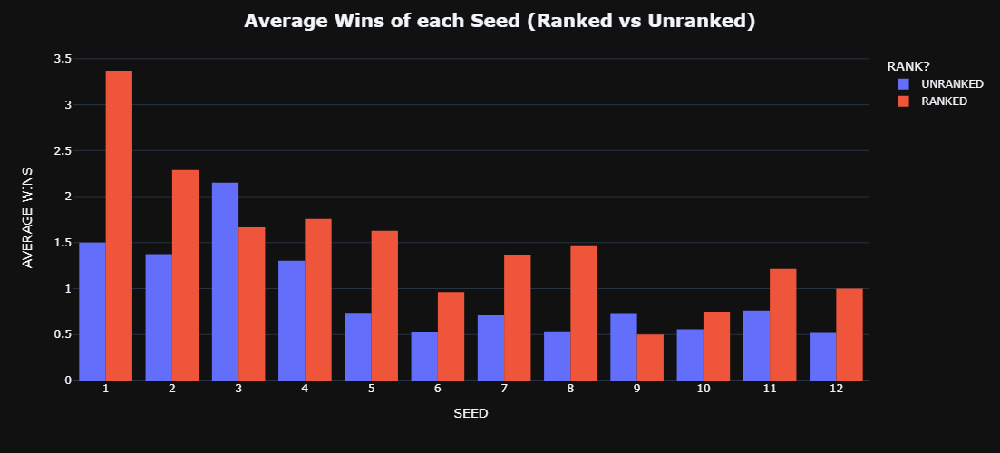

In [71]:
fig = px.histogram(avg_wins_rank_df, x = 'SEED', y = 'AVG WINS',
                   color = 'RANK?', barmode = 'group', template = 'plotly_dark', 
                   nbins = 12, height = 500)
fig.update_layout(title = '<b> Average Wins of each Seed (Ranked vs Unranked) </b>', title_x = 0.5, title_font = dict(size = 20), 
                  xaxis = dict(tickmode = 'linear'), yaxis_title = 'AVERAGE WINS') 
fig.show()

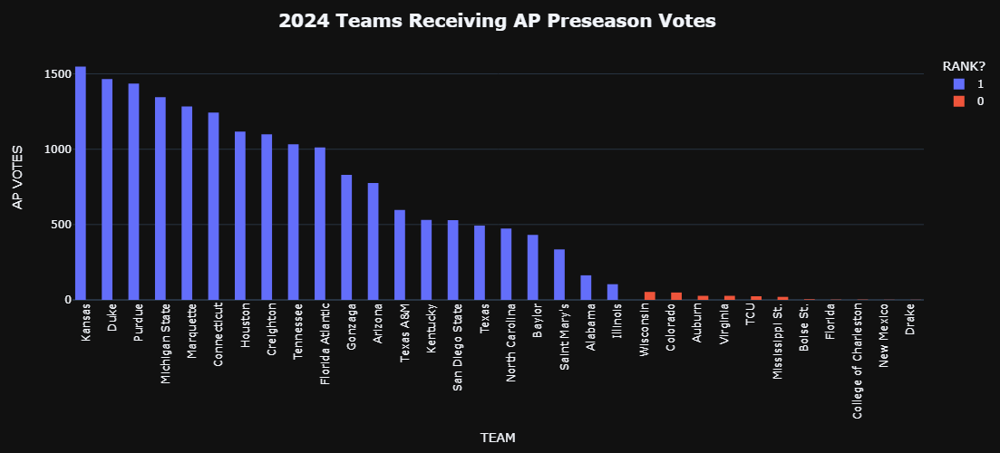

In [72]:
curr_pv = curr_pv.sort_values(by = ['AP VOTES'], ascending = False)

fig = px.histogram(curr_pv, x = 'TEAM', y = 'AP VOTES', 
                   color = 'RANK?', barmode = 'group', template = 'plotly_dark', 
                   height = 500)  
fig.update_layout(title = '<b>' + str(curr_year) + ' Teams Receiving AP Preseason Votes </b>', title_x = 0.5, title_font = dict(size = 20), 
                  yaxis_title = 'AP VOTES')  
fig.update_xaxes(tickangle = - 90) 
fig.show()

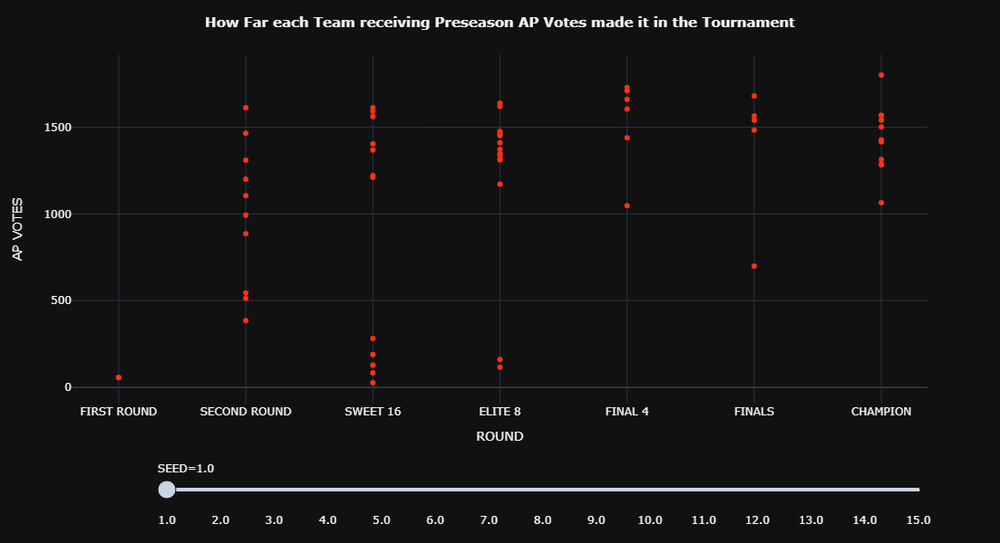

In [73]:
pv_str = order_df(df_input = pv, order_by = 'ROUND', order = rounds_num) 
change_round_str(pv_str, rounds_num, round_str)
pv_str = order_df(df_input = pv_str, order_by = 'SEED', order = order_seed)    
pv_str['SEED'] = pv_str['SEED'].astype(str)   

fig = px.scatter(pv_str, x = 'ROUND', y = 'AP VOTES', hover_data = ['YEAR', 'TEAM'], animation_frame = 'SEED', height = 600,
                 color = 'SEED', color_discrete_sequence = px.colors.qualitative.Light24, template = 'plotly_dark')
fig['layout'].pop('updatemenus')    
fig.update_layout(title = '<b> How Far each Team receiving Preseason AP Votes made it in the Tournament </b>', title_x = 0.5, title_font = dict(size = 15), showlegend = False) 
fig.update_xaxes(categoryorder = 'array', categoryarray = round_str, autorange = 'reversed') 
go.Figure(data = fig.data, frames = [fr.update(layout = 
         {'xaxis': {'range' : [6.5, - 0.5]}, 
          'yaxis': {'range' : [min(fr.data[0].y) - 20, max(fr.data[0].y) + 20]},}) for fr in fig.frames], layout = fig.layout)    
fig.show()

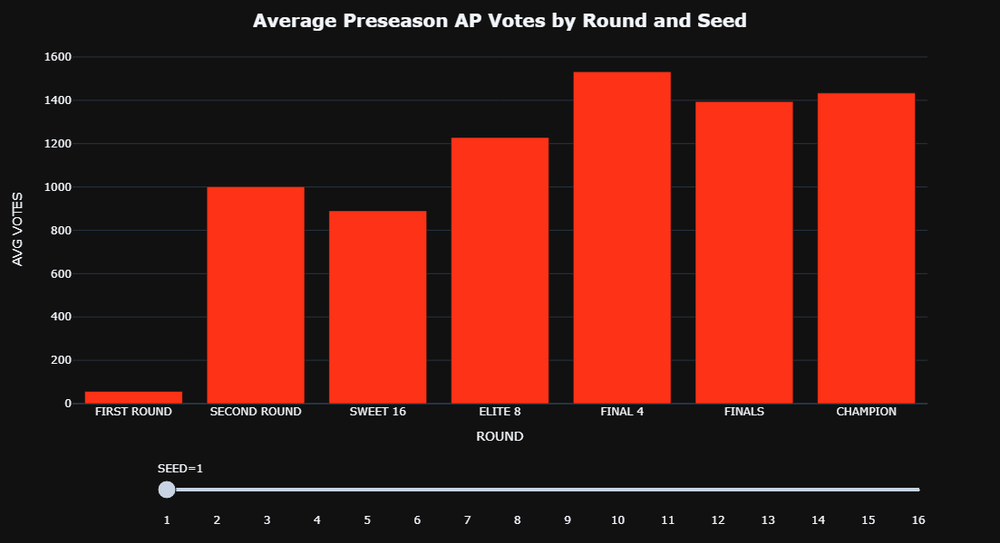

In [74]:
avg_wins_votes_df['SEED'] = avg_wins_votes_df['SEED'].astype(str)  
wins_arr = np.arange(7)
avg_wins_votes_df = order_df(df_input = avg_wins_votes_df, order_by = 'WINS', order = wins_arr)  

# Turn win count values into round strings  
for i, r in enumerate(wins_arr) : 
    avg_wins_votes_df.loc[avg_wins_votes_df['WINS'] == r, 'WINS'] = round_str2[i]

fig = px.bar(avg_wins_votes_df, x = 'WINS', y = 'AVG VOTES', animation_frame = 'SEED', height = 600,
             color = 'SEED', color_discrete_sequence = px.colors.qualitative.Light24, template = 'plotly_dark')
fig['layout'].pop('updatemenus')    
fig.update_layout(title = '<b> Average Preseason AP Votes by Round and Seed </b>', title_x = 0.5, title_font = dict(size = 20), showlegend = False)
fig.update_xaxes(title = 'ROUND', categoryorder = 'array', categoryarray = round_str2)   
go.Figure(data = fig.data, frames = [fr.update(layout = 
         {'xaxis': {'range' : [- 0.5, 6.5]},
          'yaxis': {'range' : [min(fr.data[0].y) - 20, max(fr.data[0].y) + 20]},}) for fr in fig.frames], layout = fig.layout)   
fig.show()

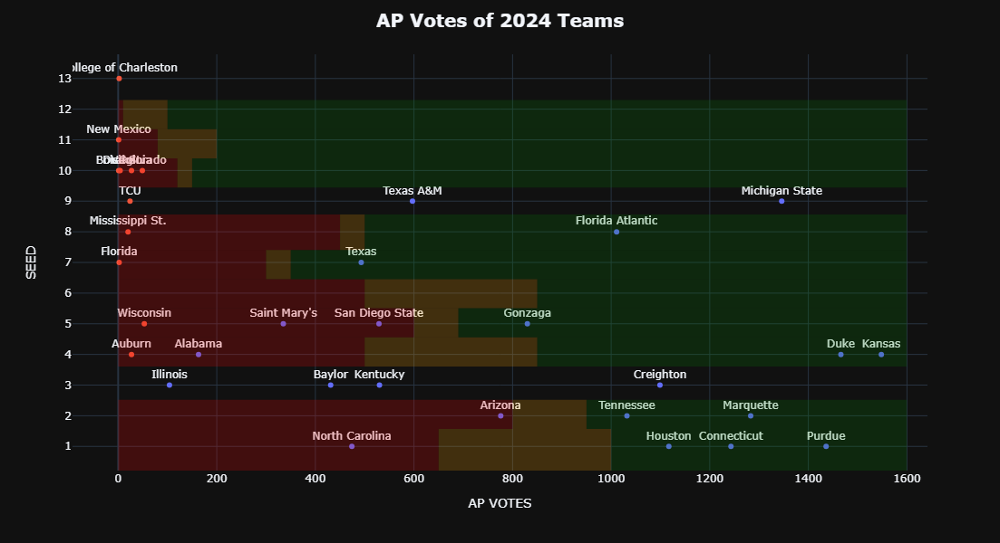

In [75]:
curr_pv['RANK?'] = curr_pv['RANK?'].astype(str) 

fig = px.scatter(curr_pv, x = 'AP VOTES', y = 'SEED', text = 'TEAM', hover_data = ['YEAR', 'AP RANK'], 
                   color = 'RANK?', template = 'plotly_dark', 
                   height = 600) 
fig.update_layout(title = '<b> AP Votes of ' + str(curr_year) + ' Teams </b>', title_x = 0.5, title_font = dict(size = 20), yaxis = dict(tickmode = 'linear'), showlegend = False)
fig.update_traces(textposition = 'top center') 

# Corner coordinates for each colored zone  
x0 = [1000, 950, 850, 690, 850, 350, 500, 150, 200, 100]
x1 = [650,  800, 500, 600, 500, 300, 450, 120, 80,  10]
y0 = [0,    0.1,  0.25, 0.32, 0.39, 0.46, 0.53,  0.68, 0.75, 0.82]
y1 = [0.1,  0.17, 0.32, 0.39, 0.46, 0.53, 0.615, 0.75, 0.82, 0.89]

for i in range(len(x0)) : 
    fig.add_vrect(x0 = x0[i], x1 = 1600, y0 = y0[i], y1 = y1[i], line_width = 0, fillcolor = 'green', opacity = 0.2)
    fig.add_vrect(x0 = 0, x1 = x1[i], y0 = y0[i], y1 = y1[i], line_width = 0, fillcolor = 'red', opacity = 0.2)
    fig.add_vrect(x0 = x1[i], x1 = x0[i], y0 = y0[i], y1 = y1[i], line_width = 0, fillcolor = 'orange', opacity = 0.2)

fig.show()  

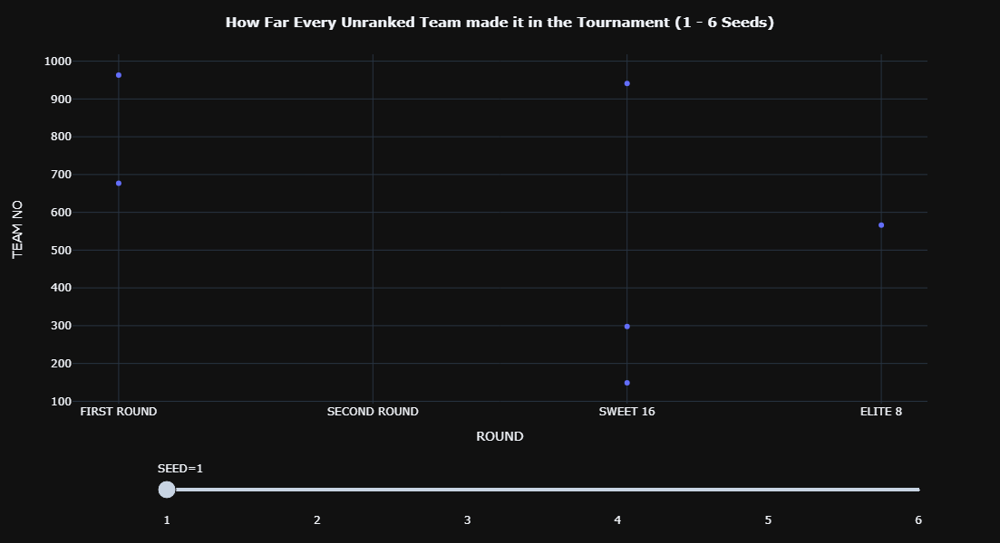

In [76]:
# Get the rank status of all tournament teams    
unranked = pd.merge(kb_df, pv_df, how = 'left', on = ['TEAM NO'])
# Change all N/A values to 0 as they are unranked teams  
unranked['RANK?'] = unranked['RANK?'].fillna(0) 
unranked = unranked.rename(columns = {'YEAR_x' : 'YEAR', 'TEAM_x' : 'TEAM', 'SEED_x' : 'SEED', 'ROUND_x': 'ROUND'}) 
# Get all unranked seeds 1 - 6 as they should all theoretically be ranked  
unranked = unranked.loc[unranked['RANK?'].eq(0) & unranked['SEED'].le(6)]
unranked = order_df(df_input = unranked, order_by = 'SEED', order = order_seed)   
unranked['SEED'] = unranked['SEED'].astype(str)  
change_round_str(unranked, rounds_num, round_str) 

curr_unranked = unranked.loc[unranked['YEAR'].eq(curr_year)]
unranked = unranked.loc[unranked['YEAR'].ne(curr_year)]

fig = px.scatter(unranked, x = 'ROUND', y = 'TEAM NO', hover_data = ['YEAR', 'TEAM'], animation_frame = 'SEED', 
                 color = 'SEED', template = 'plotly_dark', height = 600) 
fig['layout'].pop('updatemenus')     
fig.update_layout(title = '<b> How Far Every Unranked Team made it in the Tournament (1 - 6 Seeds) </b>', title_x = 0.5, title_font = dict(size = 15), showlegend = False)
fig.update_xaxes(categoryorder = 'array', categoryarray = round_str2) 
go.Figure(data = fig.data, frames = [fr.update(layout = 
         {'xaxis': {'range' : [- 0.5, 6.5]},
          'yaxis': {'range' : [min(fr.data[0].y) - 20, max(fr.data[0].y) + 20]},}) for fr in fig.frames], layout = fig.layout)

In [77]:
selected_cols = curr_unranked.columns[curr_unranked.columns.isin(['YEAR', 'CONF', 'TEAM', 'SEED'])] 
curr_unranked[selected_cols].head(1000)

,YEAR,CONF,TEAM,SEED
26,2024,B12,Iowa St.,2
3,2024,SEC,Auburn,4
66,2024,B10,Wisconsin,5
6,2024,B12,BYU,6
7,2024,ACC,Clemson,6
51,2024,SEC,South Carolina,6
58,2024,B12,Texas Tech,6


In [78]:
# Create dataframe of Champions and their team profile for the following tournament (if they have one)
######################################################################################################  

cs = complete_stats.copy()
champion_df = pd.DataFrame()

for year in range(2008, curr_year) : 
    if year ==  2020 : continue 
    # Get all previous Champions 
    champion = cs.loc[cs['YEAR'].eq(year) & cs['ROUND'].eq(1)]
    # Get the teams' stats of the following season they were Champions (if they have one)  
    if year == 2019 : next_team = cs.loc[cs['YEAR'].eq(year + 2) & cs['TEAM'].eq(champion['TEAM'].values[0])]
    else : next_team = cs.loc[cs['YEAR'].eq(year + 1) & cs['TEAM'].eq(champion['TEAM'].values[0])] 
    # Combine both teams in a dataframe  
    champion_df = pd.concat([champion_df, champion, next_team], axis = 0)

# Simplify the dataframe with the key stats   
selected_cols = champion_df.columns[champion_df.columns.isin(['YEAR', 'CONF', 'TEAM', 'SEED', 'ROUND', 'KADJ EM', 'BADJ EM', 'BARTHAG', 'WAB'])]  
champion_df = champion_df[selected_cols]
champion_df = champion_df.reset_index(drop = True)
champion_df = champion_df.iloc[:: - 1].reset_index(drop = True)
champion_df 

,YEAR,CONF,TEAM,SEED,ROUND,KADJ EM,BADJ EM,BARTHAG,WAB
0,2024,BE,Connecticut,1,0,32.2130,33.493,0.971,11.3
1,2023,BE,Connecticut,4,1,25.3686,26.400,0.947,4.9
2,2023,B12,Kansas,1,32,23.1356,21.400,0.918,10.1
3,2022,B12,Kansas,1,1,25.4920,27.300,0.951,10.4
4,2022,B12,Baylor,1,32,26.3204,26.800,0.952,8.9
5,2021,B12,Baylor,1,1,29.4969,29.900,0.961,6.7
6,2021,ACC,Virginia,4,64,22.6542,20.900,0.910,3.5
7,2019,ACC,Virginia,1,1,35.6552,33.900,0.976,11.1
8,2019,BE,Villanova,6,32,18.7745,16.400,0.854,3.7
9,2018,BE,Villanova,1,1,31.4091,32.300,0.966,10.6


In [79]:
# Create dataframe consisting of the average wins of seeds by bid type  
######################################################################    

bids = complete_stats.copy()
bids = bids.loc[bids['ROUND'].ne(68)]
curr_bids = bids.loc[bids['YEAR'].eq(curr_year)]
bids = bids.loc[bids['YEAR'].ne(curr_year)]
bids['AVG WINS'] = bids['ROUND']

wins = [6, 5, 4, 3, 2, 1, 0] 

# Convert AVG WINS column to win count values    
for i in rounds_num2 : 
    bids.loc[bids['AVG WINS'] == i, 'AVG WINS'] = wins[rounds_num2.index(i)]   

# Get the average wins for each seed by bid type   
avg_wins_bids = bids.groupby(['SEED', 'BID TYPE'])['AVG WINS'].mean()
avg_wins_bids = avg_wins_bids.to_frame().reset_index() 
# Get the average wins for the 1 - 14 seeds as the 15 and 16 seeds do not have any At-Large Bids  
avg_wins_bids = avg_wins_bids.loc[avg_wins_bids['SEED'].le(14)] 
avg_wins_bids['SEED'] = avg_wins_bids['SEED'].astype(str)

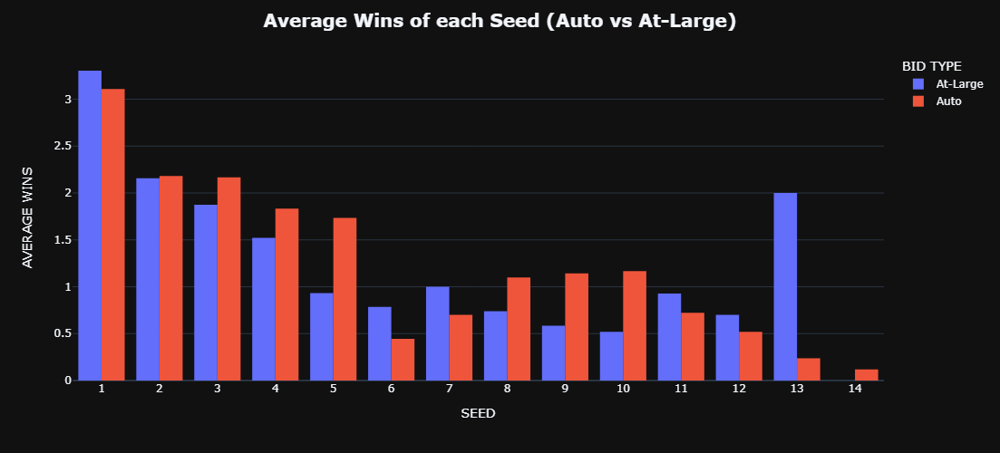

In [80]:
fig = px.histogram(avg_wins_bids, x = 'SEED', y = 'AVG WINS',
                   color = 'BID TYPE', barmode = 'group', template = 'plotly_dark', 
                   nbins = 14, height = 500)
fig.update_layout(title = '<b> Average Wins of each Seed (Auto vs At-Large) </b>', title_x = 0.5, title_font = dict(size = 20), 
                  xaxis = dict(tickmode = 'linear'), yaxis_title = 'AVERAGE WINS') 
fig.show()

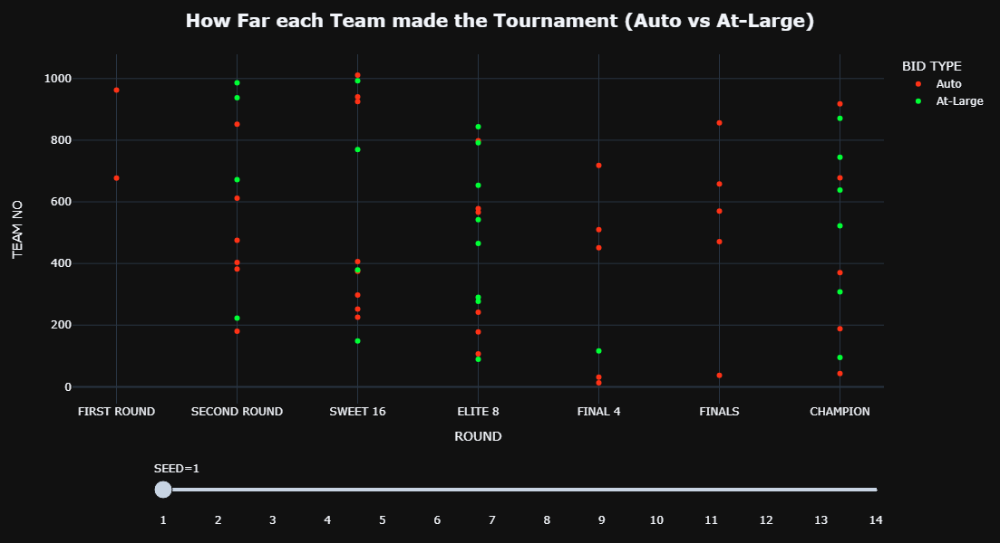

In [81]:
bids_df = order_df(df_input = complete_stats, order_by = 'ROUND', order = rounds_num) 
change_round_str(bids_df, rounds_num, round_str)
bids_df = order_df(df_input = bids_df, order_by = 'SEED', order = order_seed)    
# Get the 1 - 14 seeds as the 15 and 16 seeds do not have any At-Large Bids    
bids_df = bids_df.loc[bids_df['SEED'].le(14)] 
bids_df['SEED'] = bids_df['SEED'].astype(str)     

fig = px.scatter(bids_df, x = 'ROUND', y = 'TEAM NO', hover_data = ['YEAR', 'TEAM'], animation_frame = 'SEED', height = 600,
                 color = 'BID TYPE', color_discrete_sequence = px.colors.qualitative.Light24, template = 'plotly_dark')
fig['layout'].pop('updatemenus')    
fig.update_layout(title = '<b> How Far each Team made the Tournament (Auto vs At-Large) </b>', title_x = 0.5, title_font = dict(size = 20))  
fig.update_xaxes(categoryorder = 'array', categoryarray = round_str, autorange = 'reversed') 
go.Figure(data = fig.data, frames = [fr.update(layout = 
         {'xaxis': {'range' : [6.5, - 0.5]}, 
          'yaxis': {'range' : [min(fr.data[0].y) - 200, max(fr.data[0].y) + 200]},}) for fr in fig.frames], layout = fig.layout)    
fig.show()

In [82]:
# Create dataframes that will be used to create heatmaps displaying shooting rate vs shooting percent   
def make_shots_df(cs, stat1, stat2, seed1, seed2, mode1, mode2) : 
    shots_df = pd.DataFrame()
    
    # Mode Rank gets the dataframe sorted by shooting rate and percent rank 
    if mode2 == 'rank' : 
        shot_arr = [270, 180, 90, 1]
        bins_arr = ['270 + ' + str(stat1) + ' | 270 + ' + str(stat2), '270 + ' + str(stat1) + ' | 180 - 270 ' + str(stat2), '270 + ' + str(stat1) + ' | 90 - 180 ' + str(stat2), '270 + ' + str(stat1) + ' | 1 - 90 ' + str(stat2),
                    '180 - 270 ' + str(stat1) + ' | 270 + ' + str(stat2), '180 - 270 ' + str(stat1) + ' | 180 - 270 ' + str(stat2), '180 - 270 ' + str(stat1) + ' | 90 - 180 ' + str(stat2), '180 - 270 ' + str(stat1) + ' | 1 - 90 ' + str(stat2),
                    '90 - 180 ' + str(stat1) + ' | 270 + ' + str(stat2), '90 - 180 ' + str(stat1) + ' | 180 - 270 ' + str(stat2), '90 - 180 ' + str(stat1) + ' | 90 - 180 ' + str(stat2), '90 - 180 ' + str(stat1) + ' | 1 - 90 ' + str(stat2),
                    '1 - 90 ' + str(stat1) + ' | 270 + ' + str(stat2), '1 - 90 ' + str(stat1) + ' | 180 - 270 ' + str(stat2), '1 - 90 ' + str(stat1) + ' | 90 - 180 ' + str(stat2), '1 - 90 ' + str(stat1) + ' | 1 - 90 ' + str(stat2)]
        bin_index = 0 

        for i in range(len(shot_arr)) : 
            # Get all teams within a specific range of shooting rate ranks 
            if i != 0 : rate_df = cs.loc[cs[stat1].lt(shot_arr[i - 1]) & cs[stat1].ge(shot_arr[i])]
            else : rate_df = cs.loc[cs[stat1].ge(shot_arr[i])]
            for j in range(len(shot_arr)) :    
                shot_df = rate_df.copy()
                # Get all teams within a specific range of shooting percent ranks  
                if j != 0 : shot_df = shot_df.loc[shot_df[stat2].lt(shot_arr[j - 1]) & shot_df[stat2].ge(shot_arr[j])]
                else : shot_df = shot_df.loc[shot_df[stat2].ge(shot_arr[j])]

                shot_df['BINS'] = bins_arr[bin_index]
                bin_index += 1  
                shots_df = pd.concat([shots_df, shot_df], axis = 0)
        
    # Mode Perc gets the dataframe sorted by shooting rate and percent percentile  
    elif mode2 == 'perc' : 
        rate_arr = [cs[stat1].quantile(1), cs[stat1].quantile(0.75), cs[stat1].quantile(0.5), cs[stat1].quantile(0.25)] 
        shot_arr = [cs[stat2].quantile(1), cs[stat2].quantile(0.75), cs[stat2].quantile(0.5), cs[stat2].quantile(0.25)] 
        bins_arr = ['0 - 25 ' + str(stat1) + ' | 0 - 25 ' + str(stat2), '0 - 25 ' + str(stat1) + ' | 25 - 50 ' + str(stat2), '0 - 25 ' + str(stat1) + ' | 50 - 75 ' + str(stat2), '0 - 25 ' + str(stat1) + ' | 75 - 100 ' + str(stat2),
                    '25 - 50 ' + str(stat1) + ' | 0 - 25 ' + str(stat2), '25 - 50 ' + str(stat1) + ' | 25 - 50 ' + str(stat2), '25 - 50 ' + str(stat1) + ' | 50 - 75 ' + str(stat2), '25 - 50 ' + str(stat1) + ' | 75 - 100 ' + str(stat2),
                    '50 - 75 ' + str(stat1) + ' | 0 - 25 ' + str(stat2), '50 - 75 ' + str(stat1) + ' | 25 - 50 ' + str(stat2), '50 - 75 ' + str(stat1) + ' | 50 - 75 ' + str(stat2), '50 - 75 ' + str(stat1) + ' | 75 - 100 ' + str(stat2),
                    '75 - 100 ' + str(stat1) + ' | 0 - 25 ' + str(stat2), '75 - 100 ' + str(stat1) + ' | 25 - 50 ' + str(stat2), '75 - 100 ' + str(stat1) + ' | 50 - 75 ' + str(stat2), '75 - 100 ' + str(stat1) + ' | 75 - 100 ' + str(stat2)]
        bin_index = 0 

        for i in range(len(rate_arr)) : 
            # Get all teams within a specific range of shooting rate percentiles 
            if i != 3 : rate_df = cs.loc[cs[stat1].le(rate_arr[i]) & cs[stat1].gt(rate_arr[i + 1])]
            else : rate_df = cs.loc[cs[stat1].le(rate_arr[i])]
            for j in range(len(shot_arr)) :    
                shot_df = rate_df.copy() 
                # Get all teams within a specific range of shooting percent percentiles   
                if j != 3 : shot_df = shot_df.loc[shot_df[stat2].le(shot_arr[j]) & shot_df[stat2].gt(shot_arr[j + 1])]
                else : shot_df = shot_df.loc[shot_df[stat2].le(shot_arr[j])]

                shot_df['BINS'] = bins_arr[bin_index]
                bin_index += 1  
                shots_df = pd.concat([shots_df, shot_df], axis = 0)

    shots_df['WINS'] = shots_df['ROUND']
    wins = [6, 5, 4, 3, 2, 1, 0] 
    avg_wins_arr = []
    avg_wins_df = pd.DataFrame()

    # Convert round numbers to win count values  
    for i in rounds_num2 : 
        shots_df.loc[shots_df['WINS'] == i, 'WINS'] = wins[rounds_num2.index(i)]   

    # Get the win count of every seed by bin  
    wins_shots_df = shots_df.groupby(by = ['SEED', 'BINS', 'WINS']).size().reset_index(name = 'COUNT')
    wins_shots_df['TOTAL WINS'] = wins_shots_df['WINS'] * wins_shots_df['COUNT']
     
    # Get the average wins by bin for a specific seed 
    if mode1 == 0 : 
        for bins in bins_arr : 
            temp_df = wins_shots_df.loc[wins_shots_df['SEED'].eq(seed1) & wins_shots_df['BINS'].eq(bins)]
            avg_wins_arr.append(temp_df['TOTAL WINS'].sum() / temp_df['COUNT'].sum())  
    # Get the average wins by bin for a range of seeds     
    elif mode1 == 1 : 
        for bins in bins_arr :
            temp_df = wins_shots_df.loc[wins_shots_df['SEED'].ge(seed1) & wins_shots_df['SEED'].le(seed2) & wins_shots_df['BINS'].eq(bins)]
            avg_wins_arr.append(temp_df['TOTAL WINS'].sum() / temp_df['COUNT'].sum())  

    avg_wins_df['BINS'] = bins_arr  
    avg_wins_df['AVG WINS'] = avg_wins_arr 
    # Split the title of bins to put them as x and y axis titles  
    avg_wins_df[['RATE RANK', '% RANK']] = avg_wins_df['BINS'].str.split('|', expand = True)  
    # Convert the dataframe into a pivot table for the purpose of formatting it for the heatmaps  
    avg_wins_df = pd.pivot_table(avg_wins_df, values = 'AVG WINS', index = ['RATE RANK'], columns = ['% RANK'], fill_value = 0) 
    
    return avg_wins_df  

In [83]:
# Create heatmaps from the dataframes made from the make_shots_df() function  
def make_heatmaps(cs, stat1, stat2, mode) : 
    # Set the x and y axis values to ranks 
    if mode == 'rank' : 
        x_bins = [' 270 + ' + str(stat2), ' 180 - 270 ' + str(stat2), ' 90 - 180 ' + str(stat2), ' 1 - 90 ' + str(stat2)]
        y_bins = ['270 + ' + str(stat1) + ' ', '180 - 270 ' + str(stat1) + ' ', '90 - 180 ' + str(stat1) + ' ', '1 - 90 ' + str(stat1) + ' ']
    # Set the x and y axis values to percentiles  
    elif mode == 'perc' : 
        x_bins = [' 0 - 25 ' + str(stat2), ' 25 - 50 ' + str(stat2), ' 50 - 75 ' + str(stat2), ' 75 - 100 ' + str(stat2)]
        y_bins = ['0 - 25 ' + str(stat1) + ' ', '25 - 50 ' + str(stat1) + ' ', '50 - 75 ' + str(stat1) + ' ', '75 - 100 ' + str(stat1) + ' ']
    
    # Create a heatmap for the single digit seeds 
    shots_df = make_shots_df(cs, stat1, stat2, 1, 9, 1, mode)  
    fig = px.imshow(shots_df, text_auto = True, color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
    fig.update_layout(title = '<b> ' + str(stat1) + ' VS ' + str(stat2) + ' (1 - 9 seeds) </b>', title_x = 0.5, title_font = dict(size = 15))   
    fig.update_xaxes(categoryorder = 'array', categoryarray = x_bins) 
    fig.update_yaxes(categoryorder = 'array', categoryarray = y_bins) 
    fig.show()
    
    # Create a heatmap for the double digit seeds  
    shots_df = make_shots_df(cs, stat1, stat2, 10, 15, 1, mode)  
    fig = px.imshow(shots_df, text_auto = True, color_continuous_scale = px.colors.diverging.RdYlGn, template = 'plotly_dark')
    fig.update_layout(title = '<b> ' + str(stat1) + ' VS ' + str(stat2) + ' (10 - 15 seeds) </b>', title_x = 0.5, title_font = dict(size = 15)) 
    fig.update_xaxes(categoryorder = 'array', categoryarray = x_bins) 
    fig.update_yaxes(categoryorder = 'array', categoryarray = y_bins) 
    fig.show()

In [84]:
# Get all of the current teams' bins  
def get_curr_teams_bins(curr_cs, stat1, stat2, seed1, seed2) : 
    # Get the teams within a specific seed range  
    curr_cs = curr_cs.loc[curr_cs['SEED'].ge(seed1) & curr_cs['SEED'].le(seed2)]
    rank_arr = [270, 180, 90, 1]
    bins_arr = ['270 + ' + str(stat1) + ' | 270 + ' + str(stat2), '270 + ' + str(stat1) + ' | 180 - 270 ' + str(stat2), '270 + ' + str(stat1) + ' | 90 - 180 ' + str(stat2), '270 + ' + str(stat1) + ' | 1 - 90 ' + str(stat2),
                '180 - 270 ' + str(stat1) + ' | 270 + ' + str(stat2), '180 - 270 ' + str(stat1) + ' | 180 - 270 ' + str(stat2), '180 - 270 ' + str(stat1) + ' | 90 - 180 ' + str(stat2), '180 - 270 ' + str(stat1) + ' | 1 - 90 ' + str(stat2),
                '90 - 180 ' + str(stat1) + ' | 270 + ' + str(stat2), '90 - 180 ' + str(stat1) + ' | 180 - 270 ' + str(stat2), '90 - 180 ' + str(stat1) + ' | 90 - 180 ' + str(stat2), '90 - 180 ' + str(stat1) + ' | 1 - 90 ' + str(stat2),
                '1 - 90 ' + str(stat1) + ' | 270 + ' + str(stat2), '1 - 90 ' + str(stat1) + ' | 180 - 270 ' + str(stat2), '1 - 90 ' + str(stat1) + ' | 90 - 180 ' + str(stat2), '1 - 90 ' + str(stat1) + ' | 1 - 90 ' + str(stat2)]
    bin_index = 0   
    
    for i in range(len(rank_arr)) :  
        # Get all teams within a specific range of shooting rate ranks 
        if i != 0 : rate_cs = curr_cs.loc[curr_cs[stat1].lt(rank_arr[i - 1]) & curr_cs[stat1].ge(rank_arr[i])] 
        else : rate_cs = curr_cs.loc[curr_cs[stat1].ge(rank_arr[i])] 
        for j in range(len(rank_arr)) : 
            shot_cs = rate_cs.copy()
            # Get all teams within a specific range of shooting percent ranks    
            if j != 0 : shot_cs = shot_cs.loc[shot_cs[stat2].lt(rank_arr[j - 1]) & shot_cs[stat2].ge(rank_arr[j])]
            else : shot_cs = shot_cs.loc[shot_cs[stat2].ge(rank_arr[j])]  
            # Simplify the dataframe by only using the year, team, seed, conference, shooting rate stat, and shooting percent stat  
            simp_curr_cs = shot_cs[['YEAR', 'TEAM', 'SEED', 'CONF', stat1, stat2]]
            print(bins_arr[bin_index])
            bin_index += 1  
            display(simp_curr_cs)      

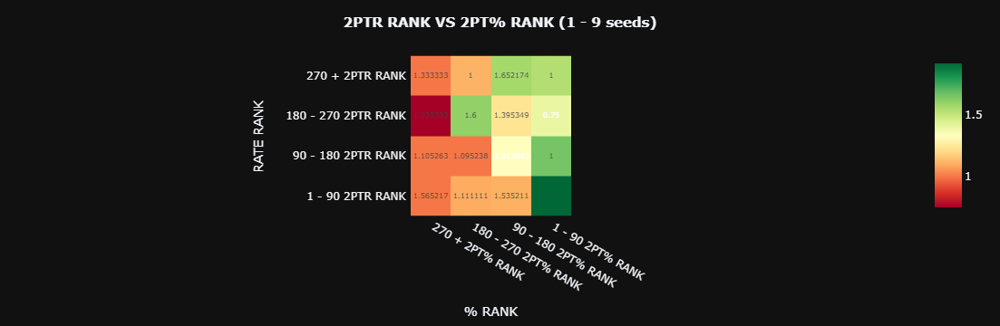

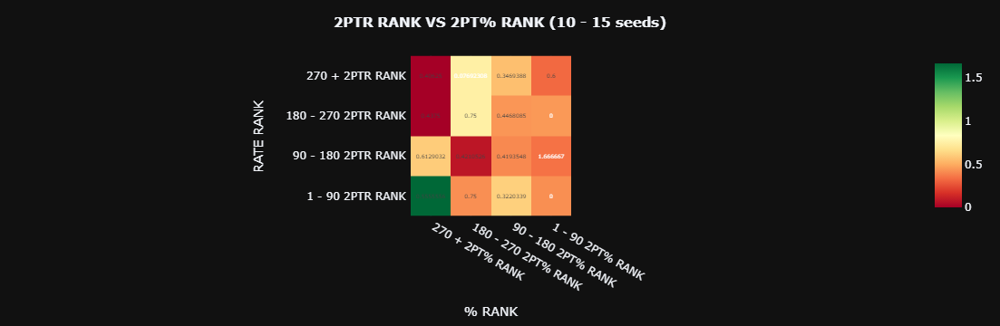

In [85]:
cs = complete_stats.copy()           
curr_cs = cs.loc[cs['YEAR'].eq(curr_year)]
cs = cs.loc[cs['YEAR'].ne(curr_year)]

stat1, stat2 = '2PTR RANK', '2PT% RANK'
# get_curr_teams_bins(curr_cs, stat1, stat2, 1, 16)
make_heatmaps(cs, stat1, stat2, 'rank') 

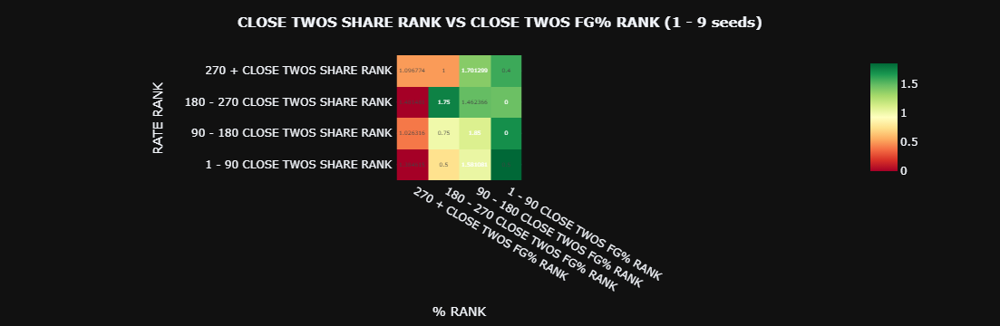

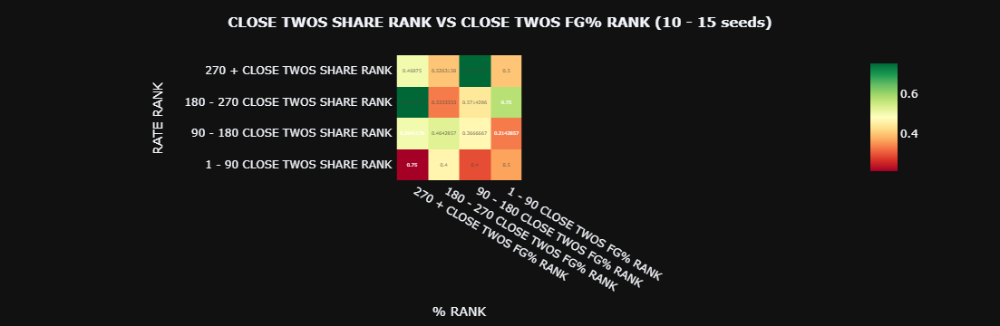

In [86]:
stat1, stat2 = 'CLOSE TWOS SHARE RANK', 'CLOSE TWOS FG% RANK'
# get_curr_teams_bins(curr_cs, stat1, stat2, 1, 16)
make_heatmaps(cs, stat1, stat2, 'rank')   

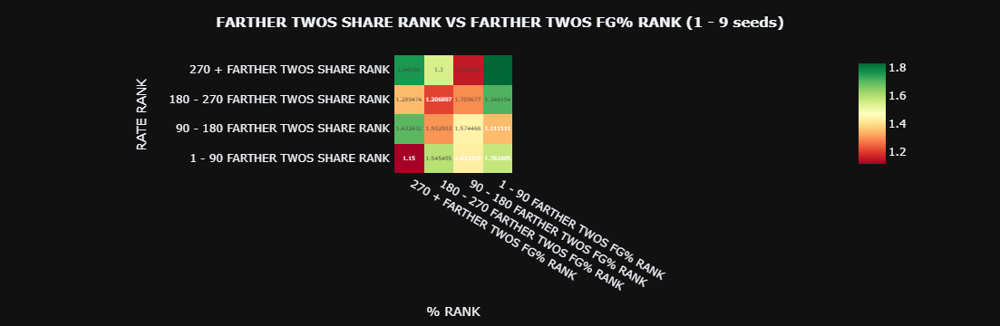

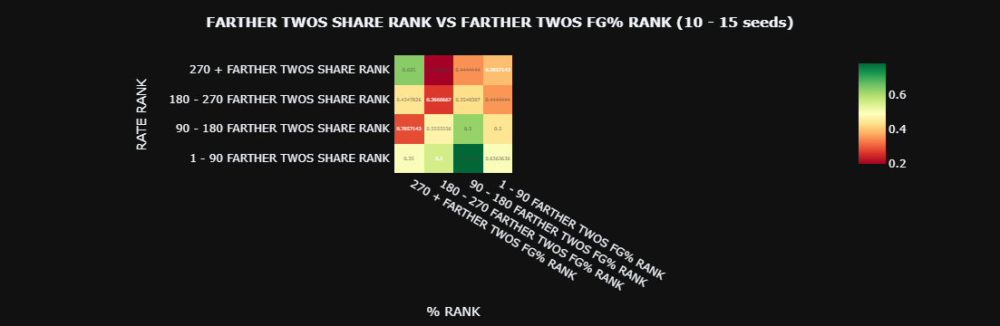

In [87]:
stat1, stat2 = 'FARTHER TWOS SHARE RANK', 'FARTHER TWOS FG% RANK'
# get_curr_teams_bins(curr_cs, stat1, stat2, 1, 16)
make_heatmaps(cs, stat1, stat2, 'rank') 

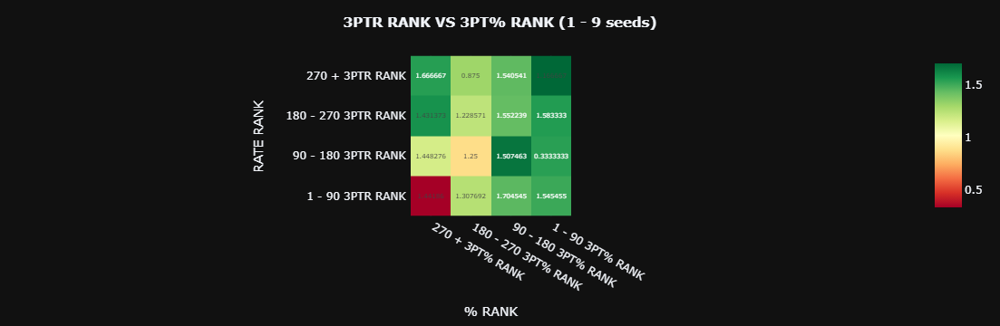

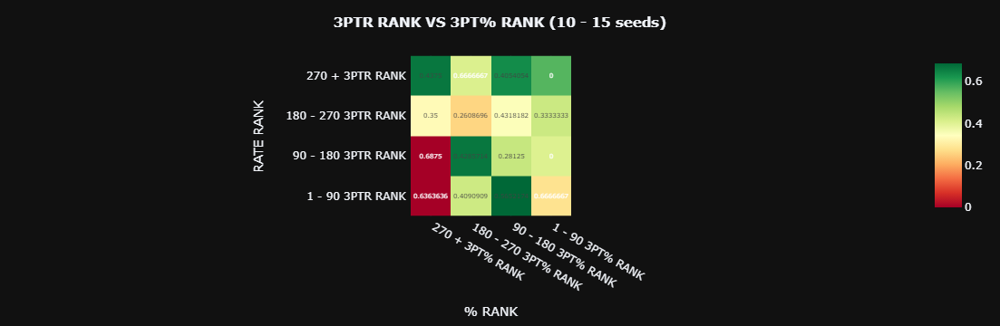

In [88]:
stat1, stat2 = '3PTR RANK', '3PT% RANK'
# get_curr_teams_bins(curr_cs, stat1, stat2, 1, 16)
make_heatmaps(cs, stat1, stat2, 'rank') 

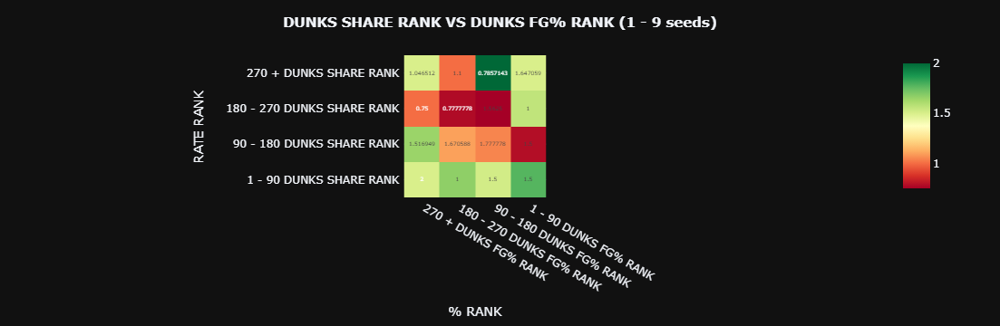

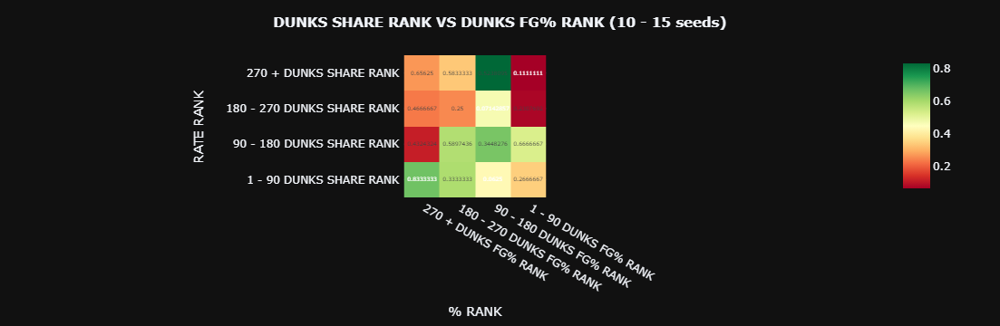

In [89]:
stat1, stat2 = 'DUNKS SHARE RANK', 'DUNKS FG% RANK'
# get_curr_teams_bins(curr_cs, stat1, stat2, 1, 16)
make_heatmaps(cs, stat1, stat2, 'rank')

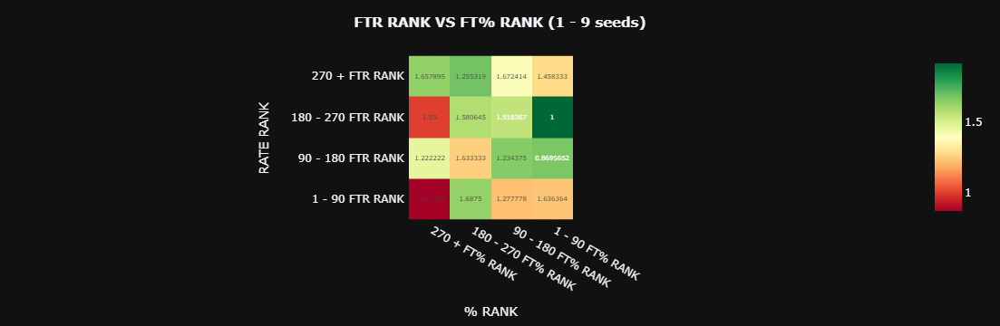

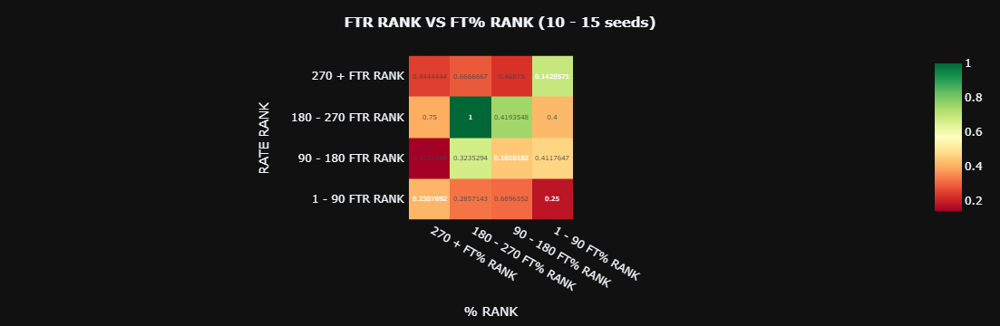

In [90]:
stat1, stat2 = 'FTR RANK', 'FT% RANK'
# get_curr_teams_bins(curr_cs, stat1, stat2, 1, 16)
make_heatmaps(cs, stat1, stat2, 'rank') 

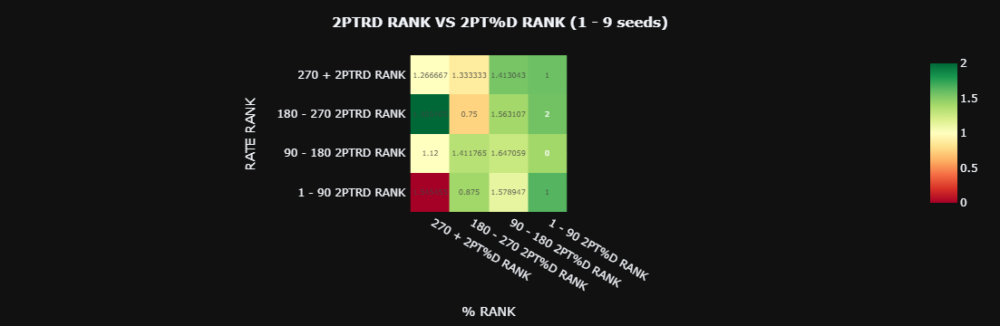

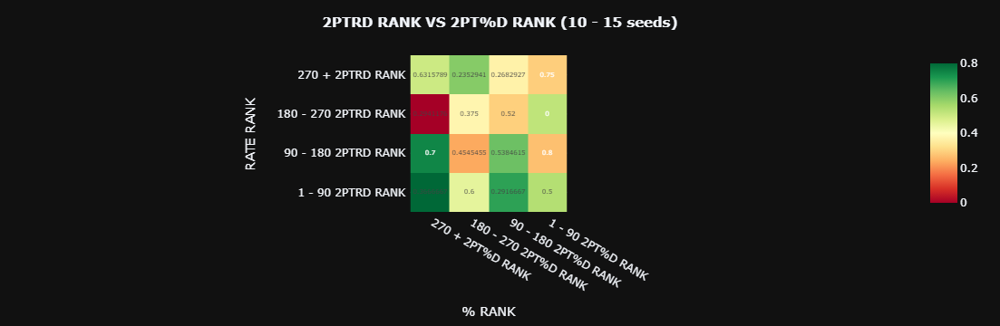

In [91]:
stat1, stat2 = '2PTRD RANK', '2PT%D RANK'
# get_curr_teams_bins(curr_cs, stat1, stat2, 1, 16)
make_heatmaps(cs, stat1, stat2, 'rank') 

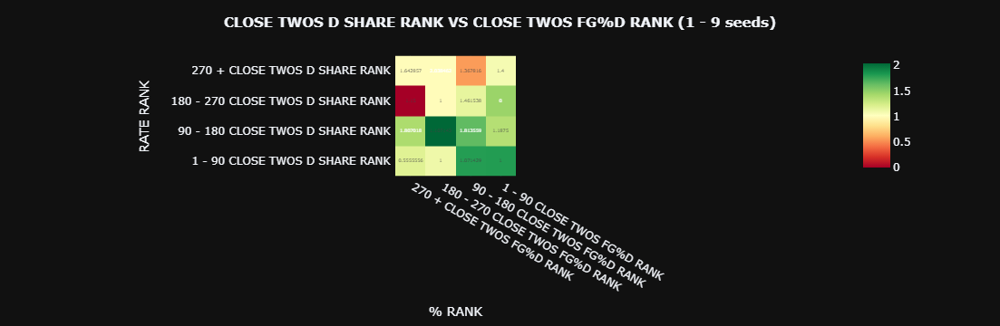

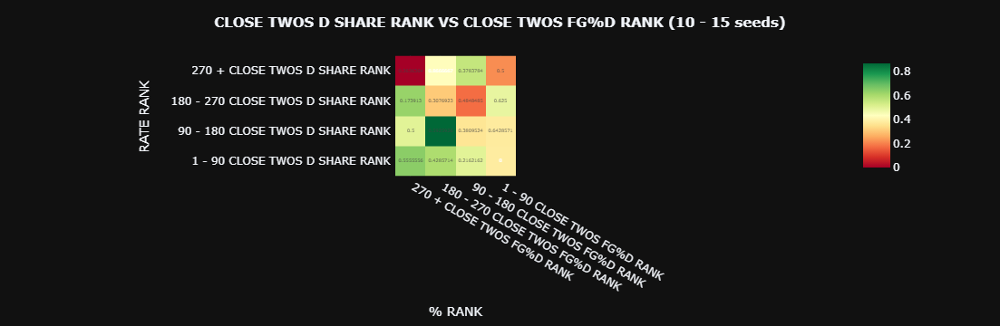

In [92]:
stat1, stat2 = 'CLOSE TWOS D SHARE RANK', 'CLOSE TWOS FG%D RANK'
# get_curr_teams_bins(curr_cs, stat1, stat2, 1, 16)
make_heatmaps(cs, stat1, stat2, 'rank') 

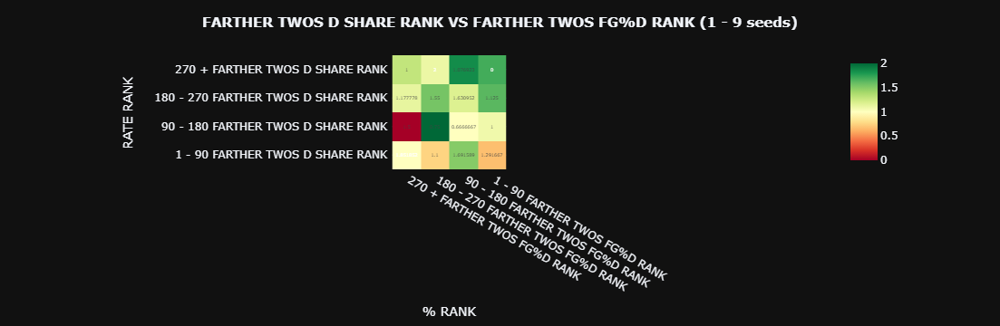

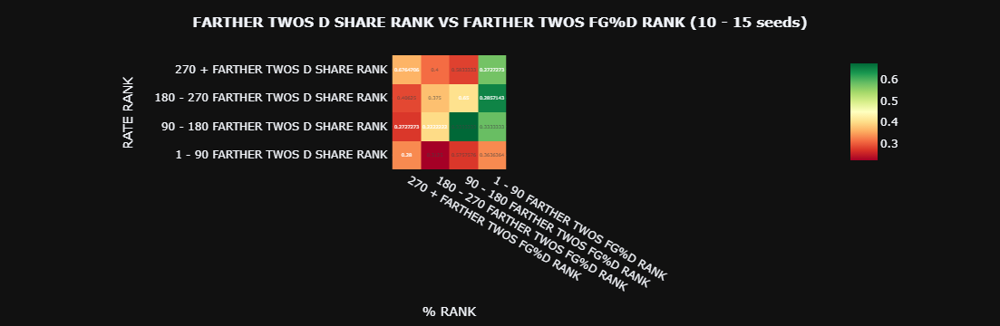

In [93]:
stat1, stat2 = 'FARTHER TWOS D SHARE RANK', 'FARTHER TWOS FG%D RANK'
# get_curr_teams_bins(curr_cs, stat1, stat2, 1, 16)
make_heatmaps(cs, stat1, stat2, 'rank') 

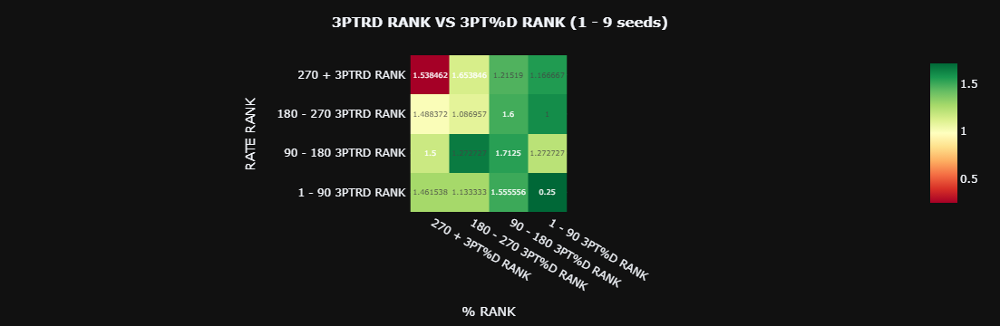

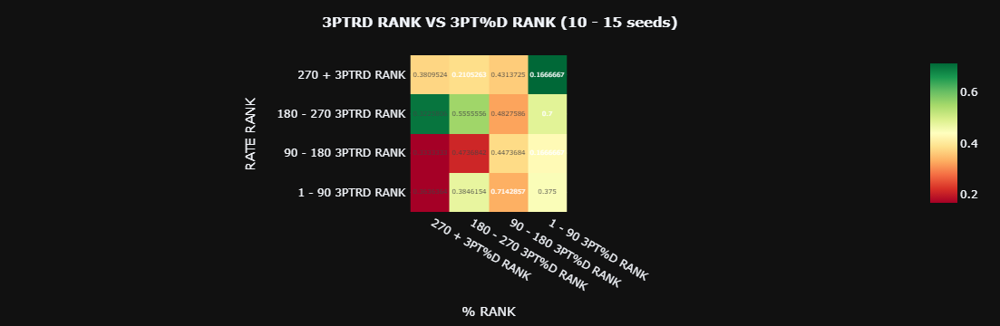

In [94]:
stat1, stat2 = '3PTRD RANK', '3PT%D RANK'
# get_curr_teams_bins(curr_cs, stat1, stat2, 1, 16)
make_heatmaps(cs, stat1, stat2, 'rank') 

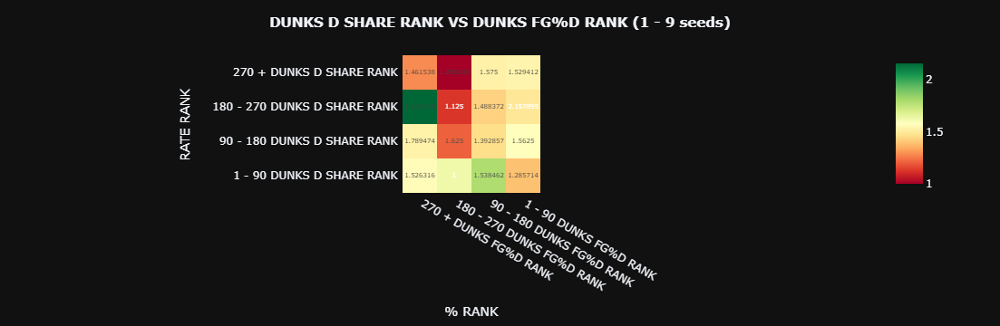

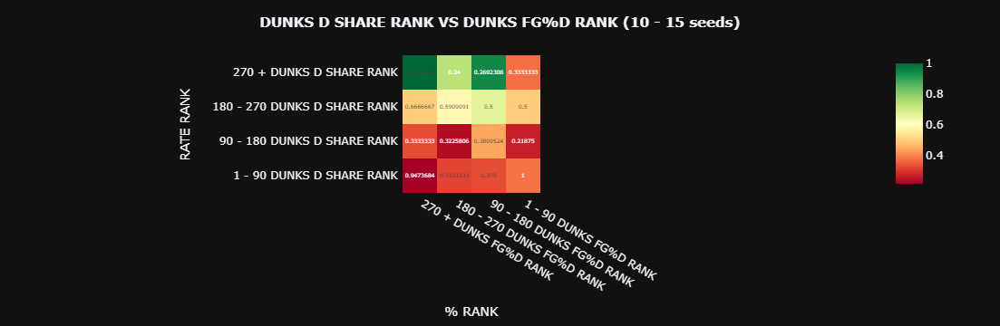

In [95]:
stat1, stat2 = 'DUNKS D SHARE RANK', 'DUNKS FG%D RANK'
# get_curr_teams_bins(curr_cs, stat1, stat2, 1, 16)
make_heatmaps(cs, stat1, stat2, 'rank') 

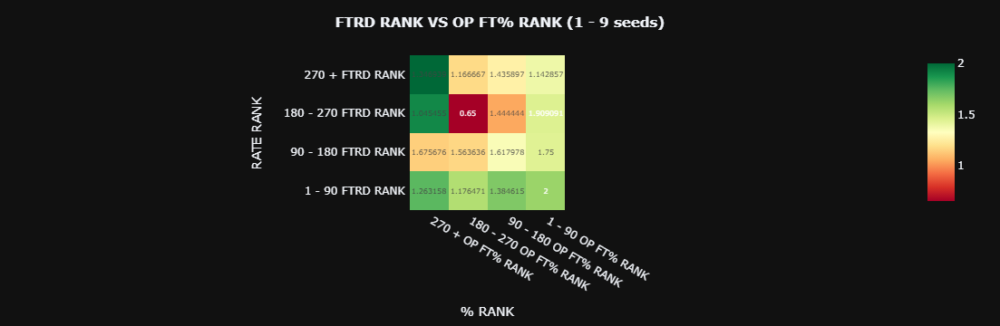

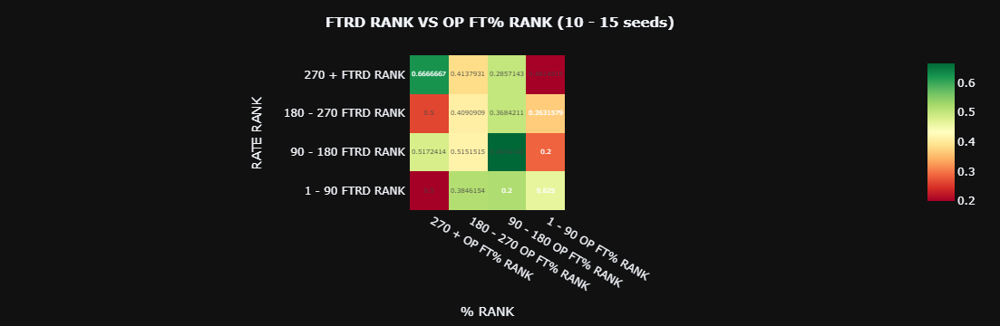

In [96]:
stat1, stat2 = 'FTRD RANK', 'OP FT% RANK'
# get_curr_teams_bins(curr_cs, stat1, stat2, 1, 16)
make_heatmaps(cs, stat1, stat2, 'rank') 

In [97]:
# Create dataframe consisting of the average upset and non upset differentials of specific matchups  
################################################################################################### 

# Losing Seeds 
seed1 = [8, 7,  6,  5,  4,  3,  2,  1, 1, 2, 2,  3, 3,  4, 1, 1]   
# Winning Seeds  
seed2 = [9, 10, 11, 12, 13, 14, 15, 8, 9, 7, 10, 6, 11, 5, 4, 5]
seed_matchups = pd.DataFrame()

selected_cols = diff.columns[~diff.columns.isin(diff.iloc[:, diff.columns.get_loc('L YEAR') : diff.columns.get_loc('L SCORE') + 1])] 
cols = diff[selected_cols]
cols = cols.iloc[:, diff.columns.get_loc('W K TEMPO') :]
cols.head()

for i in range(len(seed1)) : 
    # Get the seed matchup  
    matchups = diff.loc[diff['W SEED'].isin([seed1[i], seed2[i]]) & diff['L SEED'].isin([seed1[i], seed2[i]])] 
    # matchups = matchups.loc[matchups['W YEAR'].le(2022)] 
    matchups = matchups.loc[matchups['W YEAR'].ne(curr_year)] 
    
    non_upset = matchups.loc[matchups['W SEED'].isin([seed1[i]])]   # Get the non upset games 
    upset = matchups.loc[matchups['W SEED'].isin([seed2[i]])]       # Get the upset games 
    
    # Get the average stat values for the upset and non upset matchups  
    mean = non_upset[cols.columns].mean() 
    seed_matchups = pd.concat([seed_matchups, mean], axis = 1)
    
    mean = - upset[cols.columns].mean() 
    seed_matchups = pd.concat([seed_matchups, mean], axis = 1)

seed_matchups = seed_matchups.T 
seed_matchups = seed_matchups.reset_index(drop = True) 
rank_cols = [col for col in seed_matchups.columns if 'RANK' in col] 
# Remove the rank stats as it makes the matchups stats redundant  
removed_cols = seed_matchups.columns[~seed_matchups.columns.isin(rank_cols)] 
seed_matchups = seed_matchups[removed_cols] 
seed_matchups['TYPE'] = ''

seed_matchups.iloc[::2, - 1:] = 'NON UPSET' 
seed_matchups.iloc[1::2, - 1:] = 'UPSET' 

# Remove all of the losing teams   
seed_matchups = seed_matchups.loc[:, ~seed_matchups.columns.str.startswith('L')] 
del matchups, non_upset, upset 

In [98]:
# Create dataframe consisting of the top 20 statistics with the biggest differentials between the upsets and non upsets 
#######################################################################################################################  

diff_matchups = seed_matchups.loc[(seed_matchups['TYPE'] == 'UPSET') | (seed_matchups['TYPE'] == 'NON UPSET')]
removed_cols = diff_matchups.columns[~diff_matchups.columns.isin(['TYPE'])] 
# Get the differentials of all non rank stats   
diff_matchups = diff_matchups[removed_cols].diff()
diff_matchups = diff_matchups.iloc[1::2]
diff_matchups = diff_matchups.abs()

diff_matchups = diff_matchups.drop(columns = ['W K TEMPO', 'W K OFF', 'W K DEF', 
                                             'W RAW T', 'W H RAW T', 'W A RAW T', 'W N RAW T', 'W AN RAW T',
                                             'W OP FT%', 'W H OP FT%', 'W A OP FT%', 'W N OP FT%', 'W AN OP FT%'])
diff_matchups = diff_matchups.T 

values_df = pd.DataFrame()
stat_count = 20 

# Get the top 20 stats with the biggest differentials  
for i in range(len(seed1)) : 
    values = diff_matchups.nlargest(stat_count, diff_matchups.columns[i])
    values_df = pd.concat([values_df, values.iloc[:, i]], axis = 0)
    
values_df.index.name = 'STAT' 
values_df['MATCHUP NO'] = np.arange(len(values_df))  
values_df = values_df.set_index('MATCHUP NO', append = True)

simp_seed_matchups = pd.DataFrame()
j = 0  

# Simplify the dataframe  
for i in range(0, len(values_df), stat_count) :  
    temp_df = values_df.iloc[i : i + stat_count]
    temp_df = temp_df.droplevel(1) 
    simp_seed_cols = seed_matchups.loc[j:j + 1, temp_df.T.columns]
    simp_seed_cols = simp_seed_cols.reset_index(drop = True)
    simp_seed_matchups = pd.concat([simp_seed_matchups, simp_seed_cols], axis = 1)
    j += 2 
    
del temp_df 

In [99]:
# Create dataframe with the appropriate format for a bar plot  
#############################################################  

simp_seed_matchups = simp_seed_matchups.T 
simp_seed_matchups.columns = ['NON UPSET', 'UPSET']
simp_seed_matchups = simp_seed_matchups.rename_axis('STAT').reset_index() 

simp_seed_matchups['DIFFERENTIAL'] = ''
simp_seed_matchups['MATCHUPS'] = ''
temp1 = simp_seed_matchups.copy()

# Set the differential values to the upset and non upset differential values 
simp_seed_matchups['DIFFERENTIAL'] = simp_seed_matchups['NON UPSET']
temp1['DIFFERENTIAL'] = simp_seed_matchups['UPSET'] 

simp_seed_matchups['MATCHUPS'] = 'NON UPSET'
temp1['MATCHUPS'] = 'UPSET'

# Combine the upset and non upset dataframes to get all stat differentials 
simp_seed_matchups = pd.concat([simp_seed_matchups, temp1], axis = 0)
simp_seed_matchups = simp_seed_matchups.sort_index(ascending = True)
# Get rid of the "W" and "L" column prefixes  
simp_seed_matchups['STAT'] = simp_seed_matchups['STAT'].str[2:]

simp_seed_matchups['W SEED'] = ''
simp_seed_matchups['L SEED'] = ''

j = 0 

# Add columns representing the winning and losing seeds  
for i in range(0, len(simp_seed_matchups) // 2, stat_count) : 
    simp_seed_matchups.loc[i:i + stat_count, 'W SEED'] = seed1[j]
    simp_seed_matchups.loc[i:i + stat_count, 'L SEED'] = seed2[j]
    j += 1 

del temp1 

In [100]:
# Create dataframe for the current tournament matchups  
######################################################  

complete_curr_seed_matchups = pd.DataFrame()
num, j = 0, 0  

for i in range(len(seed1)) : 
    curr_matchups = diff.copy()
    curr_matchups = curr_matchups.loc[curr_matchups['W YEAR'].eq(curr_year)] 
    # Get the current seed matchup    
    curr_seed_matchups = curr_matchups.loc[curr_matchups['W SEED'].eq(seed1[i]) & curr_matchups['L SEED'].eq(seed2[i])] 

    # Get the past seed matchups      
    plot_matchups = simp_seed_matchups.loc[simp_seed_matchups['W SEED'].eq(seed1[i]) & simp_seed_matchups['L SEED'].eq(seed2[i])] 
    plot_matchups = plot_matchups.sort_values(by = ['MATCHUPS'], ascending = False) 
    j += stat_count 
    plot_matchups = plot_matchups.reset_index(drop = True)
    # Get the upset matchups  
    plot_matchups = plot_matchups.loc[plot_matchups['MATCHUPS'] == 'UPSET']
    col_names = plot_matchups['STAT'] 
    # Add the "W" prefix to column names for the purpose of retrieving these specific columns  
    col_names = ['W ' + sub for sub in col_names]  
    # Create the current team matchup names  
    team_names = str(seed1[i]) + ' ' + curr_seed_matchups['W TEAM'] + ' | ' + str(seed2[i]) + ' ' + curr_seed_matchups['L TEAM']
    team_names = team_names.reset_index(drop = True)
    
    # Get the specific current seed matchup   
    curr_seed_matchups = curr_seed_matchups.loc[:, col_names]
    curr_seed_matchups = curr_seed_matchups.T 
    curr_simp_seed_matchups = pd.concat([curr_seed_matchups.iloc[:, 0], curr_seed_matchups.iloc[:, 1]], axis = 0)

    # Change the num variable to the amount of matchups per seed minus two  
    if (seed2[i] == 10) : num = 4 
    else : num = 2 
    
    # Join all matchups with the same seeds together  
    for j in range(num) : 
        curr_simp_seed_matchups = pd.concat([curr_simp_seed_matchups, curr_seed_matchups.iloc[:, j + 2]], axis = 0)

    curr_simp_seed_matchups = curr_simp_seed_matchups.to_frame()
    curr_simp_seed_matchups['MATCHUPS'] = ''
    curr_simp_seed_matchups.columns = ['DIFFERENTIAL', 'MATCHUPS']

    r, c = 0, stat_count 

    # Set the cell to the matchup name  
    for k in range(num + 2) : 
        curr_simp_seed_matchups.iloc[r : c, 1] = team_names[k]  
        r += stat_count  
        c += stat_count  
    
    curr_simp_seed_matchups['W SEED'] = seed1[i]
    curr_simp_seed_matchups['L SEED'] = seed2[i]
    # Create a dataframe consisting of all current matchups  
    complete_curr_seed_matchups = pd.concat([complete_curr_seed_matchups, curr_simp_seed_matchups], axis = 0)  
    
complete_curr_seed_matchups['STAT'] = complete_curr_seed_matchups.index
complete_curr_seed_matchups = complete_curr_seed_matchups.sort_values(by = ['STAT'])
complete_curr_seed_matchups = complete_curr_seed_matchups.reset_index(drop = True) 
# Get rid of the "W" and "L" column prefixes    
complete_curr_seed_matchups['STAT'] = complete_curr_seed_matchups['STAT'].str[2:]

In [101]:
# Display the Matchup Data  
def plot_matchups(seed_matchups, curr_seed_matchups, seed1, seed2, title) : 
    # Get the past seed matchups    
    seed_matchups = seed_matchups.loc[seed_matchups['W SEED'].eq(seed1) & seed_matchups['L SEED'].eq(seed2)]
    # Get the current seed matchup    
    curr_seed_matchups = curr_seed_matchups.loc[curr_seed_matchups['W SEED'].eq(seed1) & curr_seed_matchups['L SEED'].eq(seed2)]
    
    # Combine the past and current seed matchup dataframes together for the purpose of data visualization  
    plot_matchups = pd.concat([seed_matchups, curr_seed_matchups], axis = 0)
    plot_matchups = plot_matchups.sort_values(by = ['STAT', 'MATCHUPS'], ascending = True) 
    plot_matchups = plot_matchups.reset_index(drop = True)
    
    # First row we want to get from the plot_matchups dataframe  
    j = 0 
    
    # Change the k variable to the amount of bars per stat for every matchup in one row of a bar plot  
    if seed2 == 10 : k = 40  
    else : k = 30  
    
    # Get a specific part of the matchups' dataframe   
    for i in range(4) : 
        sub_plot_matchups = plot_matchups.loc[j : k - 1, :]
        
        # Increase the row coordinates for the subsequent data visualization  
        if seed2 == 10 : 
            j += 40 
            k += 40 
        else : 
            j += 30 
            k += 30 
        
        fig = px.histogram(sub_plot_matchups, x = 'STAT', y = 'DIFFERENTIAL', title = '<b>' + titles[title] + ' SEEDS </b>', 
                       color = 'MATCHUPS', barmode = 'group', template = 'plotly_dark', height = 600)
        fig.update_layout(title_x = 0.5, title_font = dict(size = 20), yaxis_title = 'DIFFERENTIAL', 
                          legend = dict(yanchor = 'top', y = 1.5, xanchor = 'right', x = 1, font = dict(size = 10))) 
        fig.update_xaxes(tickangle = 45)
        fig.show()

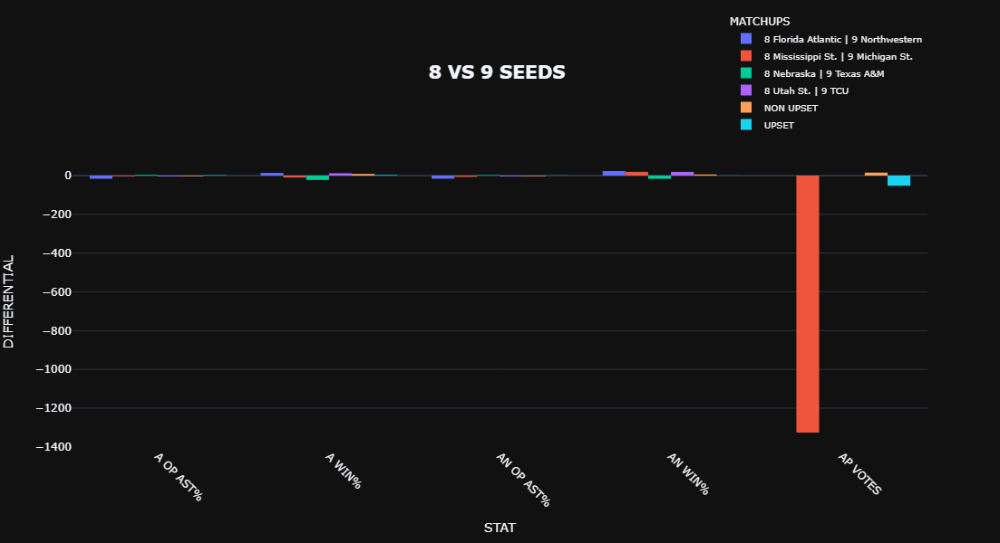

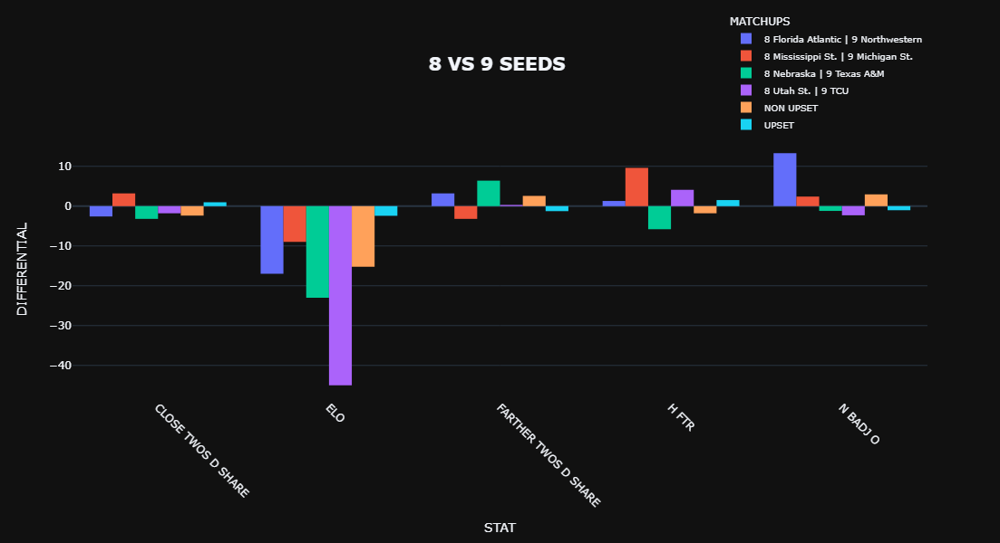

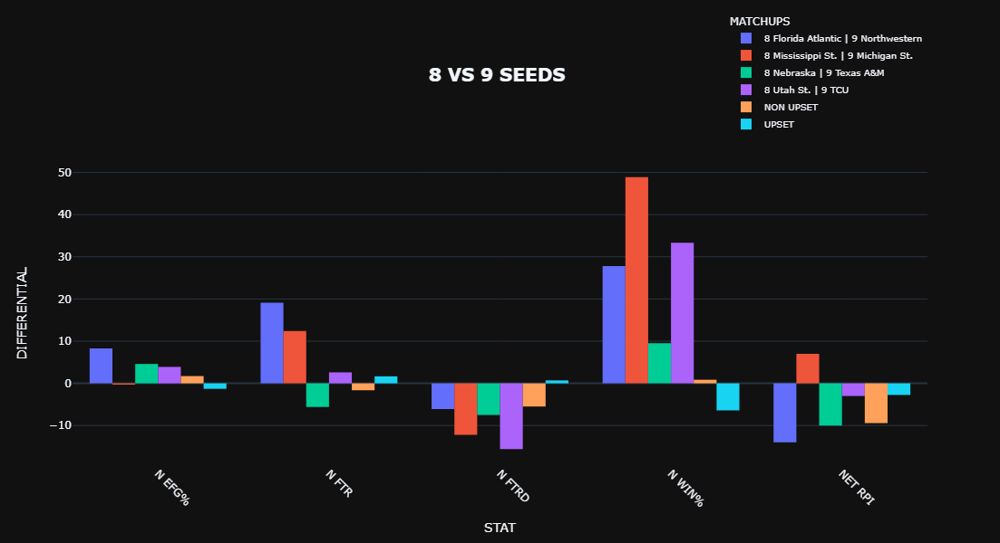

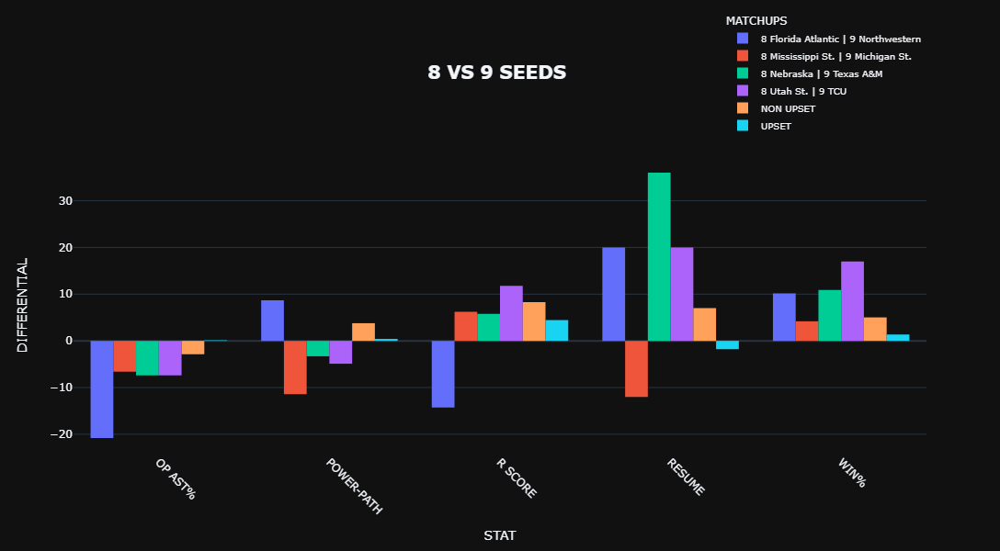

In [102]:
titles = ['8 VS 9', '7 VS 10', '6 VS 11', '5 VS 12', '4 VS 13', '3 VS 14', '2 VS 15', 
          '1 VS 8', '1 VS 9', '2 VS 7', '2 VS 10', '3 VS 6', '3 VS 11', '4 VS 5', 
          '1 VS 4', '1 VS 5']

plot_matchups(simp_seed_matchups, complete_curr_seed_matchups, 8, 9, 0)

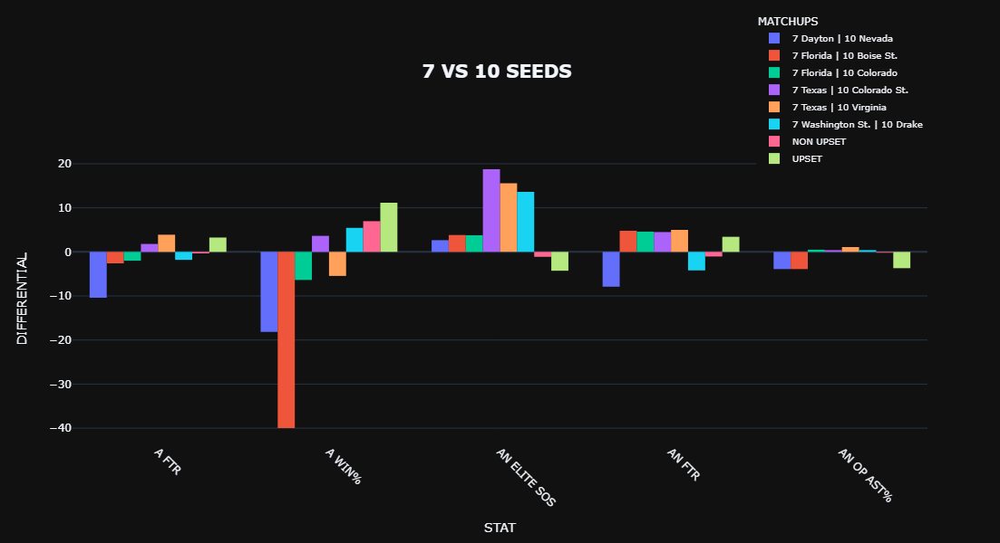

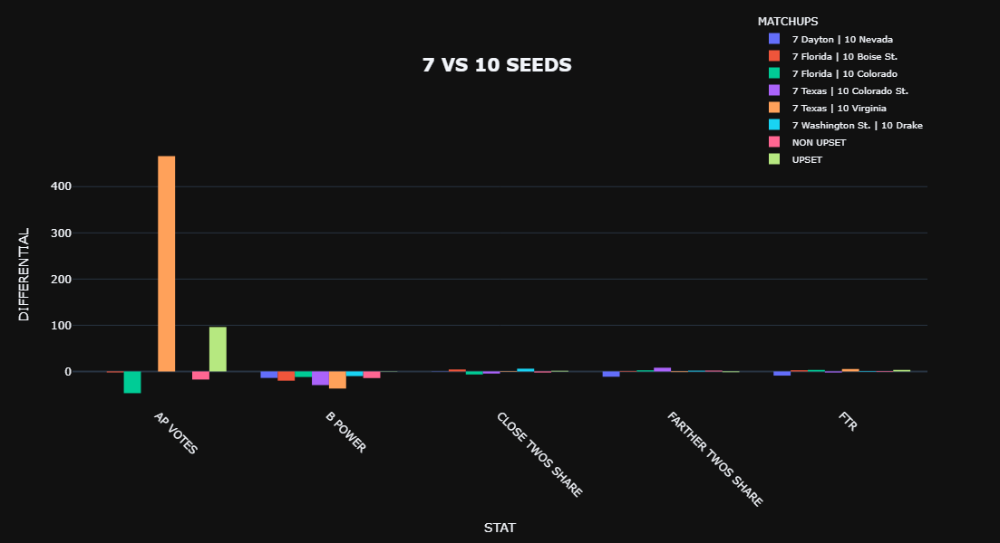

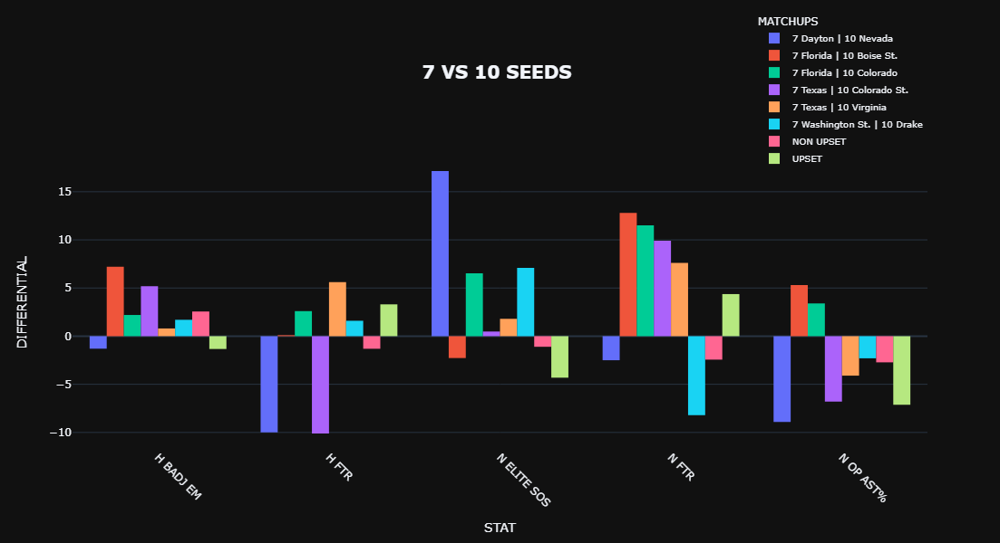

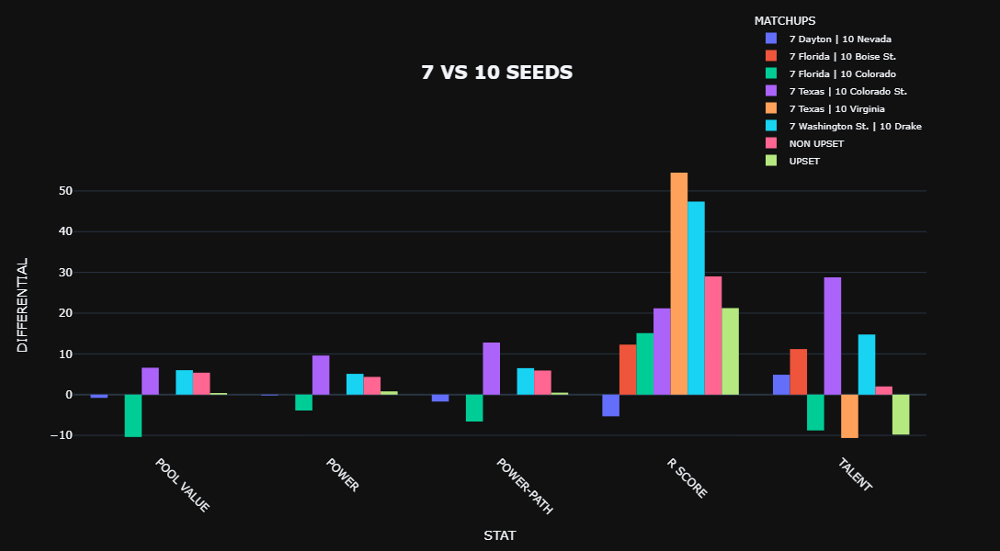

In [103]:
plot_matchups(simp_seed_matchups, complete_curr_seed_matchups, 7, 10, 1)

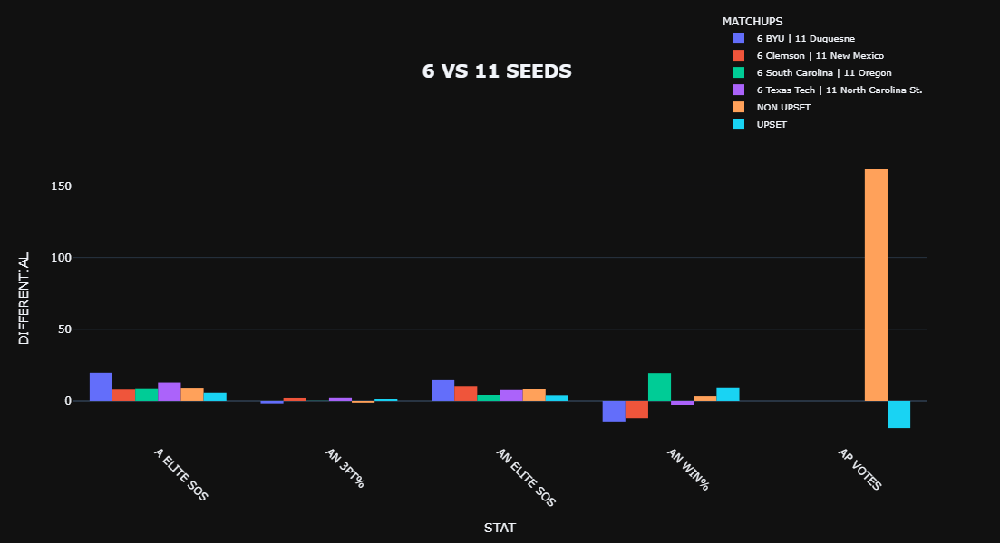

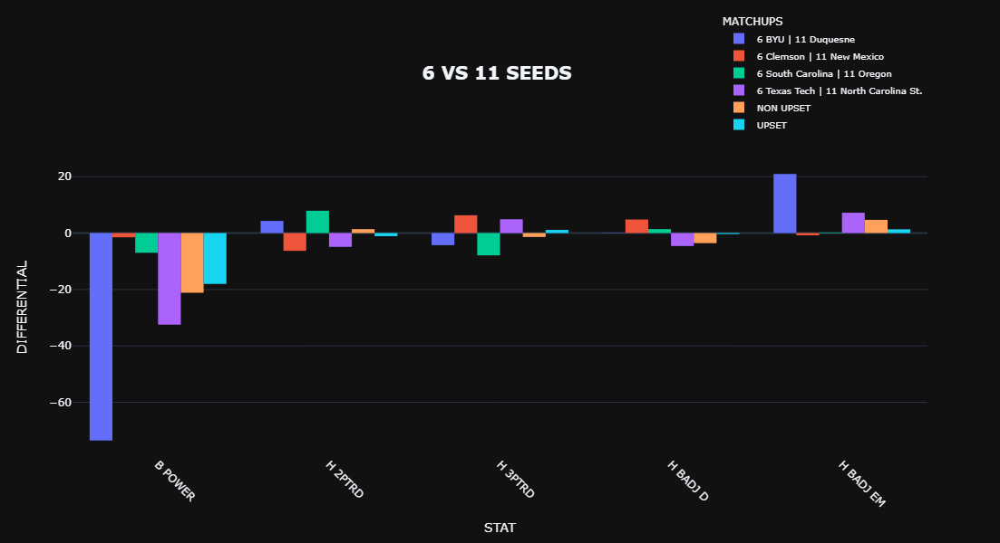

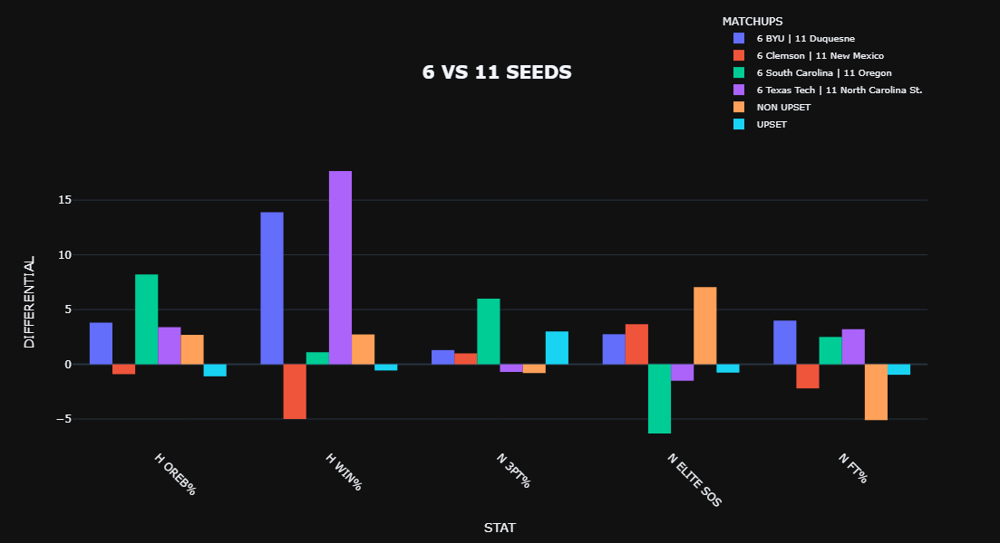

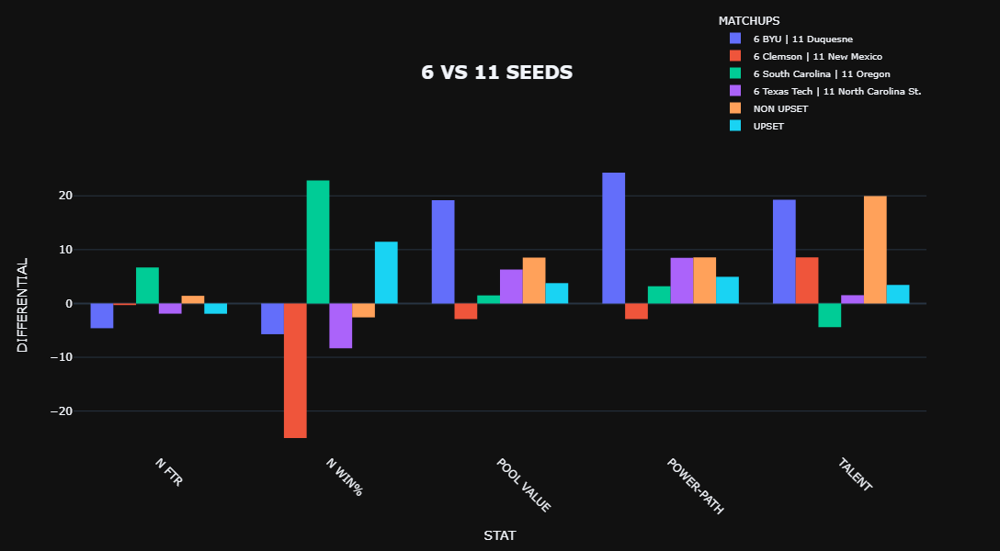

In [104]:
plot_matchups(simp_seed_matchups, complete_curr_seed_matchups, 6, 11, 2)

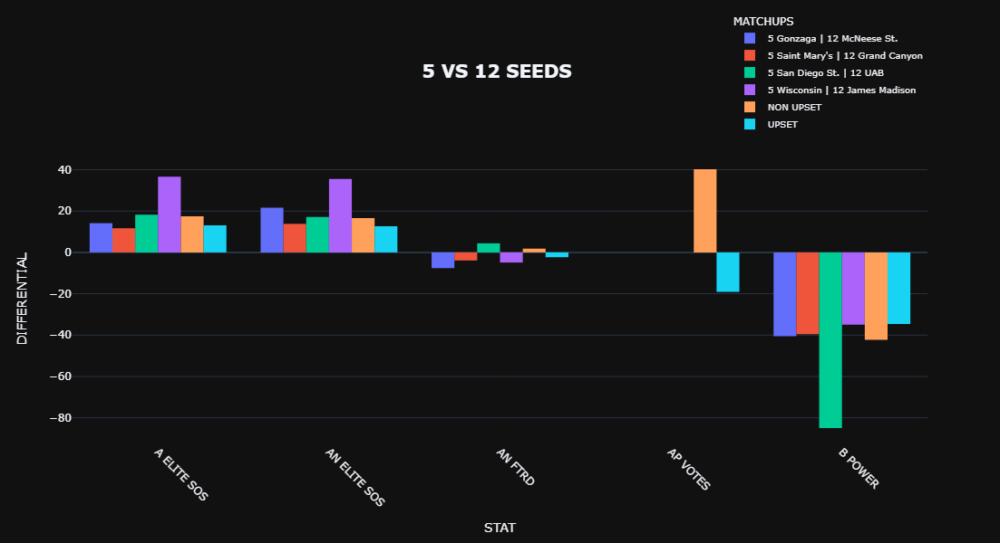

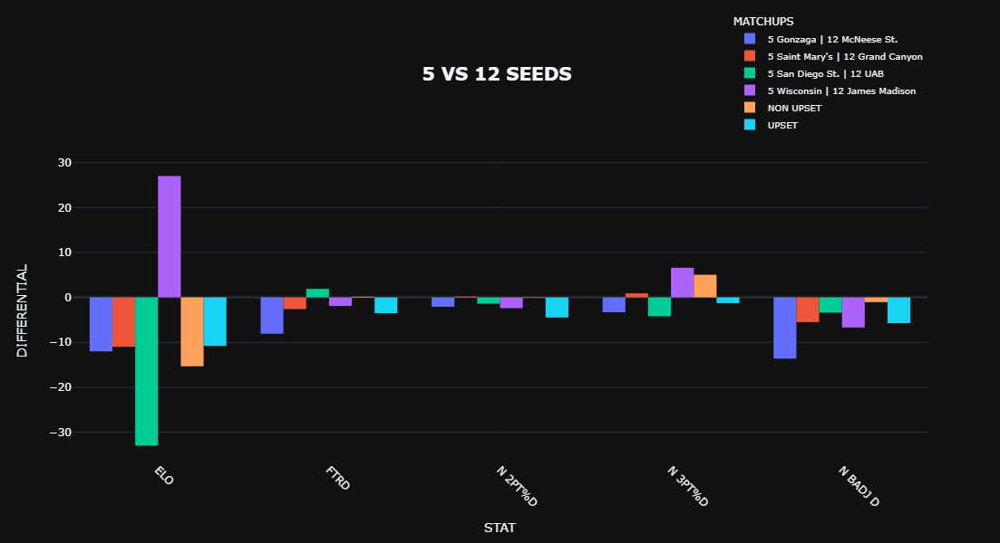

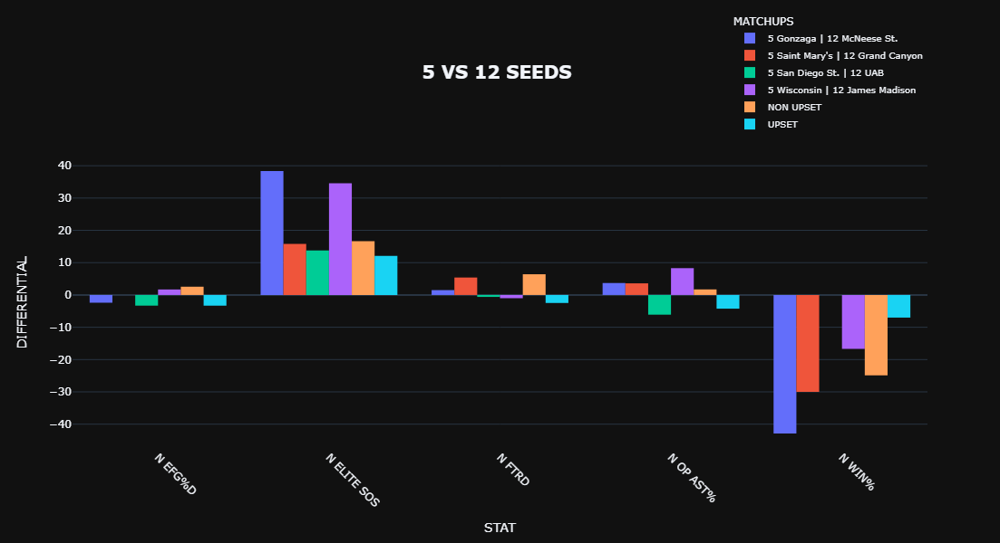

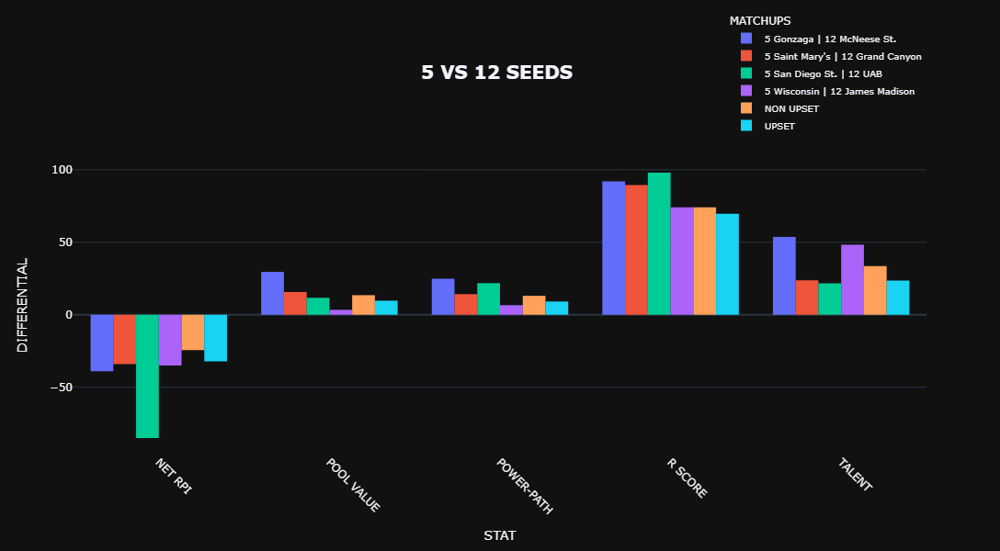

In [105]:
plot_matchups(simp_seed_matchups, complete_curr_seed_matchups, 5, 12, 3)

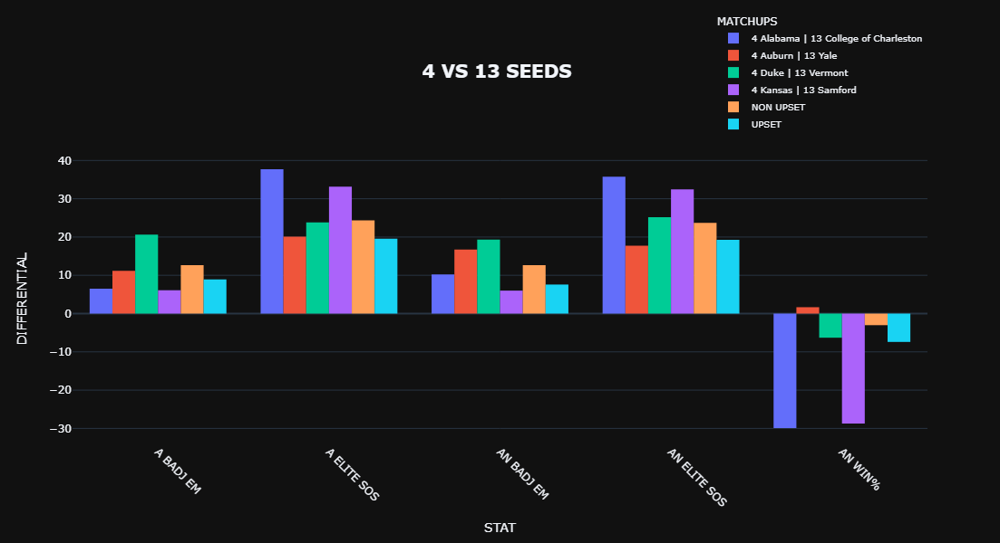

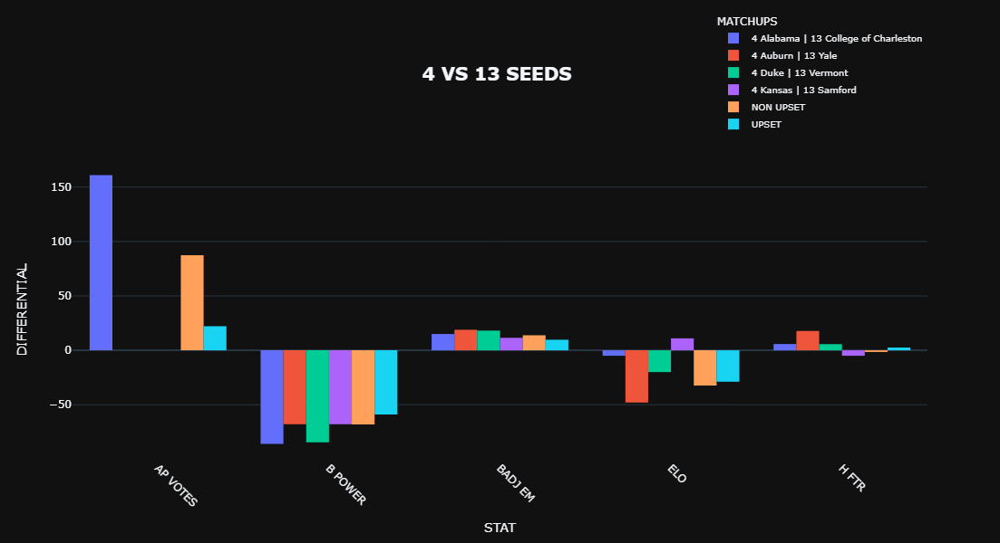

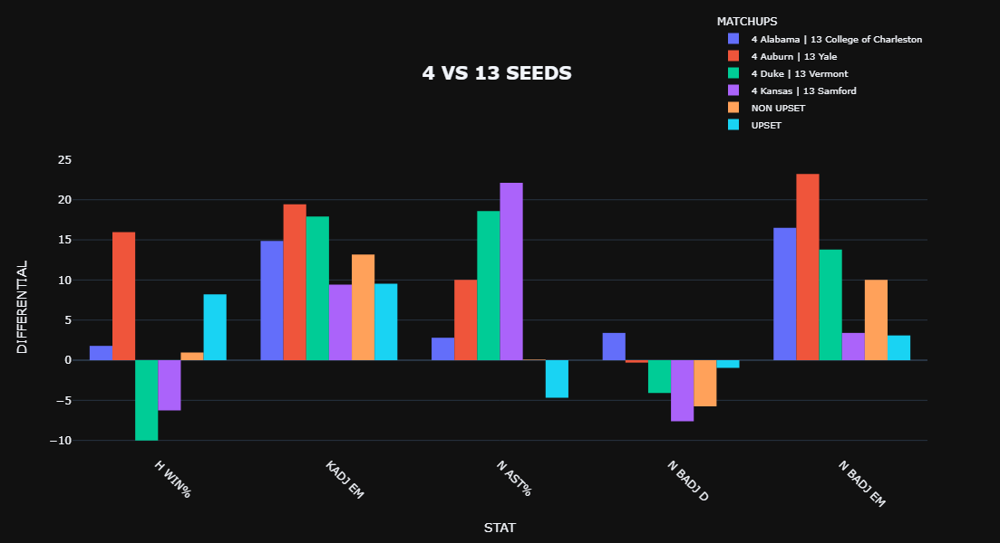

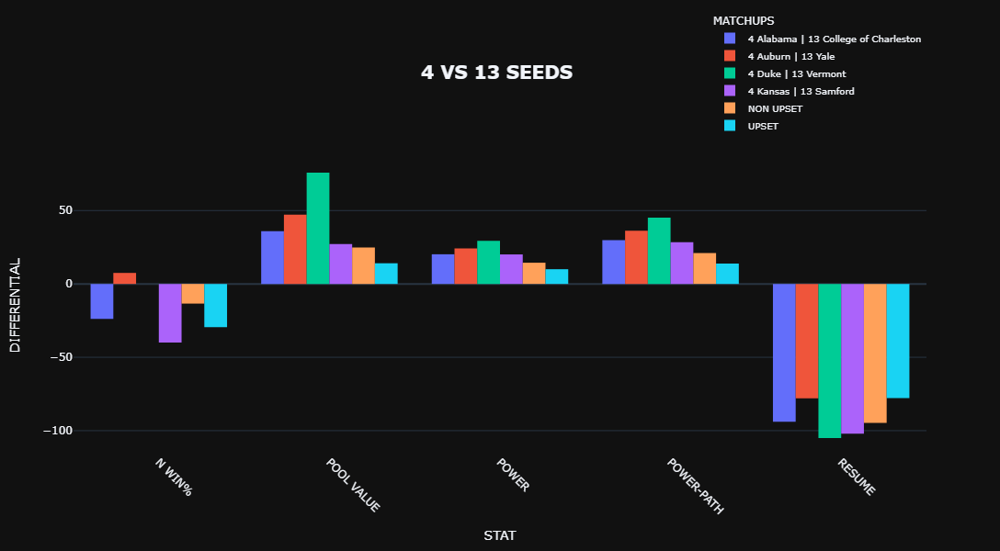

In [106]:
plot_matchups(simp_seed_matchups, complete_curr_seed_matchups, 4, 13, 4)

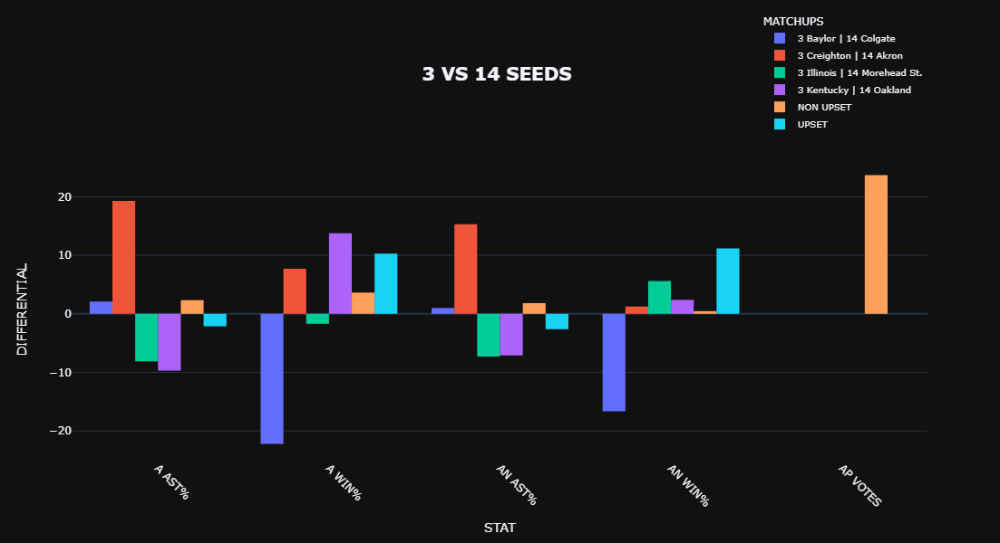

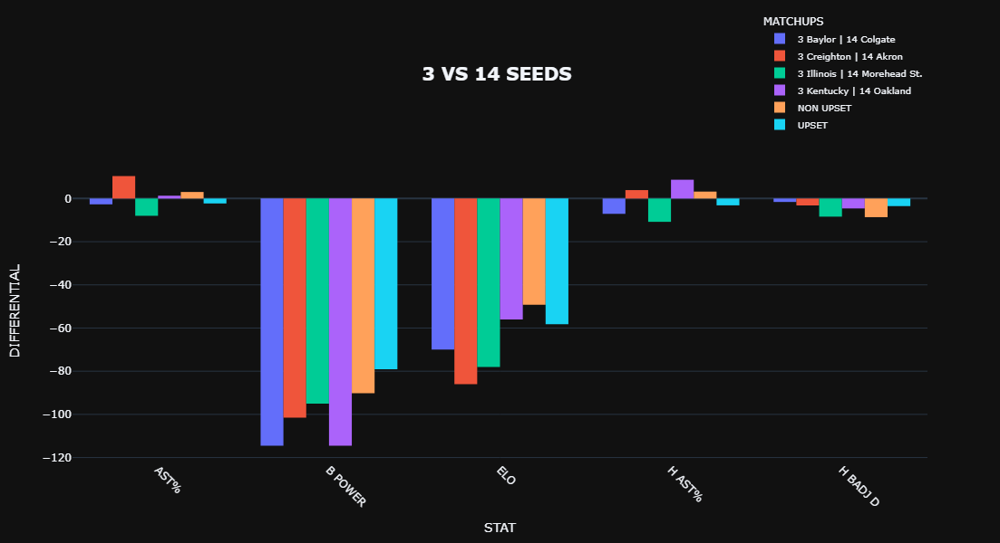

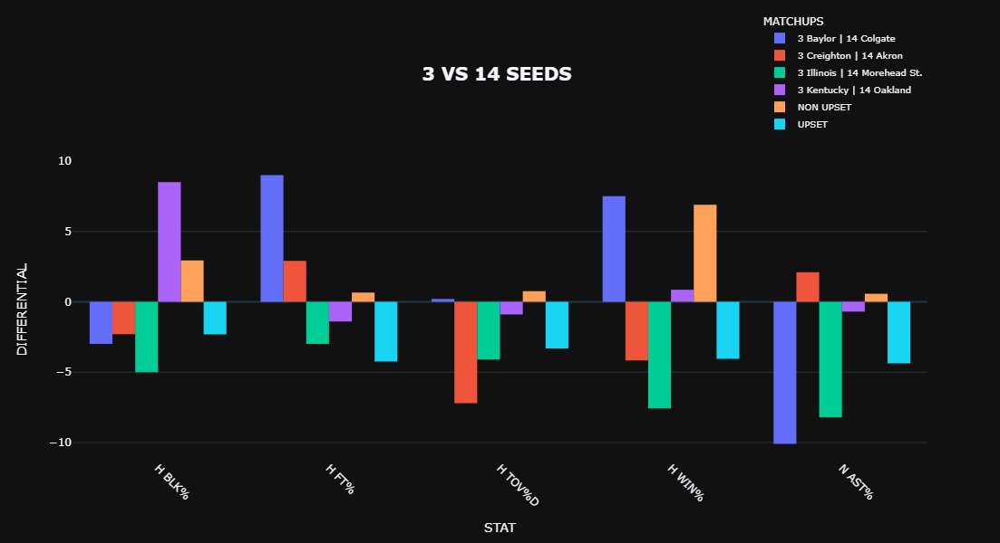

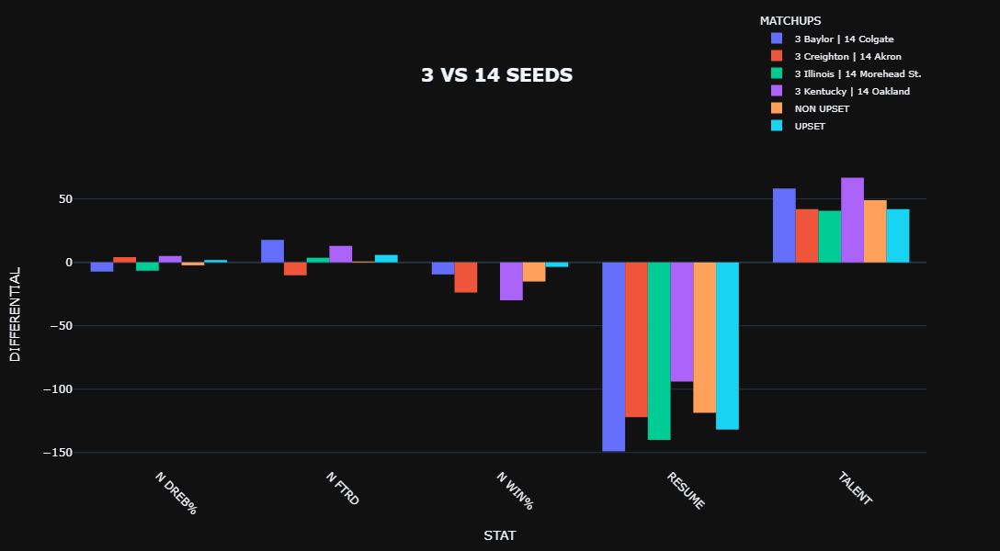

In [107]:
plot_matchups(simp_seed_matchups, complete_curr_seed_matchups, 3, 14, 5)

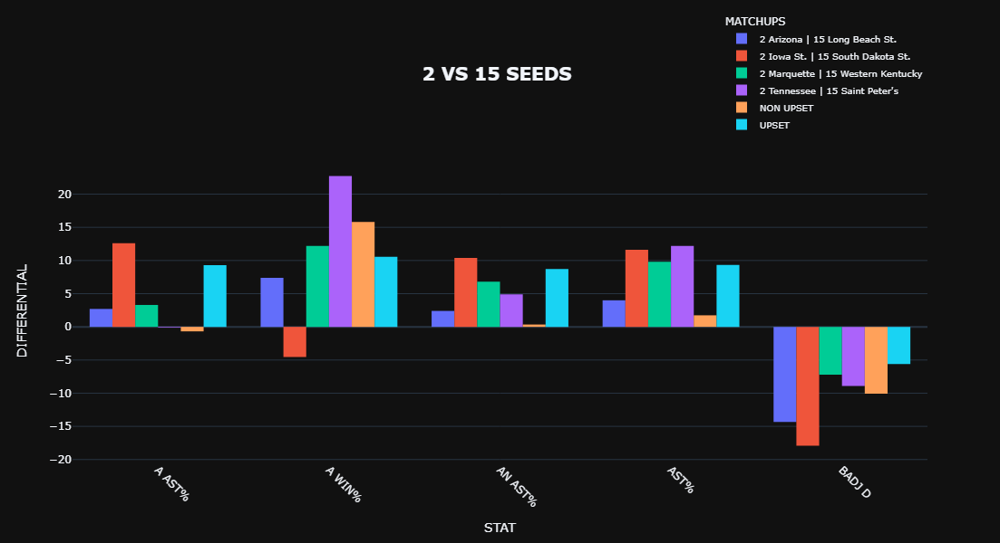

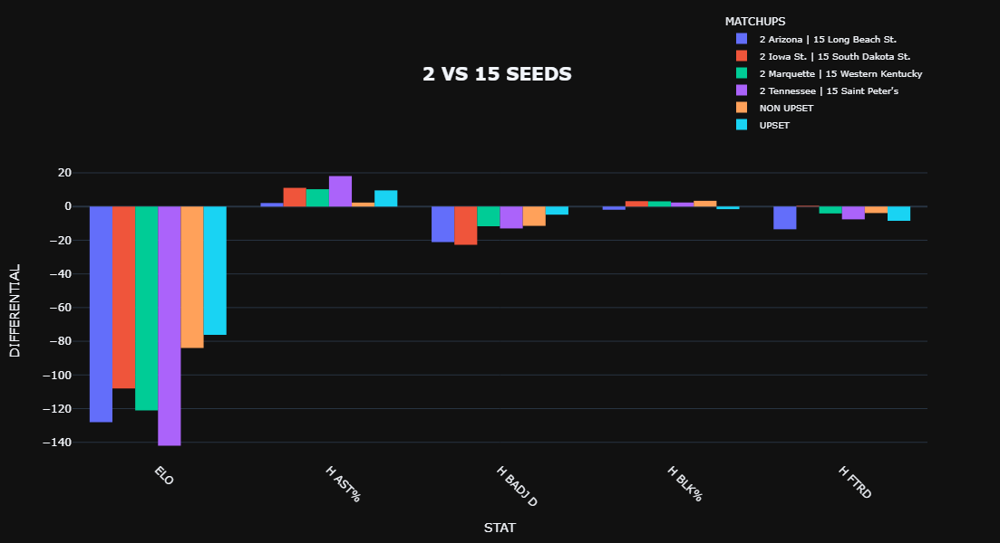

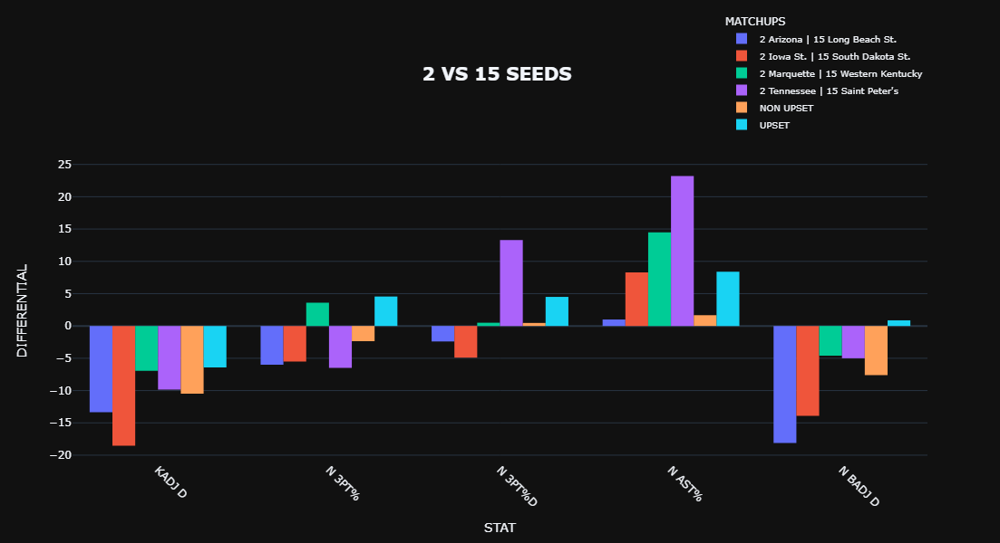

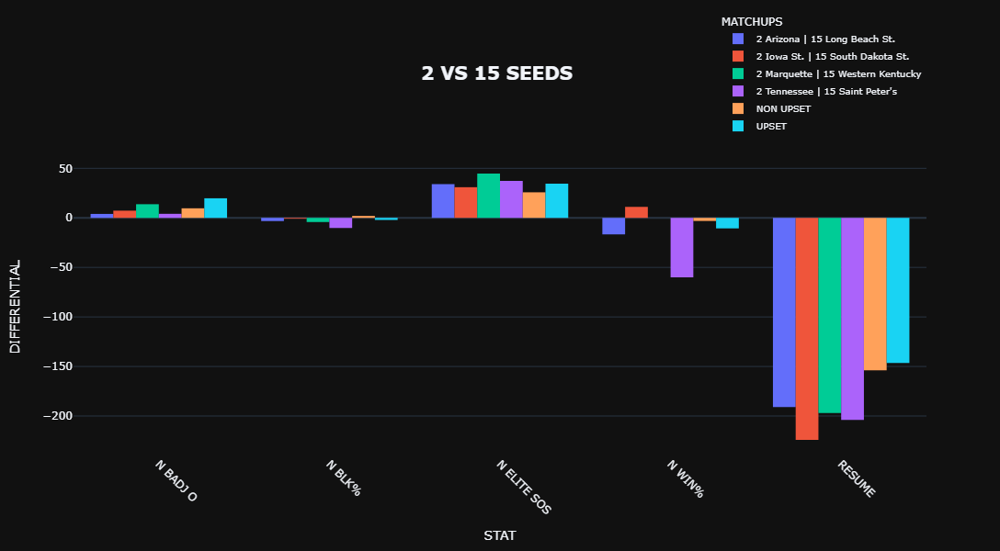

In [108]:
plot_matchups(simp_seed_matchups, complete_curr_seed_matchups, 2, 15, 6)

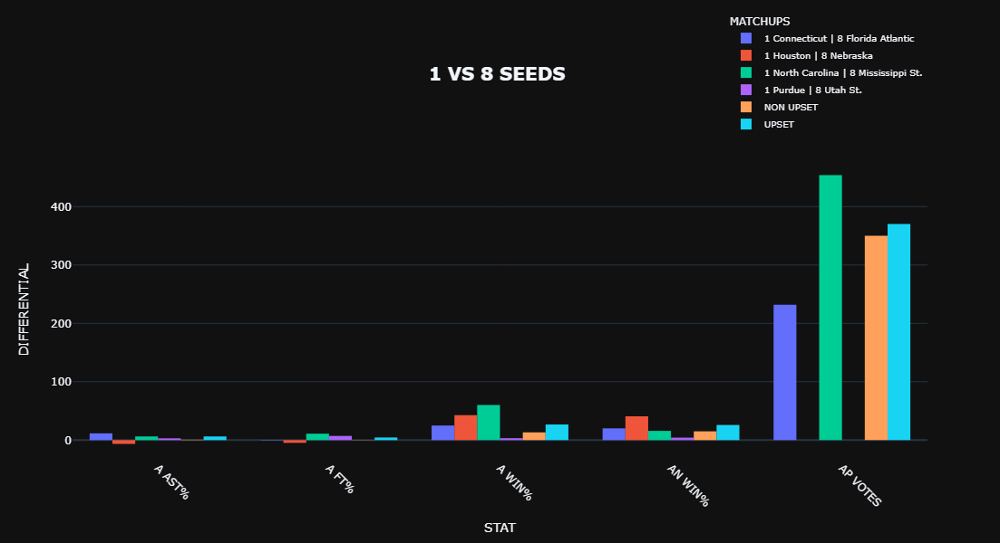

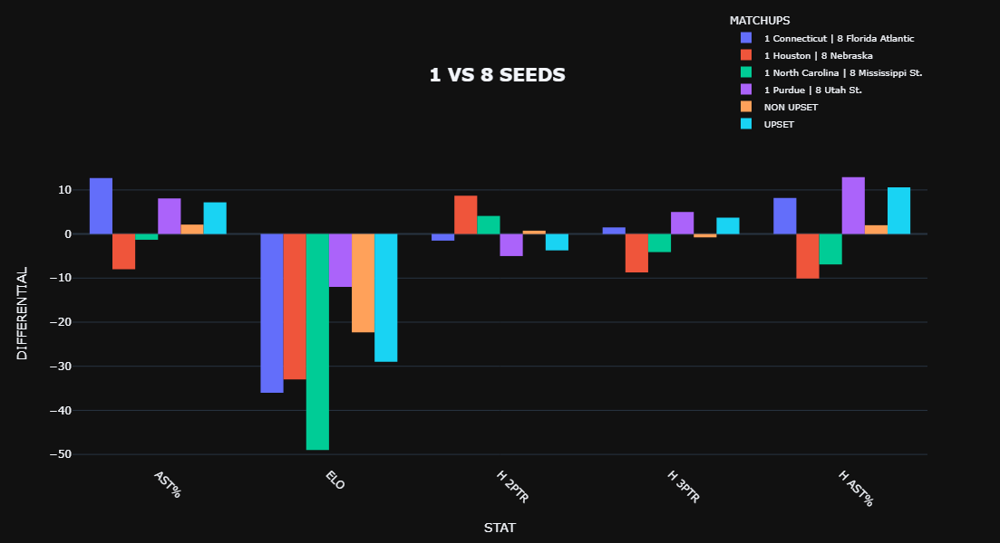

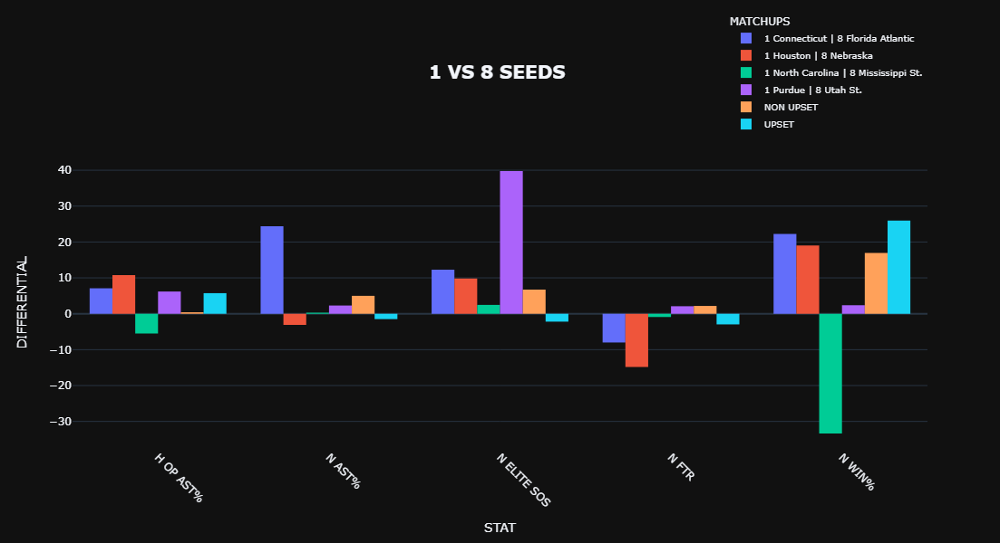

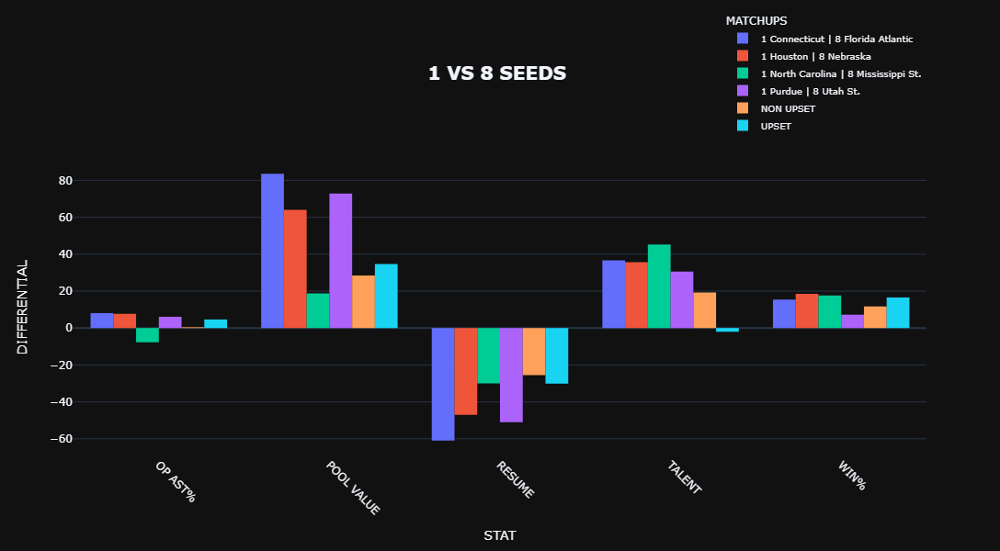

In [109]:
plot_matchups(simp_seed_matchups, complete_curr_seed_matchups, 1, 8, 7)

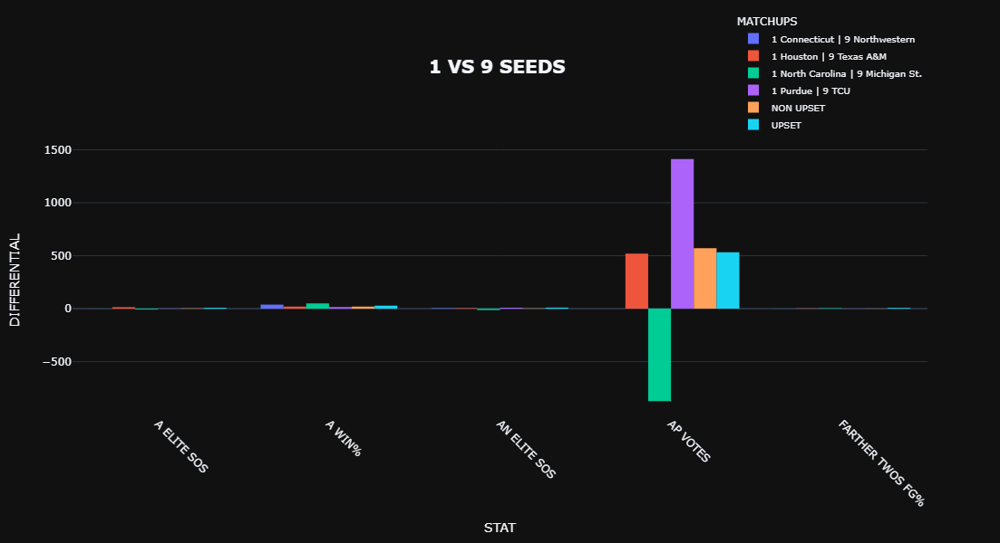

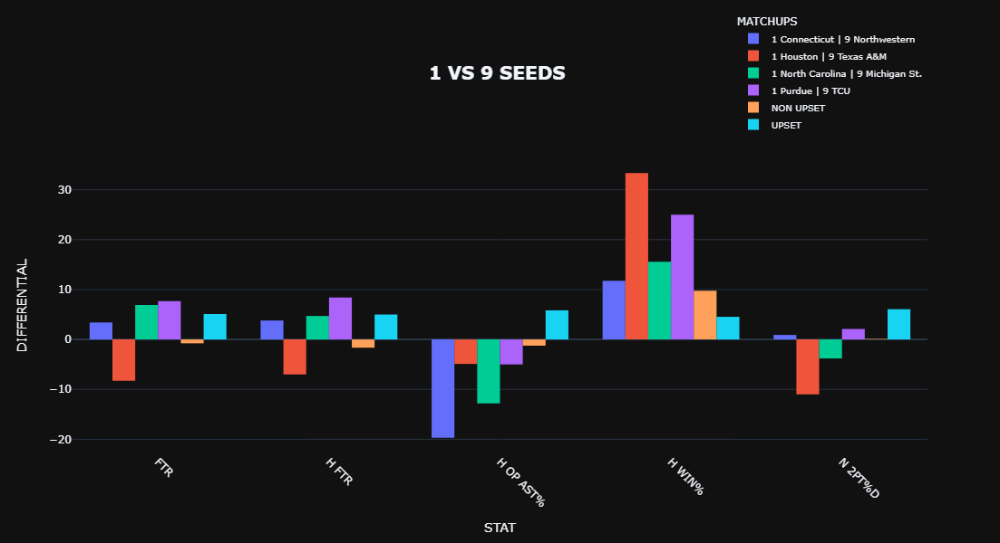

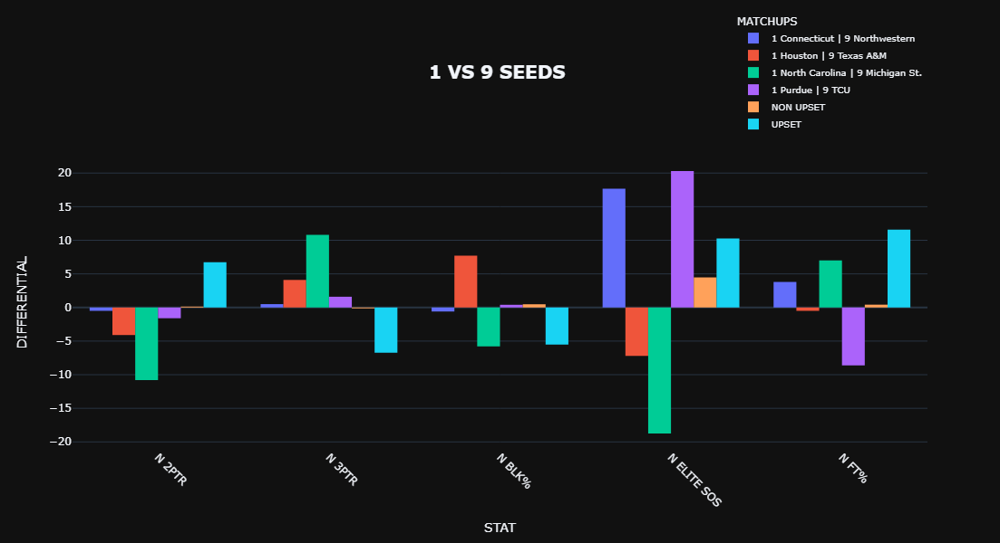

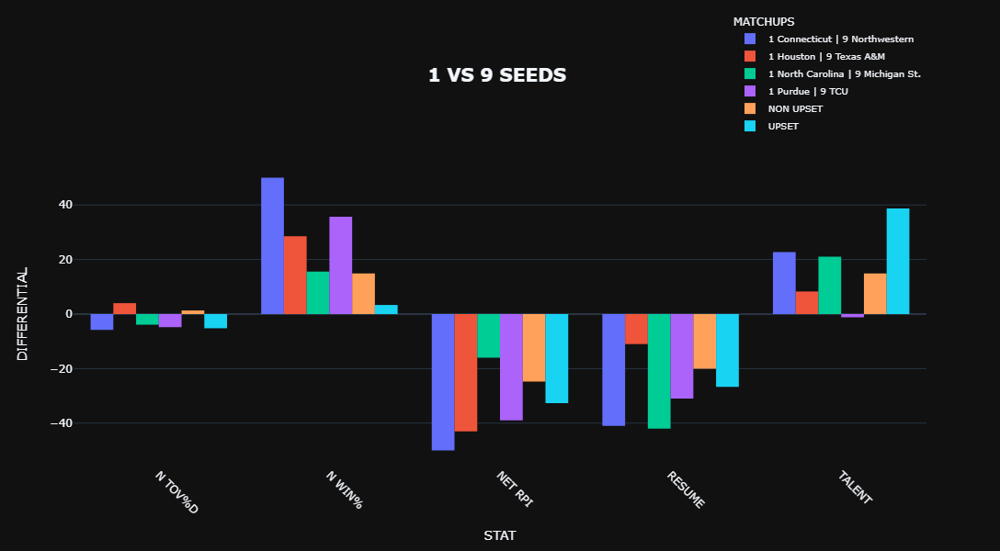

In [110]:
plot_matchups(simp_seed_matchups, complete_curr_seed_matchups, 1, 9, 8)

In [111]:
#gc.collect()

In [112]:
# Displays the plots for each seed given a statistic  
####################################################  

mod_rounds_num = [1, 2, 4, 8, 16, 32, 64, 0]
mod_round_str = ['CHAMPION', 'FINALS', 'FINAL 4', 'ELITE 8', 'SWEET 16', 'SECOND ROUND', 'FIRST ROUND', '2024 TEAMS']    

def display_plots(df, curr_df, y_col, x0, x1, mode) : 
    temp_df = df.copy()  
    temp_df['SEED'] = temp_df['SEED'].astype(str)    
    curr_df['SEED'] = curr_df['SEED'].astype(str)  
    
    if 'WAB' in y_col : 
        if 'WAB RANK' in y_col : pass 
        # Remove the 2021 tournament year for WAB visualization as teams did not play all games that year  
        else : temp_df = temp_df.loc[temp_df['YEAR'].ne(2021)]  

    fig = px.scatter(temp_df, x = 'ROUND', y = y_col, title = '<b> Past Tournament Teams </b>', hover_data = ['YEAR', 'TEAM'], 
                     animation_frame = 'SEED', color = 'SEED', color_discrete_sequence = px.colors.qualitative.Light24, template = 'plotly_dark', 
                     height = 650) 
    fig['layout'].pop('updatemenus')    
    fig.update_layout(title_x = 0.5, showlegend = False)  
    fig.update_xaxes(categoryorder = 'array', categoryarray = mod_round_str, autorange = 'reversed') 
    fig.add_vrect(x0 = 6.5, x1 = 7.5, fillcolor = 'green', opacity = 0.25, line_width = 0) 
    fig.add_vline(x = 6.5)
    
    # Changing the value for the upper and lower y axis value depending on the stat for the purpose of making the plots clearer 
    if 'R SCORE' in y_col : val = 0.5 
    elif 'DRAW' in y_col : val = 0.5 
    elif 'VAL Z-SCORE' in y_col : val = 0.5 
    elif 'BARTHAG' in y_col : val = 0.02 
    elif y_col == 'EXP' or 'HGT' in y_col : val = 0.2 
    elif 'PPP' in y_col : val = 0.02 
    elif ' RANK' in y_col : 
        if 'WAB RANK' : val = 2 
        else : val = 20  
    else : val = 2   

    go.Figure(data = fig.data, frames = [fr.update(layout = 
             {'xaxis': {'range' : [7.5, - 0.5]}, 
              'yaxis': {'range' : [min(fr.data[0].y) - val, max(fr.data[0].y) + val]},}) for fr in fig.frames], layout = fig.layout)   
    fig.show()
    
    fig = px.scatter(curr_df, x = 'SEED', y = y_col, title = '<b>' + str(curr_year) + ' Teams </b>', hover_data = ['YEAR', 'TEAM'], 
                     color = 'SEED', color_discrete_sequence = px.colors.qualitative.Light24, template = 'plotly_dark', 
                     height = 550)  
    fig.update_layout(title_x = 0.5)   
    
    green_arr, orange_arr, red_arr, max_arr, min_arr = [], [], [], [], []  
    temp_df['SEED'] = temp_df['SEED'].astype(int) 
    
    # Display the red zone as lower values and the green zone as higher values 
    if mode == 'forward' : 
        for seed in range(len(x0)) : 
            seed_df = temp_df.loc[temp_df['SEED'].isin([seed + 1])] 
            green_arr.append(seed_df[y_col].quantile(0.75)) 
            red_arr.append(seed_df[y_col].quantile(0.25)) 
            max_arr.append(seed_df[y_col].max())
            min_arr.append(seed_df[y_col].min())    
        for i in range(len(x0)) : 
            fig.add_hrect(x0 = x0[i], x1 = x1[i], y0 = green_arr[i], y1 = max_arr[i], line_width = 0, fillcolor = 'green', opacity = 0.2)
            fig.add_hrect(x0 = x0[i], x1 = x1[i], y0 = red_arr[i], y1 = green_arr[i], line_width = 0, fillcolor = 'orange', opacity = 0.2)
            fig.add_hrect(x0 = x0[i], x1 = x1[i], y0 = min_arr[i], y1 = red_arr[i], line_width = 0, fillcolor = 'red', opacity = 0.2)
    # Display the red zone as higher values and the green zone as lower values  
    elif mode == 'backward' : 
        for seed in range(len(x0)) : 
            seed_df = temp_df.loc[temp_df['SEED'].isin([seed + 1])] 
            green_arr.append(seed_df[y_col].quantile(0.25)) 
            red_arr.append(seed_df[y_col].quantile(0.75)) 
            max_arr.append(seed_df[y_col].max())
            min_arr.append(seed_df[y_col].min())
        for i in range(len(x0)) :
            fig.add_hrect(x0 = x0[i], x1 = x1[i], y0 = min_arr[i], y1 = green_arr[i], line_width = 0, fillcolor = 'green', opacity = 0.2)
            fig.add_hrect(x0 = x0[i], x1 = x1[i], y0 = green_arr[i], y1 = red_arr[i], line_width = 0, fillcolor = 'orange', opacity = 0.2)
            fig.add_hrect(x0 = x0[i], x1 = x1[i], y0 = red_arr[i], y1 = max_arr[i], line_width = 0, fillcolor = 'red', opacity = 0.2)
 
    fig.show() 

In [113]:
# Create dataframes necessary to display the scatterplots  
#########################################################

stats = complete_stats.copy()
# stats = stats.loc[stats['YEAR'].ne(curr_year)]
stats = order_df(df_input = stats, order_by = 'SEED', order = order_seed)    
change_round_str(stats, mod_rounds_num, mod_round_str) 

hcti_stats = stats.loc[stats['YEAR'].ge(2013)] 

curr_stats = complete_stats.copy()
curr_stats = curr_stats.loc[curr_stats['YEAR'].eq(curr_year)] 
curr_stats = order_df(df_input = curr_stats, order_by = 'SEED', order = order_seed)    

# X Value Coordinates for the first colored bar  
x0, x1 = [0.025], [0.084425]

# Set the subsequent X Value Coordinates for the other 15 colored bars  
for i in range(15) : 
    x0.append(x0[i] + 0.059425)
    x1.append(x0[i + 1] + 0.059425) 

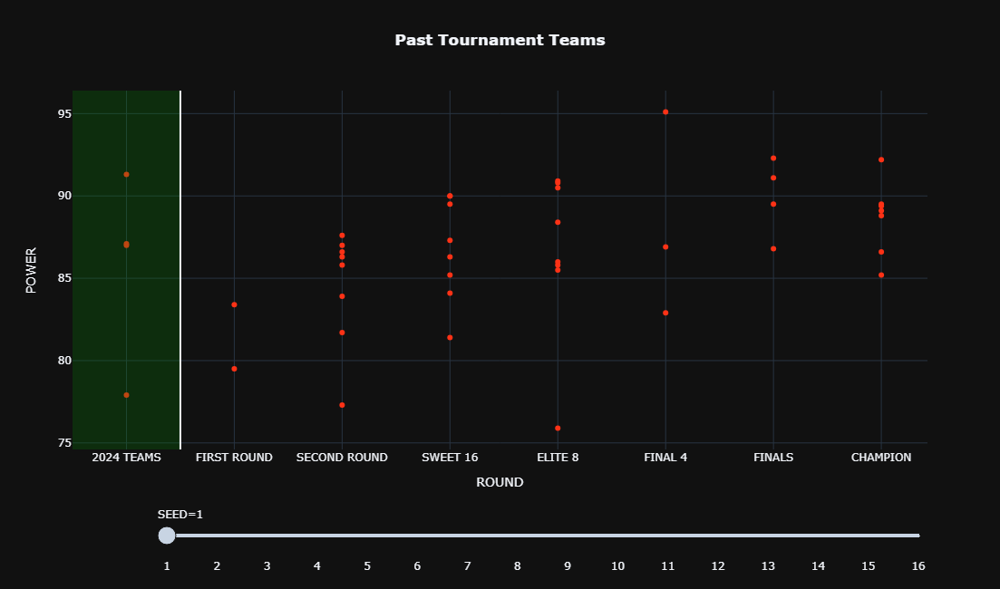

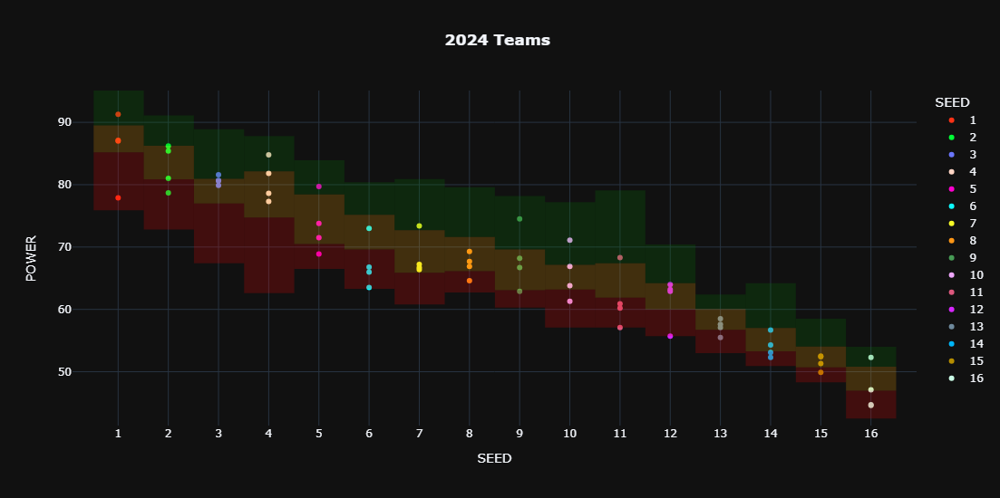

In [114]:
display_plots(hcti_stats, curr_stats, 'POWER', x0, x1, 'forward')       

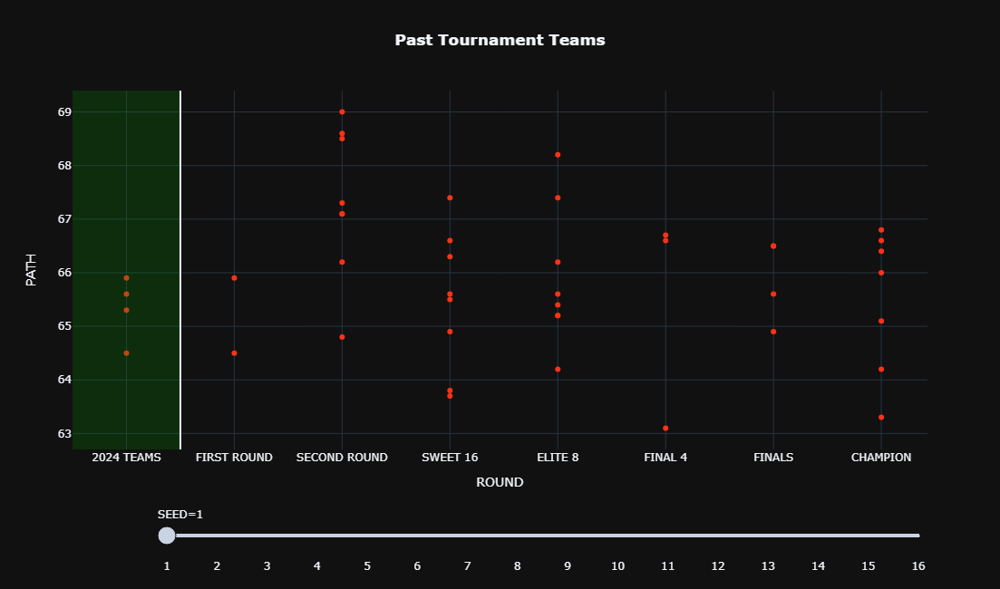

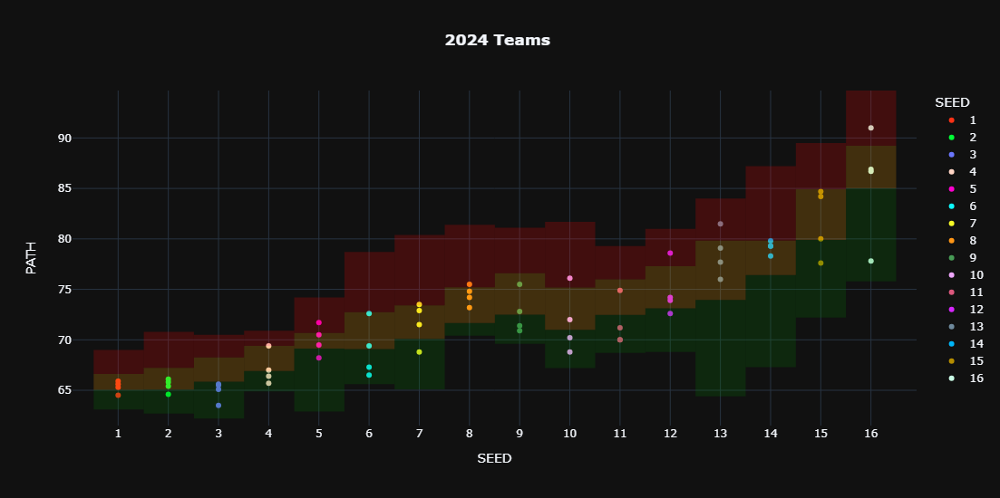

In [115]:
display_plots(stats, curr_stats, 'PATH', x0, x1, 'backward')

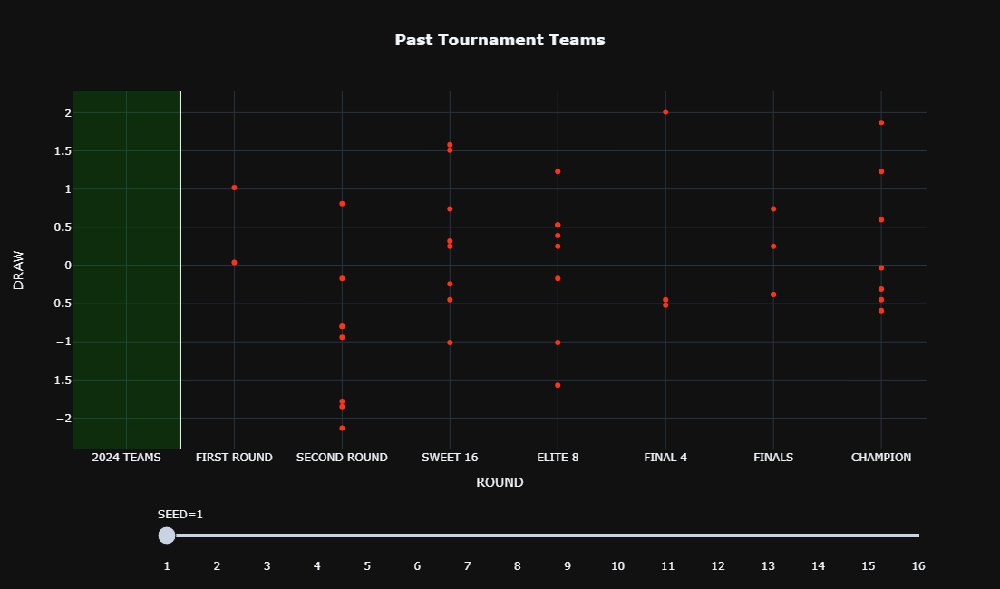

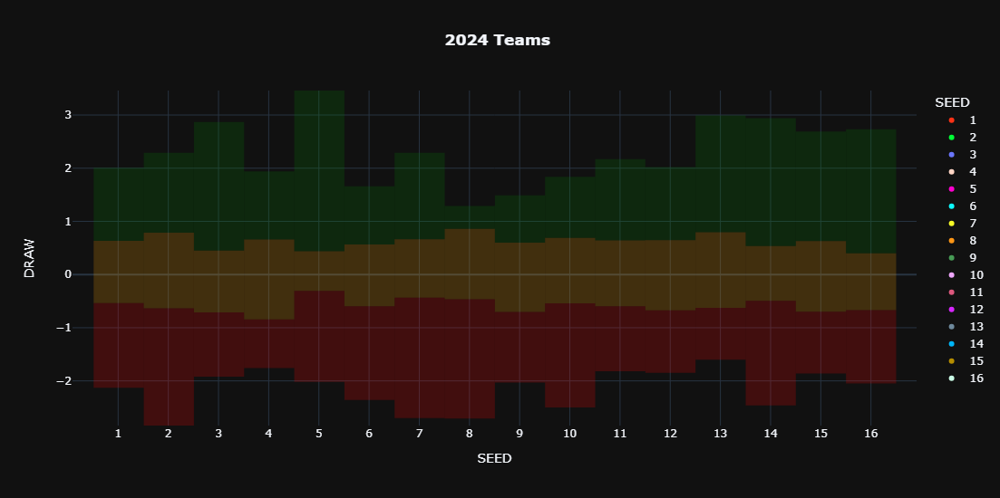

In [116]:
display_plots(stats, curr_stats, 'DRAW', x0, x1, 'forward')

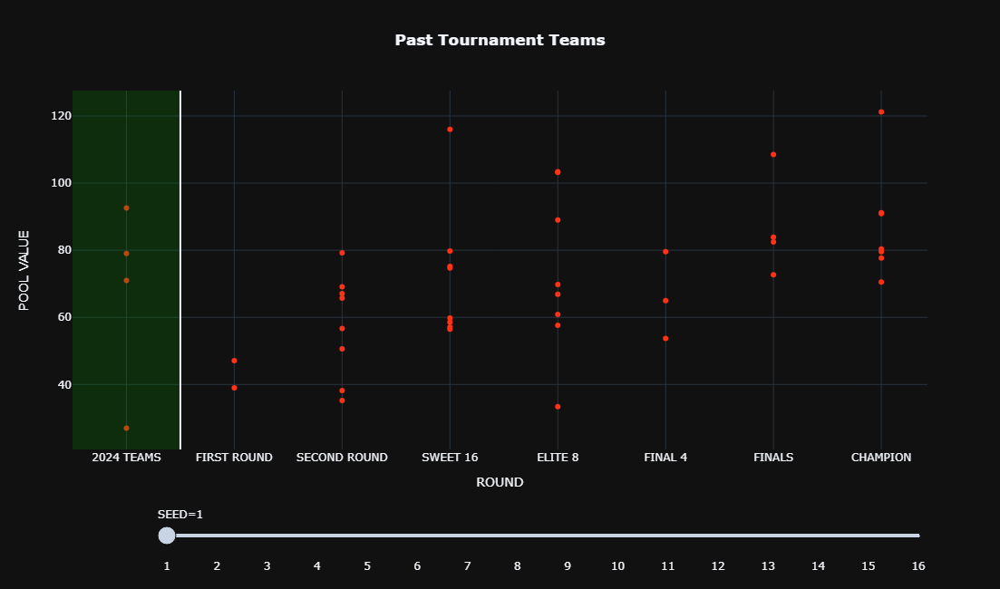

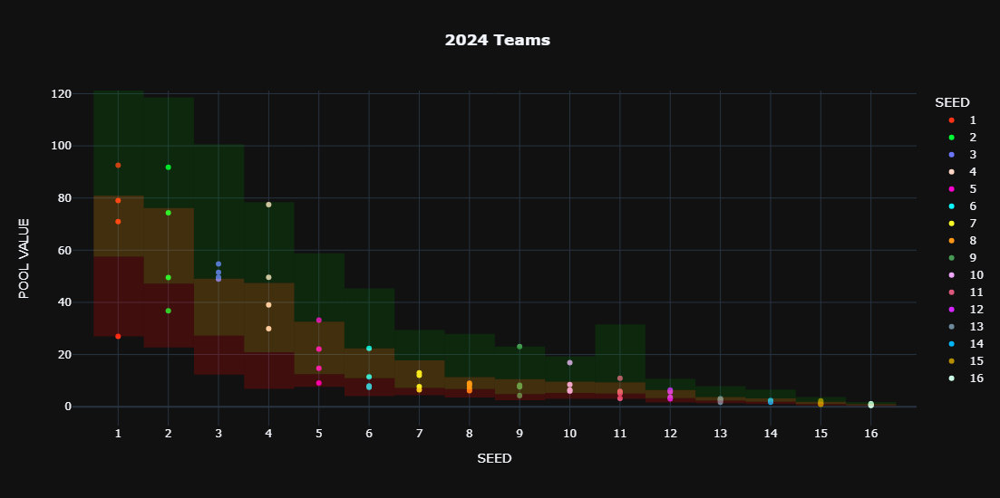

In [117]:
display_plots(stats, curr_stats, 'POOL VALUE', x0, x1, 'forward')     

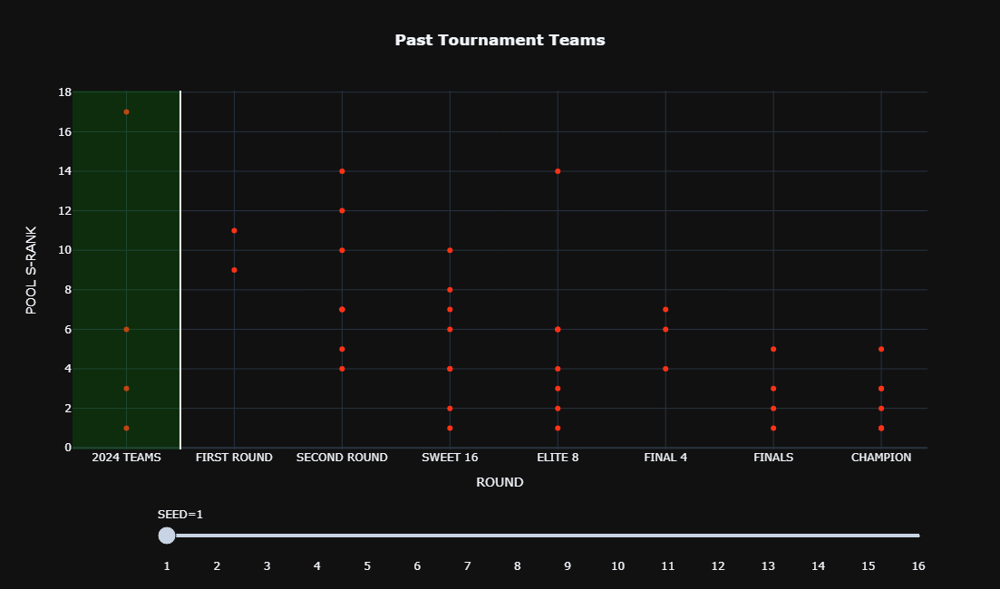

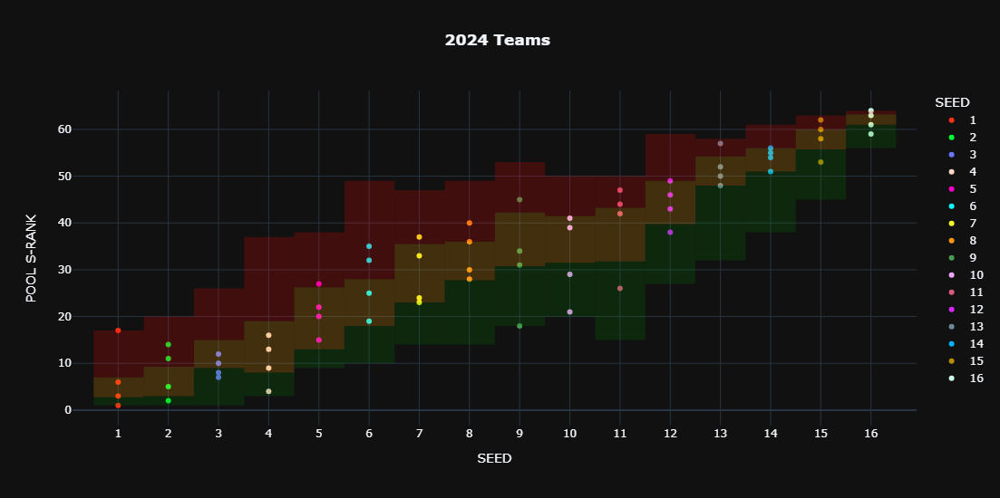

In [118]:
display_plots(stats, curr_stats, 'POOL S-RANK', x0, x1, 'backward')  

### Machine Learning Models

In [119]:
complete_diff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2036 entries, 0 to 2035
Columns: 818 entries, YEAR to OPP AN BADJ D RANK DIFF
dtypes: float64(810), object(8)
memory usage: 12.7+ MB


In [120]:
cd = complete_diff.copy() 
cd = cd.drop(['SCORE', 'OPP SCORE'], axis = 1) 
cd

,YEAR,BY YEAR NO,BY ROUND NO,TEAM NO,TEAM,SEED,ROUND,CURRENT ROUND,CONF,CONF ID,QUAD NO,QUAD ID,TEAM ID,BID TYPE,OUTCOME,K TEMPO,K TEMPO RANK,KADJ T,KADJ T RANK,K OFF,KO RANK,KADJ O,KADJ O RANK,K DEF,KD RANK,KADJ D,KADJ D RANK,KADJ EM,KADJ EM RANK,BADJ EM,BADJ O,BADJ D,BARTHAG,WIN%,EFG%,EFG%D,FTR,FTRD,TOV%,TOV%D,OREB%,DREB%,RAW T,2PT%,2PT%D,3PT%,3PT%D,BLK%,BLKED%,AST%,OP AST%,2PTR,3PTR,2PTRD,3PTRD,BADJ T,AVG HGT,EFF HGT,EXP,TALENT,FT%,OP FT%,PPPO,PPPD,ELITE SOS,WAB,BADJ EM RANK,BADJ O RANK,BADJ D RANK,BARTHAG RANK,EFG% RANK,EFGD% RANK,FTR RANK,FTRD RANK,TOV% RANK,TOV%D RANK,OREB% RANK,DREB% RANK,RAW T RANK,2PT% RANK,2PT%D RANK,3PT% RANK,3PT%D RANK,BLK% RANK,BLKED% RANK,AST% RANK,OP AST% RANK,2PTR RANK,3PTR RANK,2PTRD RANK,3PTRD RANK,BADJT RANK,AVG HGT RANK,EFF HGT RANK,EXP RANK,TALENT RANK,FT% RANK,OP FT% RANK,PPPO RANK,PPPD RANK,ELITE SOS RANK,H BADJ EM,H BADJ O,H BADJ D,H BARTHAG,H WIN%,H EFG%,H EFG%D,H FTR,H FTRD,H TOV%,H TOV%D,H OREB%,H DREB%,H RAW T,H 2PT%,H 2PT%D,H 3PT%,H 3PT%D,H BLK%,H BLKED%,H AST%,H OP AST%,H 2PTR,H 3PTR,H 2PTRD,H 3PTRD,H BADJ T,H FT%,H OP FT%,H PPPO,H PPPD,H ELITE SOS,H WAB,H BADJ EM RANK,H BADJ O RANK,H BADJ D RANK,H BARTHAG RANK,H EFG% RANK,H EFGD% RANK,H FTR RANK,H FTRD RANK,H TOV% RANK,H TOV%D RANK,H OREB% RANK,H DREB% RANK,H RAW T RANK,H 2PT% RANK,H 2PT%D RANK,H 3PT% RANK,H 3PT%D RANK,H BLK% RANK,H BLKED% RANK,H AST% RANK,H OP AST% RANK,H 2PTR RANK,H 3PTR RANK,H 2PTRD RANK,H 3PTRD RANK,H BADJT RANK,H FT% RANK,H OP FT% RANK,H PPPO RANK,H PPPD RANK,H ELITE SOS RANK,A BADJ EM,A BADJ O,A BADJ D,A BARTHAG,A WIN%,A EFG%,A EFG%D,A FTR,A FTRD,A TOV%,A TOV%D,A OREB%,A DREB%,A RAW T,A 2PT%,A 2PT%D,A 3PT%,A 3PT%D,A BLK%,A BLKED%,A AST%,A OP AST%,A 2PTR,A 3PTR,A 2PTRD,A 3PTRD,A BADJ T,A FT%,A OP FT%,A PPPO,A PPPD,A ELITE SOS,A WAB,A BADJ EM RANK,A BADJ O RANK,A BADJ D RANK,A BARTHAG RANK,A EFG% RANK,A EFGD% RANK,A FTR RANK,A FTRD RANK,A TOV% RANK,A TOV%D RANK,A OREB% RANK,A DREB% RANK,A RAW T RANK,A 2PT% RANK,A 2PT%D RANK,A 3PT% RANK,A 3PT%D RANK,A BLK% RANK,A BLKED% RANK,A AST% RANK,A OP AST% RANK,A 2PTR RANK,A 3PTR RANK,A 2PTRD RANK,A 3PTRD RANK,A BADJT RANK,A FT% RANK,A OP FT% RANK,A PPPO RANK,A PPPD RANK,A ELITE SOS RANK,N BADJ EM,N BADJ O,N BADJ D,N BARTHAG,N WIN%,N EFG%,N EFG%D,N FTR,N FTRD,N TOV%,N TOV%D,N OREB%,N DREB%,N RAW T,N 2PT%,N 2PT%D,N 3PT%,N 3PT%D,N BLK%,N BLKED%,N AST%,N OP AST%,N 2PTR,N 3PTR,N 2PTRD,N 3PTRD,N BADJ T,N FT%,N OP FT%,N PPPO,N PPPD,N ELITE SOS,N WAB,N BADJ EM RANK,N BADJ O RANK,N BADJ D RANK,N BARTHAG RANK,N EFG% RANK,N EFGD% RANK,N FTR RANK,N FTRD RANK,N TOV% RANK,N TOV%D RANK,N OREB% RANK,N DREB% RANK,N RAW T RANK,N 2PT% RANK,N 2PT%D RANK,N 3PT% RANK,N 3PT%D RANK,N BLK% RANK,N BLKED% RANK,N AST% RANK,N OP AST% RANK,N 2PTR RANK,N 3PTR RANK,N 2PTRD RANK,N 3PTRD RANK,N BADJT RANK,N FT% RANK,N OP FT% RANK,N PPPO RANK,N PPPD RANK,N ELITE SOS RANK,AN BADJ EM,AN BADJ O,AN BADJ D,AN BARTHAG,AN WIN%,AN EFG%,AN EFG%D,AN FTR,AN FTRD,AN TOV%,AN TOV%D,AN OREB%,AN DREB%,AN RAW T,AN 2PT%,AN 2PT%D,AN 3PT%,AN 3PT%D,AN BLK%,AN BLKED%,AN AST%,AN OP AST%,AN 2PTR,AN 3PTR,AN 2PTRD,AN 3PTRD,AN BADJ T,AN FT%,AN OP FT%,AN PPPO,AN PPPD,AN ELITE SOS,AN WAB,AN BADJ EM RANK,AN BADJ O RANK,AN BADJ D RANK,AN BARTHAG RANK,AN EFG% RANK,AN EFGD% RANK,AN FTR RANK,AN FTRD RANK,AN TOV% RANK,AN TOV%D RANK,AN OREB% RANK,AN DREB% RANK,AN RAW T RANK,AN 2PT% RANK,AN 2PT%D RANK,AN 3PT% RANK,AN 3PT%D RANK,AN BLK% RANK,AN BLKED% RANK,AN AST% RANK,AN OP AST% RANK,AN 2PTR RANK,AN 3PTR RANK,AN 2PTRD RANK,AN 3PTRD RANK,AN BADJT RANK,AN FT% RANK,AN OP FT% RANK,AN PPPO RANK,AN PPPD RANK,AN ELITE SOS RANK,POWER,PATH,DRAW,POOL VALUE,POOL S-RANK,NCAA S-RANK,VAL Z-SCORE,POWER-PATH,AP VOTES,AP RANK,DUNKS FG%,DUNKS SHARE,DUNKS FG%D,DUNKS D SHARE,CLOSE TWOS FG%,CLOSE TWOS SHARE,CLOSE TWOS FG%D,CLOSE TWOS D SHARE,FARTHER TWOS FG%,FARTHER TWOS SHARE,FARTHER TWOS FG%D,FARTHER TWOS D SHARE,DUNKS FG% RANK,DUNKS SHARE RANK,DUNKS FG%D RANK,DUNKS D SHARE RANK,CLOSE TWOS FG% RANK,CLOSE TWOS SHARE RANK,CLOSE TWOS FG%D RANK,CLOSE TWOS D SHAR

In [121]:
cd.isnull().sum().sum()

0

In [122]:
cd.describe()

,YEAR,BY YEAR NO,BY ROUND NO,TEAM NO,SEED,ROUND,CURRENT ROUND,CONF ID,QUAD NO,QUAD ID,TEAM ID,K TEMPO,K TEMPO RANK,KADJ T,KADJ T RANK,K OFF,KO RANK,KADJ O,KADJ O RANK,K DEF,KD RANK,KADJ D,KADJ D RANK,KADJ EM,KADJ EM RANK,BADJ EM,BADJ O,BADJ D,BARTHAG,WIN%,EFG%,EFG%D,FTR,FTRD,TOV%,TOV%D,OREB%,DREB%,RAW T,2PT%,2PT%D,3PT%,3PT%D,BLK%,BLKED%,AST%,OP AST%,2PTR,3PTR,2PTRD,3PTRD,BADJ T,AVG HGT,EFF HGT,EXP,TALENT,FT%,OP FT%,PPPO,PPPD,ELITE SOS,WAB,BADJ EM RANK,BADJ O RANK,BADJ D RANK,BARTHAG RANK,EFG% RANK,EFGD% RANK,FTR RANK,FTRD RANK,TOV% RANK,TOV%D RANK,OREB% RANK,DREB% RANK,RAW T RANK,2PT% RANK,2PT%D RANK,3PT% RANK,3PT%D RANK,BLK% RANK,BLKED% RANK,AST% RANK,OP AST% RANK,2PTR RANK,3PTR RANK,2PTRD RANK,3PTRD RANK,BADJT RANK,AVG HGT RANK,EFF HGT RANK,EXP RANK,TALENT RANK,FT% RANK,OP FT% RANK,PPPO RANK,PPPD RANK,ELITE SOS RANK,H BADJ EM,H BADJ O,H BADJ D,H BARTHAG,H WIN%,H EFG%,H EFG%D,H FTR,H FTRD,H TOV%,H TOV%D,H OREB%,H DREB%,H RAW T,H 2PT%,H 2PT%D,H 3PT%,H 3PT%D,H BLK%,H BLKED%,H AST%,H OP AST%,H 2PTR,H 3PTR,H 2PTRD,H 3PTRD,H BADJ T,H FT%,H OP FT%,H PPPO,H PPPD,H ELITE SOS,H WAB,H BADJ EM RANK,H BADJ O RANK,H BADJ D RANK,H BARTHAG RANK,H EFG% RANK,H EFGD% RANK,H FTR RANK,H FTRD RANK,H TOV% RANK,H TOV%D RANK,H OREB% RANK,H DREB% RANK,H RAW T RANK,H 2PT% RANK,H 2PT%D RANK,H 3PT% RANK,H 3PT%D RANK,H BLK% RANK,H BLKED% RANK,H AST% RANK,H OP AST% RANK,H 2PTR RANK,H 3PTR RANK,H 2PTRD RANK,H 3PTRD RANK,H BADJT RANK,H FT% RANK,H OP FT% RANK,H PPPO RANK,H PPPD RANK,H ELITE SOS RANK,A BADJ EM,A BADJ O,A BADJ D,A BARTHAG,A WIN%,A EFG%,A EFG%D,A FTR,A FTRD,A TOV%,A TOV%D,A OREB%,A DREB%,A RAW T,A 2PT%,A 2PT%D,A 3PT%,A 3PT%D,A BLK%,A BLKED%,A AST%,A OP AST%,A 2PTR,A 3PTR,A 2PTRD,A 3PTRD,A BADJ T,A FT%,A OP FT%,A PPPO,A PPPD,A ELITE SOS,A WAB,A BADJ EM RANK,A BADJ O RANK,A BADJ D RANK,A BARTHAG RANK,A EFG% RANK,A EFGD% RANK,A FTR RANK,A FTRD RANK,A TOV% RANK,A TOV%D RANK,A OREB% RANK,A DREB% RANK,A RAW T RANK,A 2PT% RANK,A 2PT%D RANK,A 3PT% RANK,A 3PT%D RANK,A BLK% RANK,A BLKED% RANK,A AST% RANK,A OP AST% RANK,A 2PTR RANK,A 3PTR RANK,A 2PTRD RANK,A 3PTRD RANK,A BADJT RANK,A FT% RANK,A OP FT% RANK,A PPPO RANK,A PPPD RANK,A ELITE SOS RANK,N BADJ EM,N BADJ O,N BADJ D,N BARTHAG,N WIN%,N EFG%,N EFG%D,N FTR,N FTRD,N TOV%,N TOV%D,N OREB%,N DREB%,N RAW T,N 2PT%,N 2PT%D,N 3PT%,N 3PT%D,N BLK%,N BLKED%,N AST%,N OP AST%,N 2PTR,N 3PTR,N 2PTRD,N 3PTRD,N BADJ T,N FT%,N OP FT%,N PPPO,N PPPD,N ELITE SOS,N WAB,N BADJ EM RANK,N BADJ O RANK,N BADJ D RANK,N BARTHAG RANK,N EFG% RANK,N EFGD% RANK,N FTR RANK,N FTRD RANK,N TOV% RANK,N TOV%D RANK,N OREB% RANK,N DREB% RANK,N RAW T RANK,N 2PT% RANK,N 2PT%D RANK,N 3PT% RANK,N 3PT%D RANK,N BLK% RANK,N BLKED% RANK,N AST% RANK,N OP AST% RANK,N 2PTR RANK,N 3PTR RANK,N 2PTRD RANK,N 3PTRD RANK,N BADJT RANK,N FT% RANK,N OP FT% RANK,N PPPO RANK,N PPPD RANK,N ELITE SOS RANK,AN BADJ EM,AN BADJ O,AN BADJ D,AN BARTHAG,AN WIN%,AN EFG%,AN EFG%D,AN FTR,AN FTRD,AN TOV%,AN TOV%D,AN OREB%,AN DREB%,AN RAW T,AN 2PT%,AN 2PT%D,AN 3PT%,AN 3PT%D,AN BLK%,AN BLKED%,AN AST%,AN OP AST%,AN 2PTR,AN 3PTR,AN 2PTRD,AN 3PTRD,AN BADJ T,AN FT%,AN OP FT%,AN PPPO,AN PPPD,AN ELITE SOS,AN WAB,AN BADJ EM RANK,AN BADJ O RANK,AN BADJ D RANK,AN BARTHAG RANK,AN EFG% RANK,AN EFGD% RANK,AN FTR RANK,AN FTRD RANK,AN TOV% RANK,AN TOV%D RANK,AN OREB% RANK,AN DREB% RANK,AN RAW T RANK,AN 2PT% RANK,AN 2PT%D RANK,AN 3PT% RANK,AN 3PT%D RANK,AN BLK% RANK,AN BLKED% RANK,AN AST% RANK,AN OP AST% RANK,AN 2PTR RANK,AN 3PTR RANK,AN 2PTRD RANK,AN 3PTRD RANK,AN BADJT RANK,AN FT% RANK,AN OP FT% RANK,AN PPPO RANK,AN PPPD RANK,AN ELITE SOS RANK,POWER,PATH,DRAW,POOL VALUE,POOL S-RANK,NCAA S-RANK,VAL Z-SCORE,POWER-PATH,AP VOTES,AP RANK,DUNKS FG%,DUNKS SHARE,DUNKS FG%D,DUNKS D SHARE,CLOSE TWOS FG%,CLOSE TWOS SHARE,CLOSE TWOS FG%D,CLOSE TWOS D SHARE,FARTHER TWOS FG%,FARTHER TWOS SHARE,FARTHER TWOS FG%D,FARTHER TWOS D SHARE,DUNKS FG% RANK,DUNKS SHARE RANK,DUNKS FG%D RANK,DUNKS D SHARE RANK,CLOSE TWOS FG% RANK,CLOSE TWOS SHARE RANK,CLOSE TWOS FG%D RANK,CLOSE TWOS D SHARE RANK,FARTHER TWOS FG% RAN

In [123]:
selected_cols = cd.columns[~cd.columns.isin(cd.iloc[:, cd.columns.get_loc('OPP YEAR') : cd.columns.get_loc('OPP OUTCOME') + 1])] 
features = cd[selected_cols] 
features = features.dropna() 
features = features.iloc[:, cd.columns.get_loc('K TEMPO') :] 
predictors = features.columns 
features.head() 

,K TEMPO,K TEMPO RANK,KADJ T,KADJ T RANK,K OFF,KO RANK,KADJ O,KADJ O RANK,K DEF,KD RANK,KADJ D,KADJ D RANK,KADJ EM,KADJ EM RANK,BADJ EM,BADJ O,BADJ D,BARTHAG,WIN%,EFG%,EFG%D,FTR,FTRD,TOV%,TOV%D,OREB%,DREB%,RAW T,2PT%,2PT%D,3PT%,3PT%D,BLK%,BLKED%,AST%,OP AST%,2PTR,3PTR,2PTRD,3PTRD,BADJ T,AVG HGT,EFF HGT,EXP,TALENT,FT%,OP FT%,PPPO,PPPD,ELITE SOS,WAB,BADJ EM RANK,BADJ O RANK,BADJ D RANK,BARTHAG RANK,EFG% RANK,EFGD% RANK,FTR RANK,FTRD RANK,TOV% RANK,TOV%D RANK,OREB% RANK,DREB% RANK,RAW T RANK,2PT% RANK,2PT%D RANK,3PT% RANK,3PT%D RANK,BLK% RANK,BLKED% RANK,AST% RANK,OP AST% RANK,2PTR RANK,3PTR RANK,2PTRD RANK,3PTRD RANK,BADJT RANK,AVG HGT RANK,EFF HGT RANK,EXP RANK,TALENT RANK,FT% RANK,OP FT% RANK,PPPO RANK,PPPD RANK,ELITE SOS RANK,H BADJ EM,H BADJ O,H BADJ D,H BARTHAG,H WIN%,H EFG%,H EFG%D,H FTR,H FTRD,H TOV%,H TOV%D,H OREB%,H DREB%,H RAW T,H 2PT%,H 2PT%D,H 3PT%,H 3PT%D,H BLK%,H BLKED%,H AST%,H OP AST%,H 2PTR,H 3PTR,H 2PTRD,H 3PTRD,H BADJ T,H FT%,H OP FT%,H PPPO,H PPPD,H ELITE SOS,H WAB,H BADJ EM RANK,H BADJ O RANK,H BADJ D RANK,H BARTHAG RANK,H EFG% RANK,H EFGD% RANK,H FTR RANK,H FTRD RANK,H TOV% RANK,H TOV%D RANK,H OREB% RANK,H DREB% RANK,H RAW T RANK,H 2PT% RANK,H 2PT%D RANK,H 3PT% RANK,H 3PT%D RANK,H BLK% RANK,H BLKED% RANK,H AST% RANK,H OP AST% RANK,H 2PTR RANK,H 3PTR RANK,H 2PTRD RANK,H 3PTRD RANK,H BADJT RANK,H FT% RANK,H OP FT% RANK,H PPPO RANK,H PPPD RANK,H ELITE SOS RANK,A BADJ EM,A BADJ O,A BADJ D,A BARTHAG,A WIN%,A EFG%,A EFG%D,A FTR,A FTRD,A TOV%,A TOV%D,A OREB%,A DREB%,A RAW T,A 2PT%,A 2PT%D,A 3PT%,A 3PT%D,A BLK%,A BLKED%,A AST%,A OP AST%,A 2PTR,A 3PTR,A 2PTRD,A 3PTRD,A BADJ T,A FT%,A OP FT%,A PPPO,A PPPD,A ELITE SOS,A WAB,A BADJ EM RANK,A BADJ O RANK,A BADJ D RANK,A BARTHAG RANK,A EFG% RANK,A EFGD% RANK,A FTR RANK,A FTRD RANK,A TOV% RANK,A TOV%D RANK,A OREB% RANK,A DREB% RANK,A RAW T RANK,A 2PT% RANK,A 2PT%D RANK,A 3PT% RANK,A 3PT%D RANK,A BLK% RANK,A BLKED% RANK,A AST% RANK,A OP AST% RANK,A 2PTR RANK,A 3PTR RANK,A 2PTRD RANK,A 3PTRD RANK,A BADJT RANK,A FT% RANK,A OP FT% RANK,A PPPO RANK,A PPPD RANK,A ELITE SOS RANK,N BADJ EM,N BADJ O,N BADJ D,N BARTHAG,N WIN%,N EFG%,N EFG%D,N FTR,N FTRD,N TOV%,N TOV%D,N OREB%,N DREB%,N RAW T,N 2PT%,N 2PT%D,N 3PT%,N 3PT%D,N BLK%,N BLKED%,N AST%,N OP AST%,N 2PTR,N 3PTR,N 2PTRD,N 3PTRD,N BADJ T,N FT%,N OP FT%,N PPPO,N PPPD,N ELITE SOS,N WAB,N BADJ EM RANK,N BADJ O RANK,N BADJ D RANK,N BARTHAG RANK,N EFG% RANK,N EFGD% RANK,N FTR RANK,N FTRD RANK,N TOV% RANK,N TOV%D RANK,N OREB% RANK,N DREB% RANK,N RAW T RANK,N 2PT% RANK,N 2PT%D RANK,N 3PT% RANK,N 3PT%D RANK,N BLK% RANK,N BLKED% RANK,N AST% RANK,N OP AST% RANK,N 2PTR RANK,N 3PTR RANK,N 2PTRD RANK,N 3PTRD RANK,N BADJT RANK,N FT% RANK,N OP FT% RANK,N PPPO RANK,N PPPD RANK,N ELITE SOS RANK,AN BADJ EM,AN BADJ O,AN BADJ D,AN BARTHAG,AN WIN%,AN EFG%,AN EFG%D,AN FTR,AN FTRD,AN TOV%,AN TOV%D,AN OREB%,AN DREB%,AN RAW T,AN 2PT%,AN 2PT%D,AN 3PT%,AN 3PT%D,AN BLK%,AN BLKED%,AN AST%,AN OP AST%,AN 2PTR,AN 3PTR,AN 2PTRD,AN 3PTRD,AN BADJ T,AN FT%,AN OP FT%,AN PPPO,AN PPPD,AN ELITE SOS,AN WAB,AN BADJ EM RANK,AN BADJ O RANK,AN BADJ D RANK,AN BARTHAG RANK,AN EFG% RANK,AN EFGD% RANK,AN FTR RANK,AN FTRD RANK,AN TOV% RANK,AN TOV%D RANK,AN OREB% RANK,AN DREB% RANK,AN RAW T RANK,AN 2PT% RANK,AN 2PT%D RANK,AN 3PT% RANK,AN 3PT%D RANK,AN BLK% RANK,AN BLKED% RANK,AN AST% RANK,AN OP AST% RANK,AN 2PTR RANK,AN 3PTR RANK,AN 2PTRD RANK,AN 3PTRD RANK,AN BADJT RANK,AN FT% RANK,AN OP FT% RANK,AN PPPO RANK,AN PPPD RANK,AN ELITE SOS RANK,POWER,PATH,DRAW,POOL VALUE,POOL S-RANK,NCAA S-RANK,VAL Z-SCORE,POWER-PATH,AP VOTES,AP RANK,DUNKS FG%,DUNKS SHARE,DUNKS FG%D,DUNKS D SHARE,CLOSE TWOS FG%,CLOSE TWOS SHARE,CLOSE TWOS FG%D,CLOSE TWOS D SHARE,FARTHER TWOS FG%,FARTHER TWOS SHARE,FARTHER TWOS FG%D,FARTHER TWOS D SHARE,DUNKS FG% RANK,DUNKS SHARE RANK,DUNKS FG%D RANK,DUNKS D SHARE RANK,CLOSE TWOS FG% RANK,CLOSE TWOS SHARE RANK,CLOSE TWOS FG%D RANK,CLOSE TWOS D SHARE RANK,FARTHER TWOS FG% RANK,FARTHER TWOS SHARE RANK,FARTHER TWOS FG%D RANK,FARTHER TWOS D SHARE RANK,NET RPI,RESUME,WAB

In [124]:
# Initial split into training+validation and test sets
train_val = cd.loc[cd['YEAR'] <= 2022]
test = cd.loc[cd['YEAR'] == 2023]

# Split train_val into train and validation sets
train, val = train_test_split(train_val, test_size=0.2, random_state=42)

# Set target variables
y_train = train['OUTCOME'].astype(int)
y_val = val['OUTCOME'].astype(int)
y_test = test['OUTCOME'].astype(int)

# Filter numeric columns and apply correlation-based feature selection
numeric_cols = train.select_dtypes(include=[float, int]).columns
corr_numeric = train.loc[train['CURRENT ROUND'] == 64, numeric_cols]

# Compute correlation matrix
cor = corr_numeric.corr()
threshold = 0.45  # Define correlation threshold
selected_predictors = cor['ROUND'].abs()[cor['ROUND'].abs() > threshold].index.drop(['ROUND'], errors='ignore')

# Debugging
#print("Selected Predictors:\n", selected_predictors)
# Display all selected predictors
pd.options.display.max_rows = None  # Set the display option to show all rows
print("Selected Predictors:\n\t", selected_predictors.tolist())  # Convert to list for clean display

Selected Predictors:
	 ['SEED', 'KADJ O', 'KADJ O RANK', 'KADJ D', 'KADJ D RANK', 'KADJ EM', 'KADJ EM RANK', 'BADJ EM', 'BADJ O', 'BADJ D', 'BARTHAG', 'TALENT', 'ELITE SOS', 'WAB', 'BADJ EM RANK', 'BADJ O RANK', 'BADJ D RANK', 'BARTHAG RANK', 'TALENT RANK', 'ELITE SOS RANK', 'H BADJ EM', 'H BADJ O', 'H BADJ D', 'H BARTHAG', 'H ELITE SOS', 'H WAB', 'H BADJ EM RANK', 'H BADJ O RANK', 'H BADJ D RANK', 'H BARTHAG RANK', 'H ELITE SOS RANK', 'A BADJ EM', 'A BADJ O', 'A BARTHAG', 'A ELITE SOS', 'A WAB', 'A BADJ EM RANK', 'A BADJ O RANK', 'A BARTHAG RANK', 'A ELITE SOS RANK', 'N BADJ EM', 'N BARTHAG', 'N ELITE SOS', 'N BADJ EM RANK', 'N BARTHAG RANK', 'N ELITE SOS RANK', 'AN BADJ EM', 'AN BADJ O', 'AN BADJ D', 'AN BARTHAG', 'AN ELITE SOS', 'AN WAB', 'AN BADJ EM RANK', 'AN BADJ O RANK', 'AN BADJ D RANK', 'AN BARTHAG RANK', 'AN ELITE SOS RANK', 'POWER', 'PATH', 'POOL VALUE', 'POOL S-RANK', 'NCAA S-RANK', 'POWER-PATH', 'NET RPI', 'RESUME', 'WAB RANK', 'ELO', 'B POWER', 'Q1 W', 'Q2 W', 'Q1 PLUS Q2

In [125]:
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, roc_auc_score
import pandas as pd
import numpy as np

### Option1: First set of features & Target

In [126]:
# Use only selected predictors for training
selected_features = ['SEED', 'KADJ O', 'KADJ D', 'KADJ EM', 'BADJ EM']  # features selected from Selected Predictors
X_train = train[selected_features]
X_val = val[selected_features]
X_test = test[selected_features]

# Scale features
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Target variable
y_train = train['OUTCOME'].astype(int)
y_val = val['OUTCOME'].astype(int)
y_test = test['OUTCOME'].astype(int)

In [127]:
# Define models and hyperparameter grids
models = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
}

param_grids = {
    "Logistic Regression": {
        "C": np.logspace(-4, 4, 10),
        "penalty": ["l1", "l2"],
        "solver": ["saga"]
    },
    "Random Forest": {
        "n_estimators": [50, 100, 150],
        "max_depth": [None, 10, 20],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "XGBoost": {
        "n_estimators": [50, 100, 150],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 7],
        "colsample_bytree": [0.3, 0.7, 1.0],
        "gamma": [0, 1, 5]
    }
}

# Initialize results storage
results = []

In [128]:
# Train each model
for model_name, model in models.items():
    print(f"Training {model_name}...")
    
    # Perform randomized search
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grids[model_name],
        n_iter=20,  # Adjust for more thorough search
        scoring='roc_auc',
        cv=3,  # 3-fold cross-validation
        verbose=1,
        random_state=42,
        n_jobs=-1
    )
    random_search.fit(X_train_scaled, y_train)
    
    # Best parameters
    best_model = random_search.best_estimator_
    print(f"Best parameters for {model_name}: {random_search.best_params_}")
    
    # Evaluate on validation set
    y_val_pred = best_model.predict(X_val_scaled)
    y_val_proba = best_model.predict_proba(X_val_scaled)[:, 1]
    accuracy = accuracy_score(y_val, y_val_pred)
    auc = roc_auc_score(y_val, y_val_proba)
    
    print(f"{model_name} Validation Accuracy: {accuracy:.4f}")
    print(f"{model_name} Validation AUC: {auc:.4f}")
    
    # Save results
    results.append({
        "Model": model_name,
        "Best Parameters": random_search.best_params_,
        "Validation Accuracy": accuracy,
        "Validation AUC": auc
    })

# Compare models
results_df = pd.DataFrame(results)
print("\nModel Comparison:")
print(results_df)

Training Logistic Regression...
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters for Logistic Regression: {'solver': 'saga', 'penalty': 'l1', 'C': 21.54434690031882}
Logistic Regression Validation Accuracy: 0.6969
Logistic Regression Validation AUC: 0.7852
Training Random Forest...
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters for Random Forest: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 10}
Random Forest Validation Accuracy: 0.6997
Random Forest Validation AUC: 0.7688
Training XGBoost...
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters for XGBoost: {'n_estimators': 50, 'max_depth': 5, 'learning_rate': 0.1, 'gamma': 5, 'colsample_bytree': 0.3}
XGBoost Validation Accuracy: 0.6941
XGBoost Validation AUC: 0.7746

Model Comparison:
                 Model                                    Best Parameters  \
0  Logistic Regression  {'solver': 'saga', 'penalty': 'l1',

In [129]:
# Test the best model
best_model_row = results_df.loc[results_df["Validation AUC"].idxmax()]
best_model_name = best_model_row["Model"]
print(f"\nBest Model: {best_model_name}")

best_model = models[best_model_name]
best_model.set_params(**best_model_row["Best Parameters"])
best_model.fit(X_train_scaled, y_train)

y_test_pred = best_model.predict(X_test_scaled)
y_test_proba = best_model.predict_proba(X_test_scaled)[:, 1]
test_accuracy = accuracy_score(y_test, y_test_pred)
test_auc = roc_auc_score(y_test, y_test_proba)

print(f"{best_model_name} Test Accuracy: {test_accuracy:.4f}")
print(f"{best_model_name} Test AUC: {test_auc:.4f}")


Best Model: Logistic Regression
Logistic Regression Test Accuracy: 0.7143
Logistic Regression Test AUC: 0.7533


Logistic Regression Test Accuracy: 0.7143
Logistic Regression Test AUC: 0.7533
Confusion Matrix:
[[45 18]
 [18 45]]
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.71      0.71        63
           1       0.71      0.71      0.71        63

    accuracy                           0.71       126
   macro avg       0.71      0.71      0.71       126
weighted avg       0.71      0.71      0.71       126



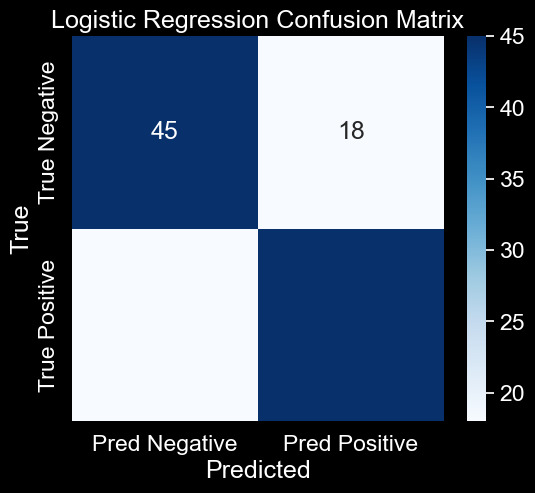

In [130]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# After getting the best model and making predictions on the test set
y_test_pred = best_model.predict(X_test_scaled)
y_test_proba = best_model.predict_proba(X_test_scaled)[:, 1]

# Test Accuracy and AUC
test_accuracy = accuracy_score(y_test, y_test_pred)
test_auc = roc_auc_score(y_test, y_test_proba)

print(f"{best_model_name} Test Accuracy: {test_accuracy:.4f}")
print(f"{best_model_name} Test AUC: {test_auc:.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_test_pred)
print("Confusion Matrix:")
print(cm)

# Classification Report
report = classification_report(y_test, y_test_pred)
print("Classification Report:")
print(report)

# Plot Confusion Matrix as a heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Pred Negative', 'Pred Positive'], yticklabels=['True Negative', 'True Positive'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'{best_model_name} Confusion Matrix')
plt.show()

### Option2: 2nd set of features & Target

In [131]:
# 2nd set of features and target
selected_features = ['KADJ O', 'KADJ D', 'OPP NET RPI', 'OPP Q1 W', 'OPP Q2 W']  # New features
target_variable = 'SEED'  # New target variable

# Use only selected predictors for training
X_train = train[selected_features]
X_val = val[selected_features]
X_test = test[selected_features]

# Scale features
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Target variable (using the new target)
y_train = train[target_variable].astype(int)-1
y_val = val[target_variable].astype(int)-1
y_test = test[target_variable].astype(int)-1

In [132]:
# Define models and hyperparameter grids
models = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
}

param_grids = {
    "Logistic Regression": {
        "C": np.logspace(-4, 4, 10),
        "penalty": ["l1", "l2"],
        "solver": ["saga"]
    },
    "Random Forest": {
        "n_estimators": [50, 100, 150],
        "max_depth": [None, 10, 20],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "XGBoost": {
        "n_estimators": [50, 100, 150],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 7],
        "colsample_bytree": [0.3, 0.7, 1.0],
        "gamma": [0, 1, 5]
    }
}

# Initialize results storage
results = []

In [133]:
# Train each model
for model_name, model in models.items():
    print(f"Training {model_name}...")
    
    # Perform randomized search
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grids[model_name],
        n_iter=20,  # Adjust for more thorough search
        scoring='roc_auc',
        cv=3,  # 3-fold cross-validation
        verbose=1,
        random_state=42,
        n_jobs=-1
    )
    random_search.fit(X_train_scaled, y_train)
    
    # Best parameters
    best_model = random_search.best_estimator_
    print(f"Best parameters for {model_name}: {random_search.best_params_}")
    
    # Evaluate on validation set
    y_val_pred = best_model.predict(X_val_scaled)
    y_val_proba = best_model.predict_proba(X_val_scaled)  # Get probabilities for each class

    accuracy = accuracy_score(y_val, y_val_pred)
    
    # For multi-class, use 'ovr' for one-vs-rest or 'ovo' for one-vs-one
    auc = roc_auc_score(y_val, y_val_proba, multi_class='ovr', average='macro')

    print(f"{model_name} Validation Accuracy: {accuracy:.4f}")
    print(f"{model_name} Validation AUC: {auc:.4f}")

    # Save results
    results.append({
        "Model": model_name,
        "Best Parameters": random_search.best_params_,
        "Validation Accuracy": accuracy,
        "Validation AUC": auc
    })

# Compare models
results_df = pd.DataFrame(results)
print("\nModel Comparison:")
print(results_df)

Training Logistic Regression...
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters for Logistic Regression: {'solver': 'saga', 'penalty': 'l1', 'C': 0.0001}
Logistic Regression Validation Accuracy: 0.1190
Logistic Regression Validation AUC: 0.5000
Training Random Forest...
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters for Random Forest: {'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 10}
Random Forest Validation Accuracy: 0.2776
Random Forest Validation AUC: 0.8146
Training XGBoost...
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters for XGBoost: {'n_estimators': 50, 'max_depth': 7, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 0.3}
XGBoost Validation Accuracy: 0.1870
XGBoost Validation AUC: 0.7679

Model Comparison:
                 Model                                    Best Parameters  \
0  Logistic Regression   {'solver': 'saga', 'penalty': 'l1', 'C': 0.000

In [134]:
# Test the best model
best_model_row = results_df.loc[results_df["Validation AUC"].idxmax()]
best_model_name = best_model_row["Model"]
print(f"\nBest Model: {best_model_name}")

best_model = models[best_model_name]
best_model.set_params(**best_model_row["Best Parameters"])
best_model.fit(X_train_scaled, y_train)

# Predict on the test set
y_test_pred = best_model.predict(X_test_scaled)
y_test_proba = best_model.predict_proba(X_test_scaled)

# Test Accuracy and AUC
test_accuracy = accuracy_score(y_test, y_test_pred)
test_auc = roc_auc_score(y_test, y_test_proba, multi_class='ovr', average='macro')

print(f"{best_model_name} Test Accuracy: {test_accuracy:.4f}")
print(f"{best_model_name} Test AUC: {test_auc:.4f}")


Best Model: Random Forest
Random Forest Test Accuracy: 0.2857
Random Forest Test AUC: 0.8336


Random Forest Test Accuracy: 0.2857
Random Forest Test AUC: 0.8336
Confusion Matrix:
[[6 2 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [2 5 2 0 0 0 0 1 0 0 0 0 0 0 0 0]
 [1 4 4 1 0 0 1 1 0 0 1 0 0 0 0 0]
 [5 1 3 1 0 2 0 0 0 0 0 0 0 0 0 0]
 [2 1 2 2 1 1 1 1 0 1 1 2 0 0 0 0]
 [0 3 3 1 0 0 0 1 0 1 0 0 0 0 0 0]
 [0 0 1 1 0 3 1 0 0 0 0 2 0 0 0 0]
 [0 0 1 1 1 0 1 1 1 1 0 0 0 0 0 0]
 [2 0 0 0 1 2 1 1 0 0 2 0 0 0 0 0]
 [2 0 0 0 0 0 0 0 0 0 2 0 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 5 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0 3 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 2 2 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 3 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 4 2 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 5]]
Classification Report:
              precision    recall  f1-score   support

           0       0.30      0.67      0.41         9
           1       0.31      0.50      0.38        10
           2       0.24      0.31      0.27        13
           3       0.14      0.08      0.11        12
           4       0.33      0.07      0.11        15
      

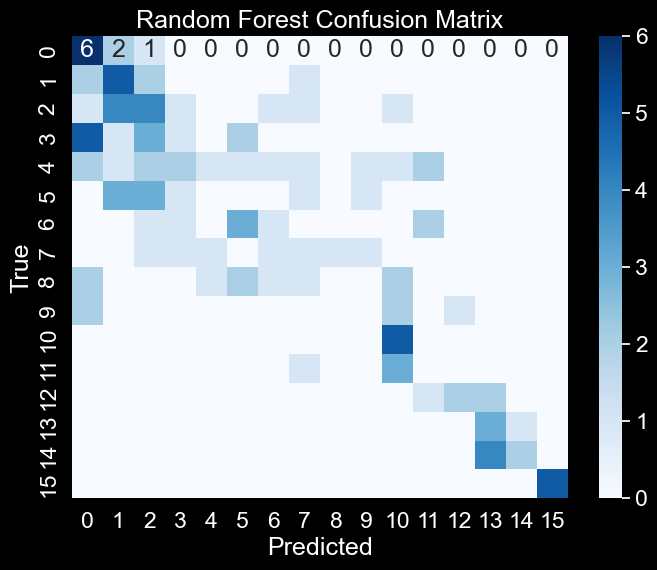

In [135]:
# After getting the best model and making predictions on the test set
y_test_pred = best_model.predict(X_test_scaled)

# For multi-class classification, get probabilities for all classes
y_test_proba = best_model.predict_proba(X_test_scaled)

# Ensure the probabilities are valid for AUC calculation
if y_test_proba.shape[1] == 1:
    # In case we only have probabilities for a binary class, reshape for multi-class
    y_test_proba = np.hstack([1 - y_test_proba, y_test_proba])

# Test Accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# For multi-class, calculate AUC with multi_class='ovr' (One-vs-Rest)
test_auc = roc_auc_score(y_test, y_test_proba, multi_class='ovr', average='macro')

print(f"{best_model_name} Test Accuracy: {test_accuracy:.4f}")
print(f"{best_model_name} Test AUC: {test_auc:.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_test_pred)
print("Confusion Matrix:")
print(cm)

# Classification Report
report = classification_report(y_test, y_test_pred)
print("Classification Report:")
print(report)

# Plot Confusion Matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", 
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'{best_model_name} Confusion Matrix')
plt.show()

### Option3: 3rd set of features & Target

In [136]:
# Use only selected predictors for training
selected_features = ['SEED', 'KADJ O', 'BADJ EM', 'BARTHAG', 'WAB', 'NET RPI']  # updated list of selected features
X_train = train[selected_features]
X_val = val[selected_features]
X_test = test[selected_features]

# Scale features
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Target variable
y_train = train['OUTCOME'].astype(int)
y_val = val['OUTCOME'].astype(int)
y_test = test['OUTCOME'].astype(int)

In [137]:
# Create the model
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

# Step 2: Hyperparameter tuning using RandomizedSearchCV
# Hyperparameter grid
param_dist = {
    'n_estimators': [100, 200, 300, 400],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 9],
    'min_child_weight': [1, 2, 3, 4],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2],
    'reg_alpha': [0, 0.01, 0.1],
    'reg_lambda': [0.01, 0.1, 1]
}

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(xgb, param_distributions=param_dist, n_iter=10, cv=3, scoring='accuracy', verbose=2, random_state=42)

# Fit the model on the training data
random_search.fit(X_train_scaled, y_train)

# Step 3: Best Model Parameters
best_model = random_search.best_estimator_
print("Best Parameters: ", random_search.best_params_)

# Step 4: Model Evaluation

# Predict on the validation set
y_val_pred = best_model.predict(X_val_scaled)

# Accuracy
accuracy = accuracy_score(y_val, y_val_pred)
print(f"Accuracy: {accuracy:.4f}")

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END colsample_bytree=0.7, gamma=0.1, learning_rate=0.1, max_depth=9, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=0.1, learning_rate=0.1, max_depth=9, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=0.1, learning_rate=0.1, max_depth=9, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=0, learning_rate=0.0

Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.68      0.72       198
           1       0.64      0.72      0.68       155

    accuracy                           0.70       353
   macro avg       0.70      0.70      0.70       353
weighted avg       0.71      0.70      0.70       353

ROC-AUC: 0.7816


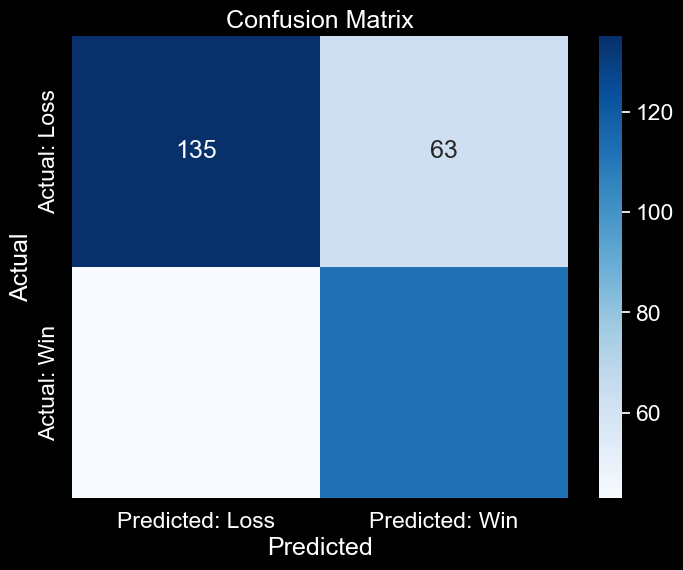

In [138]:
# Classification Report (Precision, Recall, F1-Score, and AUC)
print("Classification Report:\n", classification_report(y_val, y_val_pred))

# ROC-AUC
y_val_prob = best_model.predict_proba(X_val_scaled)[:, 1]
roc_auc = roc_auc_score(y_val, y_val_prob)
print(f"ROC-AUC: {roc_auc:.4f}")

# Step 5: Confusion Matrix
conf_matrix = confusion_matrix(y_val, y_val_pred)

# Plotting the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Predicted: Loss', 'Predicted: Win'], yticklabels=['Actual: Loss', 'Actual: Win'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [139]:
# Predict on the test set for final evaluation
y_test_pred = best_model.predict(X_test_scaled)
y_test_prob = best_model.predict_proba(X_test_scaled)[:, 1]
test_accuracy = accuracy_score(y_test, y_test_pred)
test_roc_auc = roc_auc_score(y_test, y_test_prob)

# Display Test Results
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test ROC-AUC: {test_roc_auc:.4f}")

Test Accuracy: 0.6905
Test ROC-AUC: 0.7453


### Option4: New Features & Target

In [140]:
# Select features and new target
selected_features = ['SEED', 'KADJ EM', 'BARTHAG', 'ELITE SOS', 'H BADJ EM']  # selected feature set
target_variable = 'POOL VALUE'

# Split the dataset into train, validation, and test sets
train, temp = train_test_split(cd, test_size=0.3, random_state=42)
val, test = train_test_split(temp, test_size=0.5, random_state=42)

# Prepare features and target
X_train = train[selected_features]
X_val = val[selected_features]
X_test = test[selected_features]

# Scale features
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Convert target to categorical for classification
y_train = pd.qcut(train[target_variable], q=3, labels=[0, 1, 2])  # Categorize into 3 classes
y_val = pd.qcut(val[target_variable], q=3, labels=[0, 1, 2])
y_test = pd.qcut(test[target_variable], q=3, labels=[0, 1, 2])

In [141]:
# Model training with hyperparameter tuning (example: Random Forest)
from sklearn.model_selection import GridSearchCV

rf = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, verbose=2, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)

# Best model selection
best_model = grid_search.best_estimator_

# Predict on validation set
y_val_pred = best_model.predict(X_val_scaled)

Fitting 3 folds for each of 162 candidates, totalling 486 fits
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=300; tota

Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.88      0.75       102
           1       0.32      0.10      0.16       107
           2       0.59      0.81      0.68        96

    accuracy                           0.59       305
   macro avg       0.52      0.60      0.53       305
weighted avg       0.52      0.59      0.52       305



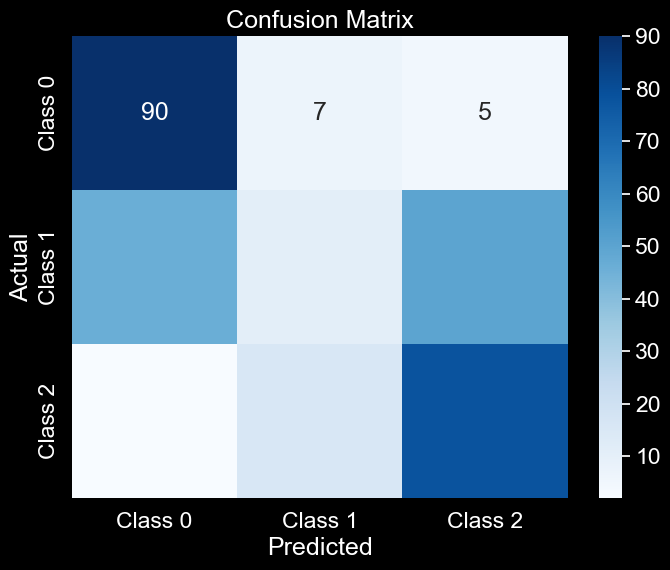

In [142]:
# Classification Report
print("Classification Report:")
print(classification_report(y_val, y_val_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_val, y_val_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Class 0', 'Class 1', 'Class 2'], 
            yticklabels=['Class 0', 'Class 1', 'Class 2'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()